#Sierra Club & Wake Forest University School of Business Air Quality Analysis Project

**Authors**: Guangxin Bao, Chioke Bellamy, Manling Shi, Kaitlyn Vickers

**Data Source**: https://www2.purpleair.com/

**Last Updated**: April 30, 2024

#Load Libraries and Data

In [3]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

import scipy as sp
from scipy import stats
from scipy.signal import detrend
from scipy.stats import ttest_ind, ttest_1samp, f_oneway

import pytz # library for changing to EST


In [4]:
#connecting to Google Drive to Access Data Files (not necessary step, can upload data directly as well)
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
#load data files
#Sensor: Ledyard; West Hartford
df_w1 = pd.read_csv('/content/drive/Shareddrives/Sierra Club & WFU MSBA/Sierra Club/To Deliver to Sierra Club/Data/Purple Air Data/109684 2022-11-01 2024-04-30 60-Minute Average.csv')
#Sensor: Kingwood Oxford School; West Hartford
df_w2 = pd.read_csv('/content/drive/Shareddrives/Sierra Club & WFU MSBA/Sierra Club/To Deliver to Sierra Club/Data/Purple Air Data/142606 2022-11-01 2024-04-30 60-Minute Average.csv')

#Sensor: BiCi Co. Park; Hartford
df_h1 = pd.read_csv('/content/drive/Shareddrives/Sierra Club & WFU MSBA/Sierra Club/To Deliver to Sierra Club/Data/Purple Air Data/178869 2022-11-01 2024-04-30 60-Minute Average.csv')

#Sensor: Hartford City Mission; Hartford
df_h2 = pd.read_csv('/content/drive/Shareddrives/Sierra Club & WFU MSBA/Sierra Club/To Deliver to Sierra Club/Data/Purple Air Data/51011 2022-11-01 2024-04-30 60-Minute Average.csv')

In [8]:
#check first few rows and last few rows of each data frame:
print("First few rows: Ledyard")
print(df_w1.head(5)) # can replace 5 with any # in the parenthesis to see first # rows; 5 is default

print("Last few rows: Ledyard")
print(df_w1.tail()) # similarly, can put any # in parenthesis to see last # rows; 5 is default

print("First few rows: Kingswood Oxford School")
print(df_w2.head())

print("Last few rows: Kingswood Oxford School")
print(df_w2.tail())

print("First few rows: BiCi Co Park")
print(df_h1.head())

print("Last few rows: BiCi Co Park")
print(df_h1.tail())

print("First few rows: Hartford City Mission")
print(df_h2.head())

print("Last few rows: Hartford City Mission")
print(df_h2.tail())

First few rows: Ledyard
             time_stamp  humidity  temperature  pm2.5_alt
0  2022-11-01T00:00:00Z      67.0         71.0        5.3
1  2022-11-01T01:00:00Z      67.0         71.0        6.1
2  2022-11-01T02:00:00Z      67.0         71.0        6.7
3  2022-11-01T03:00:00Z      67.0         71.0        6.2
4  2022-11-01T04:00:00Z      67.0         71.0        5.8
Last few rows: Ledyard
                 time_stamp  humidity  temperature  pm2.5_alt
13072  2024-04-29T19:00:00Z      67.0         71.0        3.4
13073  2024-04-29T20:00:00Z      67.0         71.0        3.4
13074  2024-04-29T21:00:00Z      67.0         71.0        3.4
13075  2024-04-29T22:00:00Z      67.0         71.0        3.8
13076  2024-04-29T23:00:00Z      67.0         71.0        5.0
First few rows: Kingswood Oxford School
             time_stamp  humidity  temperature  pm2.5_alt
0  2022-11-01T00:00:00Z    58.034       64.534        7.8
1  2022-11-01T01:00:00Z    59.767       64.000        8.6
2  2022-11-01T02:00

Note that each sensor has different time stamp starts, but same time stamp end (2023-11-02 23:00:00 UTC)

- Ledyard and Kingswood sensors start on 2022-11-03T00:00:00
- BiCi sensor starts on 2023-11-02T19:00:00
- City Mission sensor starts on 2022-12-15T17:00:00



#Change Time to EST & check time dist for each df


In [9]:
#make the time_stamp column date time and match the format '%Y-%m-%d %H'
df_w1['time_stamp'] = pd.to_datetime(df_w1['time_stamp'], format='%Y-%m-%dT%H:%M:%SZ')

# Convert to EST
eastern = pytz.timezone('America/New_York')
df_w1['time_stamp_est'] = df_w1['time_stamp'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern)
df_w1['time_stamp_est'] = df_w1['time_stamp_est'].dt.strftime('%Y-%m-%d %H:%M:%S')

df_w1['time_stamp_est']

0        2022-10-31 20:00:00
1        2022-10-31 21:00:00
2        2022-10-31 22:00:00
3        2022-10-31 23:00:00
4        2022-11-01 00:00:00
                ...         
13072    2024-04-29 15:00:00
13073    2024-04-29 16:00:00
13074    2024-04-29 17:00:00
13075    2024-04-29 18:00:00
13076    2024-04-29 19:00:00
Name: time_stamp_est, Length: 13077, dtype: object

In [10]:
#make the time_stamp column date time and match the format '%Y-%m-%d %H'
df_w2['time_stamp'] = pd.to_datetime(df_w2['time_stamp'], format='%Y-%m-%dT%H:%M:%SZ')

# Convert to EST
eastern = pytz.timezone('America/New_York')
df_w2['time_stamp_est'] = df_w2['time_stamp'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern)
df_w2['time_stamp_est'] = df_w2['time_stamp_est'].dt.strftime('%Y-%m-%d %H:%M:%S')

df_w2['time_stamp_est']

0        2022-10-31 20:00:00
1        2022-10-31 21:00:00
2        2022-10-31 22:00:00
3        2022-10-31 23:00:00
4        2022-11-01 00:00:00
                ...         
12950    2024-04-29 15:00:00
12951    2024-04-29 16:00:00
12952    2024-04-29 17:00:00
12953    2024-04-29 18:00:00
12954    2024-04-29 19:00:00
Name: time_stamp_est, Length: 12955, dtype: object

In [11]:
#make the time_stamp column date time and match the format '%Y-%m-%d %H'
df_h1['time_stamp'] = pd.to_datetime(df_h1['time_stamp'], format='%Y-%m-%dT%H:%M:%SZ')

# Convert to EST
eastern = pytz.timezone('America/New_York')
df_h1['time_stamp_est'] = df_h1['time_stamp'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern)
df_h1['time_stamp_est'] = df_h1['time_stamp_est'].dt.strftime('%Y-%m-%d %H:%M:%S')

df_h1['time_stamp_est']

0       2023-04-24 16:00:00
1       2023-04-24 17:00:00
2       2023-04-24 18:00:00
3       2023-04-24 19:00:00
4       2023-04-24 20:00:00
               ...         
8355    2024-04-29 15:00:00
8356    2024-04-29 16:00:00
8357    2024-04-29 17:00:00
8358    2024-04-29 18:00:00
8359    2024-04-29 19:00:00
Name: time_stamp_est, Length: 8360, dtype: object

In [12]:
#make the time_stamp column date time and match the format '%Y-%m-%d %H'
df_h2['time_stamp'] = pd.to_datetime(df_h2['time_stamp'], format='%Y-%m-%dT%H:%M:%SZ')

# Convert to EST
eastern = pytz.timezone('America/New_York')
df_h2['time_stamp_est'] = df_h2['time_stamp'].dt.tz_localize(pytz.utc).dt.tz_convert(eastern)
df_h2['time_stamp_est'] = df_h2['time_stamp_est'].dt.strftime('%Y-%m-%d %H:%M:%S')

df_h2['time_stamp_est']

0       2022-12-15 12:00:00
1       2022-12-15 13:00:00
2       2022-12-15 14:00:00
3       2022-12-15 15:00:00
4       2022-12-15 16:00:00
               ...         
9350    2024-04-29 15:00:00
9351    2024-04-29 16:00:00
9352    2024-04-29 17:00:00
9353    2024-04-29 18:00:00
9354    2024-04-29 19:00:00
Name: time_stamp_est, Length: 9355, dtype: object

#Checking for Null Values

In [13]:
print("Missing Value Summary for Ledyard:")
print(df_w1.isnull().sum()) #checks for missing values across df_w1 (Ledyard) data frame

print("Missing Value Summary for Kingswood Oxford School:")
print(df_w2.isnull().sum())

print("Missing Value Summary for BiCi Co Park:")
print(df_h1.isnull().sum())

print("Missing Value Summary for Hartford City Mission:")
print(df_h2.isnull().sum())

Missing Value Summary for Ledyard:
time_stamp        0
humidity          0
temperature       0
pm2.5_alt         0
time_stamp_est    0
dtype: int64
Missing Value Summary for Kingswood Oxford School:
time_stamp        0
humidity          0
temperature       0
pm2.5_alt         0
time_stamp_est    0
dtype: int64
Missing Value Summary for BiCi Co Park:
time_stamp           0
humidity          7199
temperature       7199
pm2.5_alt            0
time_stamp_est       0
dtype: int64
Missing Value Summary for Hartford City Mission:
time_stamp        0
humidity          0
temperature       0
pm2.5_alt         0
time_stamp_est    0
dtype: int64


In [14]:
#make a copy of full data frames under different name for potential future use
df_full_w1 = df_w1.copy()
df_full_w2 = df_w2.copy()
df_full_h1 = df_h1.copy()
df_full_h2 = df_h2.copy()

#Feature Engineering

In [15]:
#create a dictionary of data frame names to make creation of features more efficient with loops later
df_dict = {
    'df_w1': df_w1,
    'df_w2': df_w2,
    'df_h1': df_h1,
    'df_h2': df_h2
}

In [16]:
#create a loop to create weekday and month indicators
for name, df in df_dict.items():
    # Convert 'time_stamp_est' to datetime if it's not already
    if df['time_stamp_est'].dtype == 'object':
        df['time_stamp_est'] = pd.to_datetime(df['time_stamp_est'])

    # Now you can access datetime properties
    df['weekday'] = df['time_stamp_est'].dt.weekday # create weekday number
    df['weekday_name'] = df['time_stamp_est'].dt.day_name() #create weekday name (0 = Monday, 1 = Tuesday, so on)
    df['month'] = df['time_stamp_est'].dt.month  # create month number
    df['month_name'] = df['time_stamp_est'].dt.month_name()  # create month name (1 = January, 2 = February, so on)
    print(f"{name}:\n", df[['time_stamp_est', 'weekday', 'weekday_name', 'month', "month_name"]])

df_w1:
            time_stamp_est  weekday weekday_name  month month_name
0     2022-10-31 20:00:00        0       Monday     10    October
1     2022-10-31 21:00:00        0       Monday     10    October
2     2022-10-31 22:00:00        0       Monday     10    October
3     2022-10-31 23:00:00        0       Monday     10    October
4     2022-11-01 00:00:00        1      Tuesday     11   November
...                   ...      ...          ...    ...        ...
13072 2024-04-29 15:00:00        0       Monday      4      April
13073 2024-04-29 16:00:00        0       Monday      4      April
13074 2024-04-29 17:00:00        0       Monday      4      April
13075 2024-04-29 18:00:00        0       Monday      4      April
13076 2024-04-29 19:00:00        0       Monday      4      April

[13077 rows x 5 columns]
df_w2:
            time_stamp_est  weekday weekday_name  month month_name
0     2022-10-31 20:00:00        0       Monday     10    October
1     2022-10-31 21:00:00        0

In [17]:
#create a column to denote morning (04:00-9:00), midday(10:00-16:00), evening (17:00-21:00), and night (22:00-03:00)
def categorize_time_of_day(timestamp):
    hour = timestamp.hour
    if 4 <= hour < 10:
        return 'morning'
    elif 10 <= hour < 17:
        return 'midday'
    elif 17 <= hour < 22:
        return 'evening'
    else:
        return 'night'

# Apply the function to the time_stamp_est column to create the new column

for name, df in df_dict.items():
  df['time_of_day'] = df['time_stamp_est'].apply(categorize_time_of_day)
  print(df[['time_stamp_est', 'time_of_day']])

           time_stamp_est time_of_day
0     2022-10-31 20:00:00     evening
1     2022-10-31 21:00:00     evening
2     2022-10-31 22:00:00       night
3     2022-10-31 23:00:00       night
4     2022-11-01 00:00:00       night
...                   ...         ...
13072 2024-04-29 15:00:00      midday
13073 2024-04-29 16:00:00      midday
13074 2024-04-29 17:00:00     evening
13075 2024-04-29 18:00:00     evening
13076 2024-04-29 19:00:00     evening

[13077 rows x 2 columns]
           time_stamp_est time_of_day
0     2022-10-31 20:00:00     evening
1     2022-10-31 21:00:00     evening
2     2022-10-31 22:00:00       night
3     2022-10-31 23:00:00       night
4     2022-11-01 00:00:00       night
...                   ...         ...
12950 2024-04-29 15:00:00      midday
12951 2024-04-29 16:00:00      midday
12952 2024-04-29 17:00:00     evening
12953 2024-04-29 18:00:00     evening
12954 2024-04-29 19:00:00     evening

[12955 rows x 2 columns]
          time_stamp_est time_of_day

In [20]:
# Create Column for Rush Hour
def is_rush_hour(timestamp):
    # Check if it's a weekday (Monday=0, Sunday=6)
    if timestamp.weekday() < 5:
        hour = timestamp.hour
        if (7 <= hour < 9) or (16 <= hour < 18):
            return 1
    return 0


# Apply the function to the time_stamp_est column to create the rush_hour column
for name, df in df_dict.items():
  df['time_stamp_est'] = pd.to_datetime(df['time_stamp_est'])
  df['rush_hour'] = df['time_stamp_est'].apply(is_rush_hour)
  print(df[['time_stamp_est','rush_hour']].head(50))

        time_stamp_est  rush_hour
0  2022-10-31 20:00:00          0
1  2022-10-31 21:00:00          0
2  2022-10-31 22:00:00          0
3  2022-10-31 23:00:00          0
4  2022-11-01 00:00:00          0
5  2022-11-01 01:00:00          0
6  2022-11-01 02:00:00          0
7  2022-11-01 03:00:00          0
8  2022-11-01 04:00:00          0
9  2022-11-01 05:00:00          0
10 2022-11-01 06:00:00          0
11 2022-11-01 07:00:00          1
12 2022-11-01 08:00:00          1
13 2022-11-01 09:00:00          0
14 2022-11-01 10:00:00          0
15 2022-11-01 11:00:00          0
16 2022-11-01 12:00:00          0
17 2022-11-01 13:00:00          0
18 2022-11-01 14:00:00          0
19 2022-11-01 15:00:00          0
20 2022-11-01 16:00:00          1
21 2022-11-01 17:00:00          1
22 2022-11-01 18:00:00          0
23 2022-11-01 19:00:00          0
24 2022-11-01 20:00:00          0
25 2022-11-01 21:00:00          0
26 2022-11-01 22:00:00          0
27 2022-11-01 23:00:00          0
28 2022-11-02 

In [22]:
#create a column for the season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Apply the function to extract the month from time_stamp_est and determine the season
for name, df in df_dict.items():
  df['season'] = df['time_stamp_est'].dt.month.apply(get_season)
  df[['time_stamp_est', 'season']]

In [23]:
for name, df in df_dict.items():
  #create column for the hour of day
  df['hour'] = df['time_stamp_est'].dt.hour

  #create column for day of month
  df['day_of_month'] = df['time_stamp_est'].dt.day

  #create column for week of year
  df['week_of_year'] = df['time_stamp_est'].dt.isocalendar().week

In [24]:
#create a column indicating US federal holidays:
holidays = [
    '2022-01-01',
    '2022-01-16',
    '2022-02-20',
    '2022-05-29',
    '2022-06-19',
    '2022-07-04',
    '2022-09-04',
    '2022-10-09',
    '2022-11-10',
    '2022-11-23',
    '2022-12-25',
    '2023-01-01',
    '2023-01-16',
    '2023-02-20',
    '2023-05-29',
    '2023-06-19',
    '2023-07-04',
    '2023-09-04',
    '2023-10-09',
    '2023-11-10',
    '2023-11-23',
    '2023-12-25',
    '2024-01-01',
    '2024-01-16',
    '2024-02-20',
    '2024-05-29',
    '2024-06-19',
    '2024-07-04',
    '2024-09-04',
    '2024-10-09',
    '2024-11-10',
    '2024-11-23',
    '2024-12-25'
] #list of all holidays from 2022 to 2024


#define function to note if holiday = 1, not holiday = 0
def is_holiday(timestamp):
    date_str = timestamp.strftime('%Y-%m-%d')
    return int(date_str in holidays)

#create the is_holiday column
for name, df in df_dict.items():
  df['is_holiday'] = df['time_stamp_est'].apply(is_holiday)
  print(df[['time_stamp_est','is_holiday']]) #check to see if printed correctly

           time_stamp_est  is_holiday
0     2022-10-31 20:00:00           0
1     2022-10-31 21:00:00           0
2     2022-10-31 22:00:00           0
3     2022-10-31 23:00:00           0
4     2022-11-01 00:00:00           0
...                   ...         ...
13072 2024-04-29 15:00:00           0
13073 2024-04-29 16:00:00           0
13074 2024-04-29 17:00:00           0
13075 2024-04-29 18:00:00           0
13076 2024-04-29 19:00:00           0

[13077 rows x 2 columns]
           time_stamp_est  is_holiday
0     2022-10-31 20:00:00           0
1     2022-10-31 21:00:00           0
2     2022-10-31 22:00:00           0
3     2022-10-31 23:00:00           0
4     2022-11-01 00:00:00           0
...                   ...         ...
12950 2024-04-29 15:00:00           0
12951 2024-04-29 16:00:00           0
12952 2024-04-29 17:00:00           0
12953 2024-04-29 18:00:00           0
12954 2024-04-29 19:00:00           0

[12955 rows x 2 columns]
          time_stamp_est  is_holiday

#Exploratory Data Analysis

## Ledyard (West Hartford) pm2.5 and temporal columns

In [25]:
#check columns in data frame
df_w1.columns

Index(['time_stamp', 'humidity', 'temperature', 'pm2.5_alt', 'time_stamp_est',
       'weekday', 'weekday_name', 'month', 'month_name', 'time_of_day',
       'rush_hour', 'season', 'hour', 'day_of_month', 'week_of_year',
       'is_holiday'],
      dtype='object')

In [26]:
#define temporal columns
temp_col = ['weekday', 'weekday_name',
       'month', 'month_name', 'time_of_day', 'rush_hour', 'season', 'hour',
       'day_of_month', 'week_of_year', 'is_holiday']

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


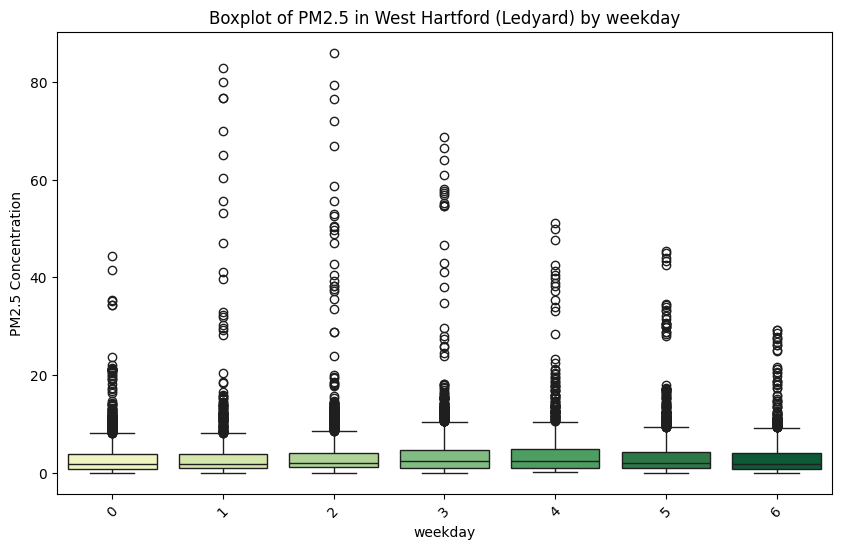

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


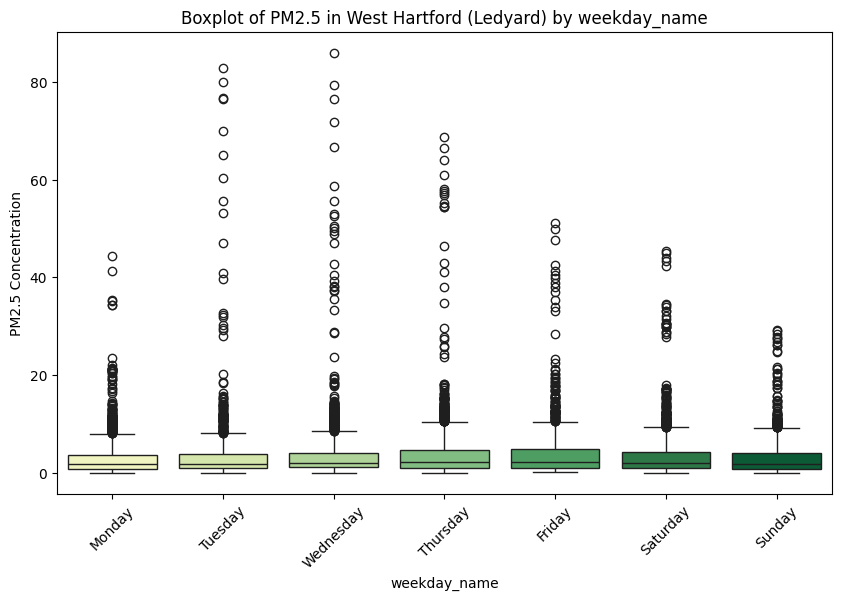

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


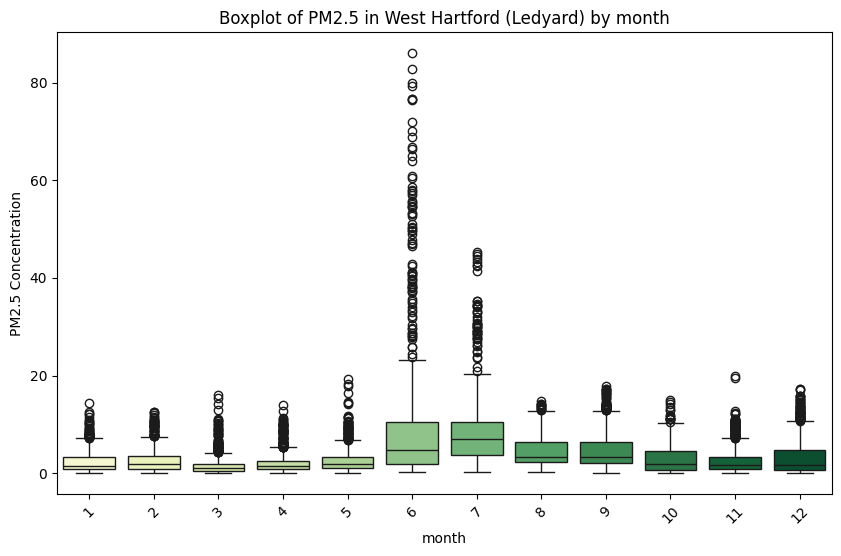

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


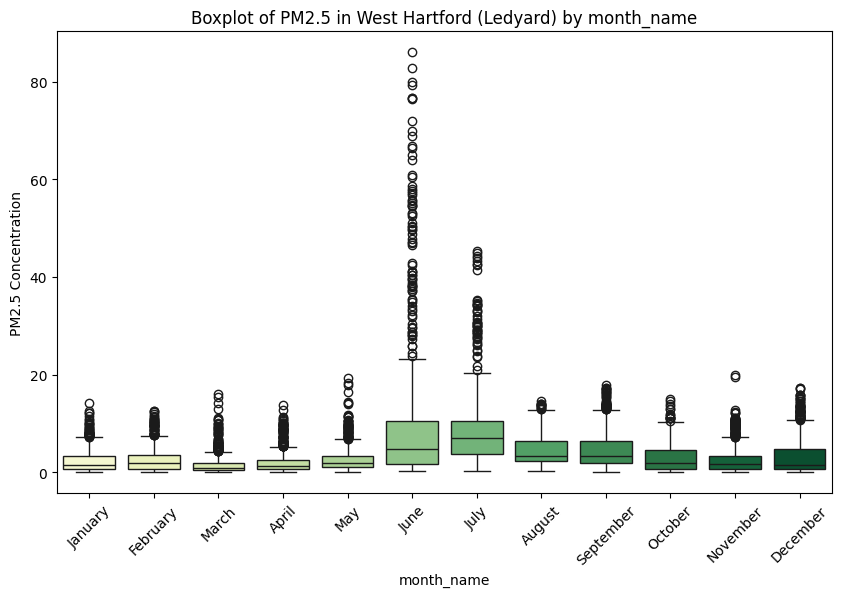

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


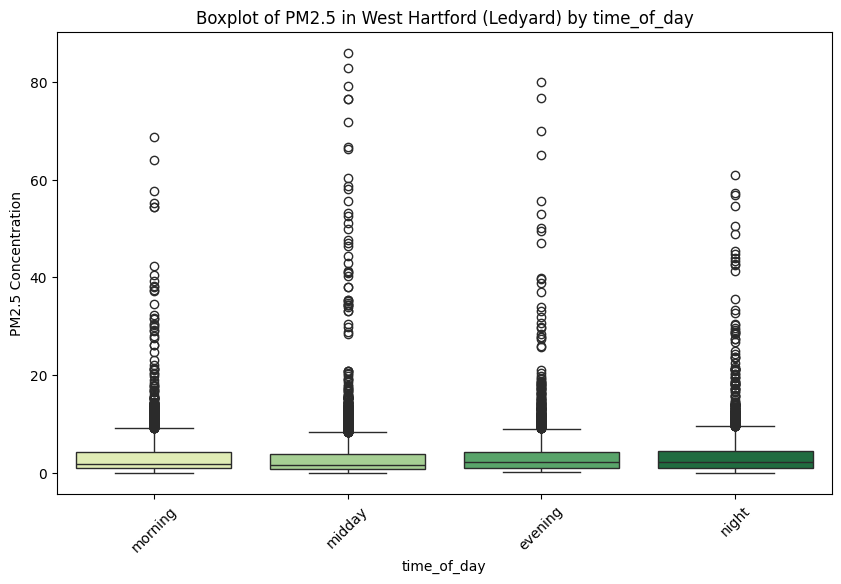

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


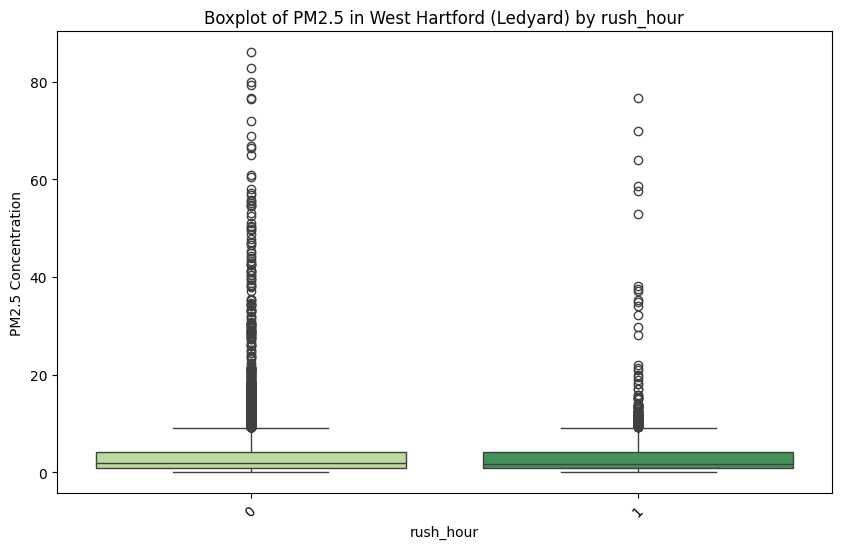

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


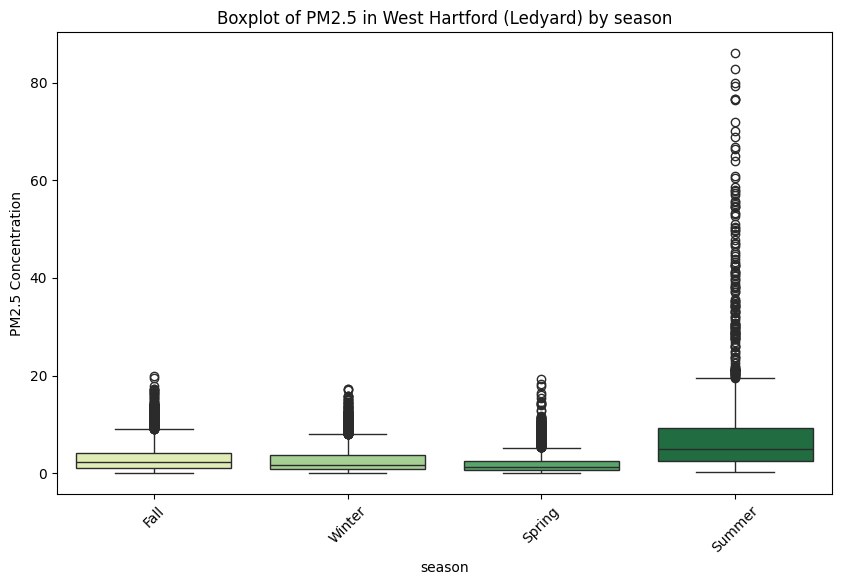

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


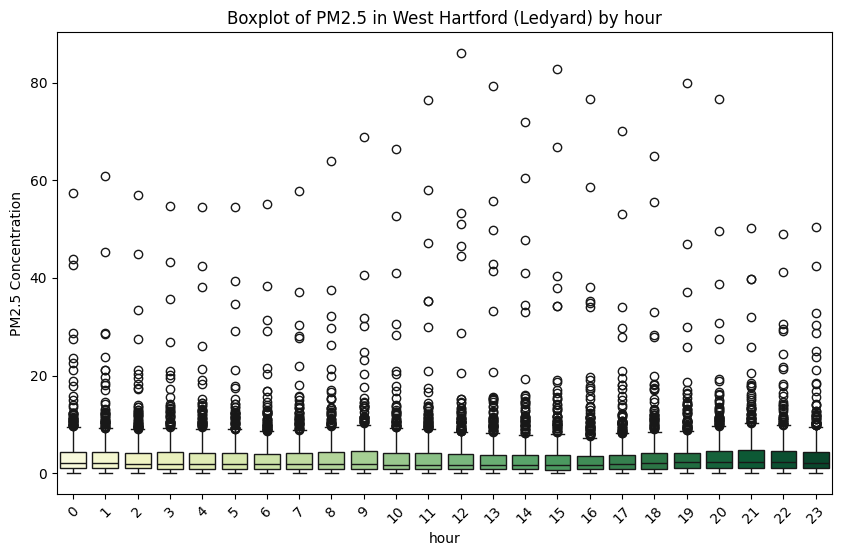

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


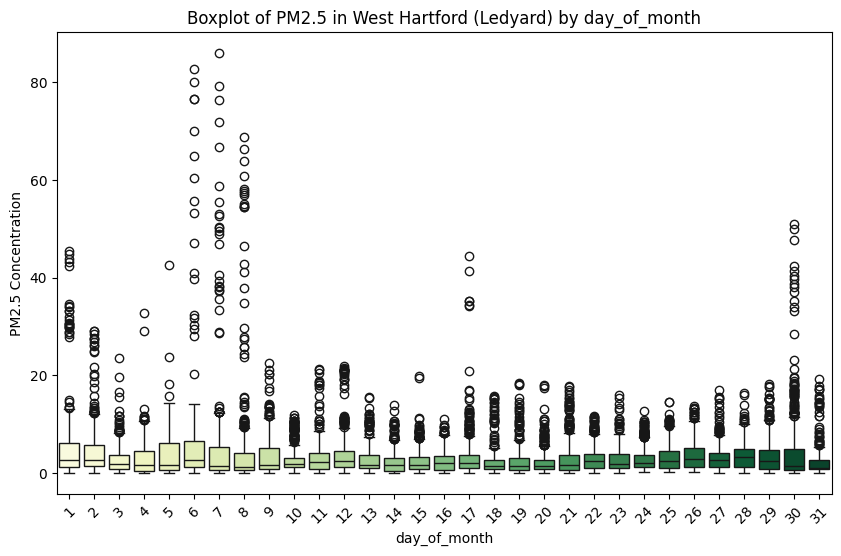

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


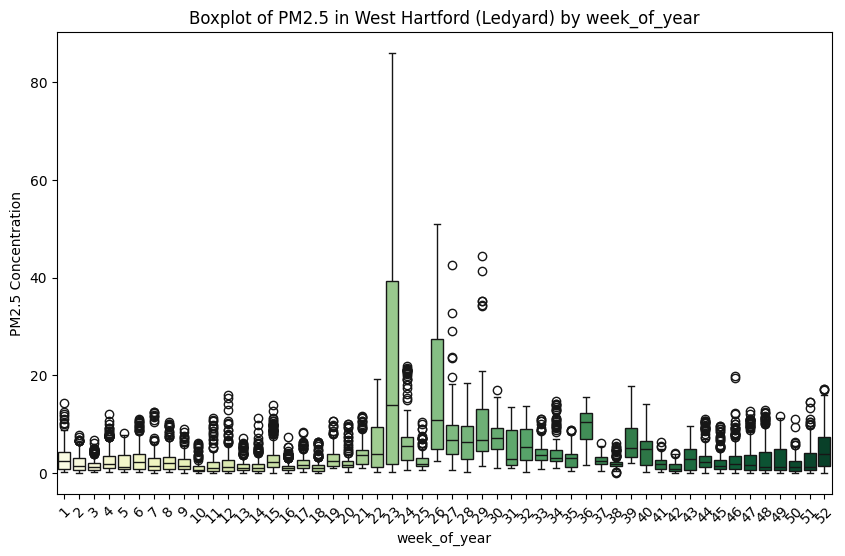

<ipython-input-163-57b4198c5411>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


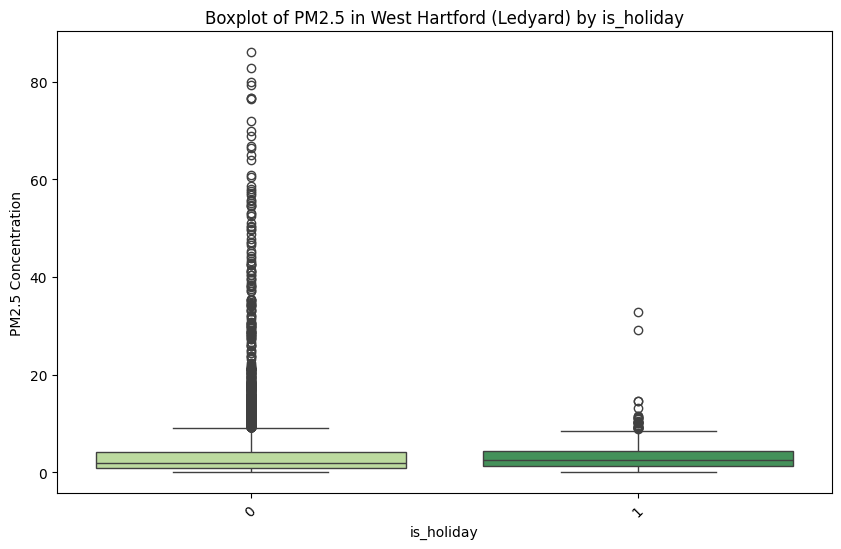

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_w1[col] = pd.Categorical(df_w1[col], categories=sorters[col], ordered=True)
        sorted_data = df_w1.sort_values(by=col)
    else:
        sorted_data = df_w1

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 in West Hartford (Ledyard) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

In [ ]:
#setting a fun green, brown, and orange color pallette here:
palette = sns.color_palette(["#50692D", "#C8DDA8", "#C5CF4A", "#FF9010", "#E66C37", "#725224", "#C49044"])  # Adjust colors as needed

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


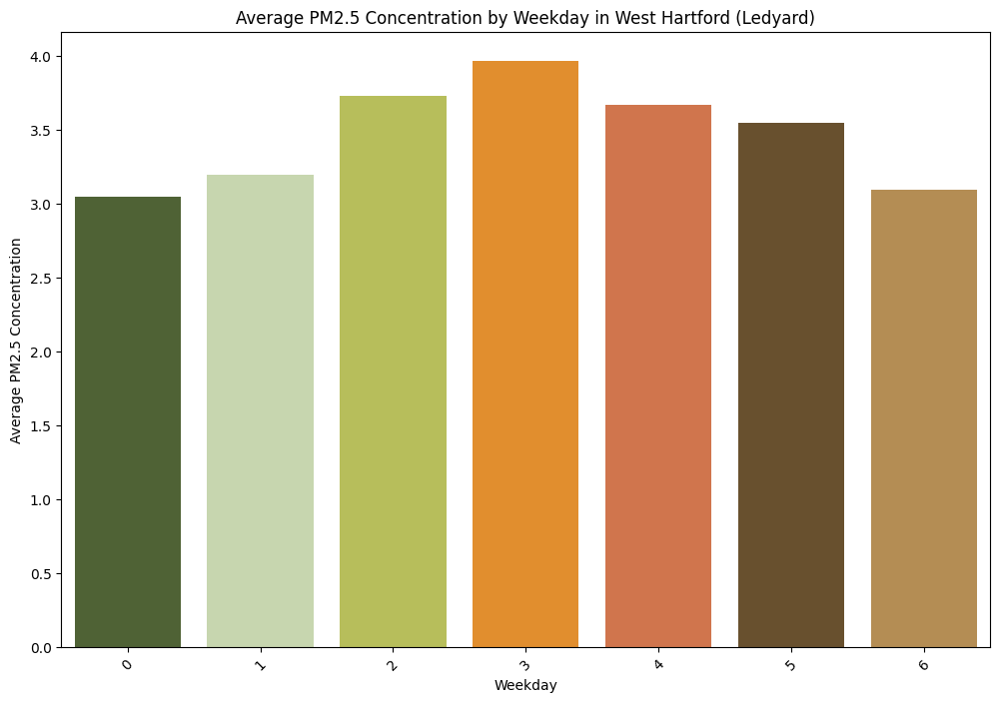

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


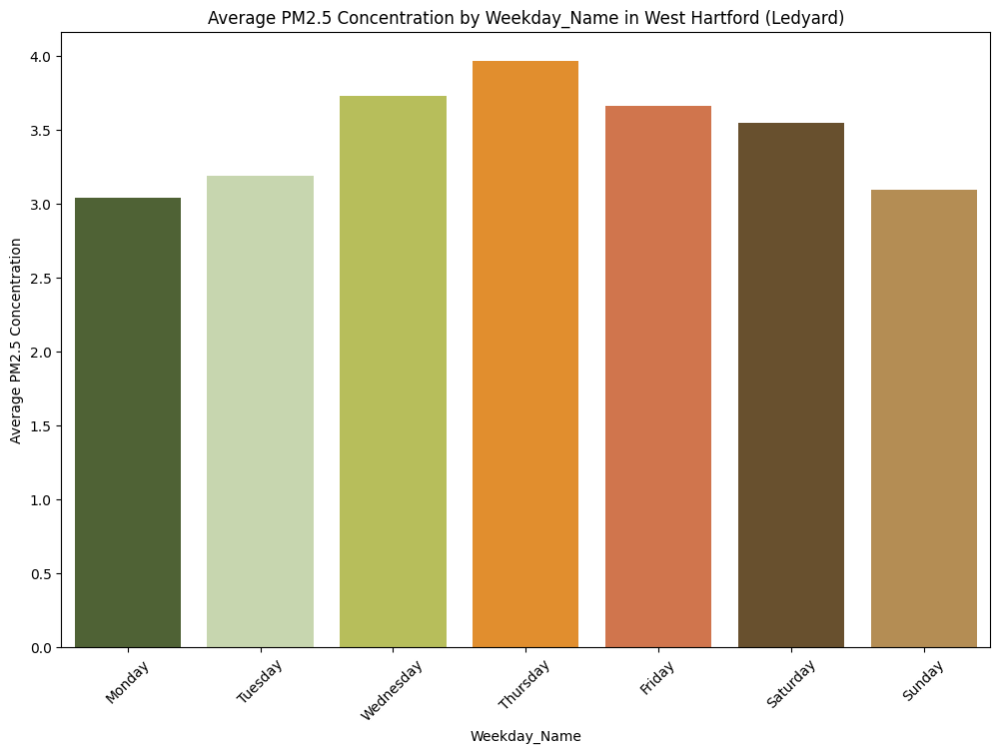

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


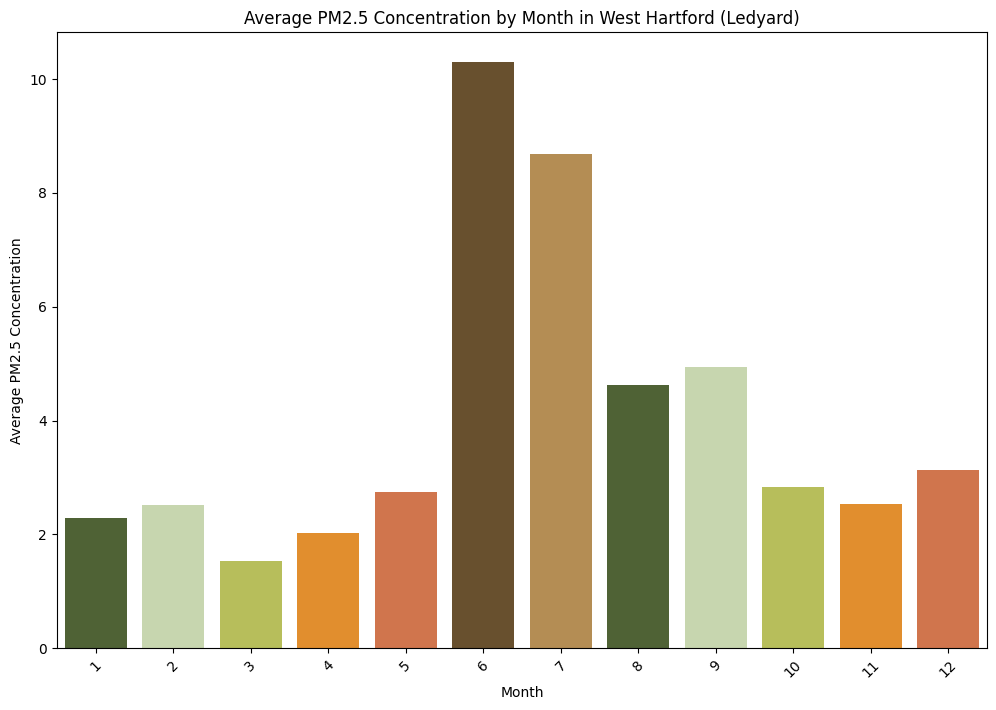

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


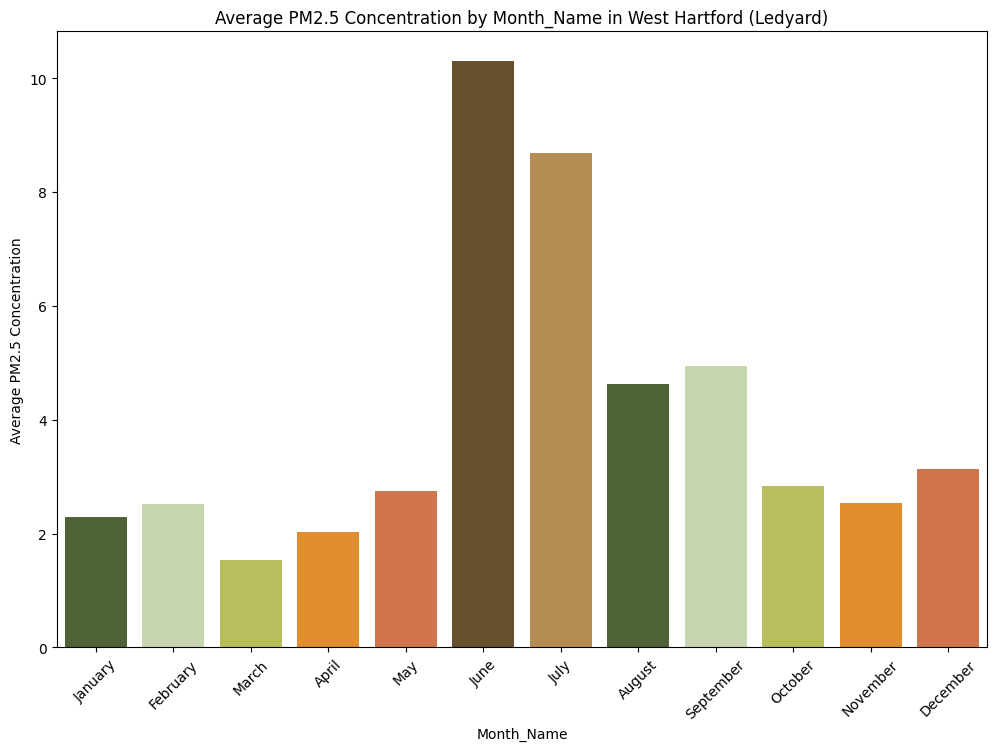

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


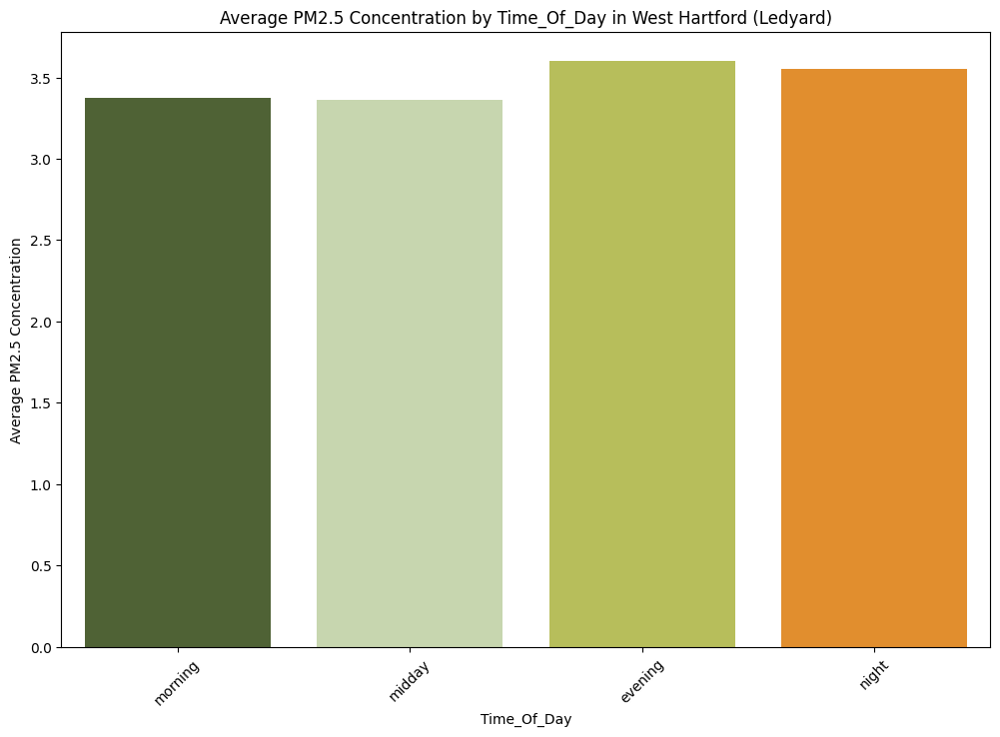

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


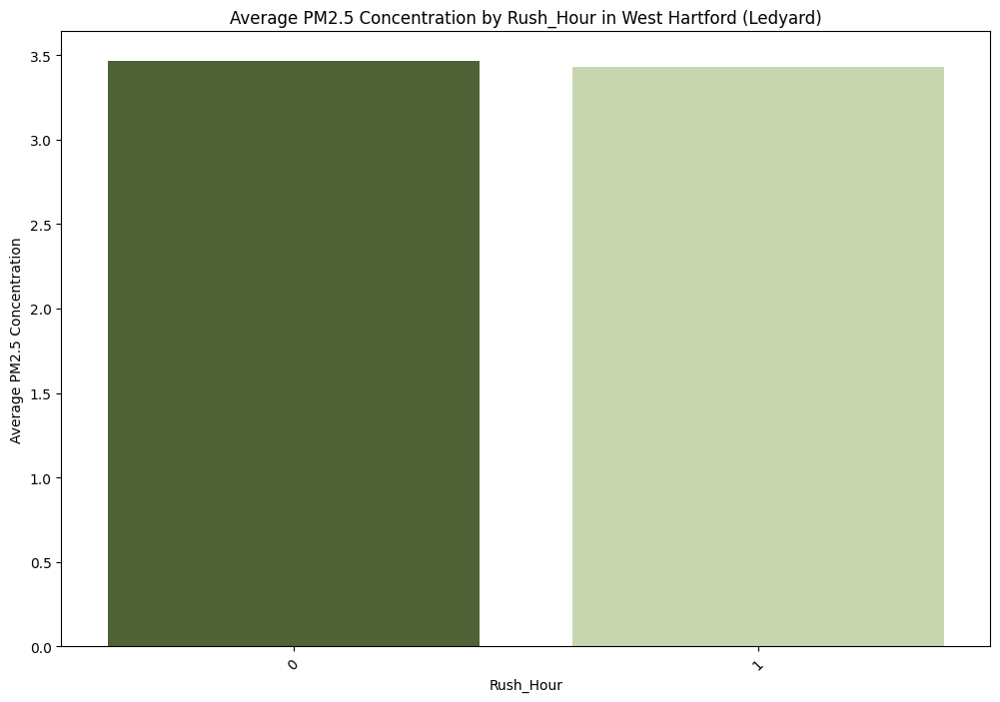

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


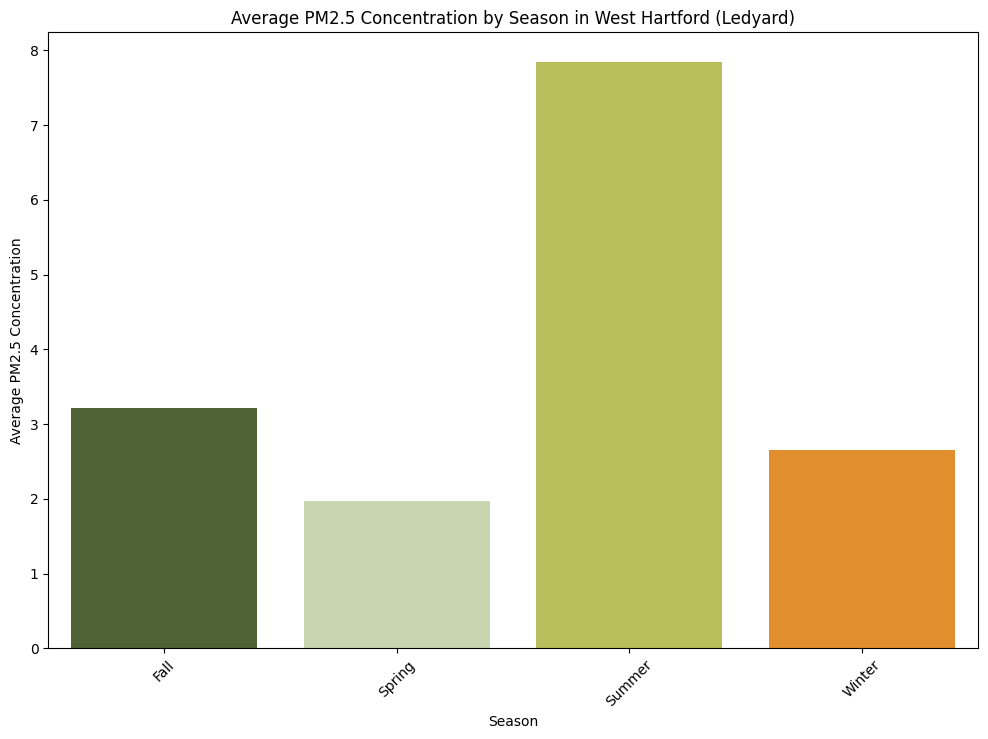

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


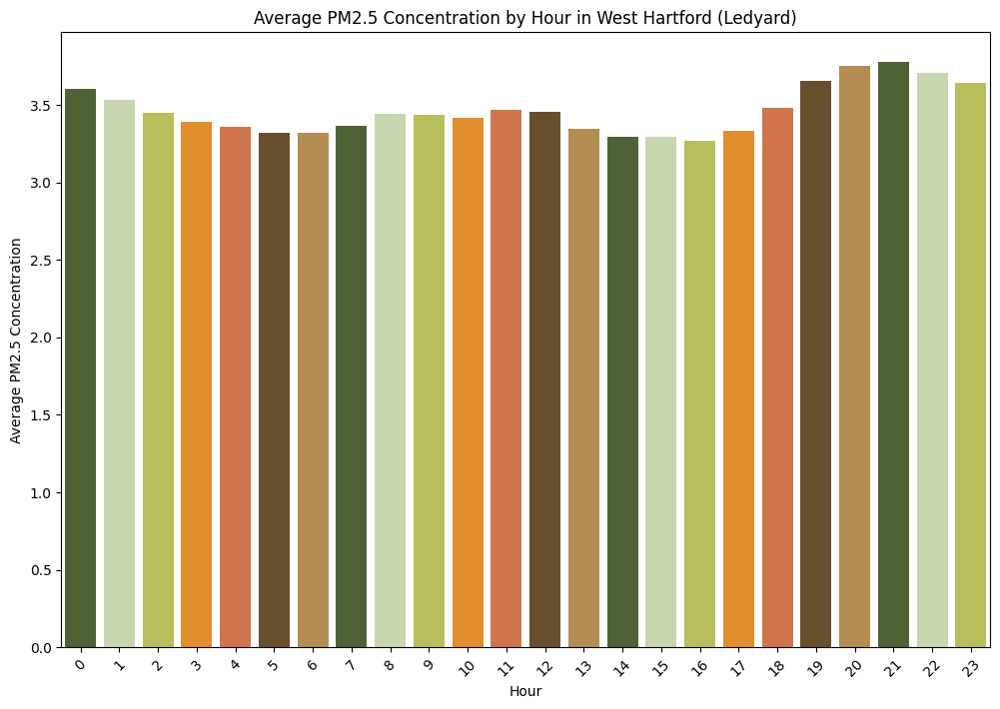

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


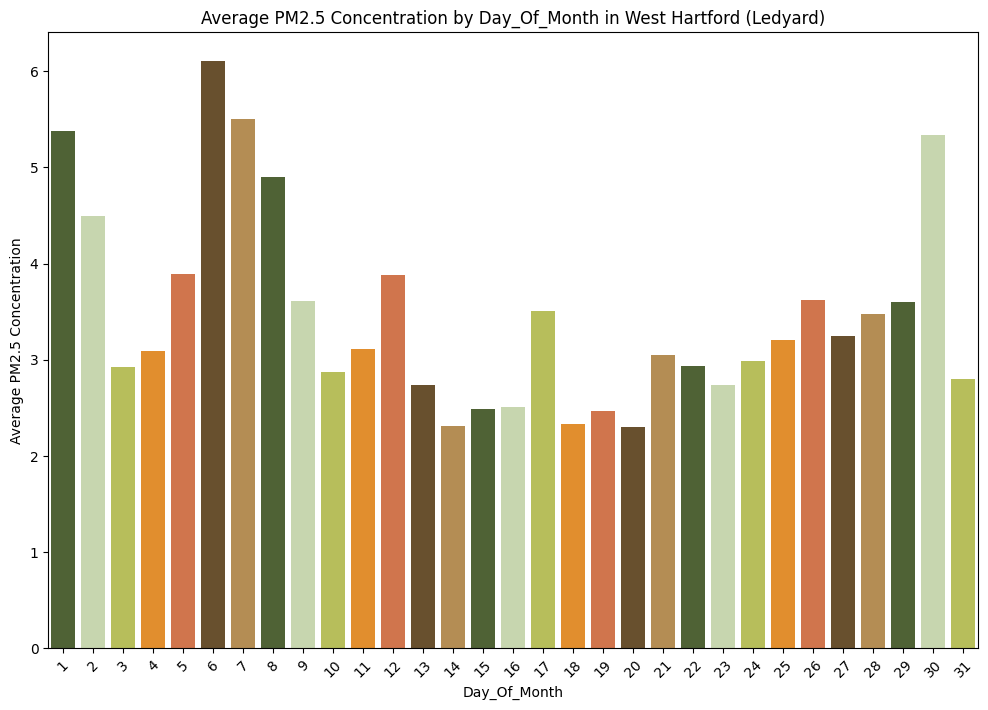

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


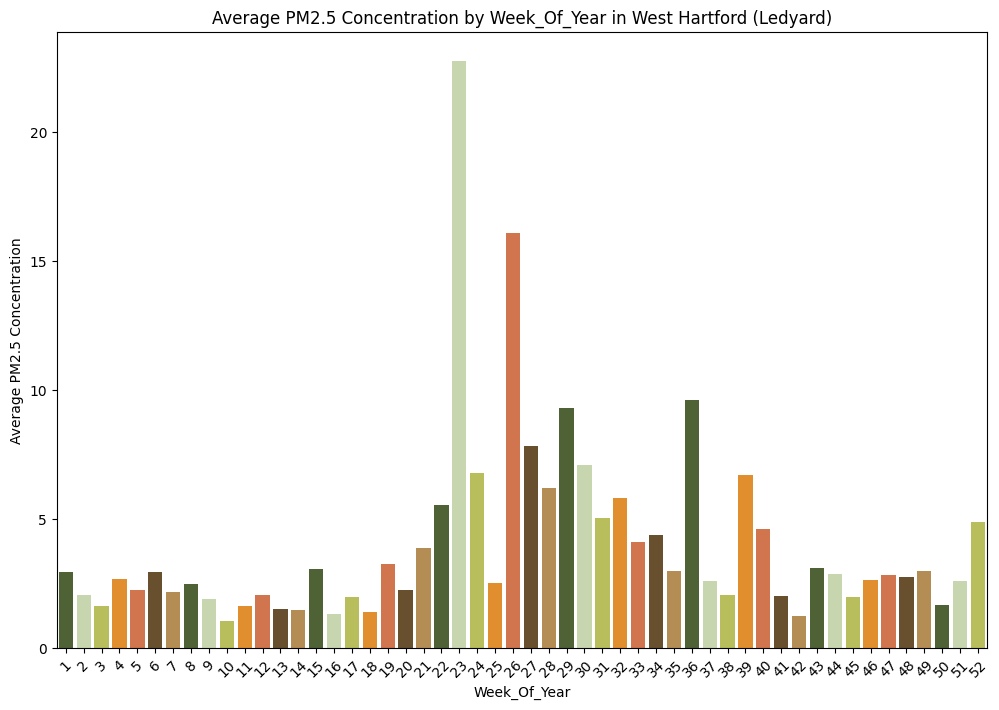

<ipython-input-165-8c7964a3a7e5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-165-8c7964a3a7e5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


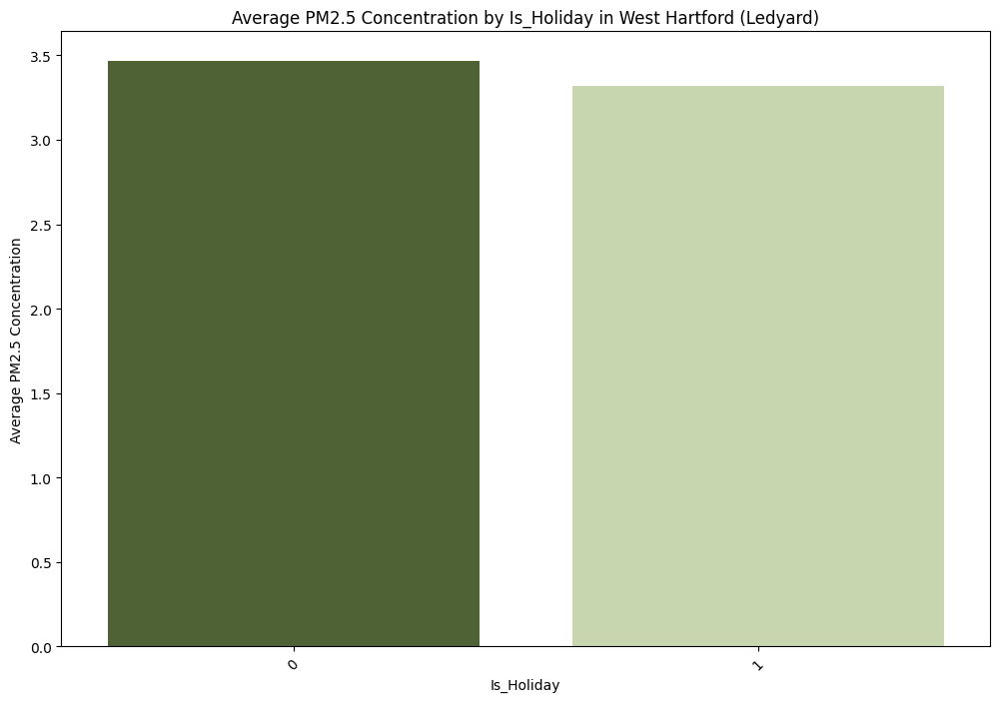

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_w1.groupby(category)['pm2.5_alt'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
    plt.title(f'Average PM2.5 Concentration by {category.title()} in West Hartford (Ledyard)')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

## Kingswood Oxford School (West Hartford) pm2.5 and temporal columns

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


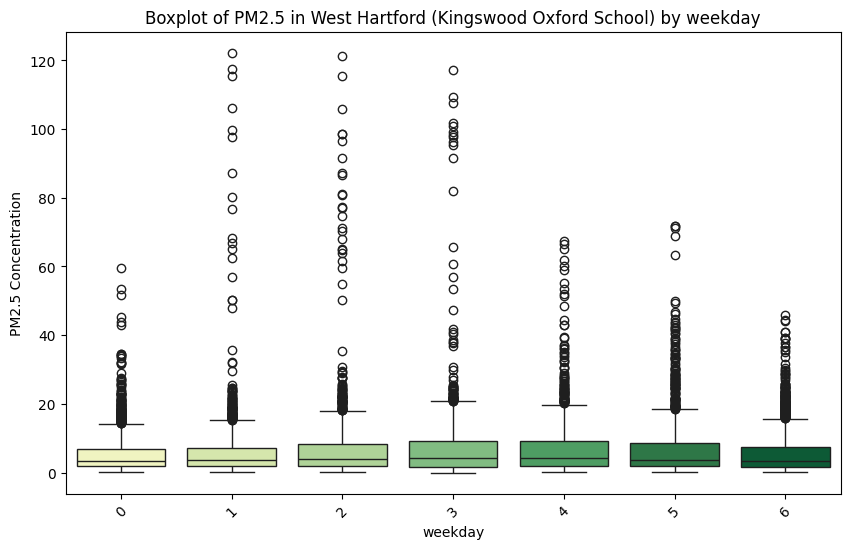

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


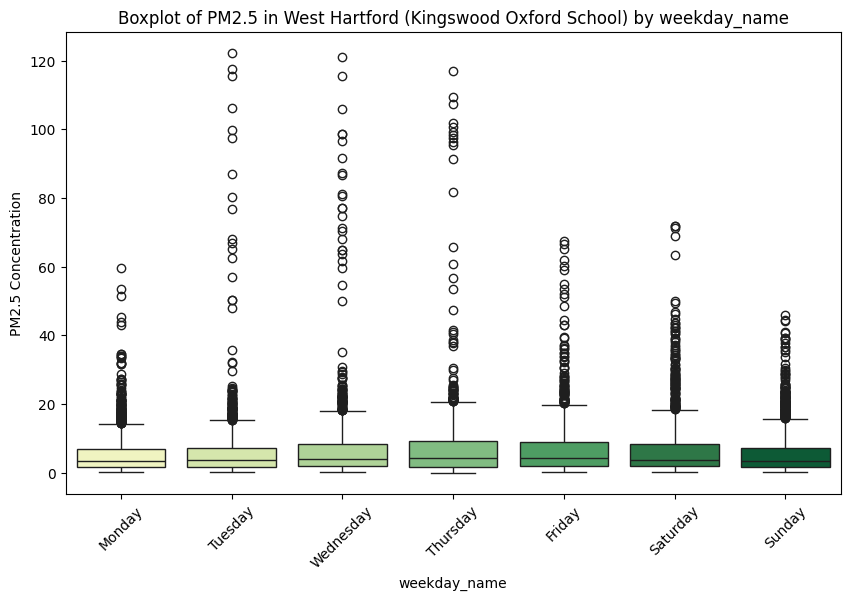

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


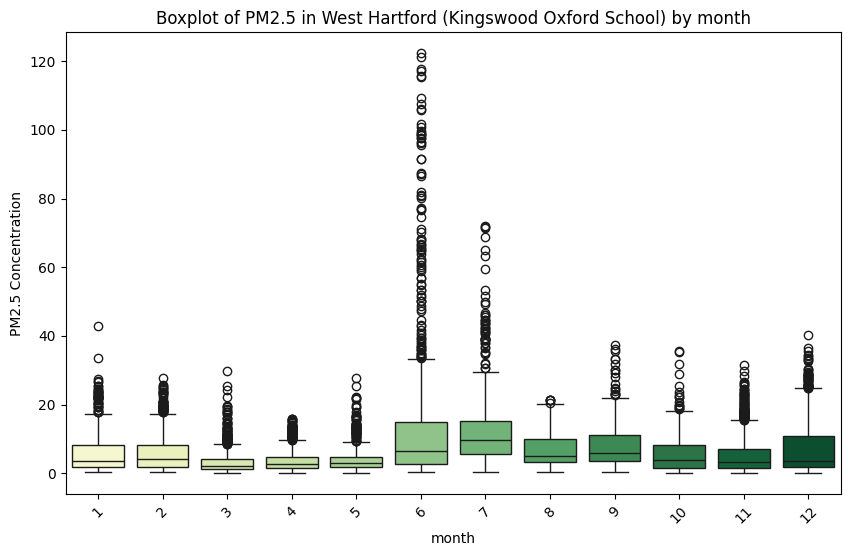

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


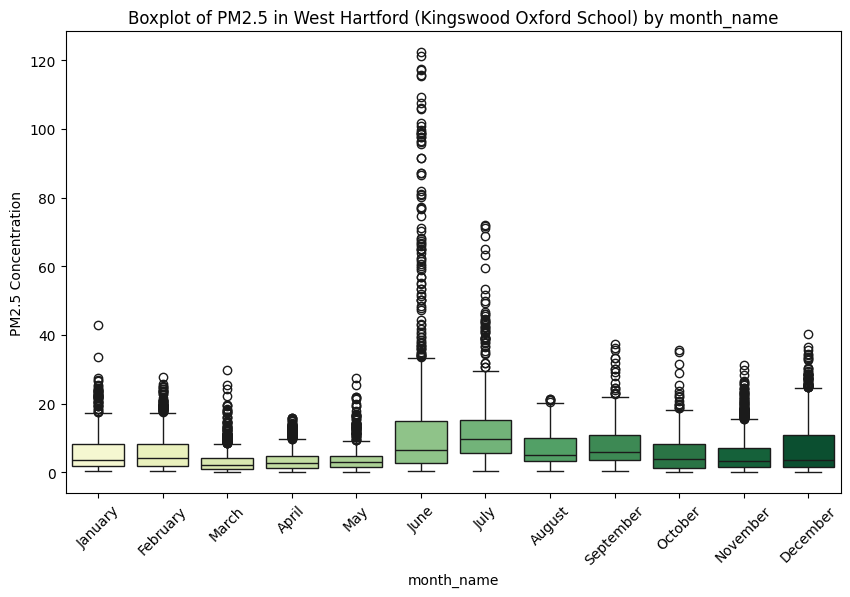

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


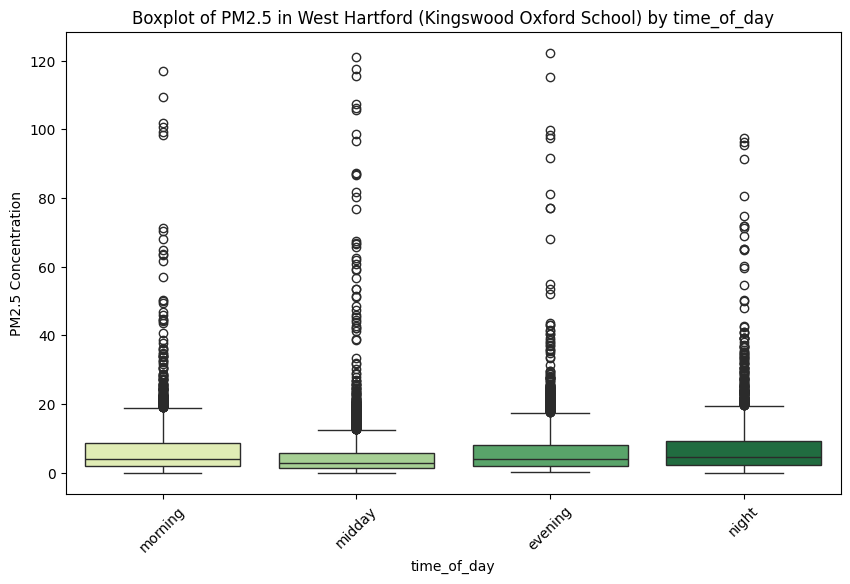

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


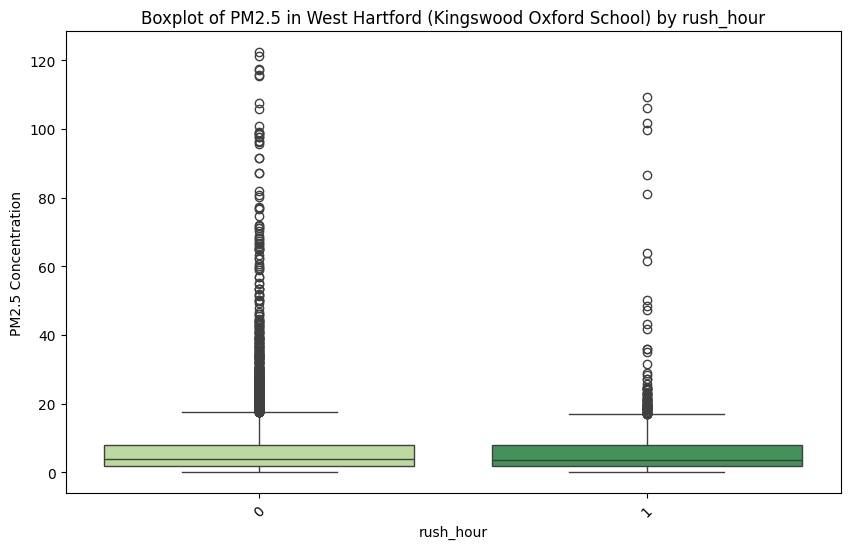

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


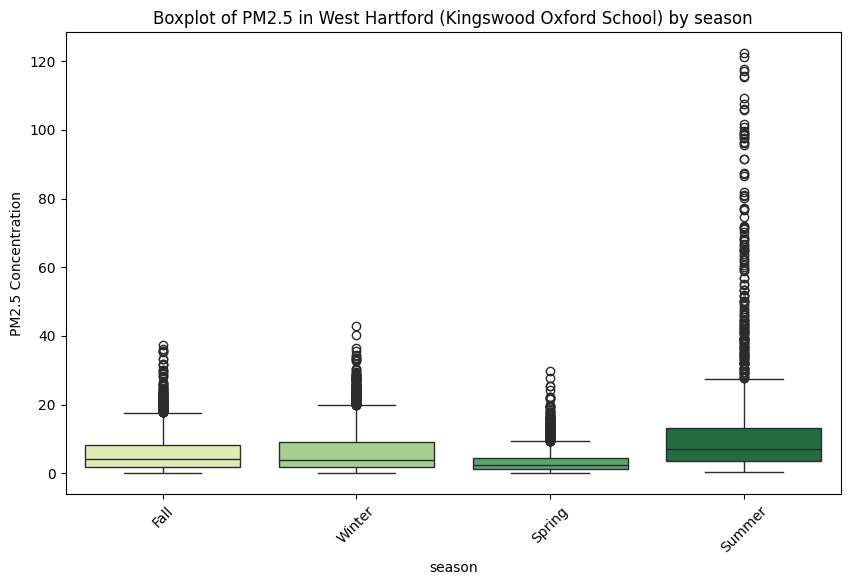

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


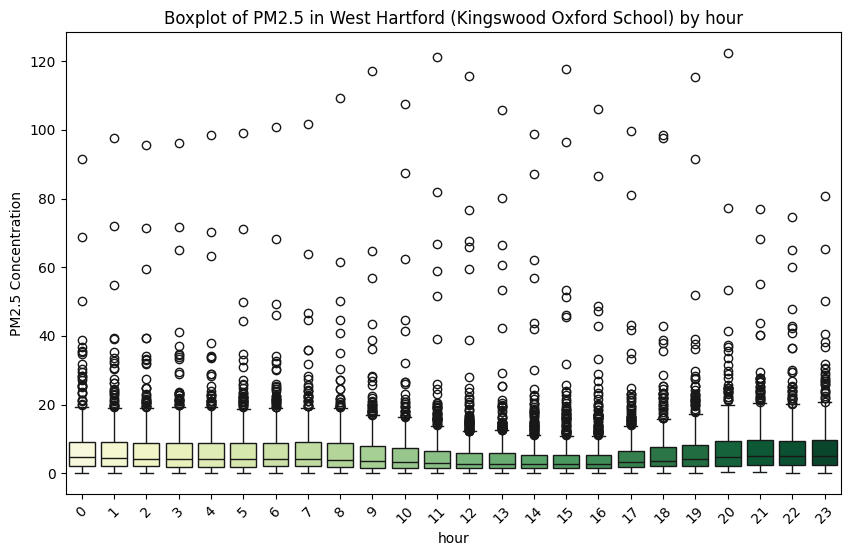

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


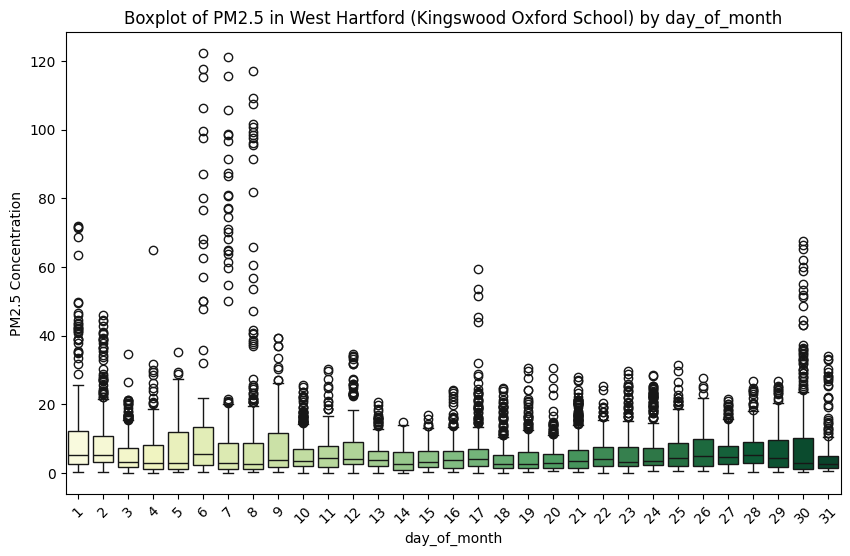

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


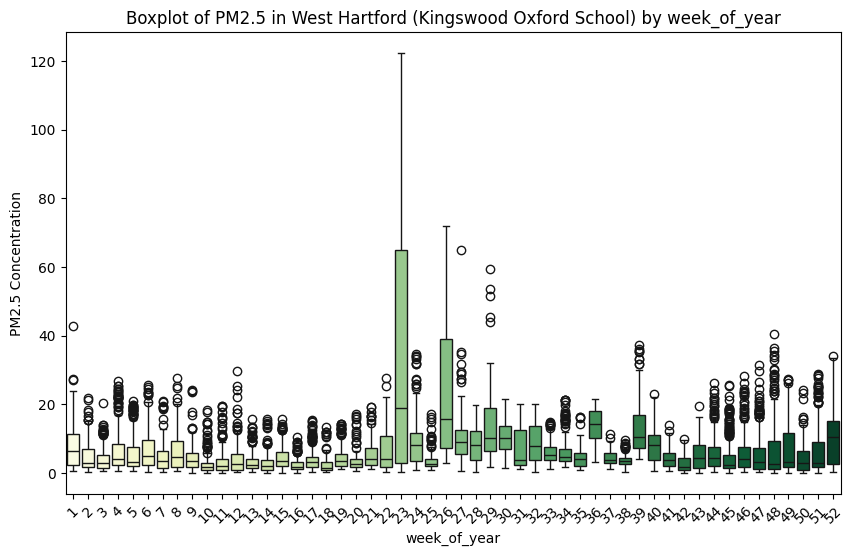

<ipython-input-166-6f9714424a7c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


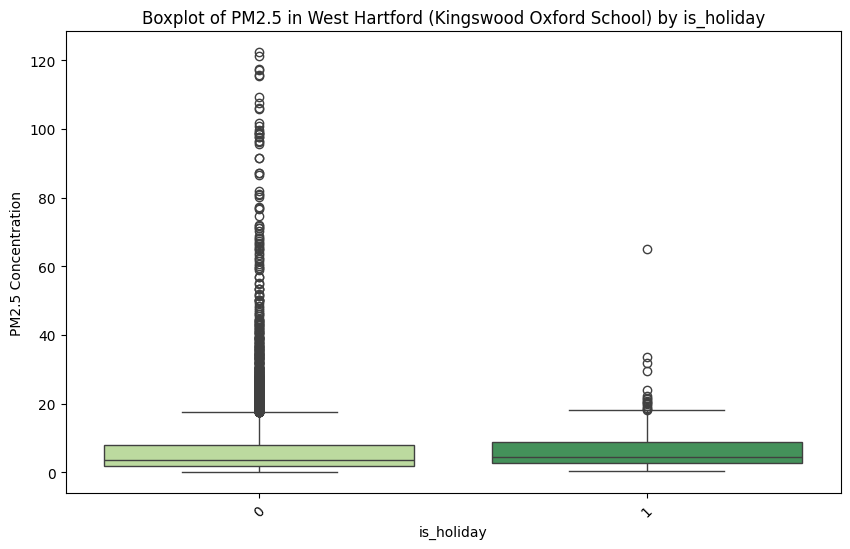

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_w2[col] = pd.Categorical(df_w2[col], categories=sorters[col], ordered=True)
        sorted_data = df_w2.sort_values(by=col)
    else:
        sorted_data = df_w2

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 in West Hartford (Kingswood Oxford School) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


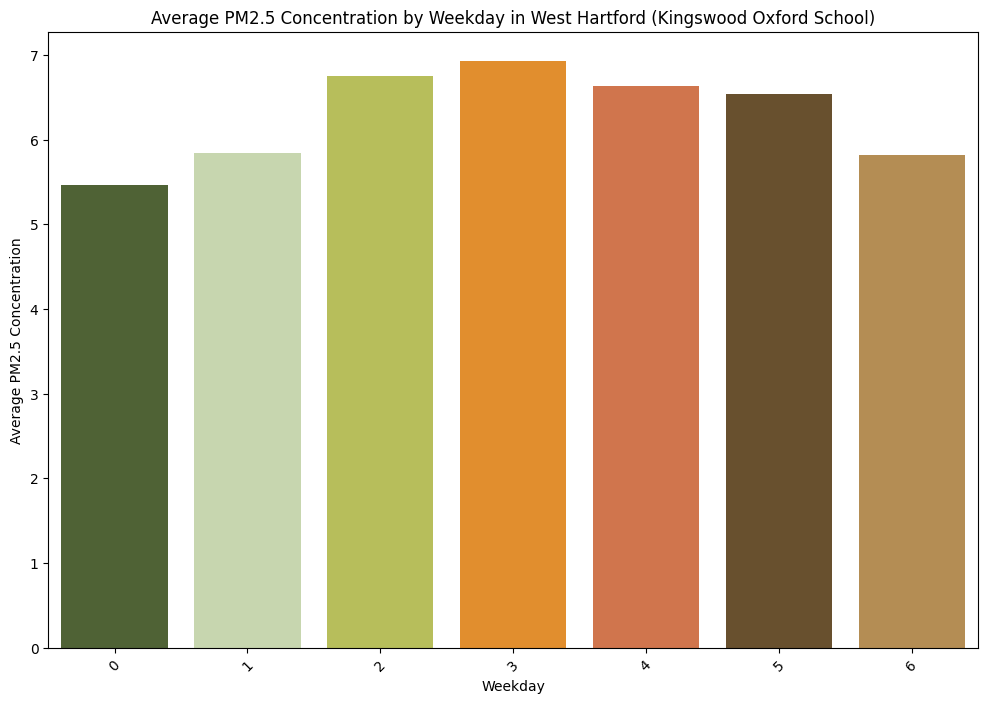

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


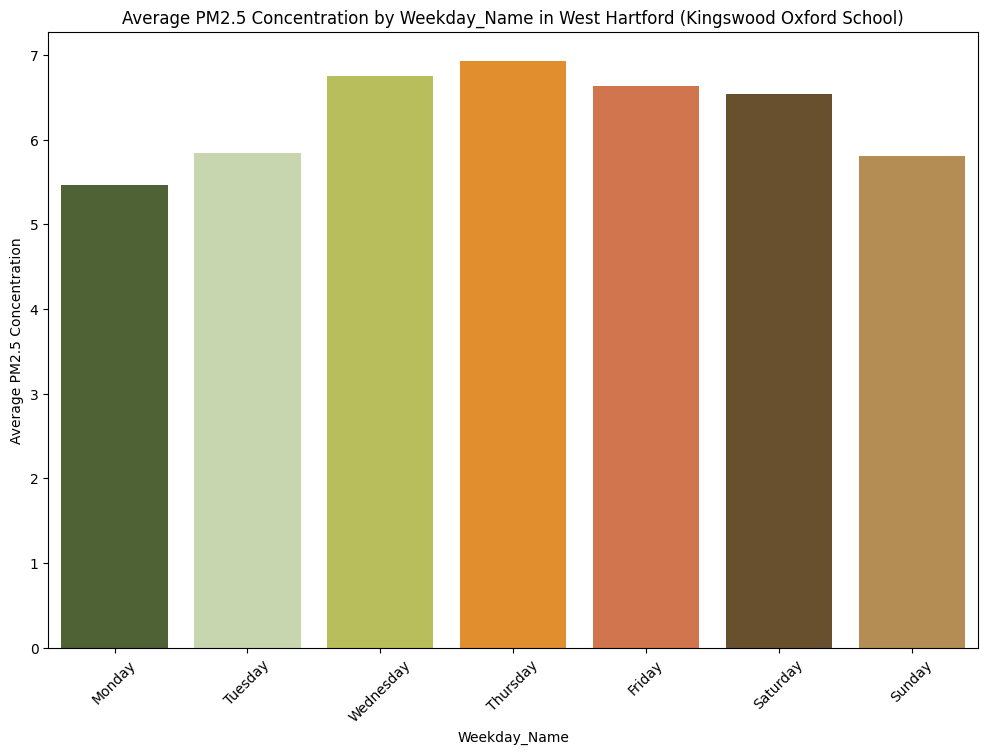

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


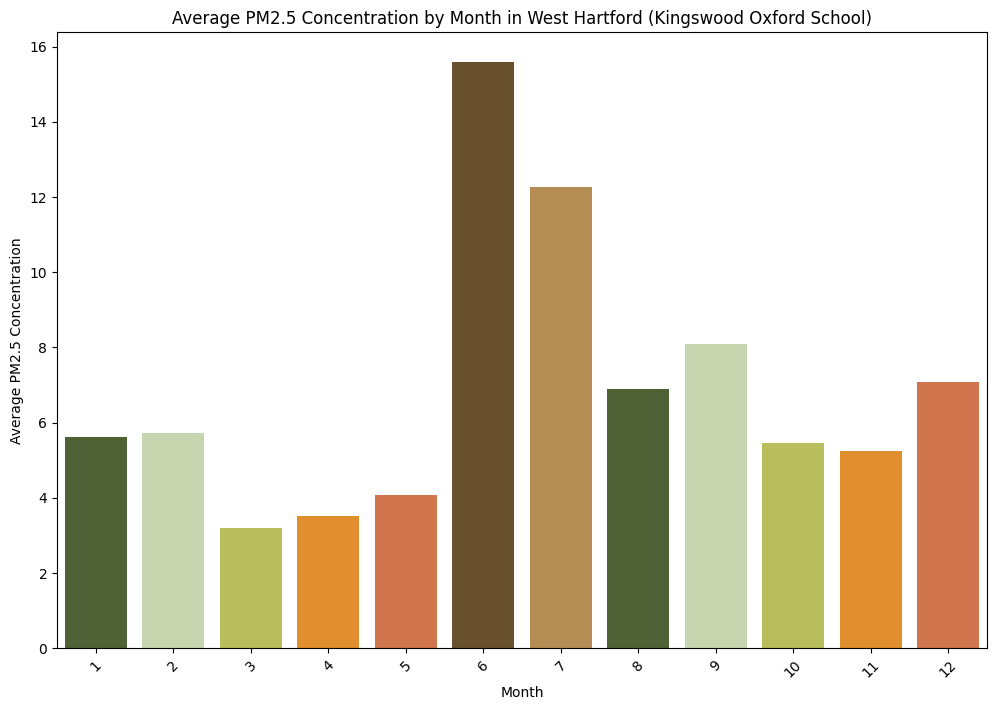

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


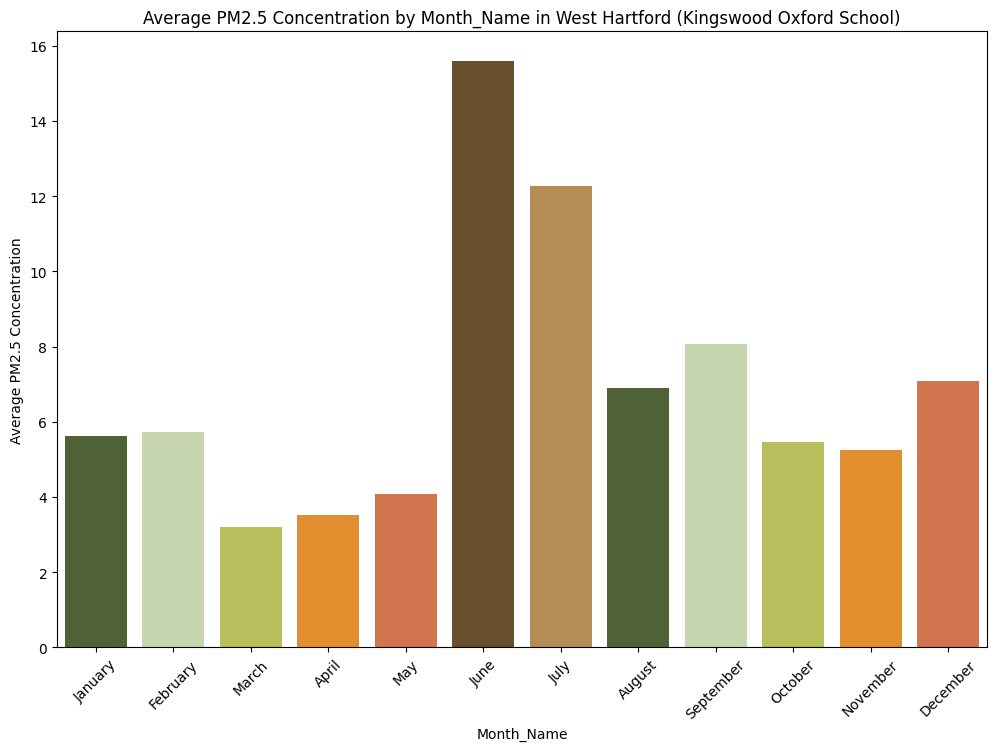

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


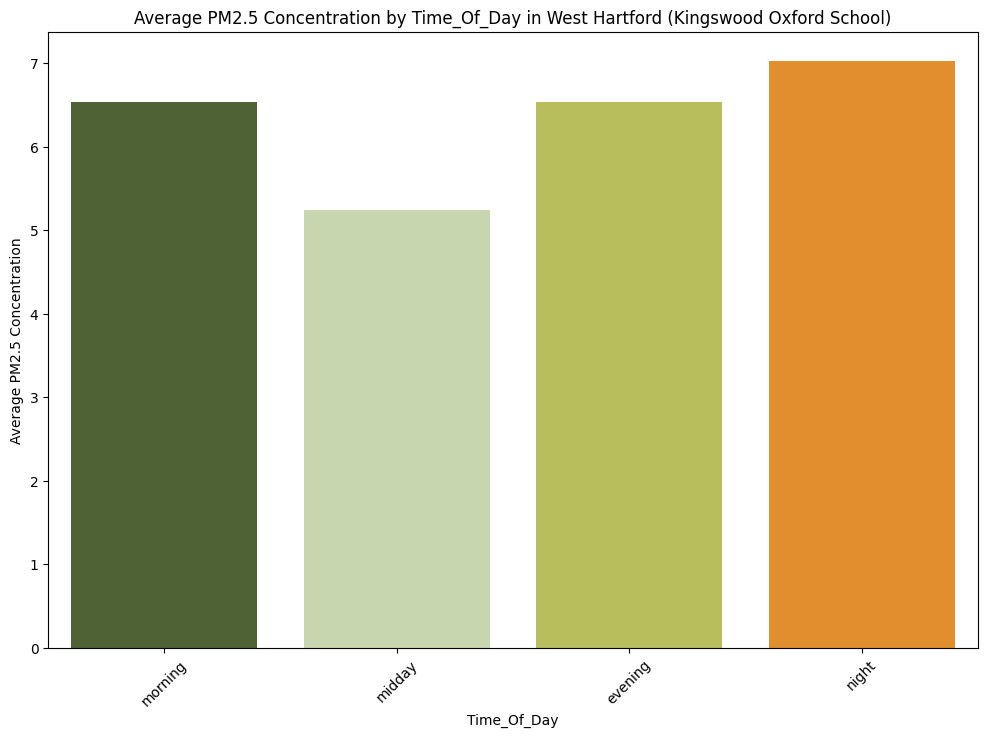

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


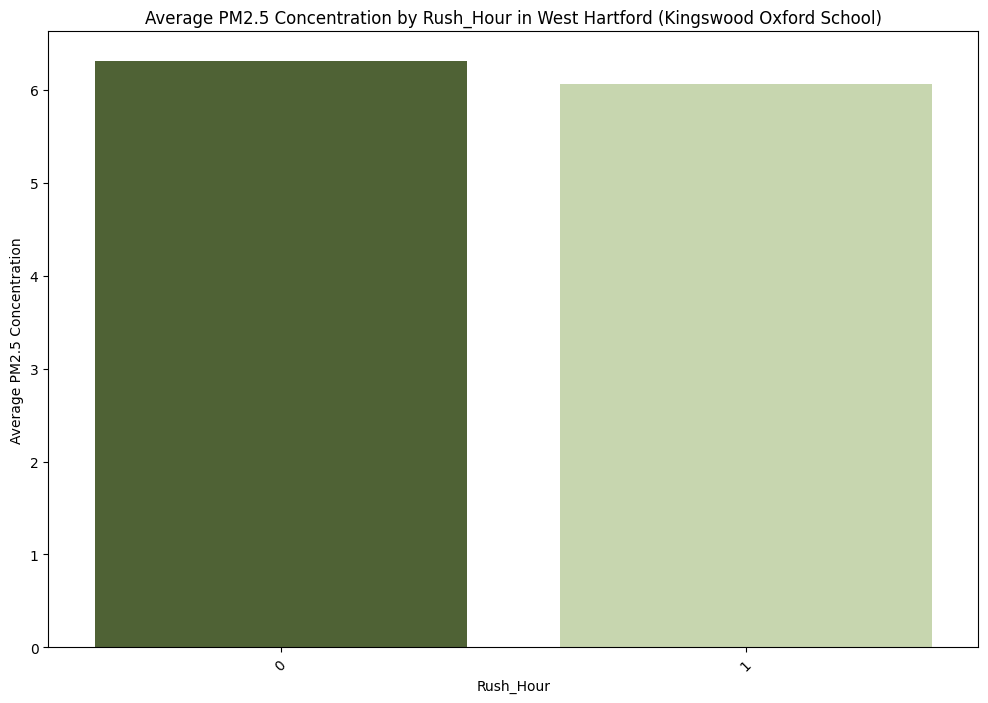

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


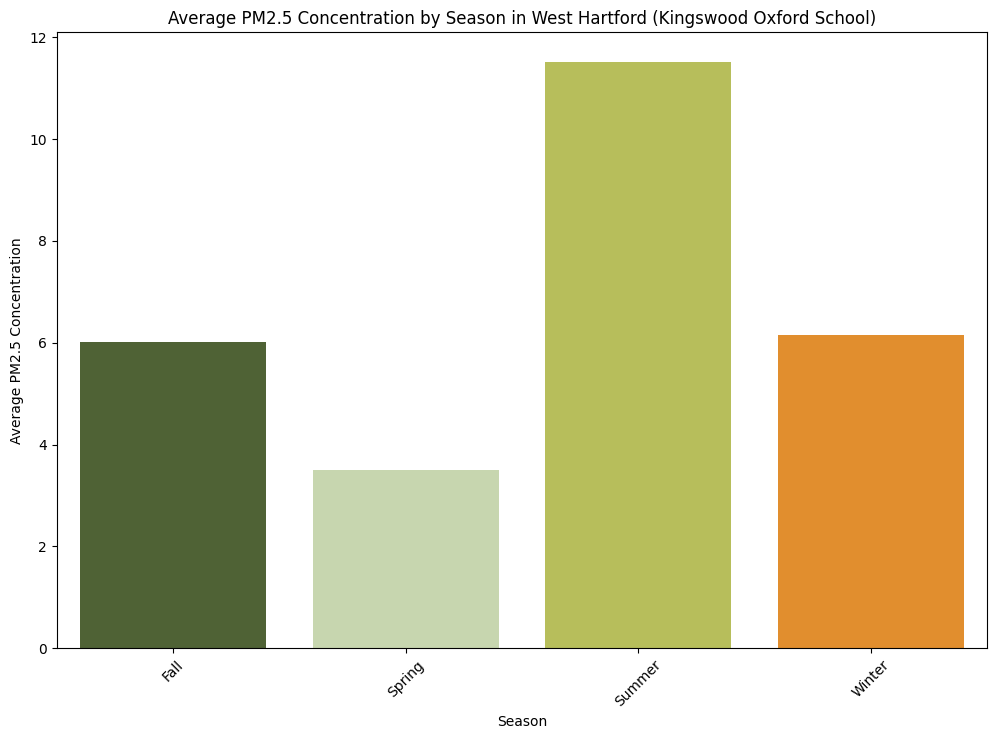

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


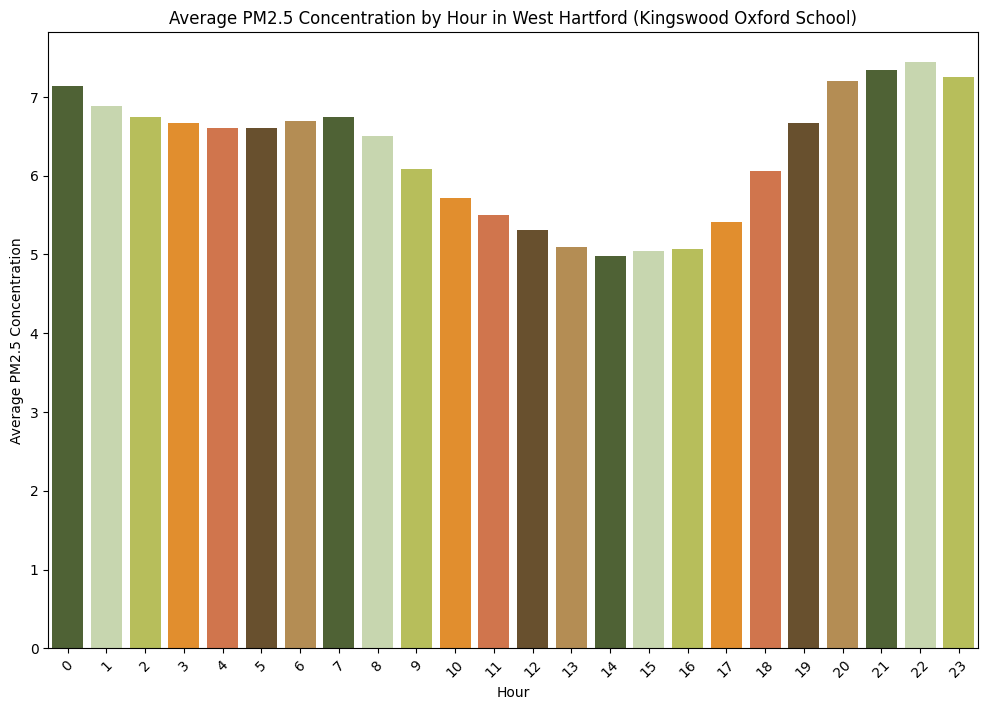

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


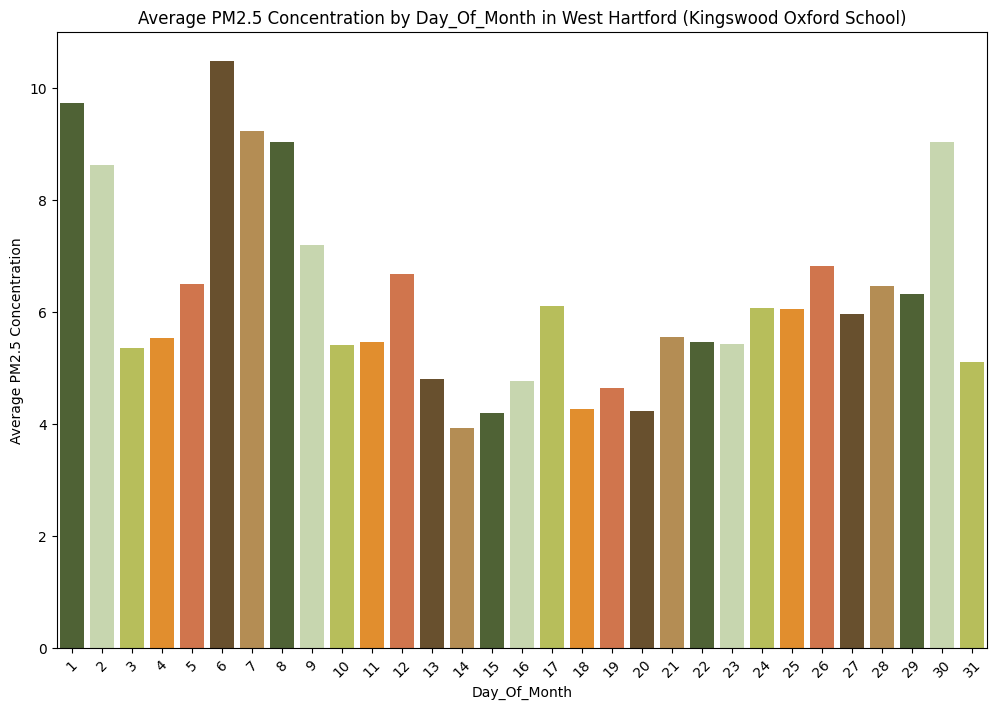

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


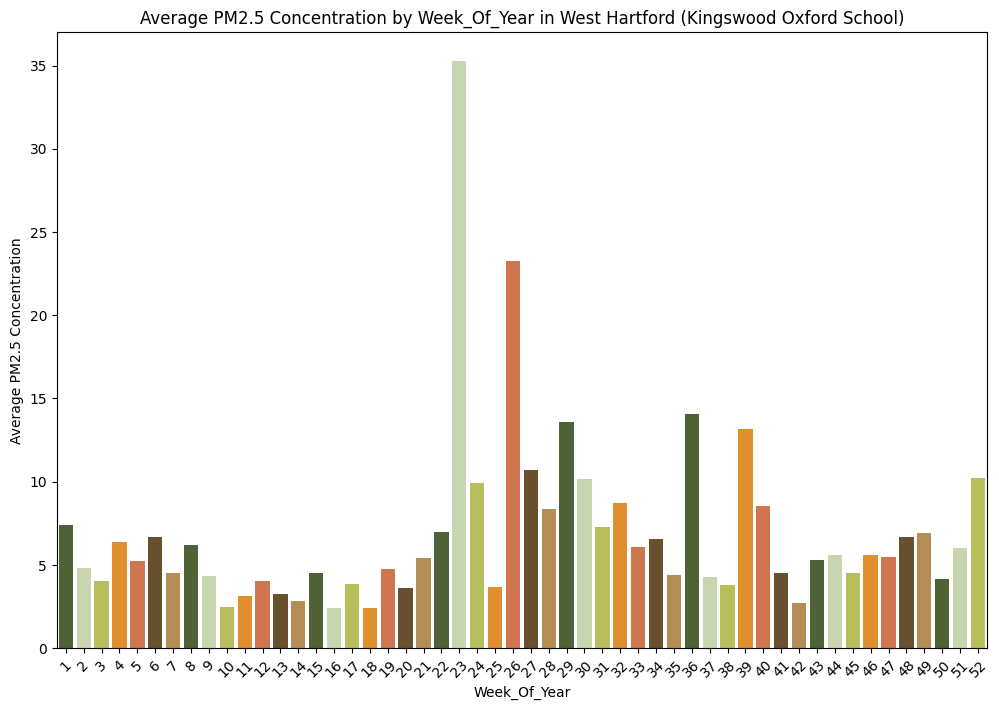

<ipython-input-167-0d78948a93f5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-167-0d78948a93f5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


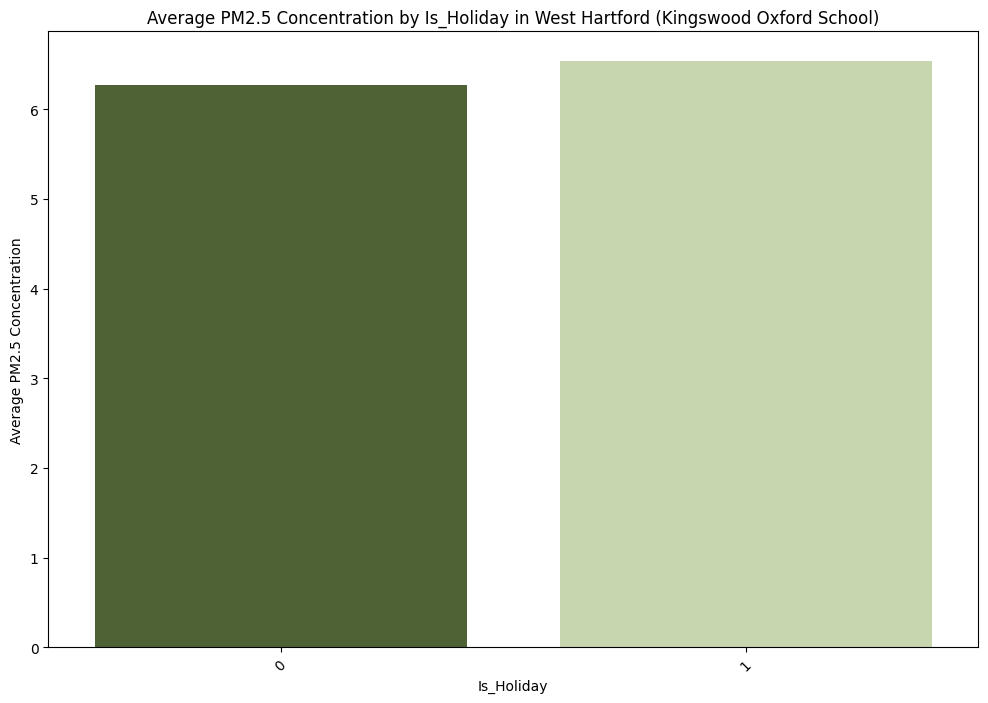

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_w2.groupby(category)['pm2.5_alt'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
    plt.title(f'Average PM2.5 Concentration by {category.title()} in West Hartford (Kingswood Oxford School)')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

## BiCi Co Park (Hartford) pm2.5 and temporal columns

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


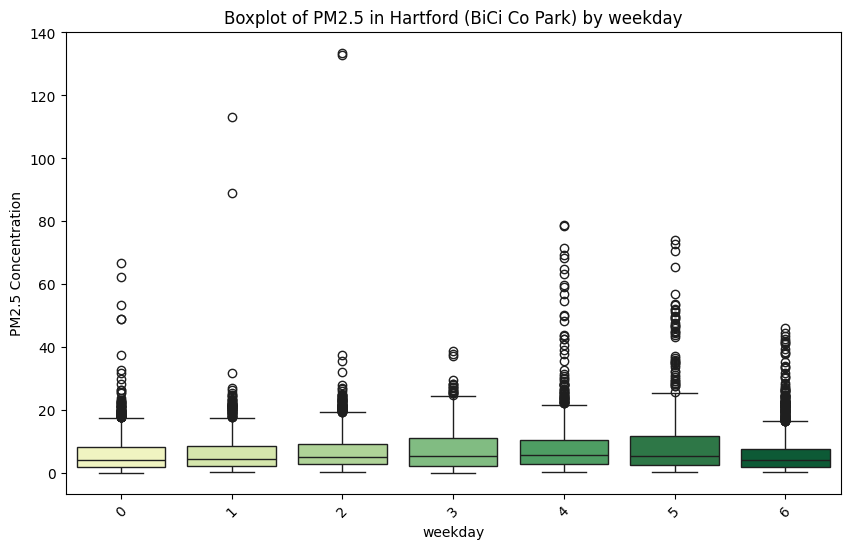

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


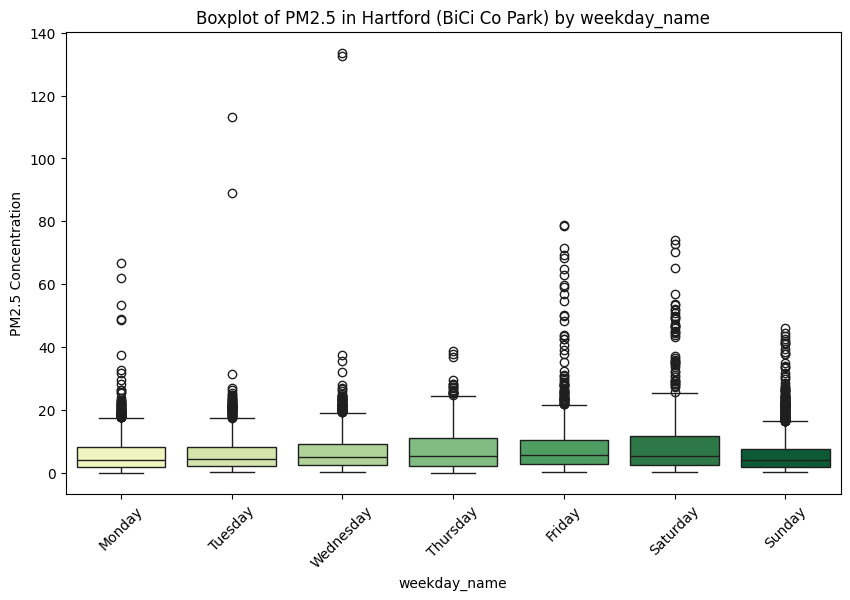

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


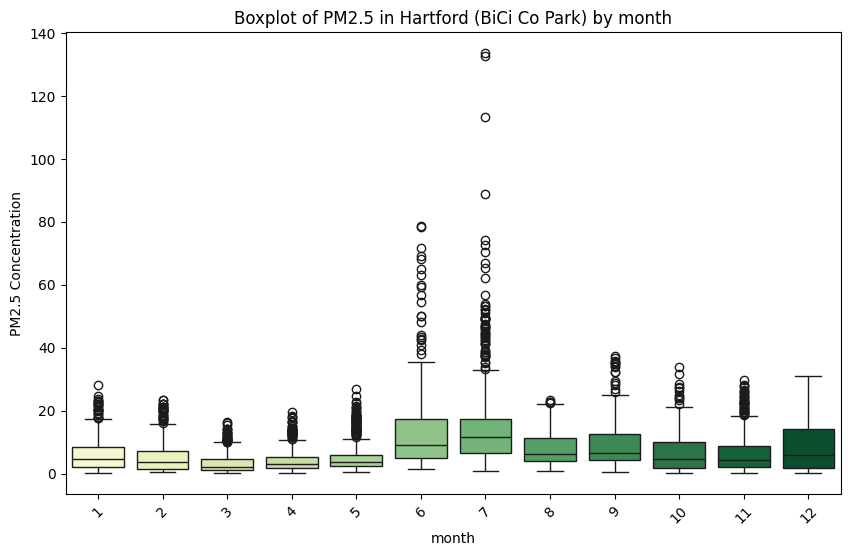

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


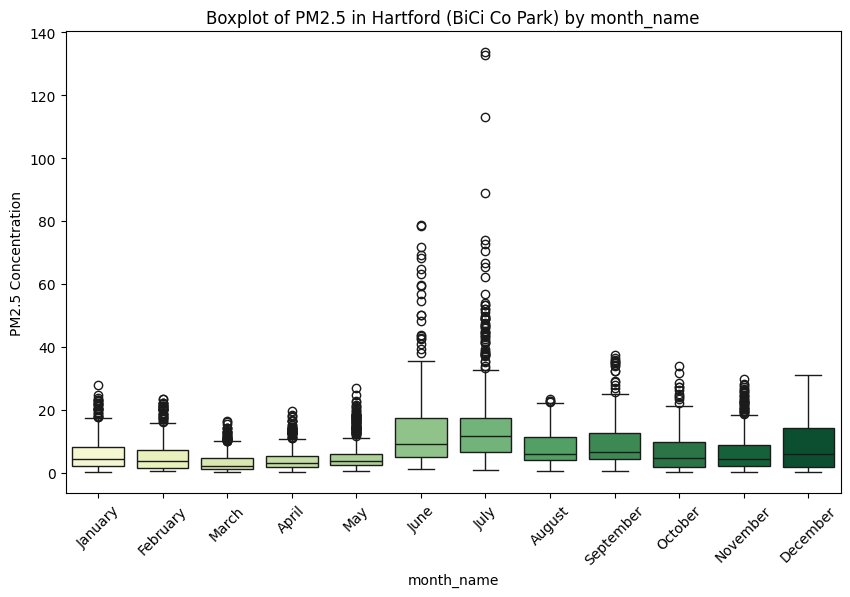

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


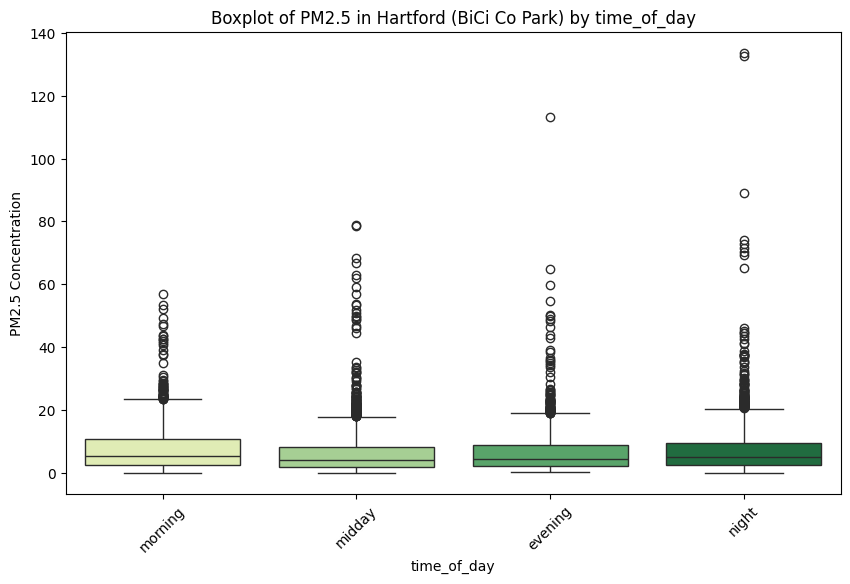

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


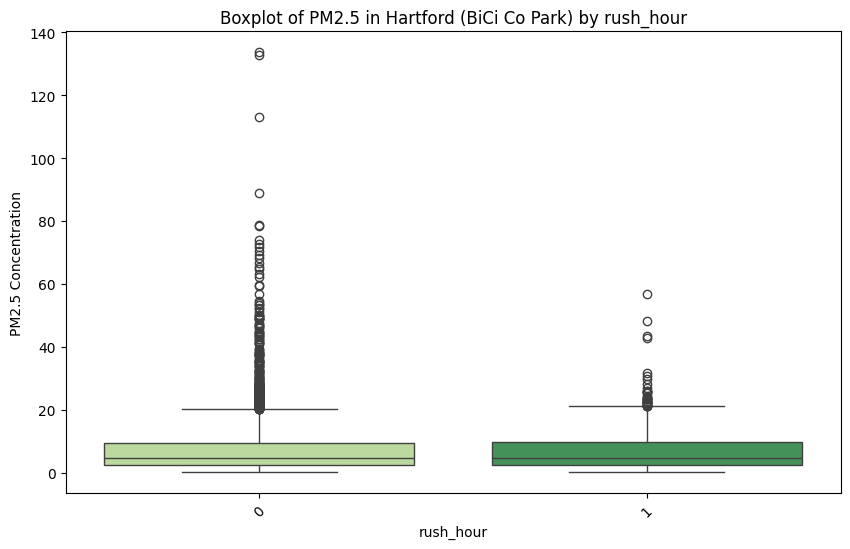

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


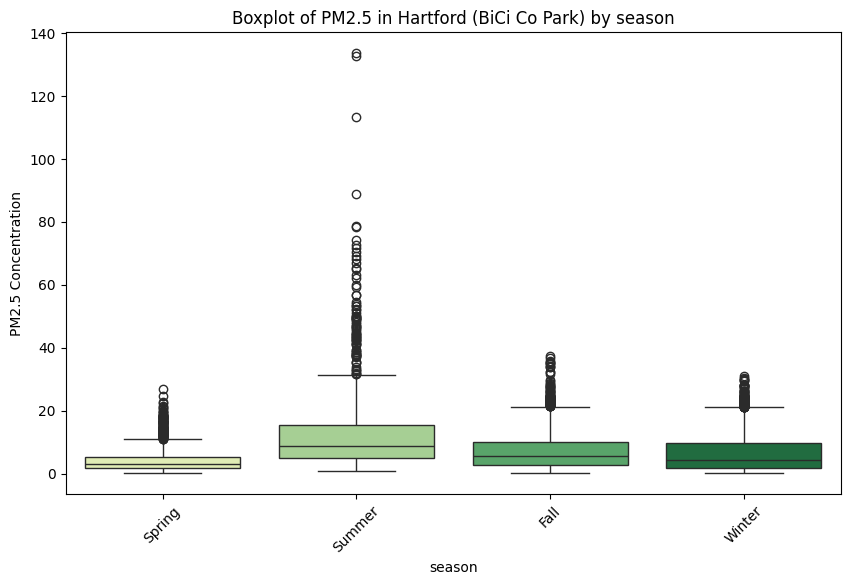

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


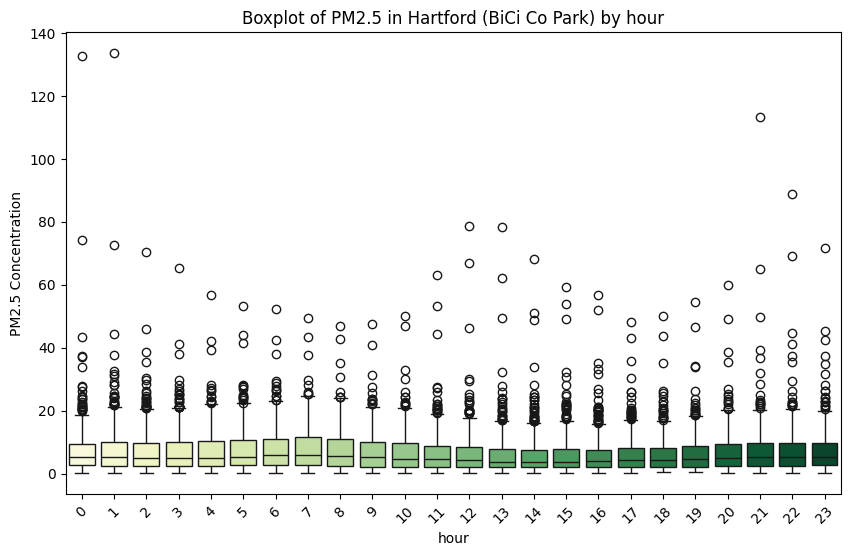

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


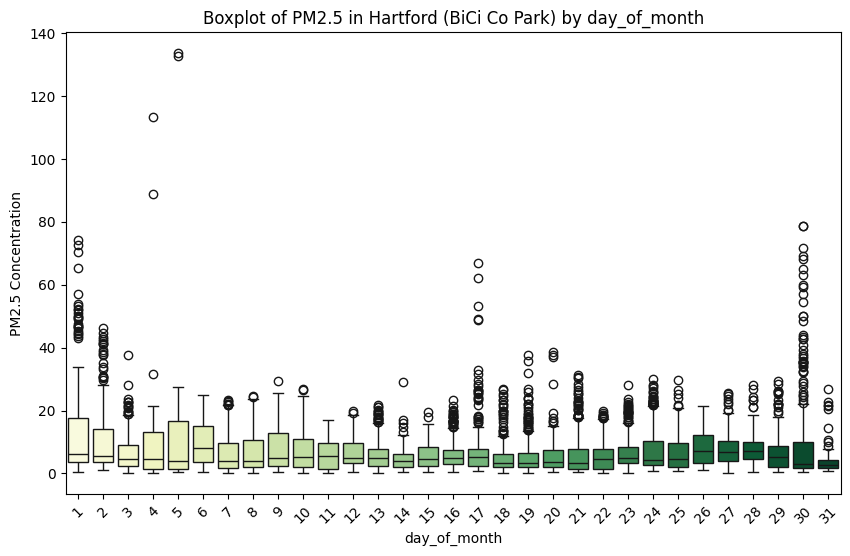

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


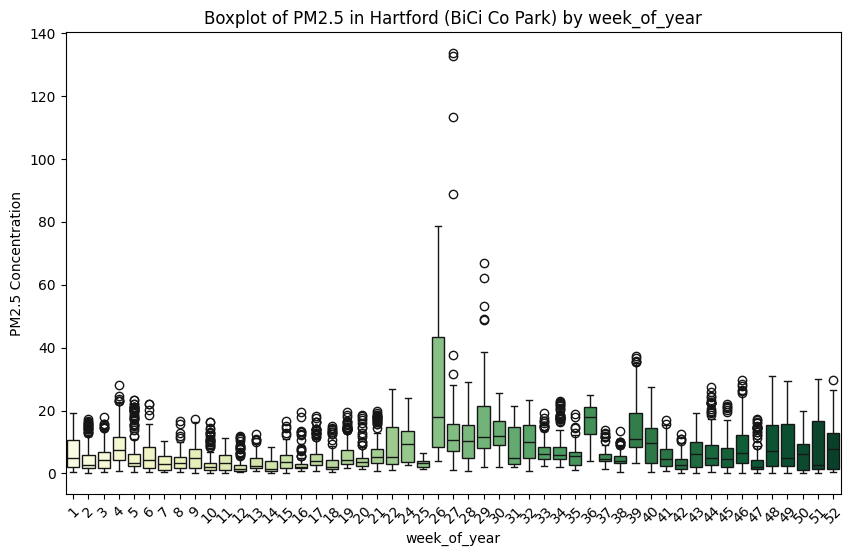

<ipython-input-168-e73b54cc7095>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


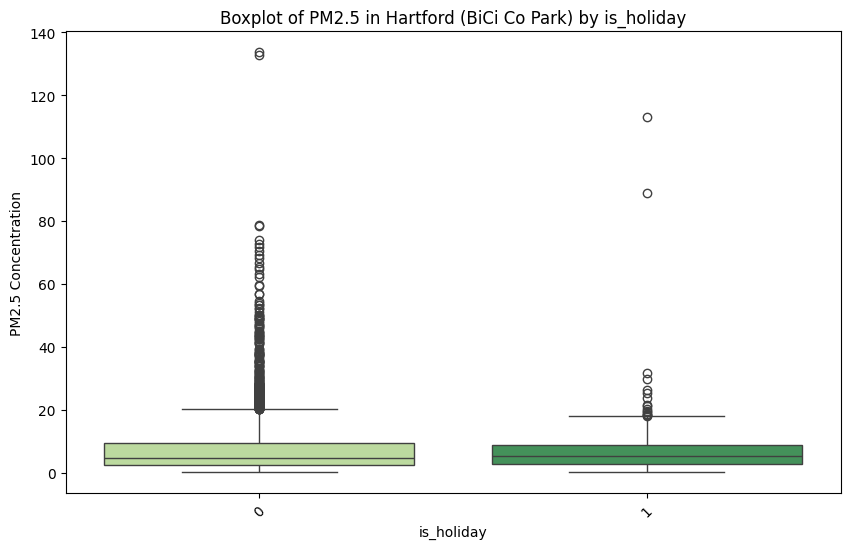

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_h1[col] = pd.Categorical(df_h1[col], categories=sorters[col], ordered=True)
        sorted_data = df_h1.sort_values(by=col)
    else:
        sorted_data = df_h1

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 in Hartford (BiCi Co Park) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


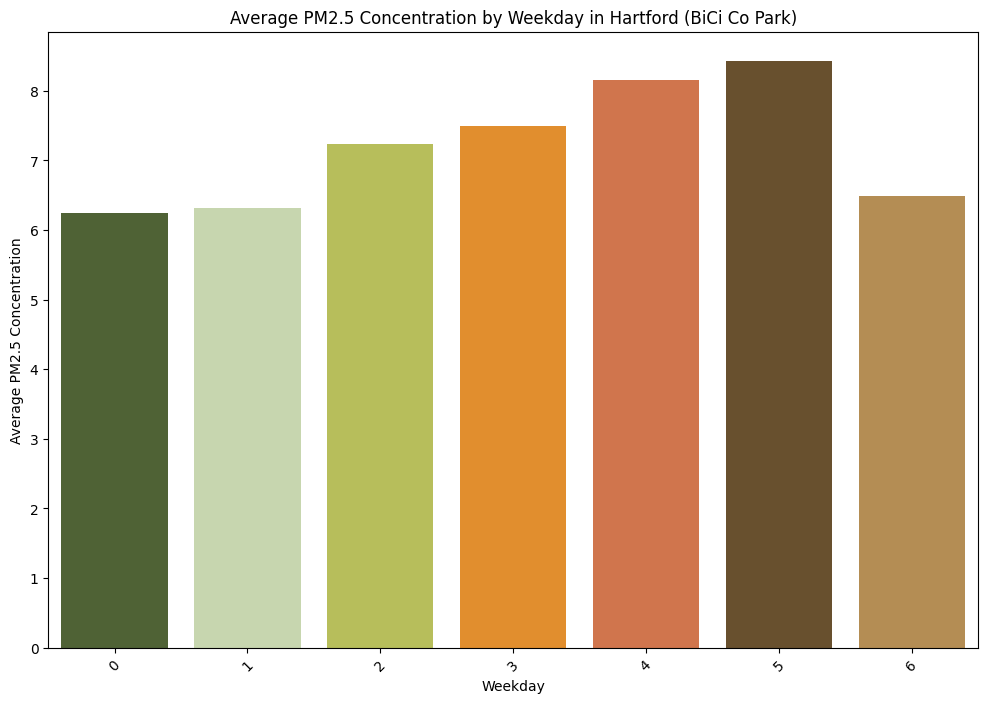

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


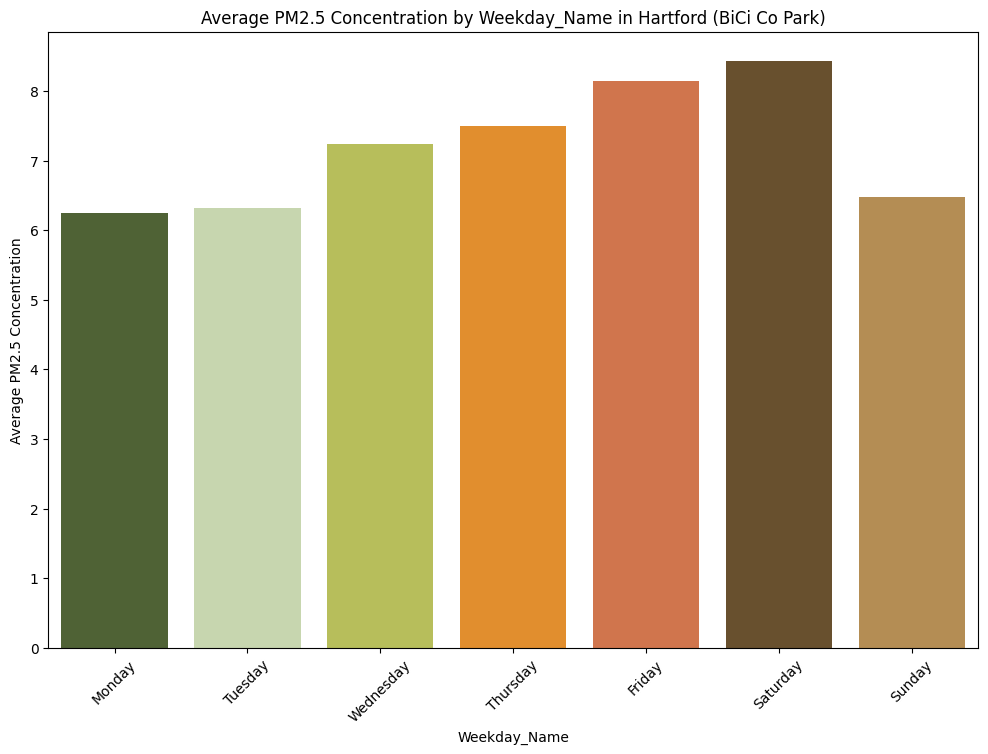

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


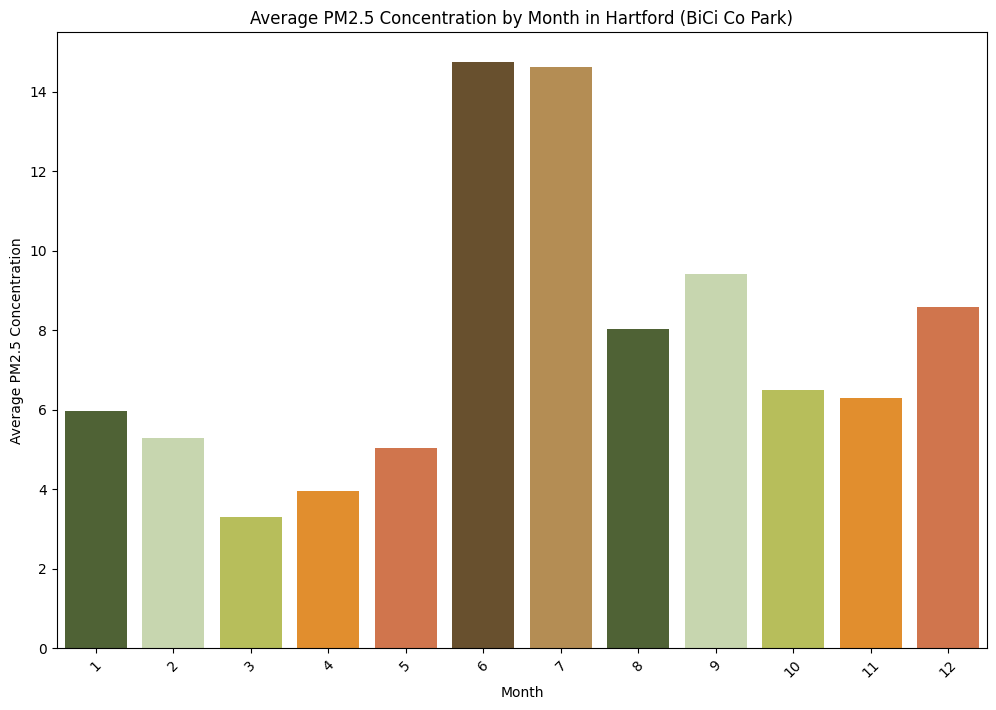

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


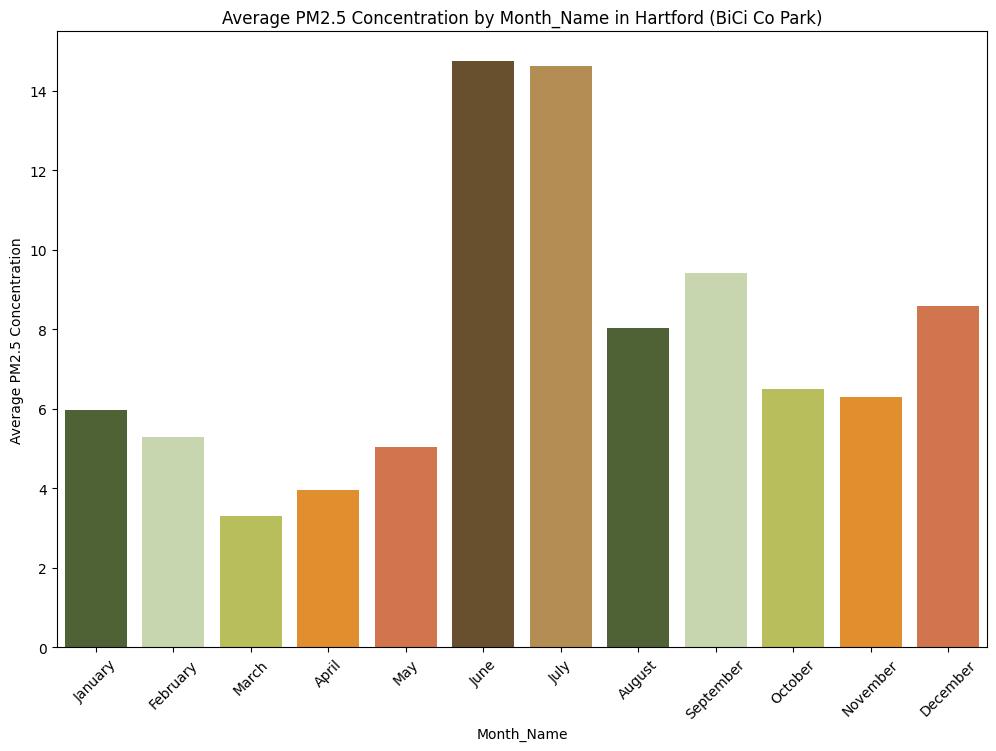

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


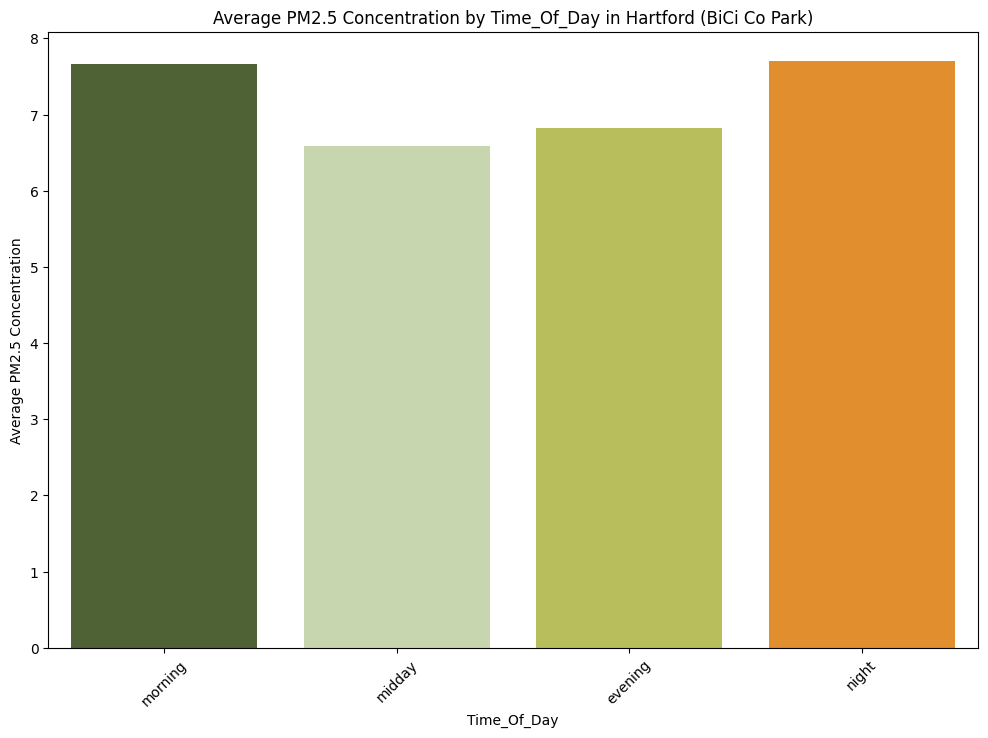

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


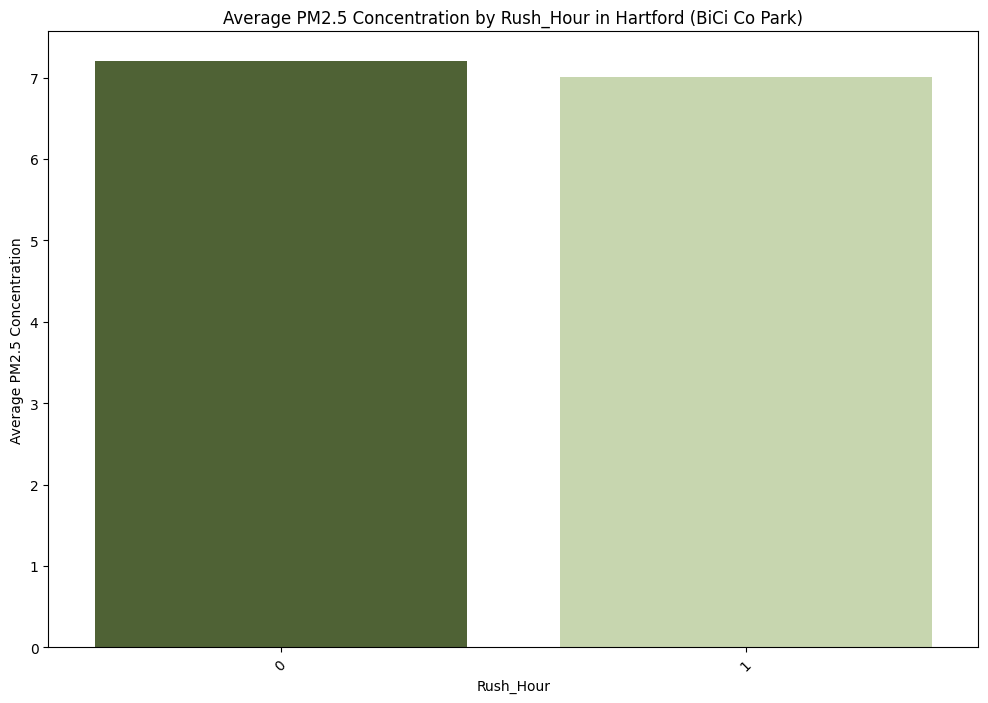

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


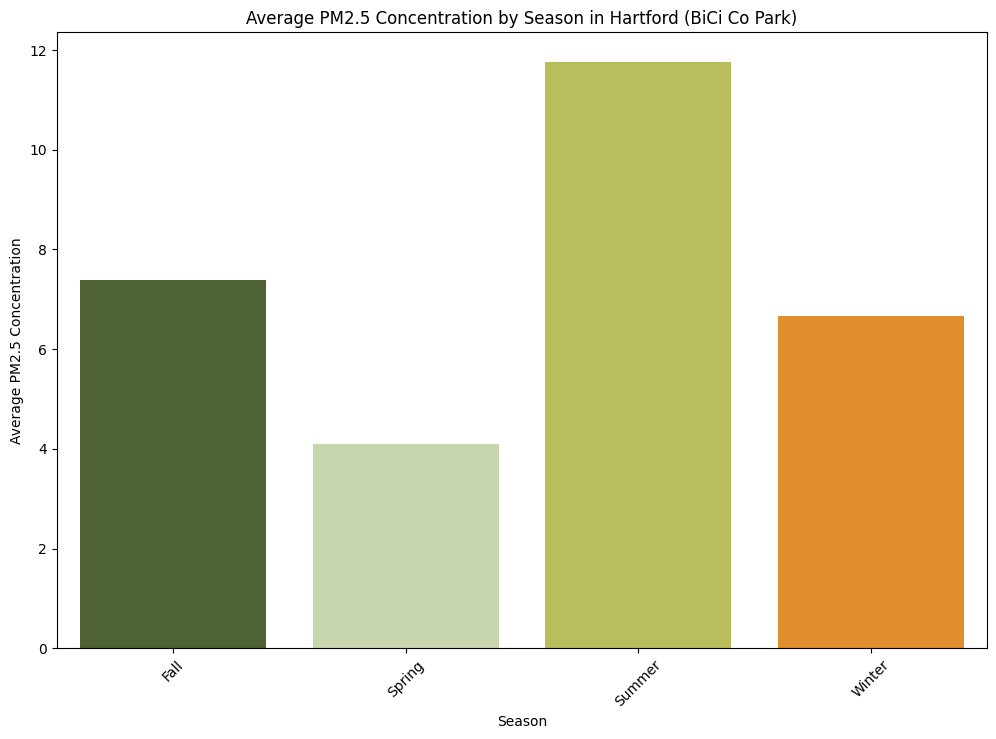

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


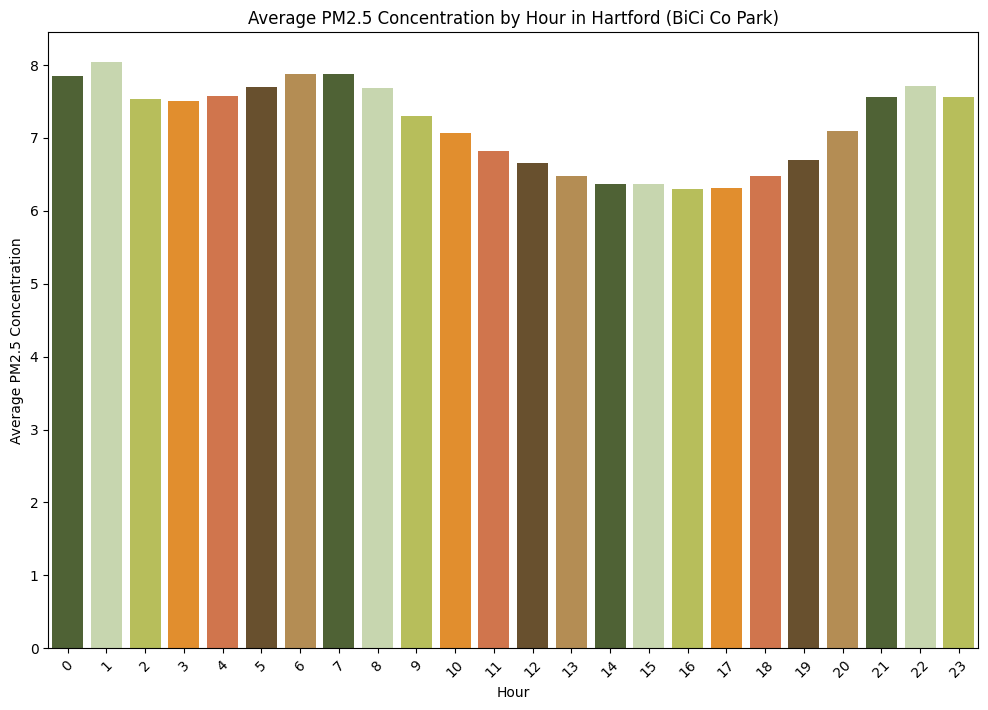

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


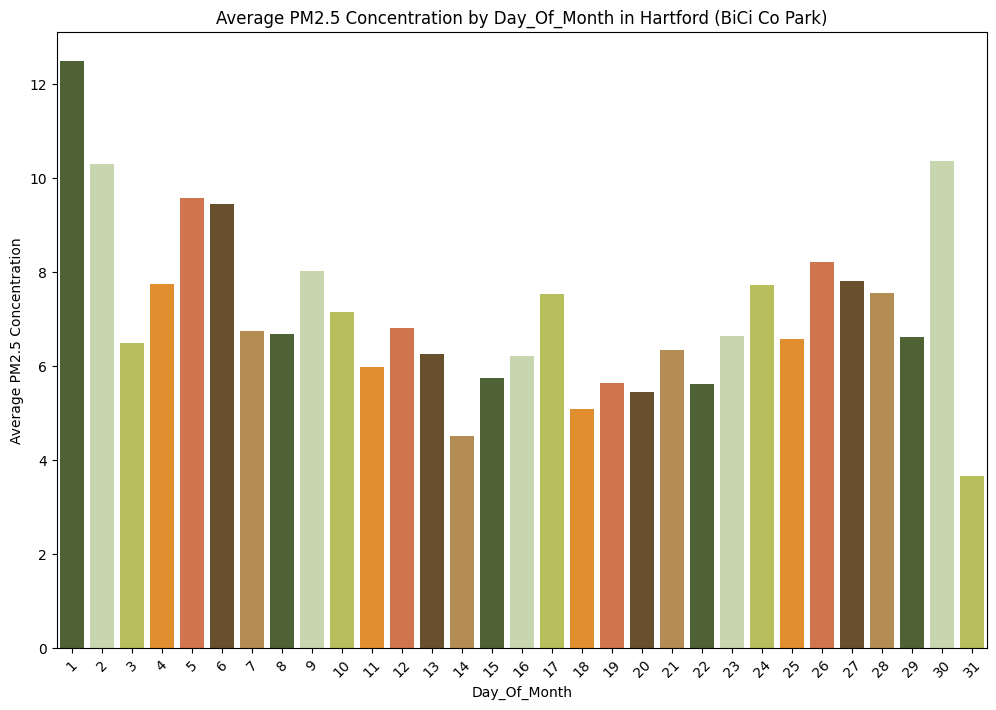

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (51) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


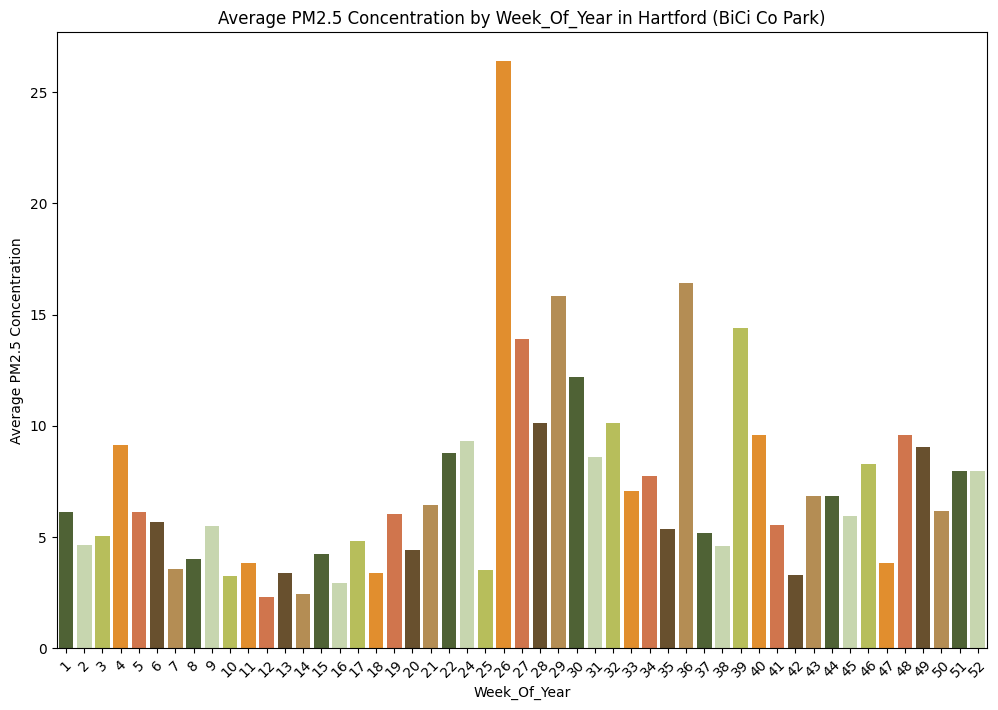

<ipython-input-169-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-169-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


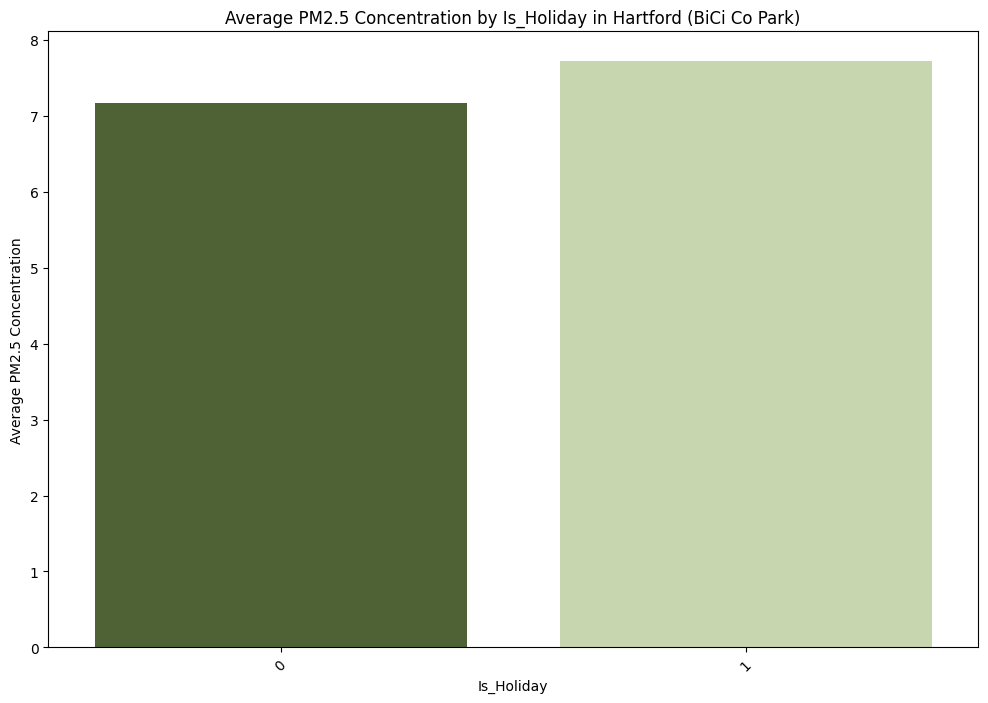

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_h1.groupby(category)['pm2.5_alt'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
    plt.title(f'Average PM2.5 Concentration by {category.title()} in Hartford (BiCi Co Park)')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

## Hartford City Mission (Hartford) pm2.5 and temporal columns

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


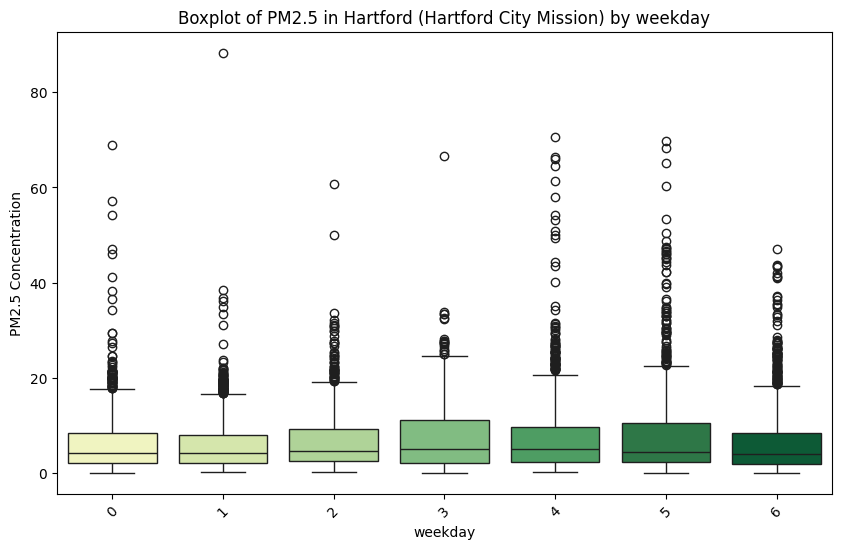

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


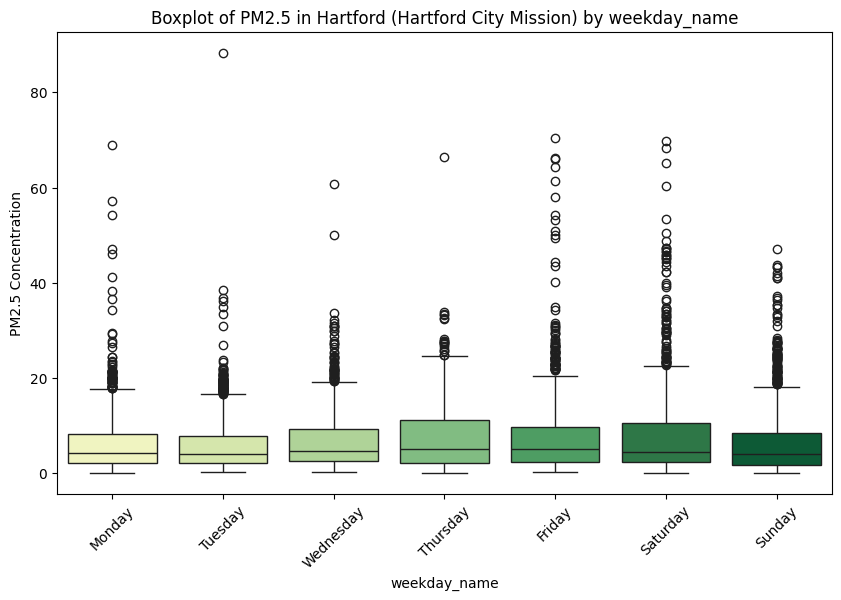

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


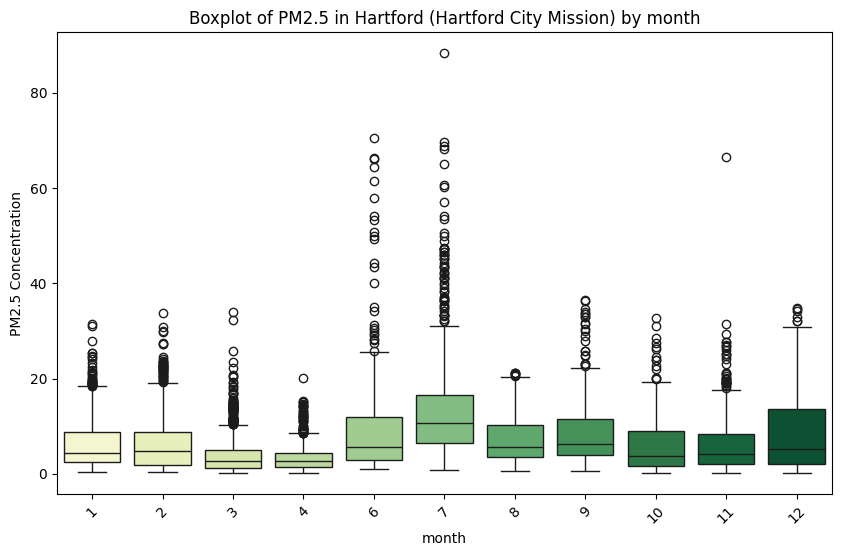

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


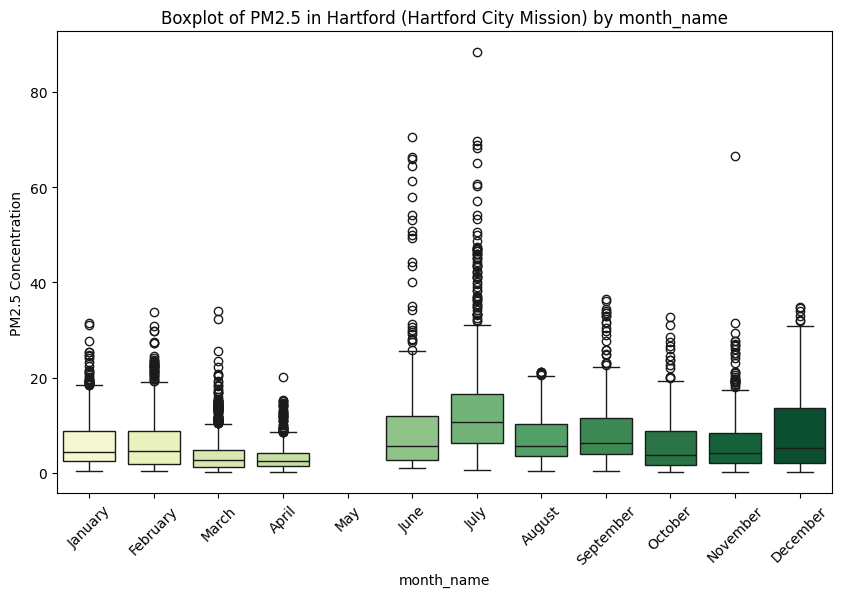

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


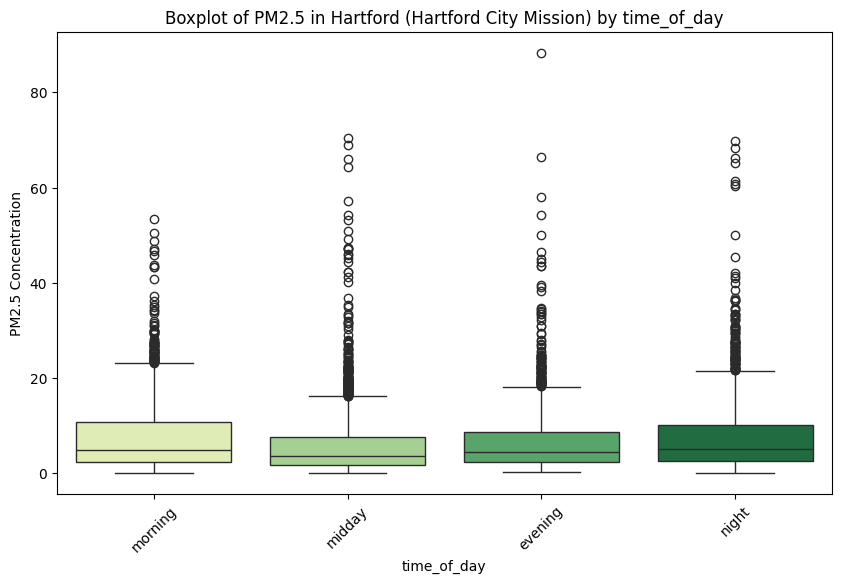

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


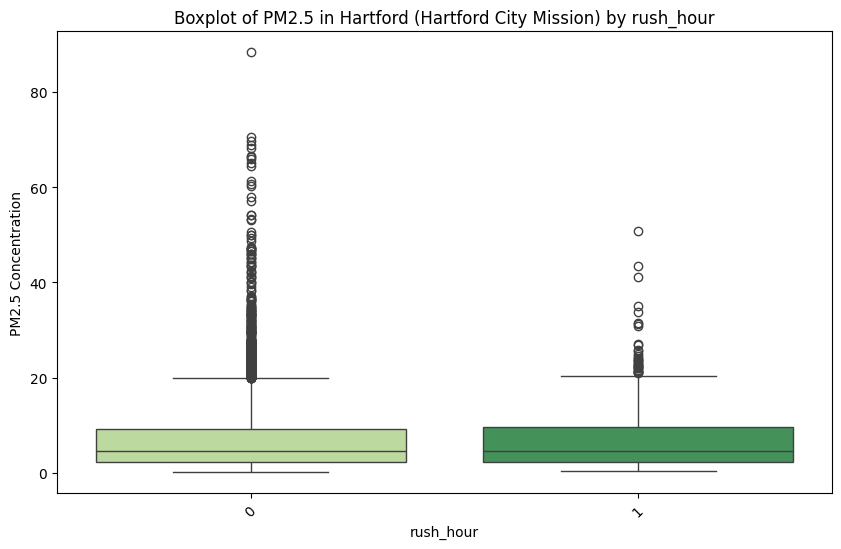

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


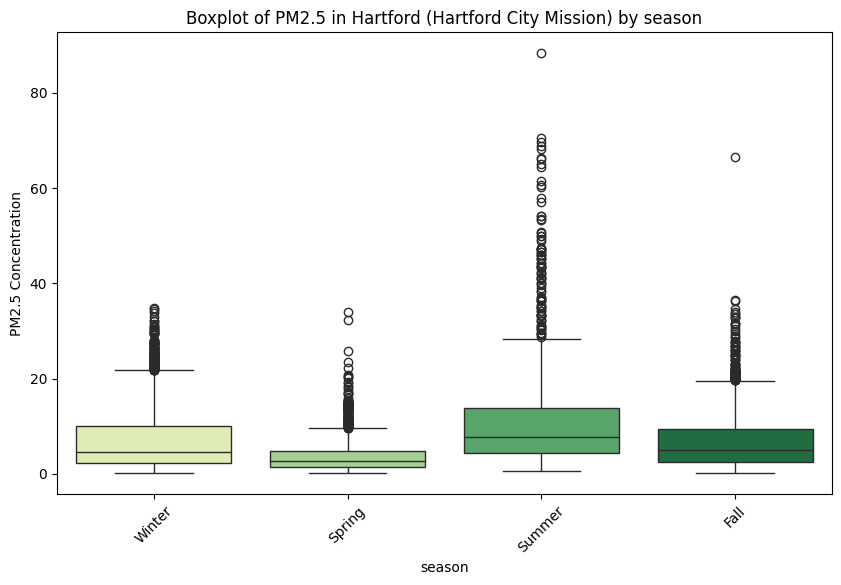

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


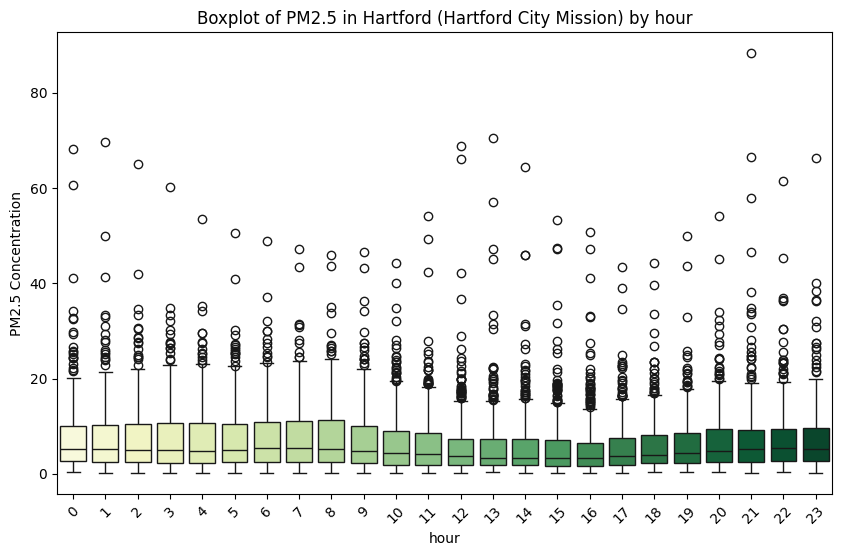

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


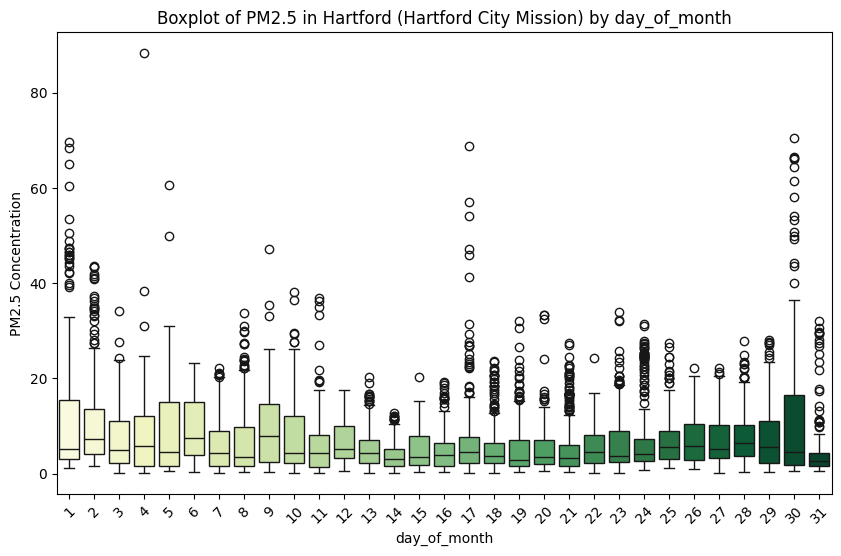

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


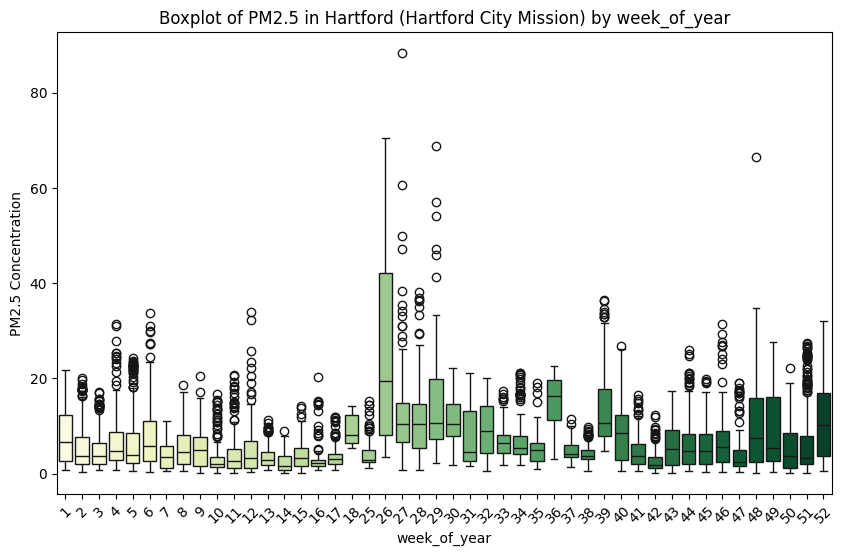

<ipython-input-172-606cda17ffa1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')


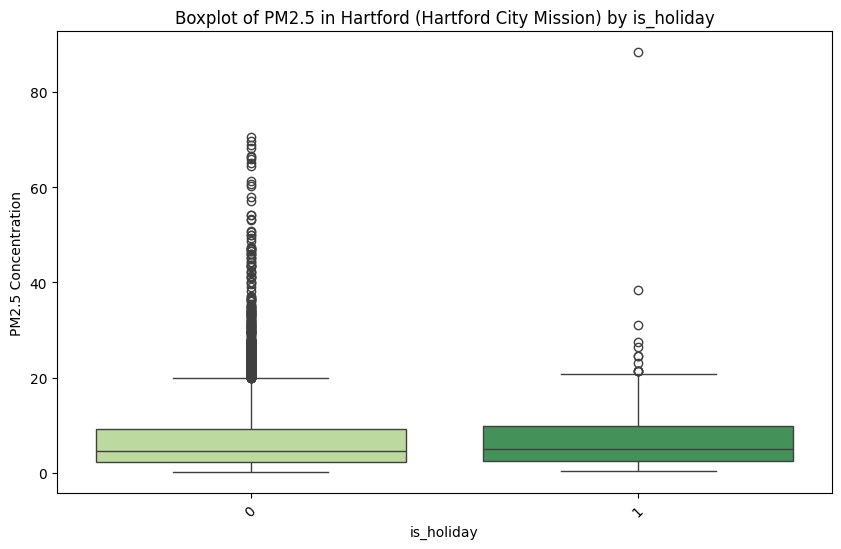

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_h2[col] = pd.Categorical(df_h2[col], categories=sorters[col], ordered=True)
        sorted_data = df_h2.sort_values(by=col)
    else:
        sorted_data = df_h2

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='pm2.5_alt', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 in Hartford (Hartford City Mission) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


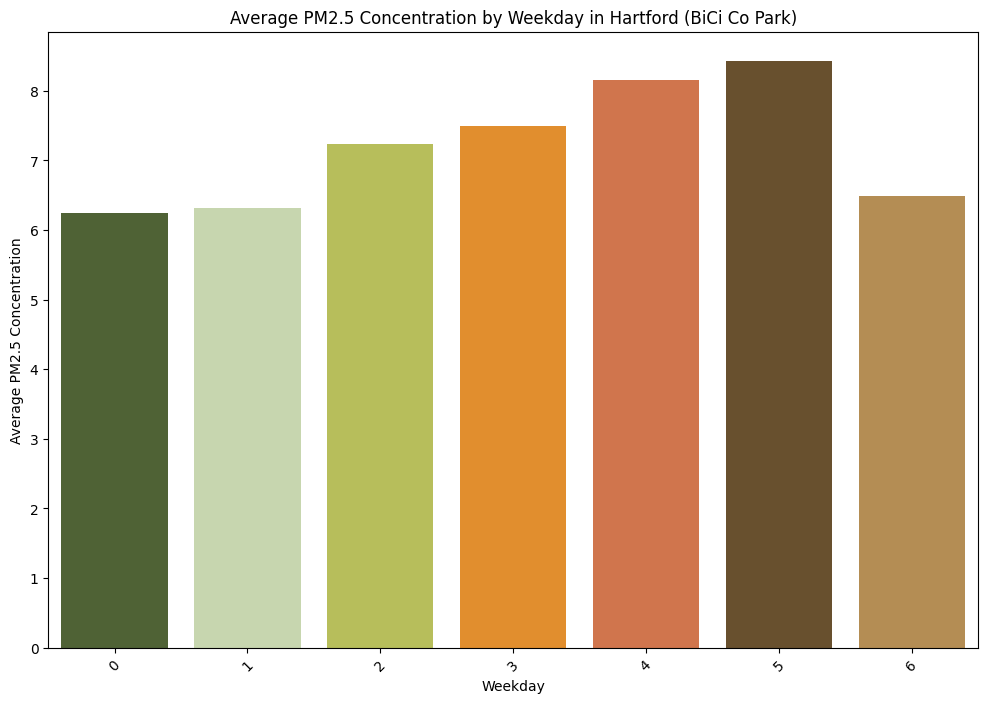

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


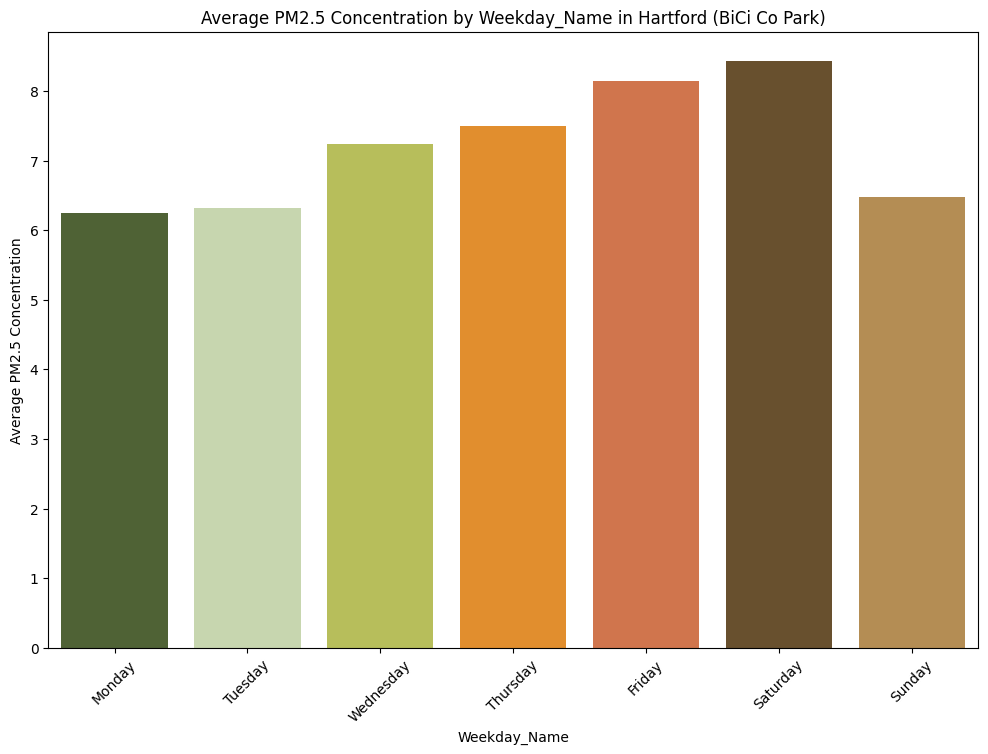

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


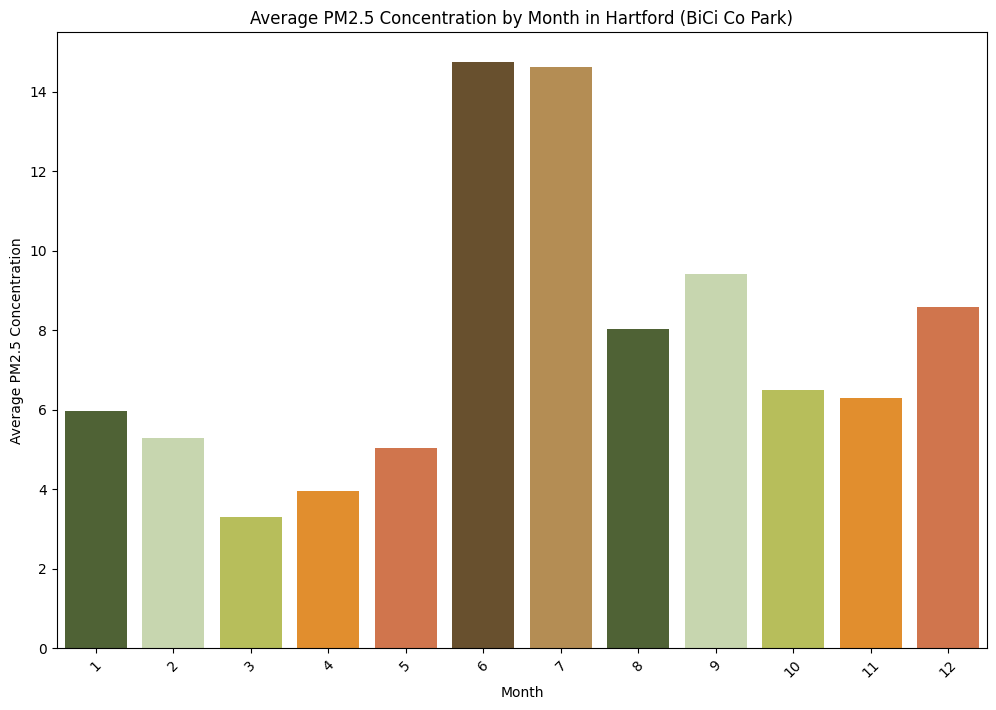

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


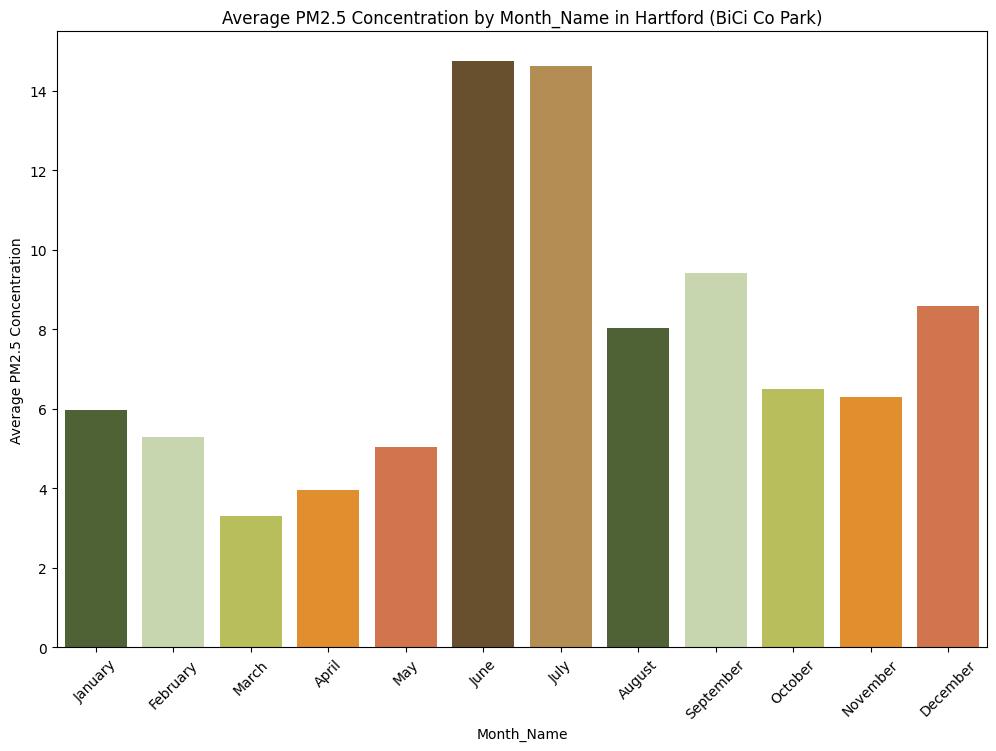

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


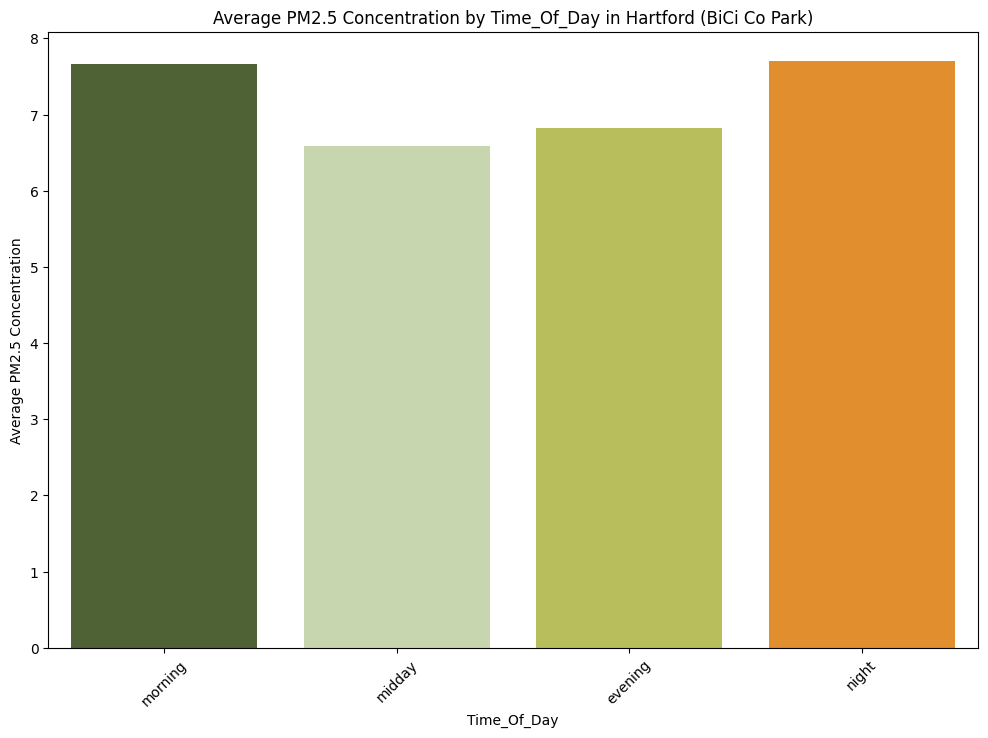

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


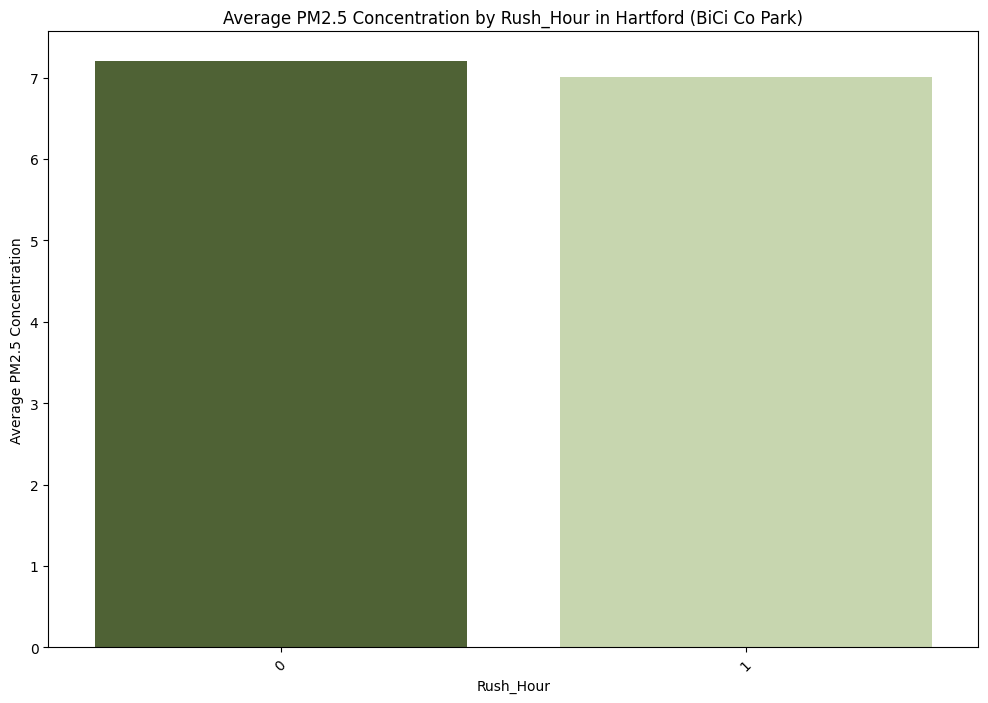

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


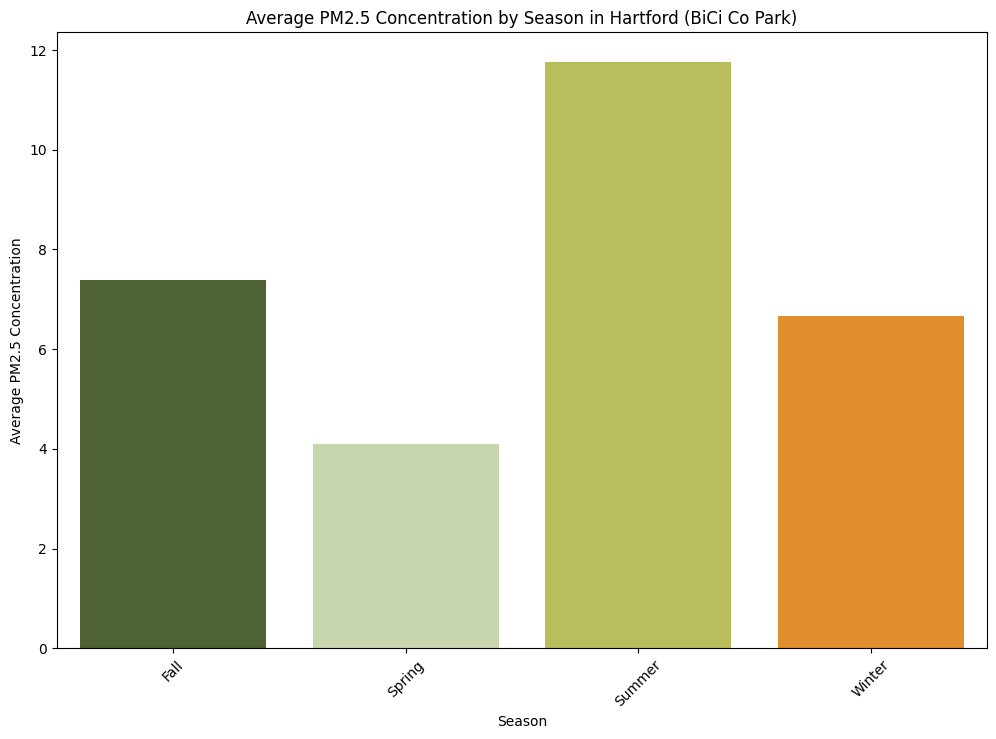

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


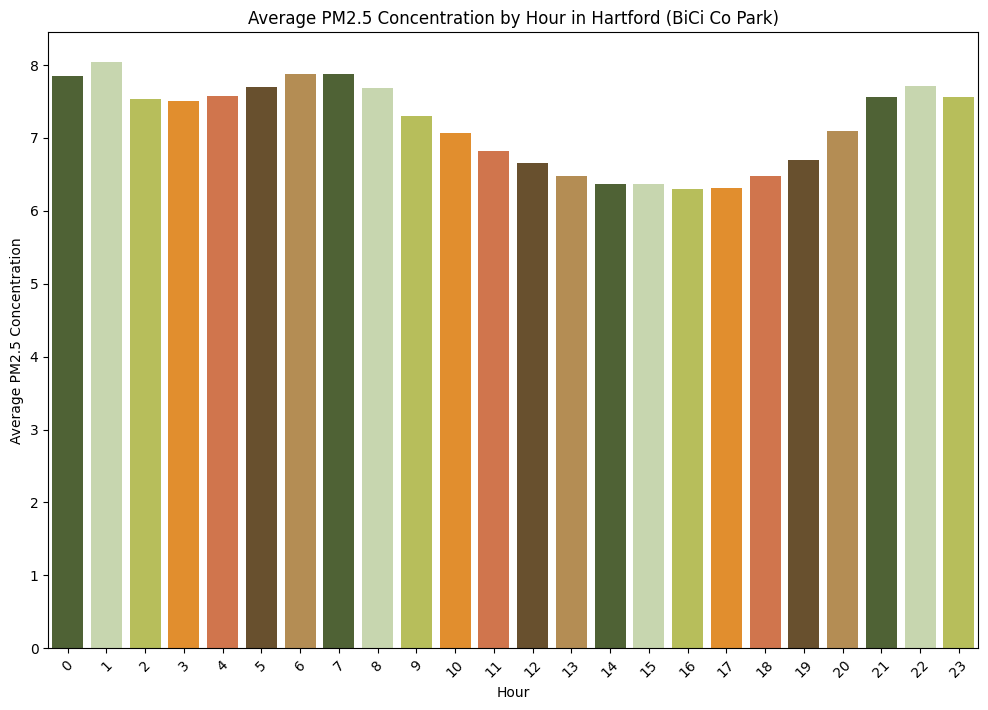

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


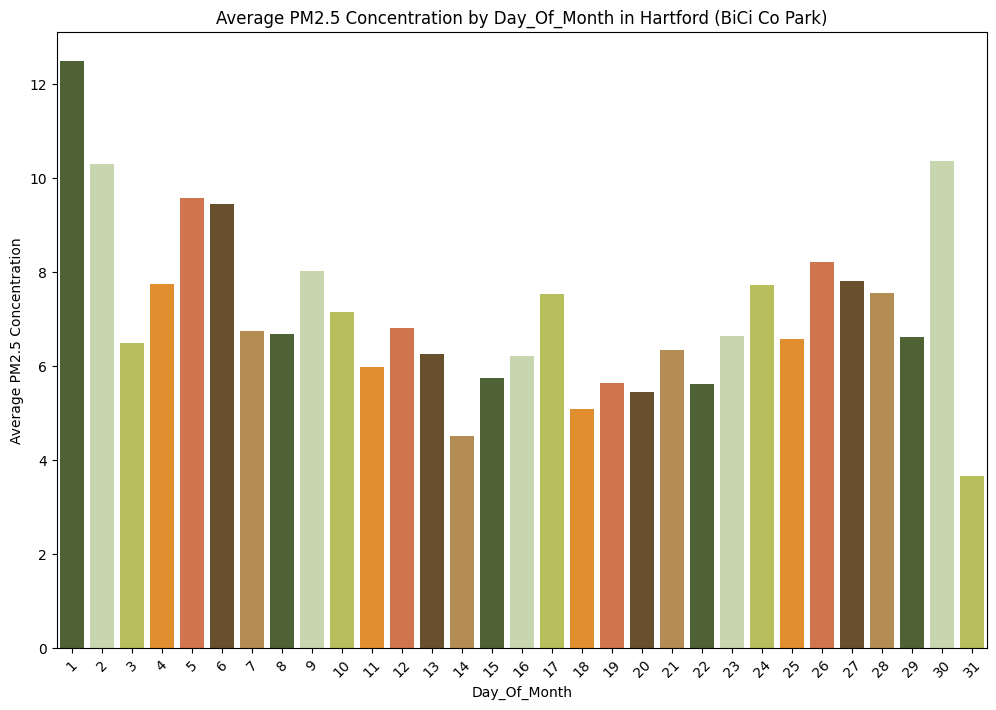

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: 
The palette list has fewer values (7) than needed (51) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


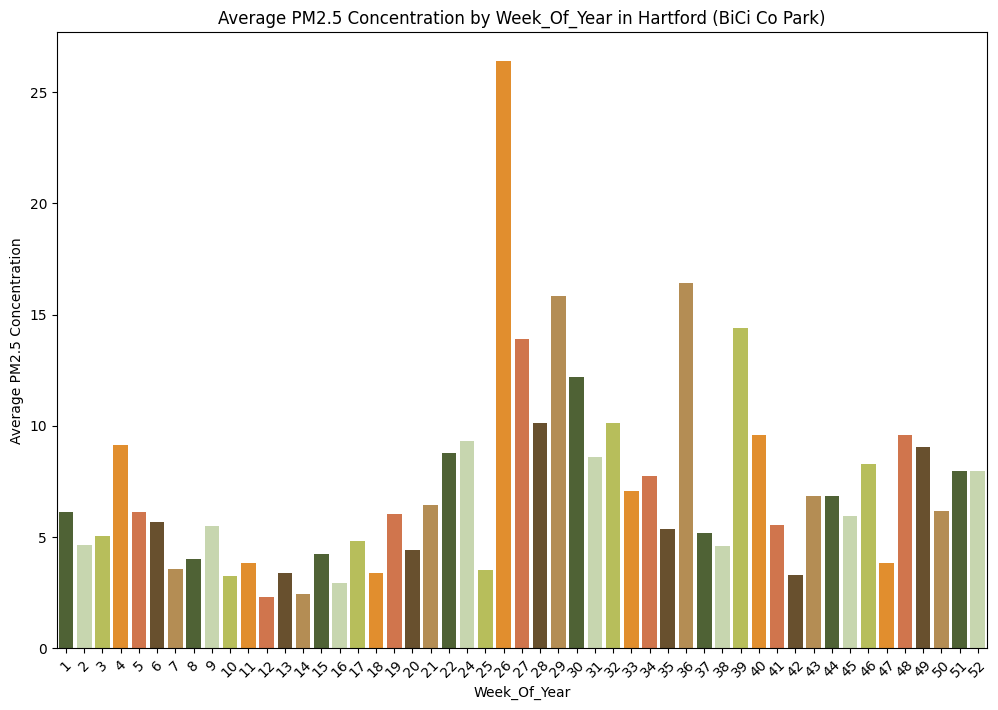

<ipython-input-173-90f0e5465e17>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
<ipython-input-173-90f0e5465e17>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)


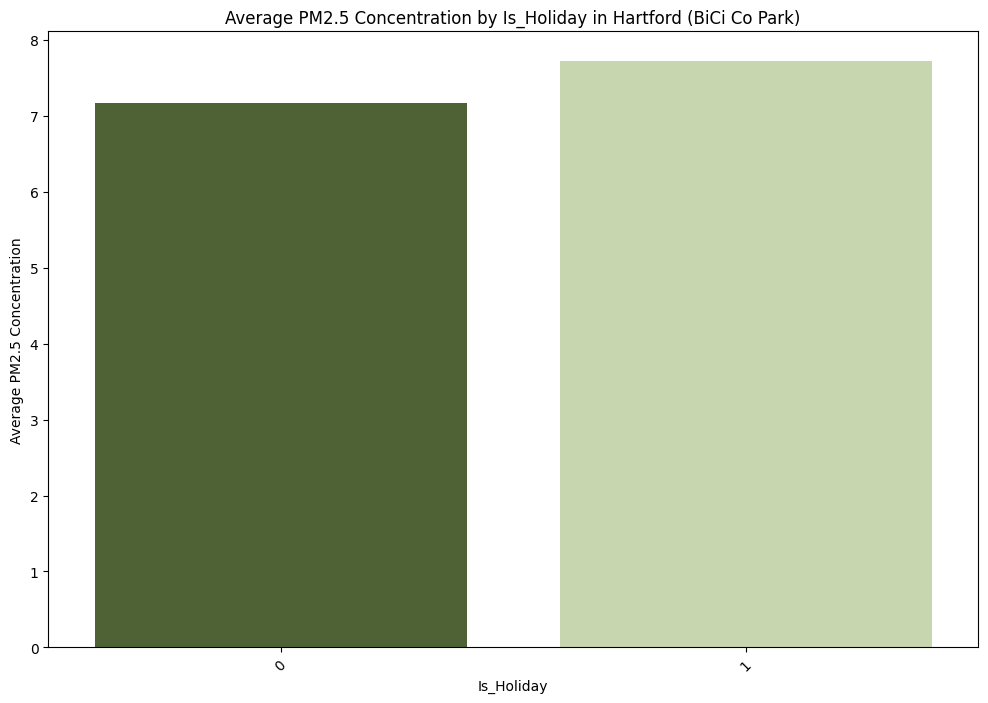

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_h1.groupby(category)['pm2.5_alt'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='pm2.5_alt', palette=palette)
    plt.title(f'Average PM2.5 Concentration by {category.title()} in Hartford (BiCi Co Park)')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

#Combine DF For dashboard implementation

In [ ]:
#rename pm2.5_alt to pm2.5 in all data frames
for name, df in df_dict.items():
    df.rename(columns={'pm2.5_alt': 'pm2.5'}, inplace=True)
    print(df.columns)

Index(['time_stamp', 'humidity', 'temperature', 'pm2.5', 'time_stamp_est',
       'Sensor Number', 'weekday', 'weekday_name', 'month', 'month_name',
       'time_of_day', 'rush_hour', 'season', 'hour', 'day_of_month',
       'week_of_year', 'is_holiday'],
      dtype='object')
Index(['time_stamp', 'humidity', 'temperature', 'pm2.5', 'time_stamp_est',
       'Sensor Number', 'weekday', 'weekday_name', 'month', 'month_name',
       'time_of_day', 'rush_hour', 'season', 'hour', 'day_of_month',
       'week_of_year', 'is_holiday'],
      dtype='object')
Index(['time_stamp', 'humidity', 'temperature', 'pm2.5', 'time_stamp_est',
       'Sensor Number', 'weekday', 'weekday_name', 'month', 'month_name',
       'time_of_day', 'rush_hour', 'season', 'hour', 'day_of_month',
       'week_of_year', 'is_holiday'],
      dtype='object')
Index(['time_stamp', 'humidity', 'temperature', 'pm2.5', 'time_stamp_est',
       'Sensor Number', 'weekday', 'weekday_name', 'month', 'month_name',
       'time_of_d

In [ ]:
df_w1['Sensor Number'] = '109684'
df_w2['Sensor Number'] = '142606'
df_h1['Sensor Number'] = '178869'
df_h2['Sensor Number'] = '51011'

# Combine the data frames into one
combined_df = pd.concat([df_w1, df_w2, df_h1, df_h2], ignore_index=True)

In [ ]:
combined_df

,time_stamp,humidity,temperature,pm2.5,time_stamp_est,Sensor Number,weekday,weekday_name,month,month_name,time_of_day,rush_hour,season,hour,day_of_month,week_of_year,is_holiday
0,2022-11-01 00:00:00,67.000,71.000,5.3,2022-10-31 20:00:00,109684,0,Monday,10,October,evening,0,Fall,20,31,44,0
1,2022-11-01 01:00:00,67.000,71.000,6.1,2022-10-31 21:00:00,109684,0,Monday,10,October,evening,0,Fall,21,31,44,0
2,2022-11-01 02:00:00,67.000,71.000,6.7,2022-10-31 22:00:00,109684,0,Monday,10,October,night,0,Fall,22,31,44,0
3,2022-11-01 03:00:00,67.000,71.000,6.2,2022-10-31 23:00:00,109684,0,Monday,10,October,night,0,Fall,23,31,44,0
4,2022-11-01 04:00:00,67.000,71.000,5.8,2022-11-01 00:00:00,109684,1,Tuesday,11,November,night,0,Fall,0,1,44,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43742,2024-04-29 19:00:00,42.716,82.300,6.2,2024-04-29 15:00:00,51011,0,Monday,4,April,midday,0,Spring,15,29,18,0
43743,2024-04-29 20:00:00,33.667,91.200,5.3,2024-04-29 16:00:00,51011,0,Monday,4,April,midday,1,Spring,16,29,18,0
43744,2024-04-29 21:00:00,36.934,86.834,5.6,2024-04-29 17:00:00,51011,0,Monday,4,April,evening,1,Spring,17,29,18,0
43745,2024-04-29 22:00:00,42.266,81.934,6.5,2024-04-29 18:00:00,51011,0,Monday,4,April,evening,0,Spring,18,29,18,0


In [ ]:
combined_df.to_csv('combined_sensor_data.csv', index=False)

#Merged Data Frame

In [ ]:
df_w1

,time_stamp,humidity,temperature,pm2.5_alt,time_stamp_est,weekday,weekday_name,month,month_name,time_of_day,rush_hour,season,hour,day_of_month,week_of_year,is_holiday
0,2022-11-01 00:00:00,67.0,71.0,5.3,2022-10-31 20:00:00,0,Monday,10,October,evening,0,Fall,20,31,44,0
1,2022-11-01 01:00:00,67.0,71.0,6.1,2022-10-31 21:00:00,0,Monday,10,October,evening,0,Fall,21,31,44,0
2,2022-11-01 02:00:00,67.0,71.0,6.7,2022-10-31 22:00:00,0,Monday,10,October,night,0,Fall,22,31,44,0
3,2022-11-01 03:00:00,67.0,71.0,6.2,2022-10-31 23:00:00,0,Monday,10,October,night,0,Fall,23,31,44,0
4,2022-11-01 04:00:00,67.0,71.0,5.8,2022-11-01 00:00:00,1,Tuesday,11,November,night,0,Fall,0,1,44,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13072,2024-04-29 19:00:00,67.0,71.0,3.4,2024-04-29 15:00:00,0,Monday,4,April,midday,0,Spring,15,29,18,0
13073,2024-04-29 20:00:00,67.0,71.0,3.4,2024-04-29 16:00:00,0,Monday,4,April,midday,1,Spring,16,29,18,0
13074,2024-04-29 21:00:00,67.0,71.0,3.4,2024-04-29 17:00:00,0,Monday,4,April,evening,1,Spring,17,29,18,0
13075,2024-04-29 22:00:00,67.0,71.0,3.8,2024-04-29 18:00:00,0,Monday,4,April,evening,0,Spring,18,29,18,0


In [ ]:
#note in this project we are interested in primarily analyzing pm2.5, so will drop temperature and humidity for now
#make copies for use later
#df_w1_full = df_w1.copy()
#df_w2_full = df_w2.copy()
#df_h2_full = df_h1.copy()
#df_h2_full = df_h2.copy()


#create data frames without temperature and humidity
#df_w1 = df_w1[['time_stamp', 'time_stamp_est', 'pm2.5',
#       'weekday', 'weekday_name', 'month', 'month_name', 'time_of_day',
 #      'rush_hour', 'season', 'hour', 'day_of_month', 'week_of_year',
  #     'is_holiday']]
#df_w2 = df_w2[['time_stamp', 'time_stamp_est', 'pm2.5',
 #      'weekday', 'weekday_name', 'month', 'month_name', 'time_of_day',
  #     'rush_hour', 'season', 'hour', 'day_of_month', 'week_of_year',
   #    'is_holiday']]
#df_h1 = df_h1[['time_stamp', 'time_stamp_est', 'pm2.5',
   #    'weekday', 'weekday_name', 'month', 'month_name', 'time_of_day',
    #   'rush_hour', 'season', 'hour', 'day_of_month', 'week_of_year',
     #  'is_holiday']]
#df_h2 = df_h2[['time_stamp', 'time_stamp_est', 'pm2.5',
      # 'weekday', 'weekday_name', 'month', 'month_name', 'time_of_day',
      # 'rush_hour', 'season', 'hour', 'day_of_month', 'week_of_year',
      # 'is_holiday']]

In [ ]:
#note columns to merge on:
columns_to_merge_on = ['time_stamp', 'time_stamp_est', 'weekday', 'weekday_name',
                       'month', 'month_name', 'time_of_day', 'rush_hour', 'season',
                       'hour', 'day_of_month', 'week_of_year', 'is_holiday']

In [ ]:
#Rename columns to be unique to data frame
#Rename 'pm2.5', 'humidity', and 'temperature' columns in each DataFrame before merging
df_w1.rename(columns={
    'pm2.5': 'pm2.5_w1',
    'humidity': 'humidity_w1',
    'temperature': 'temperature_w1'
}, inplace=True)

df_w2.rename(columns={
    'pm2.5': 'pm2.5_w2',
    'humidity': 'humidity_w2',
    'temperature': 'temperature_w2'
}, inplace=True)

df_h1.rename(columns={
    'pm2.5': 'pm2.5_h1',
    'humidity': 'humidity_h1',
    'temperature': 'temperature_h1'
}, inplace=True)

df_h2.rename(columns={
    'pm2.5': 'pm2.5_h2',
    'humidity': 'humidity_h2',
    'temperature': 'temperature_h2'
}, inplace=True)

In [ ]:
# Merge all DataFrames on 'time_stamp' using an outer join to ensure all timestamps are included
df_final = pd.merge(df_w1, df_w2, on='time_stamp', how='outer', suffixes=('', '_dup'))
df_final = pd.merge(df_final, df_h1, on='time_stamp', how='outer', suffixes=('', '_dup'))
df_final = pd.merge(df_final, df_h2, on='time_stamp', how='outer', suffixes=('', '_dup'))

# Ensure no columns are duplicated
df_final = df_final.loc[:,~df_final.columns.duplicated()]

# Clean up any duplicate columns that might have been created due to overlapping non-key columns
columns_to_check = df_final.columns.str.endswith('_dup')
duplicate_columns = df_final.columns[columns_to_check]
for dup_col in duplicate_columns:
    original_col = dup_col.replace('_dup', '')
    # Ensure both columns are Series; check if any are DataFrames indicating duplicate names
    if isinstance(df_final[original_col], pd.DataFrame) or isinstance(df_final[dup_col], pd.DataFrame):
        df_final[original_col] = df_final[original_col].bfill(axis=1).iloc[:, 0]  # Backfill from '_dup'
    else:
        # Use fillna with Series correctly
        df_final[original_col].fillna(df_final[dup_col], inplace=True)
    # Drop the '_dup' column as it's no longer needed
    df_final.drop(columns=[dup_col], inplace=True)

# Reorder and print Data Frame
df_final = df_final[['time_stamp', 'time_stamp_est', 'pm2.5_w1', 'pm2.5_w2', 'pm2.5_h1', 'pm2.5_h2', 'weekday', 'weekday_name', 'month', 'month_name',
       'time_of_day', 'rush_hour', 'season', 'hour', 'day_of_month','week_of_year', 'is_holiday', 'temperature_w1', 'temperature_w2', 'temperature_h1', 'temperature_h2',
        'humidity_w1', 'humidity_w2', 'humidity_h1', 'humidity_h2']]
df_final

,time_stamp,time_stamp_est,pm2.5_w1,pm2.5_w2,pm2.5_h1,pm2.5_h2,weekday,weekday_name,month,month_name,...,week_of_year,is_holiday,temperature_w1,temperature_w2,temperature_h1,temperature_h2,humidity_w1,humidity_w2,humidity_h1,humidity_h2
0,2022-11-01 00:00:00,2022-10-31 20:00:00,5.3,7.8,NaN,NaN,0.0,Monday,10.0,October,...,44,0.0,71.0,64.534,NaN,NaN,67.0,58.034,NaN,NaN
1,2022-11-01 01:00:00,2022-10-31 21:00:00,6.1,8.6,NaN,NaN,0.0,Monday,10.0,October,...,44,0.0,71.0,64.000,NaN,NaN,67.0,59.767,NaN,NaN
2,2022-11-01 02:00:00,2022-10-31 22:00:00,6.7,9.6,NaN,NaN,0.0,Monday,10.0,October,...,44,0.0,71.0,63.334,NaN,NaN,67.0,61.900,NaN,NaN
3,2022-11-01 03:00:00,2022-10-31 23:00:00,6.2,8.4,NaN,NaN,0.0,Monday,10.0,October,...,44,0.0,71.0,62.900,NaN,NaN,67.0,64.067,NaN,NaN
4,2022-11-01 04:00:00,2022-11-01 00:00:00,5.8,8.2,NaN,NaN,1.0,Tuesday,11.0,November,...,44,0.0,71.0,62.833,NaN,NaN,67.0,65.800,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13101,2024-03-24 08:00:00,2024-03-24 04:00:00,NaN,1.9,1.8,2.2,6.0,Sunday,3.0,March,...,12,0.0,NaN,29.934,NaN,32.034,NaN,52.133,NaN,48.558
13102,2024-03-24 09:00:00,2024-03-24 05:00:00,NaN,1.6,1.2,1.4,6.0,Sunday,3.0,March,...,12,0.0,NaN,29.634,NaN,31.534,NaN,48.667,NaN,43.400
13103,2024-03-24 10:00:00,2024-03-24 06:00:00,NaN,1.1,0.9,1.2,6.0,Sunday,3.0,March,...,12,0.0,NaN,29.133,NaN,31.000,NaN,45.067,NaN,42.566
13104,2024-03-24 11:00:00,2024-03-24 07:00:00,NaN,1.0,0.9,1.1,6.0,Sunday,3.0,March,...,12,0.0,NaN,29.133,NaN,30.966,NaN,45.367,NaN,42.367


#Creating Paired Difference Data Frame

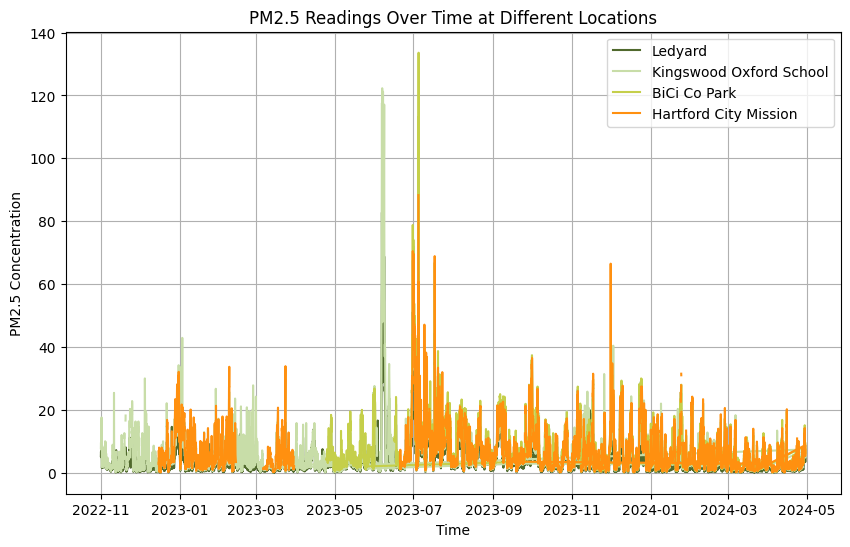

In [ ]:
#Plot merged data frame over time
# Plotting each pm2.5 reading over time
plt.figure(figsize=(10, 6))
plt.plot(df_final['time_stamp_est'], df_final['pm2.5_w1'], label='Ledyard', color=palette[0])
plt.plot(df_final['time_stamp_est'], df_final['pm2.5_w2'], label='Kingswood Oxford School', color=palette[1])
plt.plot(df_final['time_stamp_est'], df_final['pm2.5_h1'], label='BiCi Co Park', color=palette[2])
plt.plot(df_final['time_stamp_est'], df_final['pm2.5_h2'], label='Hartford City Mission', color=palette[3])

# Adding labels, title and legend
plt.xlabel('Time')
plt.ylabel('PM2.5 Concentration')
plt.title('PM2.5 Readings Over Time at Different Locations')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

In [ ]:
# Calculate the PM2.5 differences correctly using the renamed columns; note the variable names are realllly long, but for the purpose of this project we will keep them for clarity
df_final['PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)'] = df_final['pm2.5_h1'] - df_final['pm2.5_w1']
df_final['PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)'] = df_final['pm2.5_h1'] - df_final['pm2.5_w2']
df_final['PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)'] = df_final['pm2.5_h2'] - df_final['pm2.5_w1']
df_final['PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)'] = df_final['pm2.5_h2'] - df_final['pm2.5_w2']
df_final['PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)'] = df_final['pm2.5_w1'] - df_final['pm2.5_w2']
df_final['PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)'] = df_final['pm2.5_h1'] - df_final['pm2.5_h2']

# Ensure all columns for the differences are correctly labeled and added to the final DataFrame
df_diff = df_final[columns_to_merge_on + [
    'PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)',
    'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)',
    'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)',
    'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)',
    'PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)',
    'PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)'
]]

# Print difference DataFrame
df_diff


,time_stamp,time_stamp_est,weekday,weekday_name,month,month_name,time_of_day,rush_hour,season,hour,day_of_month,week_of_year,is_holiday,PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard),PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School),PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard),PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School),PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School),PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)
0,2022-11-01 00:00:00,2022-10-31 20:00:00,0.0,Monday,10.0,October,evening,0.0,Fall,20.0,31.0,44,0.0,NaN,NaN,NaN,NaN,-2.5,NaN
1,2022-11-01 01:00:00,2022-10-31 21:00:00,0.0,Monday,10.0,October,evening,0.0,Fall,21.0,31.0,44,0.0,NaN,NaN,NaN,NaN,-2.5,NaN
2,2022-11-01 02:00:00,2022-10-31 22:00:00,0.0,Monday,10.0,October,night,0.0,Fall,22.0,31.0,44,0.0,NaN,NaN,NaN,NaN,-2.9,NaN
3,2022-11-01 03:00:00,2022-10-31 23:00:00,0.0,Monday,10.0,October,night,0.0,Fall,23.0,31.0,44,0.0,NaN,NaN,NaN,NaN,-2.2,NaN
4,2022-11-01 04:00:00,2022-11-01 00:00:00,1.0,Tuesday,11.0,November,night,0.0,Fall,0.0,1.0,44,0.0,NaN,NaN,NaN,NaN,-2.4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13101,2024-03-24 08:00:00,2024-03-24 04:00:00,6.0,Sunday,3.0,March,morning,0.0,Spring,4.0,24.0,12,0.0,NaN,-0.1,NaN,0.3,NaN,-0.4
13102,2024-03-24 09:00:00,2024-03-24 05:00:00,6.0,Sunday,3.0,March,morning,0.0,Spring,5.0,24.0,12,0.0,NaN,-0.4,NaN,-0.2,NaN,-0.2
13103,2024-03-24 10:00:00,2024-03-24 06:00:00,6.0,Sunday,3.0,March,morning,0.0,Spring,6.0,24.0,12,0.0,NaN,-0.2,NaN,0.1,NaN,-0.3
13104,2024-03-24 11:00:00,2024-03-24 07:00:00,6.0,Sunday,3.0,March,morning,0.0,Spring,7.0,24.0,12,0.0,NaN,-0.1,NaN,0.1,NaN,-0.2


In [ ]:
#check null value count due to missing dates:
df_diff.isnull().sum()

time_stamp                                                                                           0
time_stamp_est                                                                                       0
weekday                                                                                              0
weekday_name                                                                                         0
month                                                                                                0
month_name                                                                                           0
time_of_day                                                                                          0
rush_hour                                                                                            0
season                                                                                               0
hour                                                                     

In [ ]:
#save as csv
df_diff.to_csv('PM2.5_Differences.csv', index=False)

#Exploratory Data Analysis - Differences

In [ ]:
df_diff.columns

Index(['time_stamp', 'time_stamp_est', 'weekday', 'weekday_name', 'month',
       'month_name', 'time_of_day', 'rush_hour', 'season', 'hour',
       'day_of_month', 'week_of_year', 'is_holiday',
       'PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)',
       'PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)',
       'PM2.5 Difference (BiCi Co Park and Hartford City Mission)'],
      dtype='object')

##PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


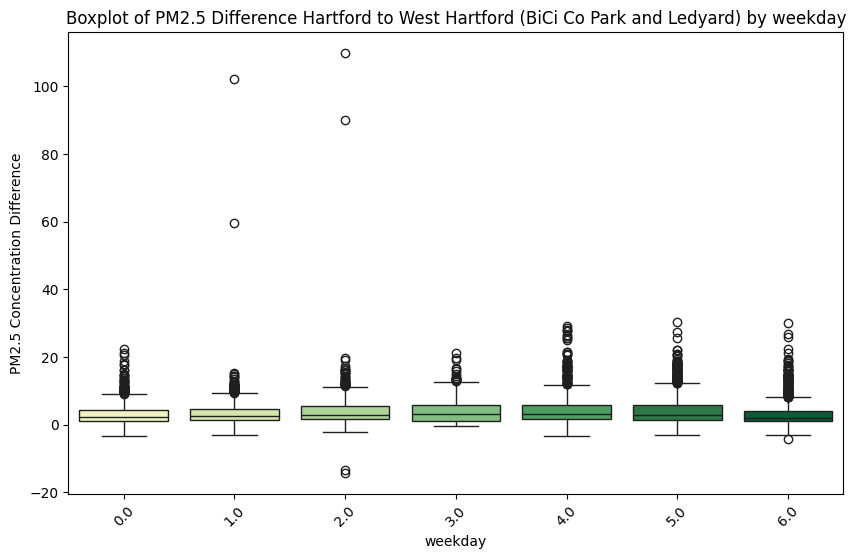

<ipython-input-263-429138df44fb>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


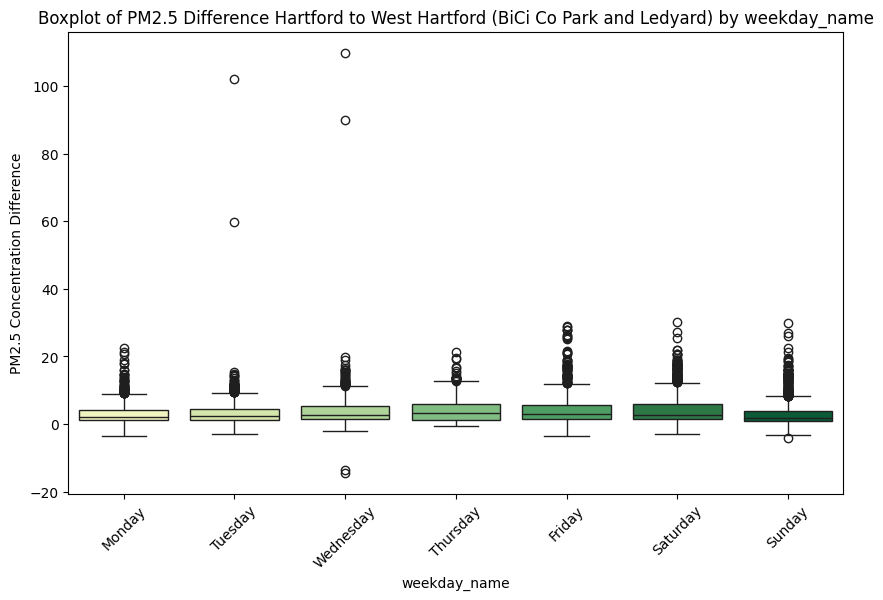

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


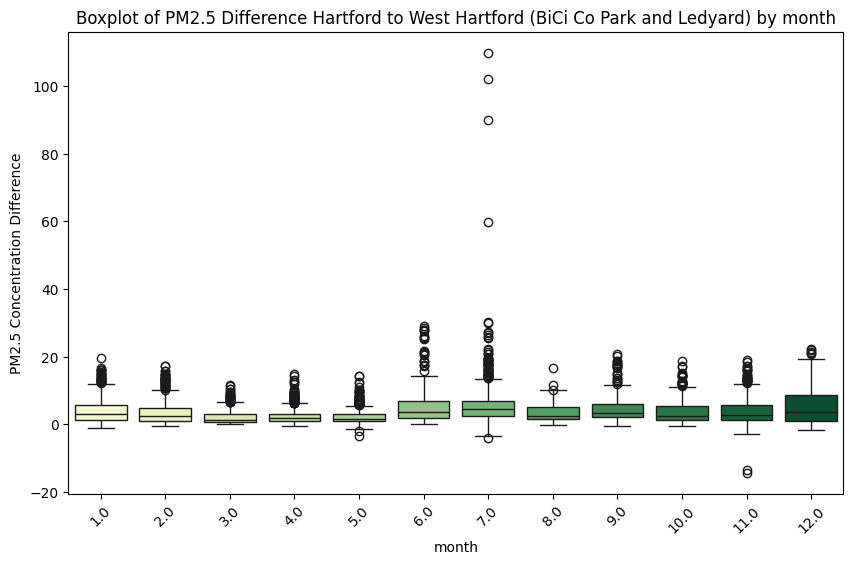

<ipython-input-263-429138df44fb>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


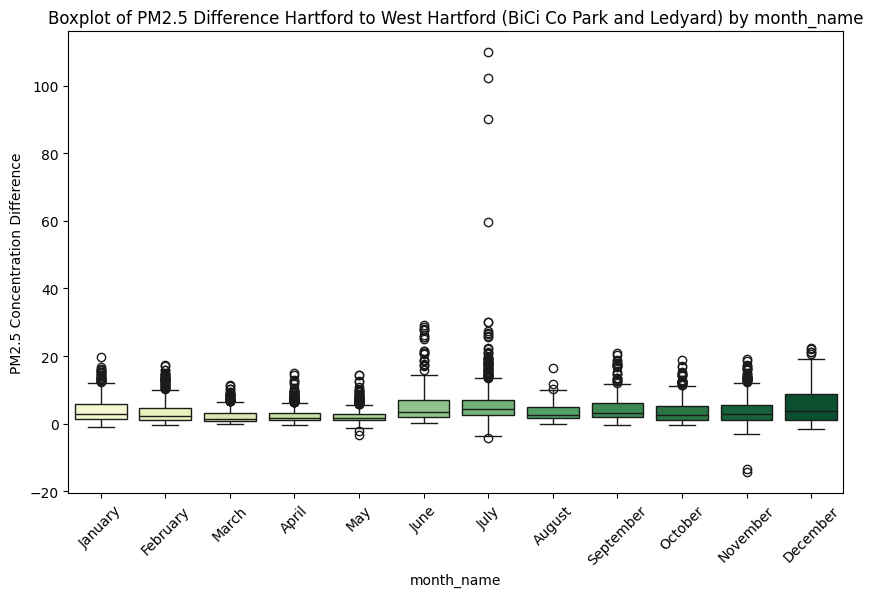

<ipython-input-263-429138df44fb>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


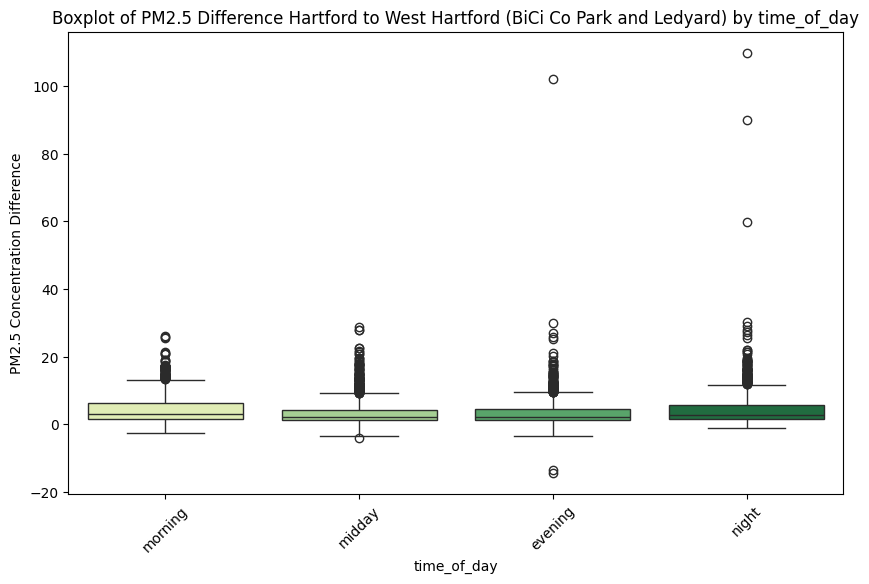

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


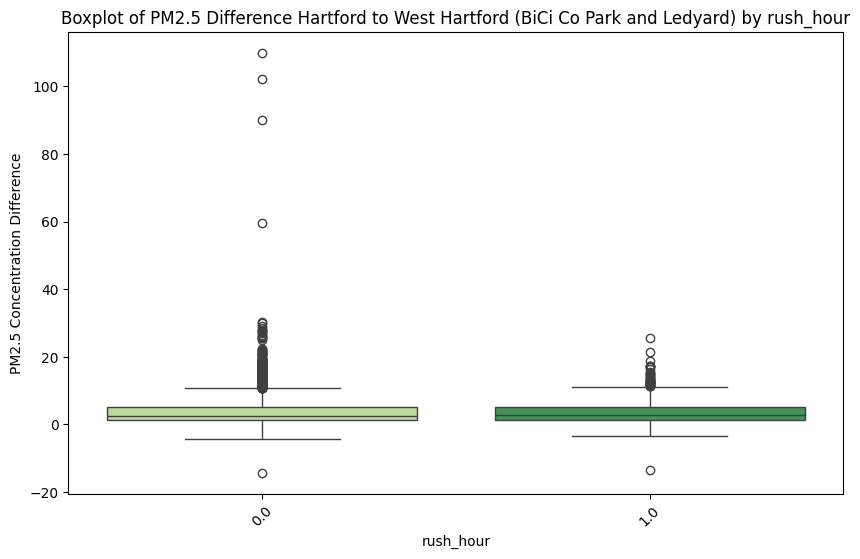

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


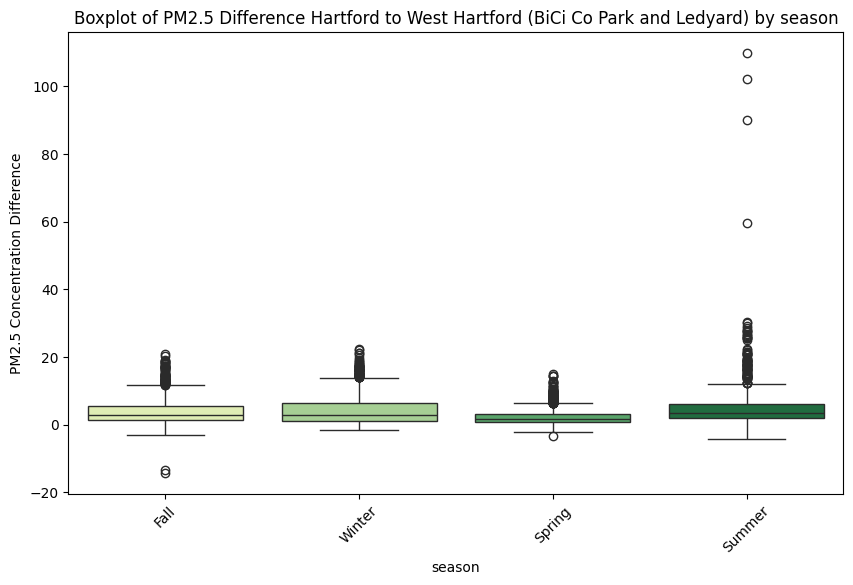

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


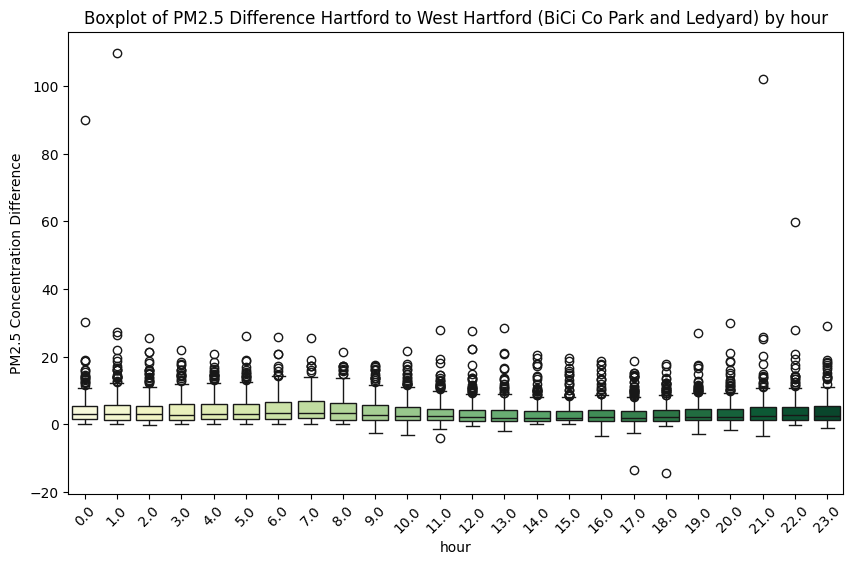

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


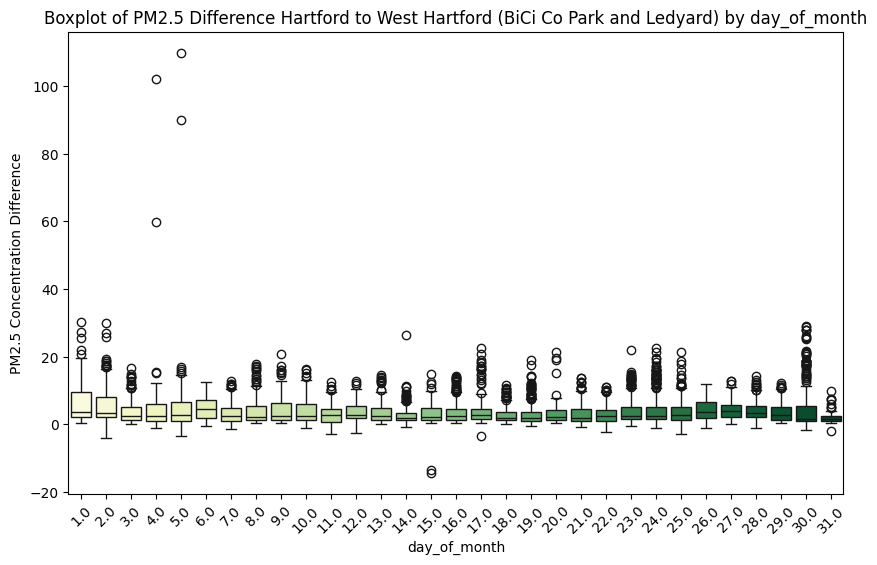

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


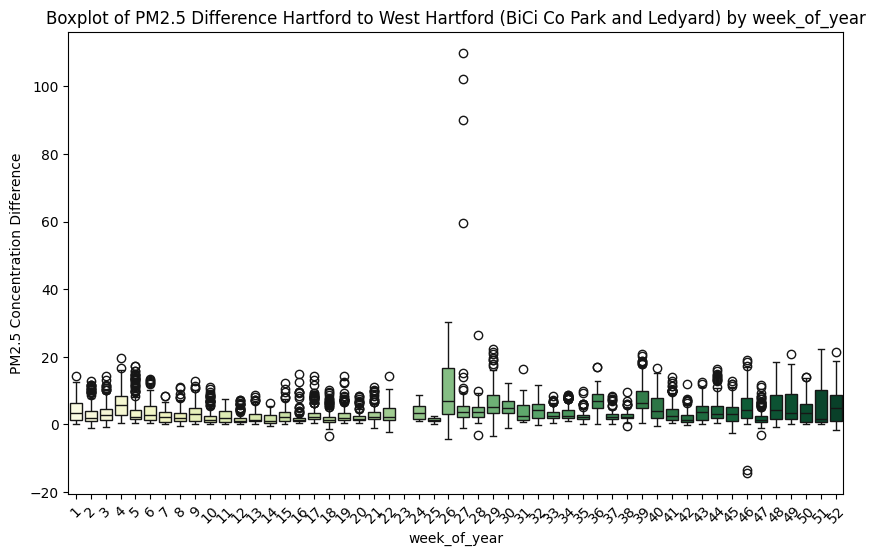

<ipython-input-263-429138df44fb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')


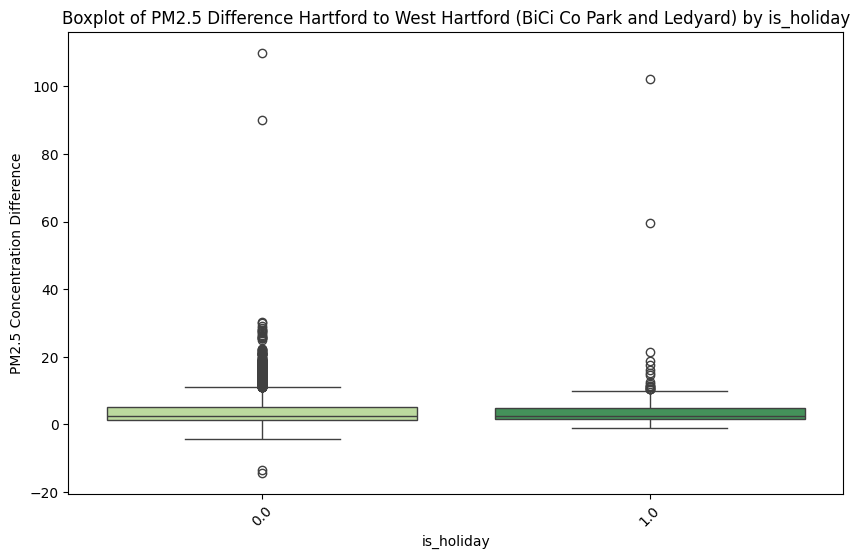

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


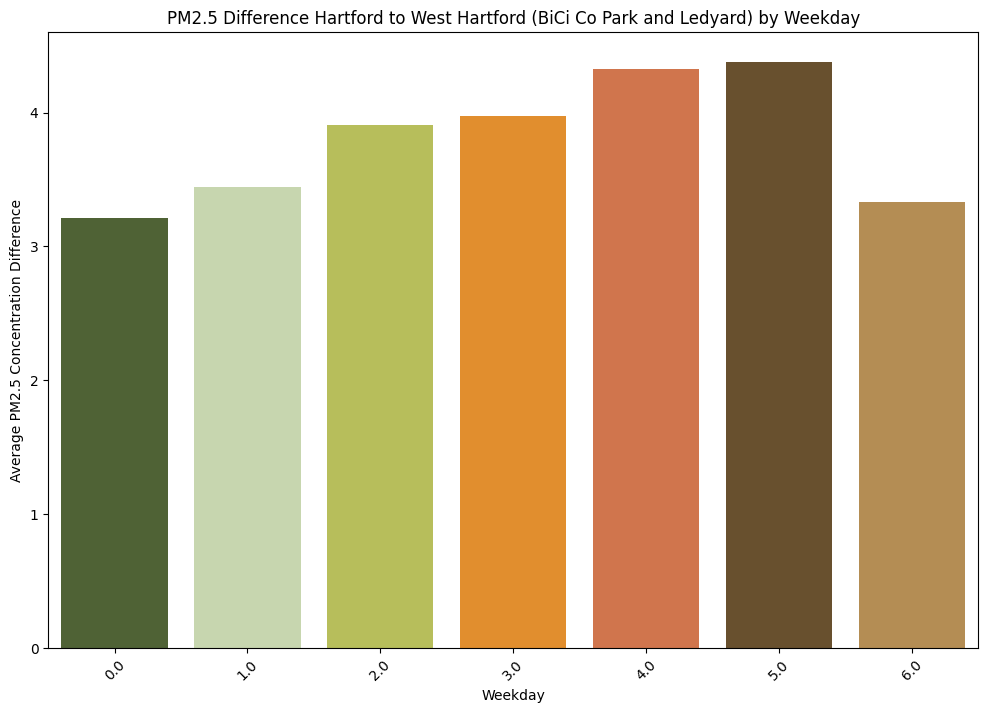

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


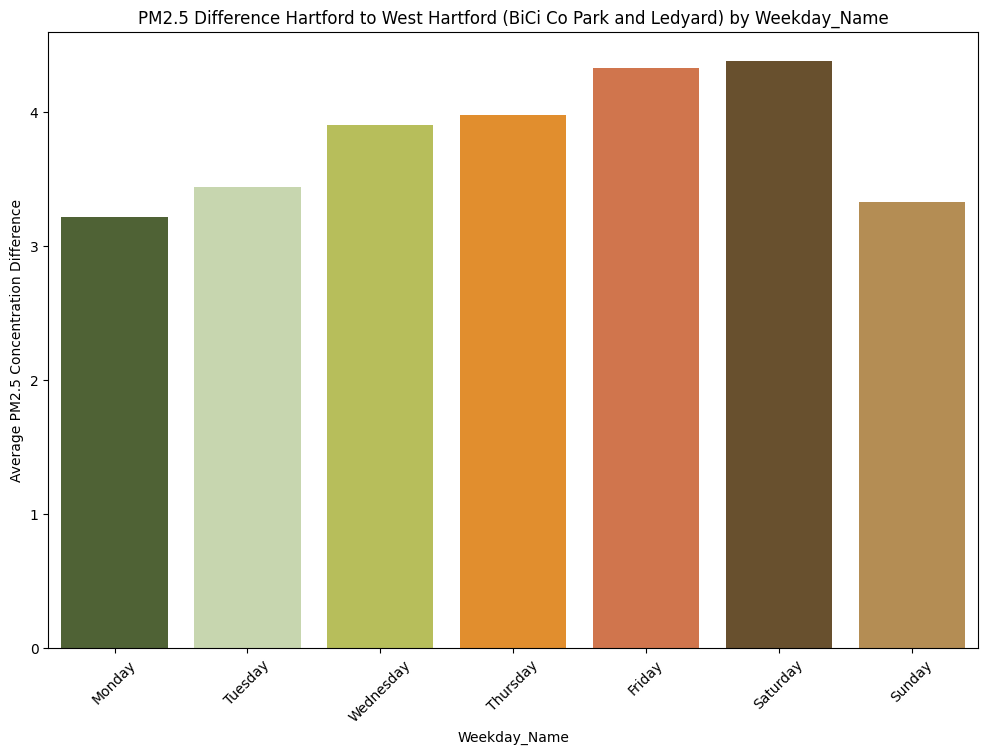

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


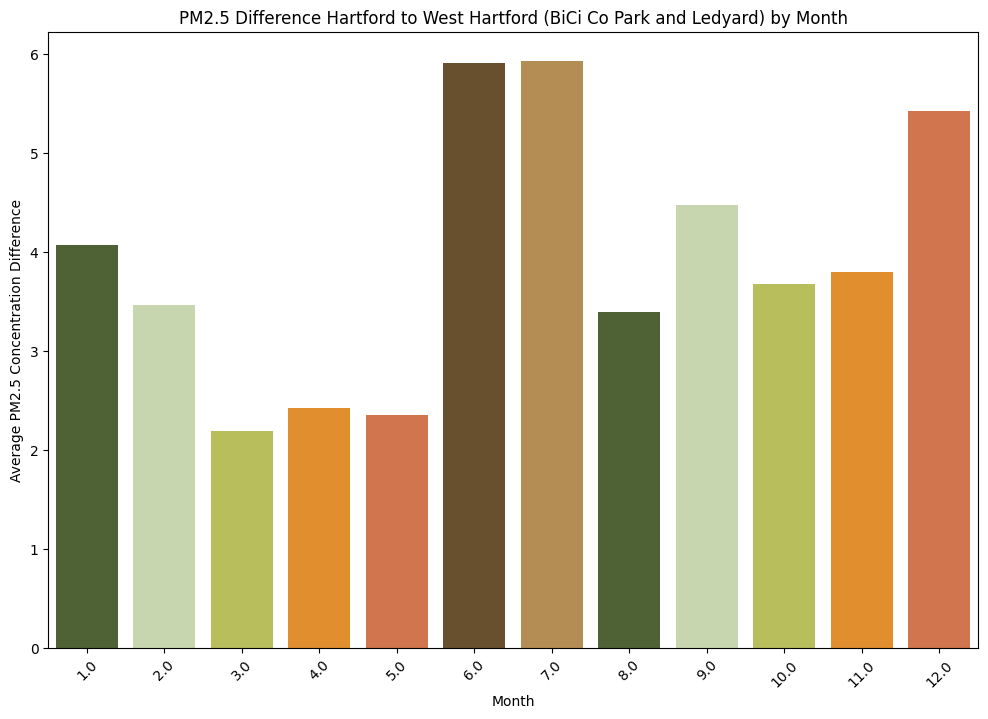

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


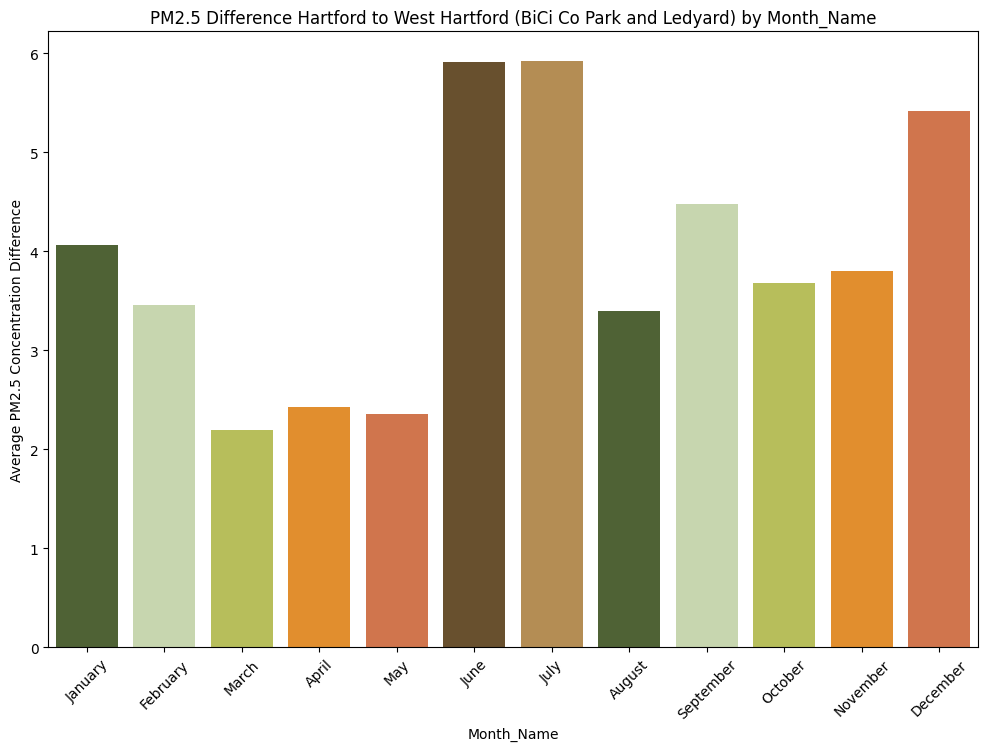

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


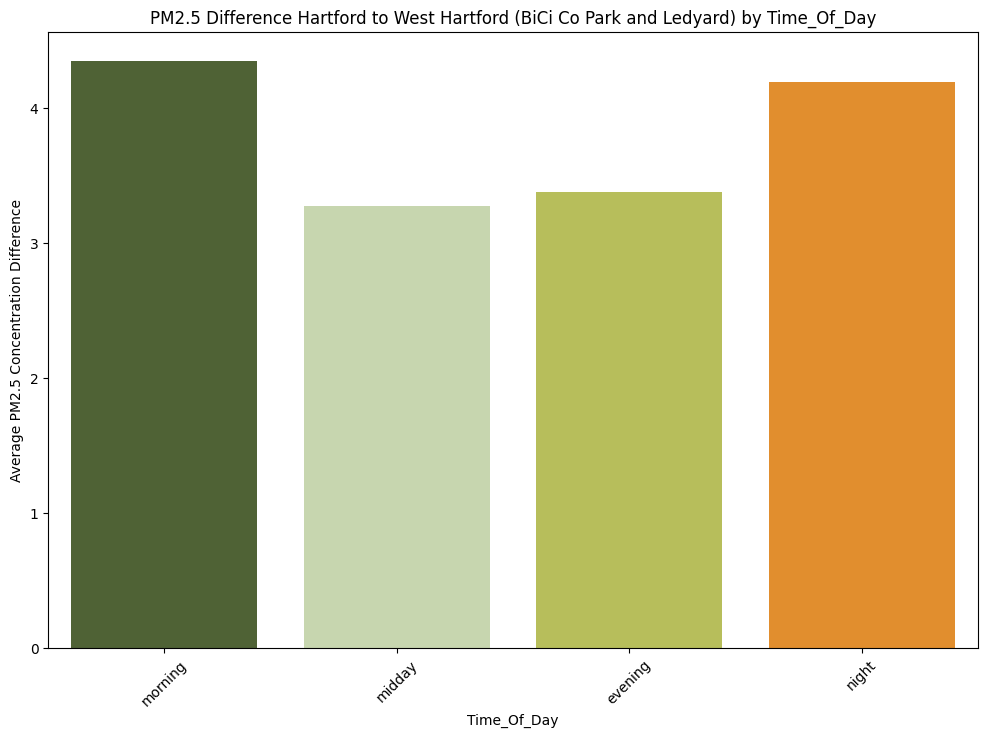

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


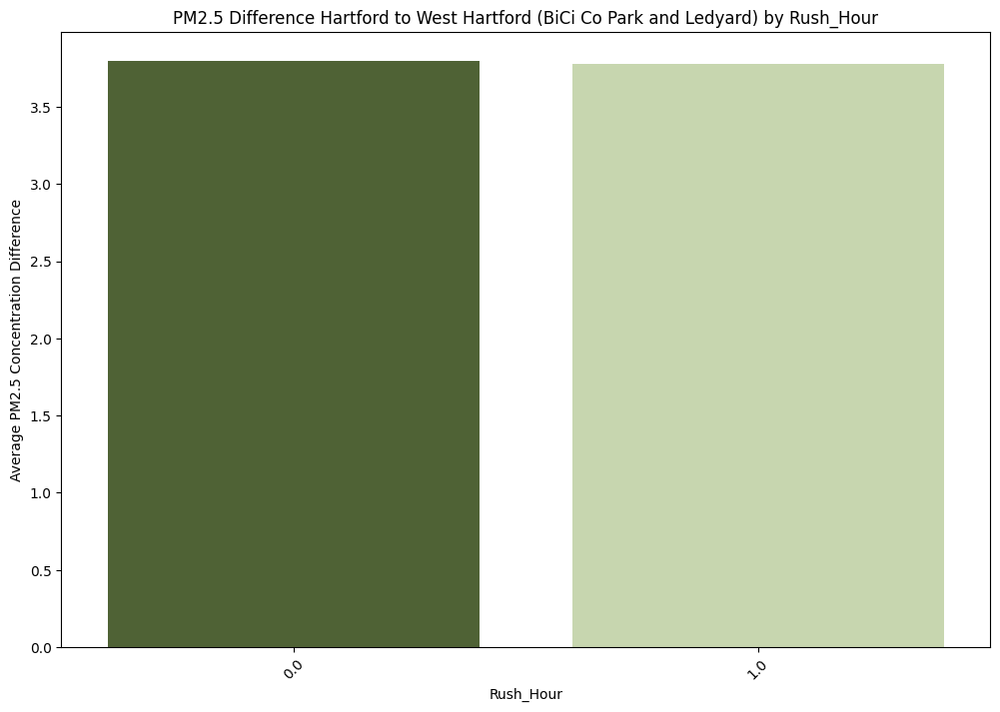

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


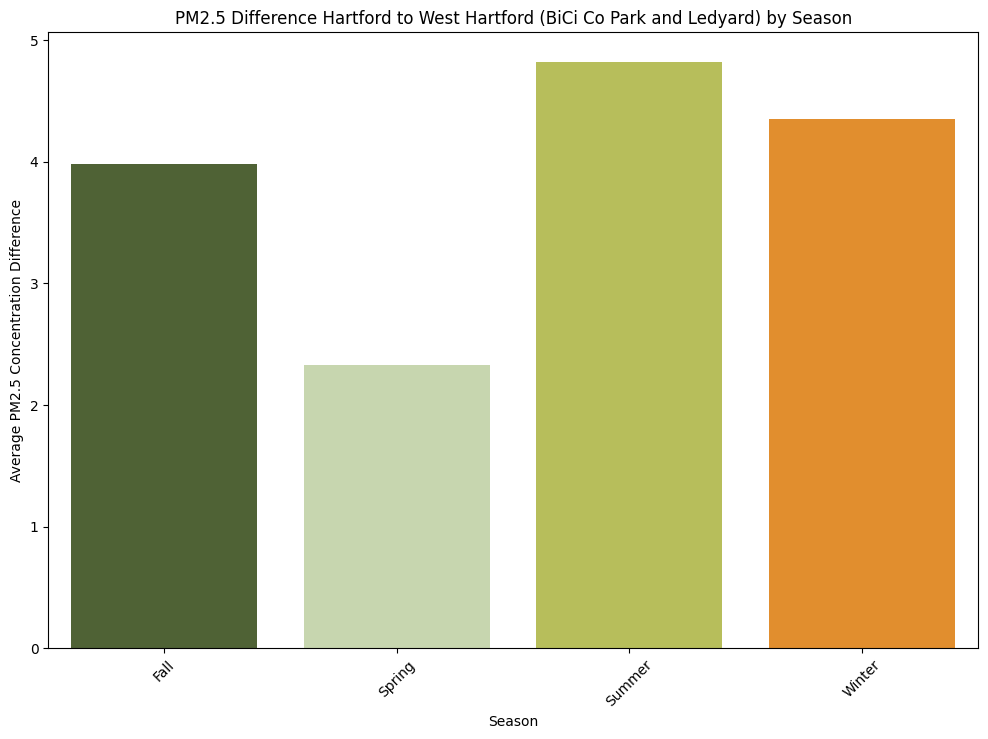

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


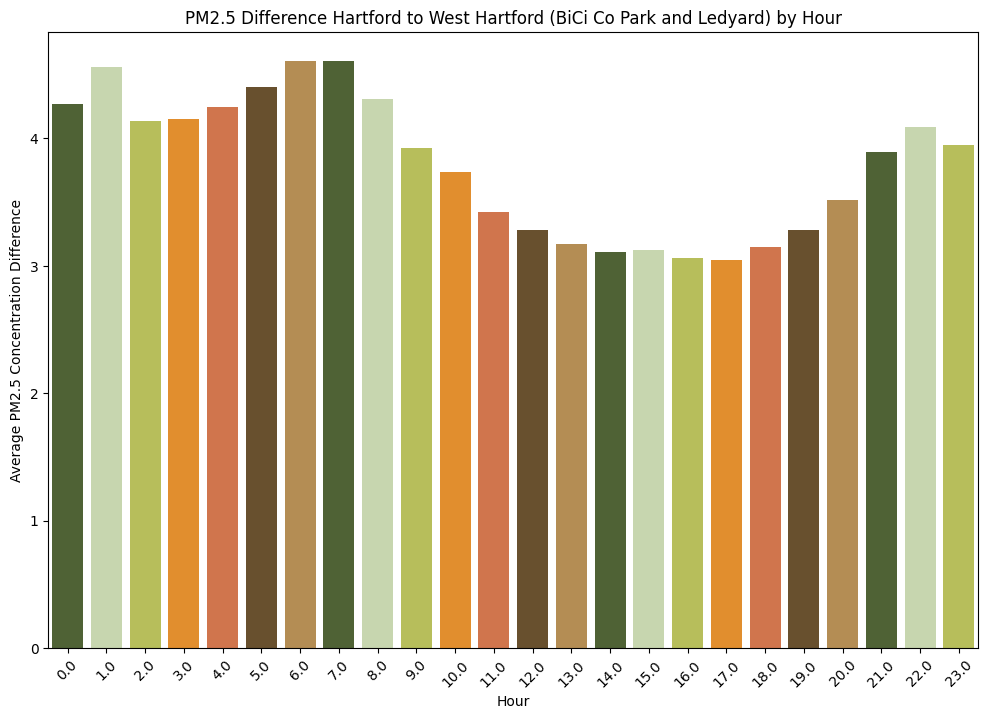

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


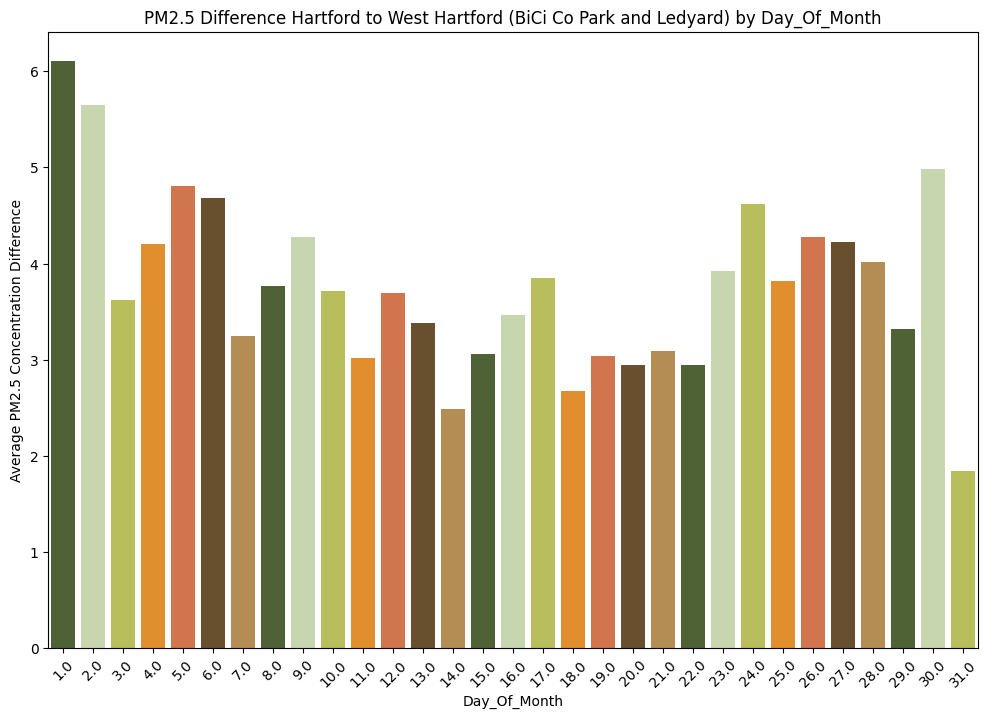

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


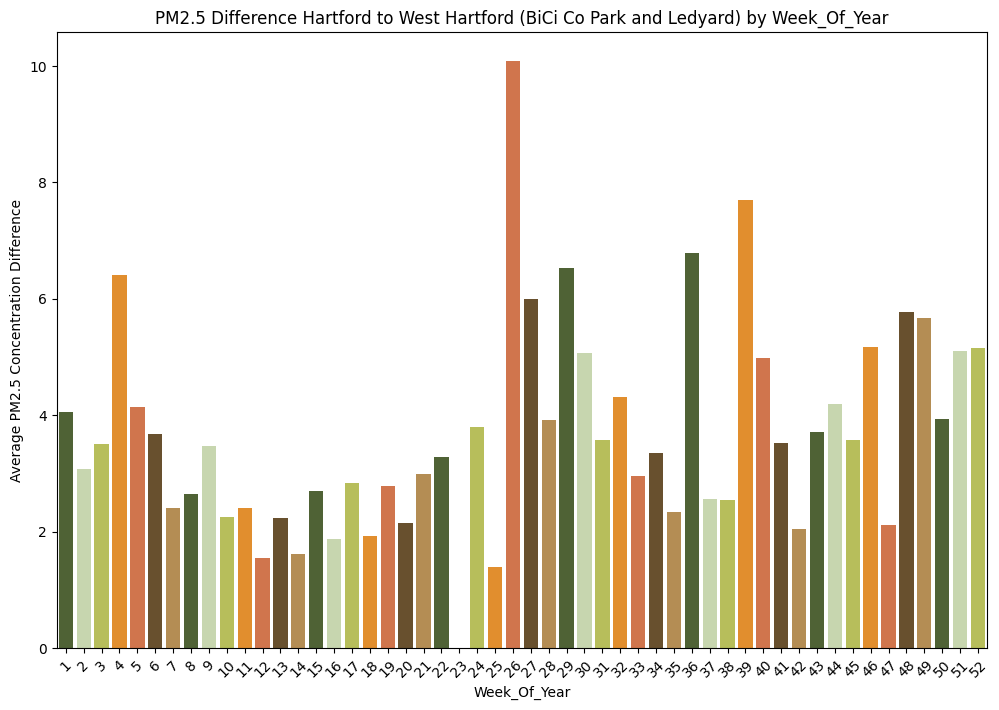

<ipython-input-264-3aeada6e20b2>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
<ipython-input-264-3aeada6e20b2>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)


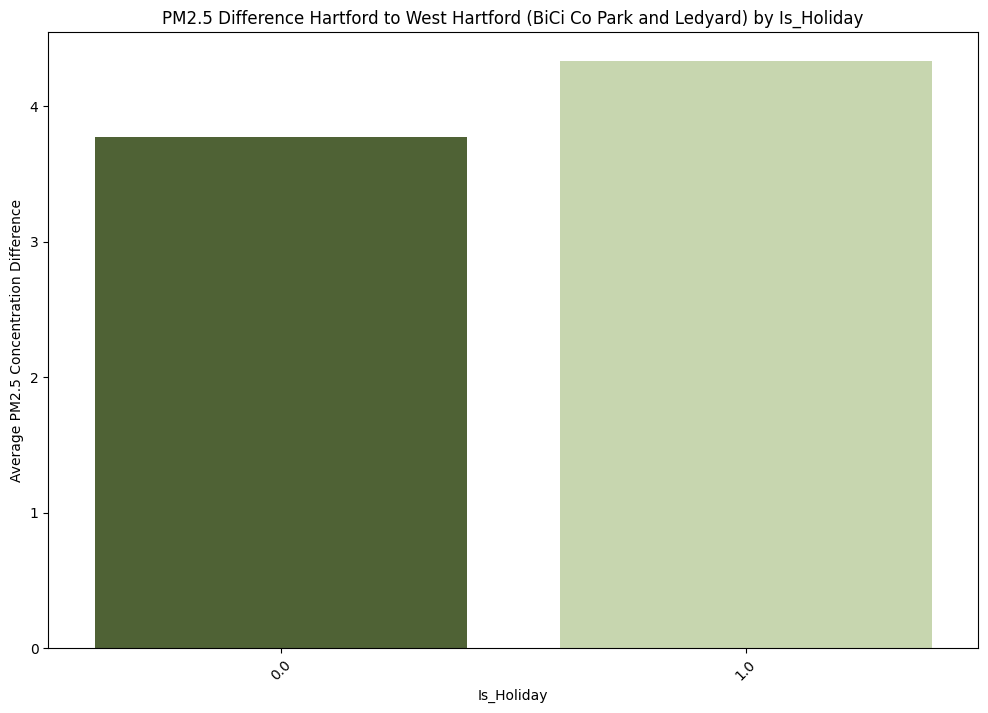

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)', palette=palette)
    plt.title(f'PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

##PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


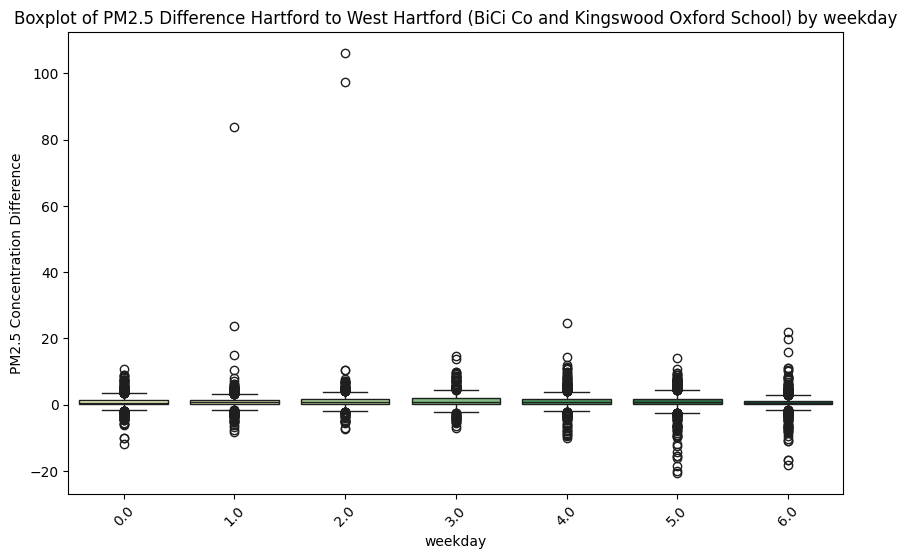

<ipython-input-265-2dd196c0c048>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


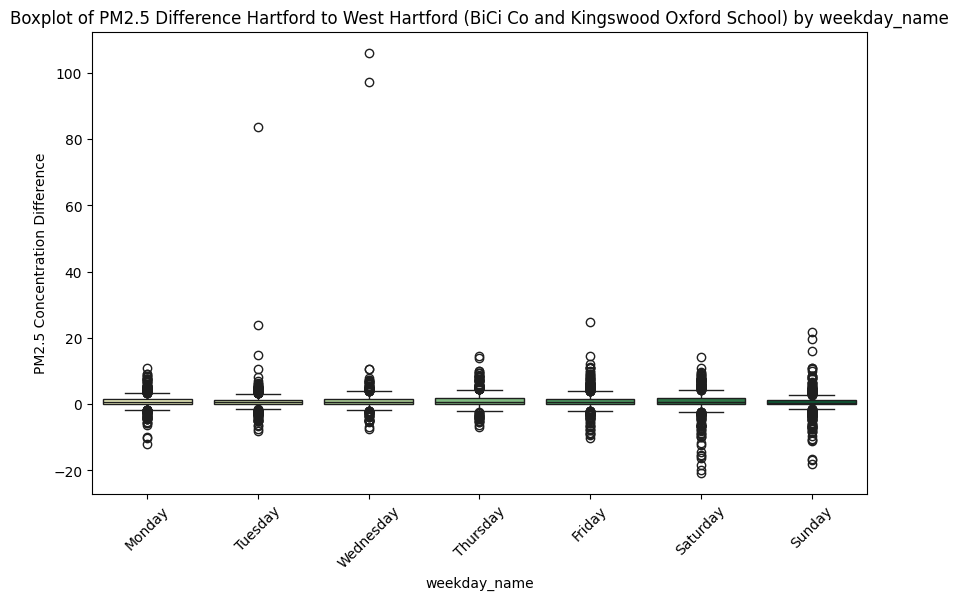

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


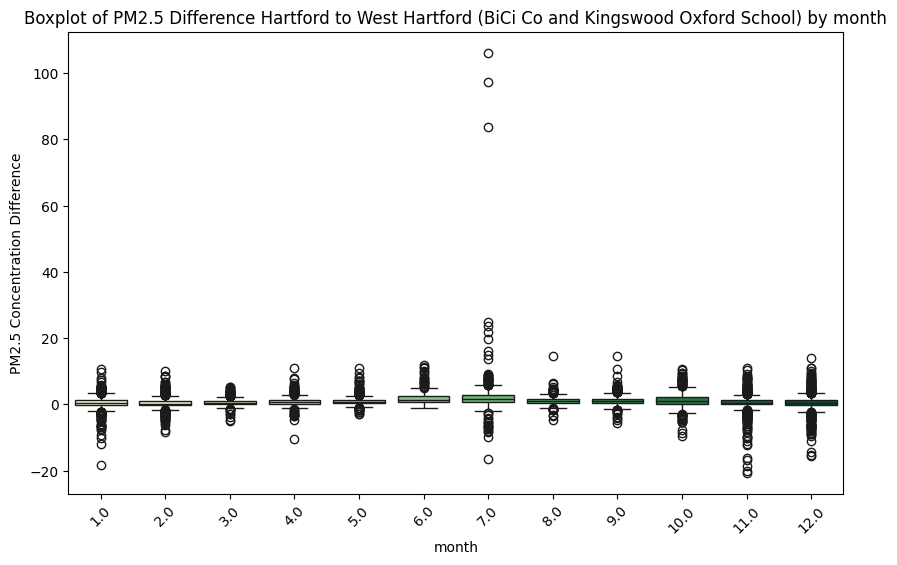

<ipython-input-265-2dd196c0c048>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


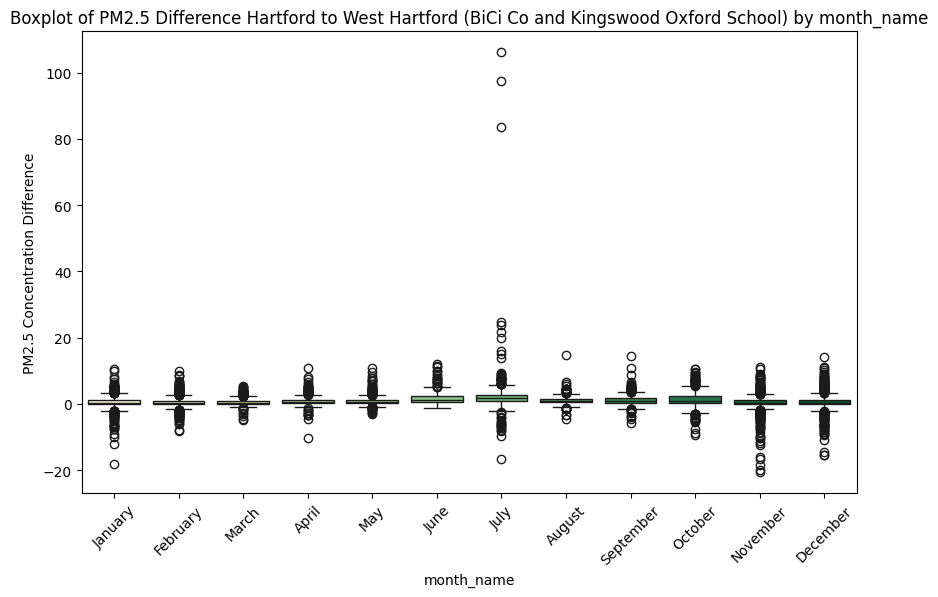

<ipython-input-265-2dd196c0c048>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


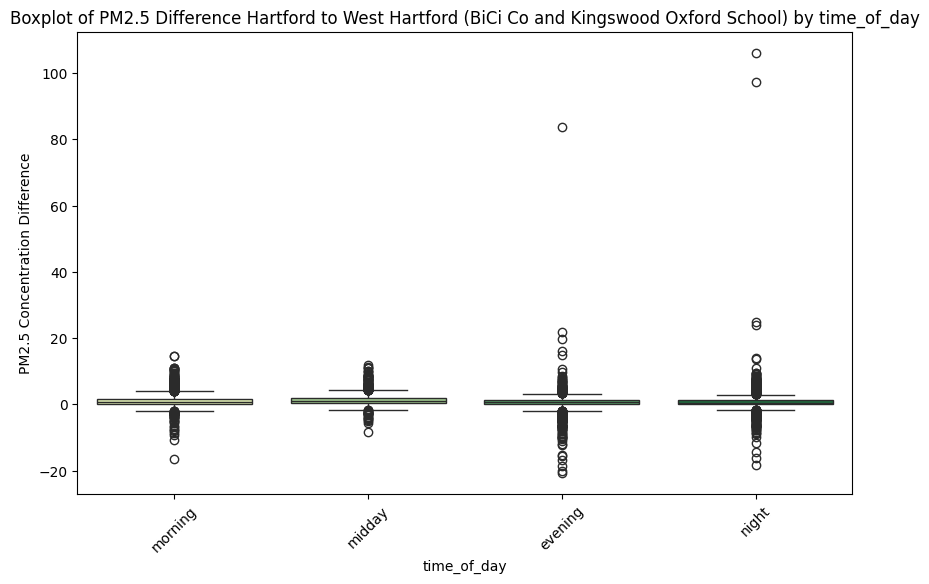

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


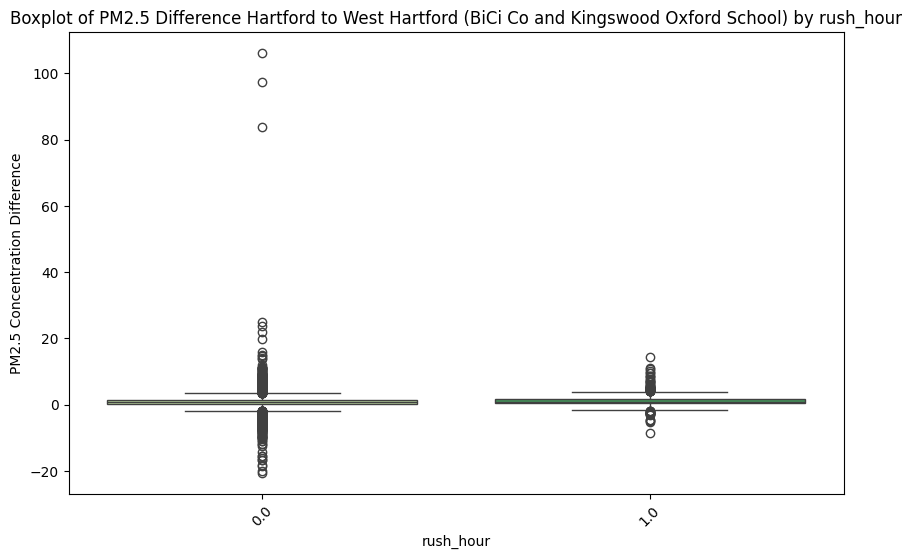

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


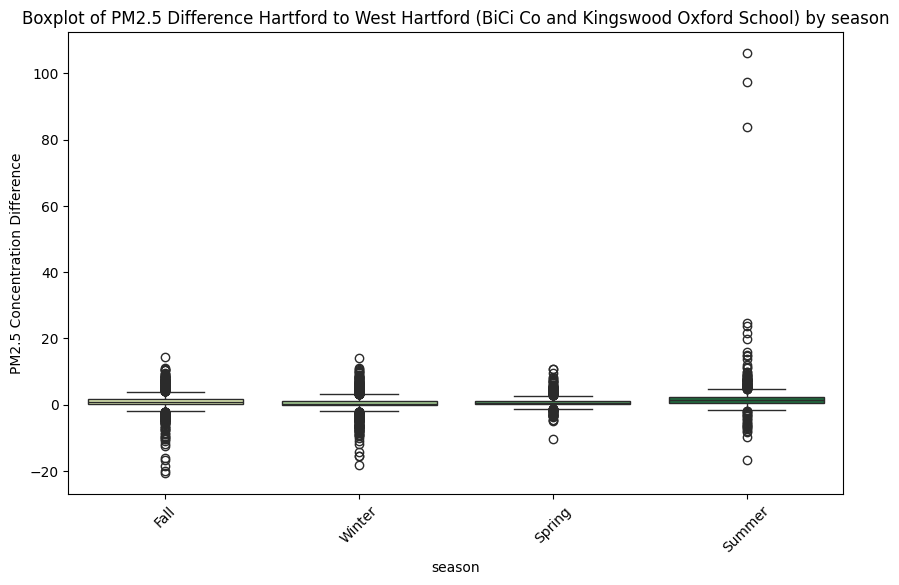

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


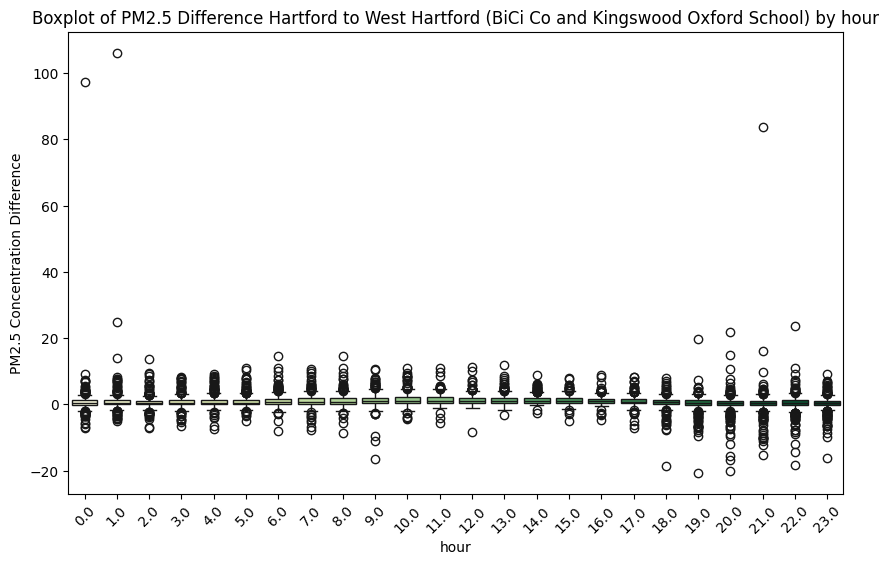

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


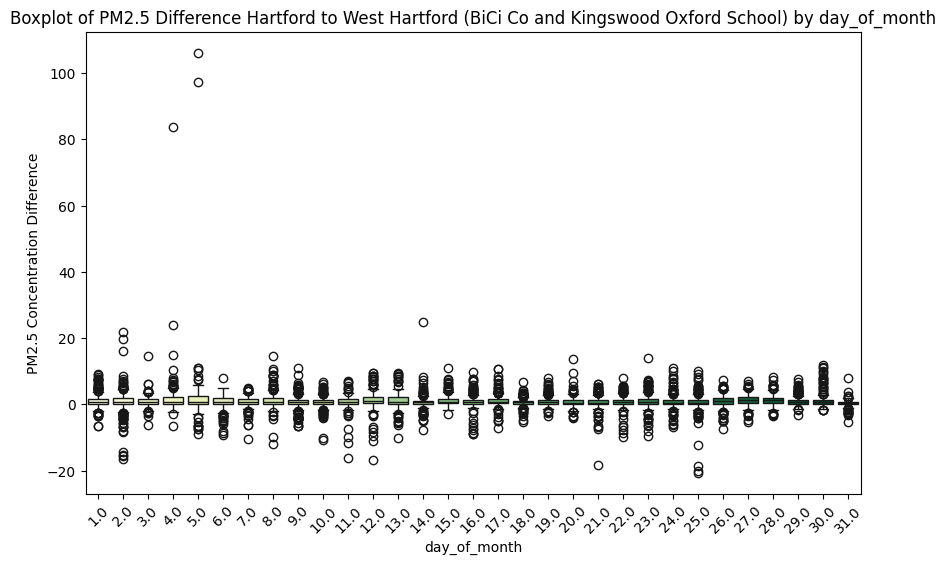

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


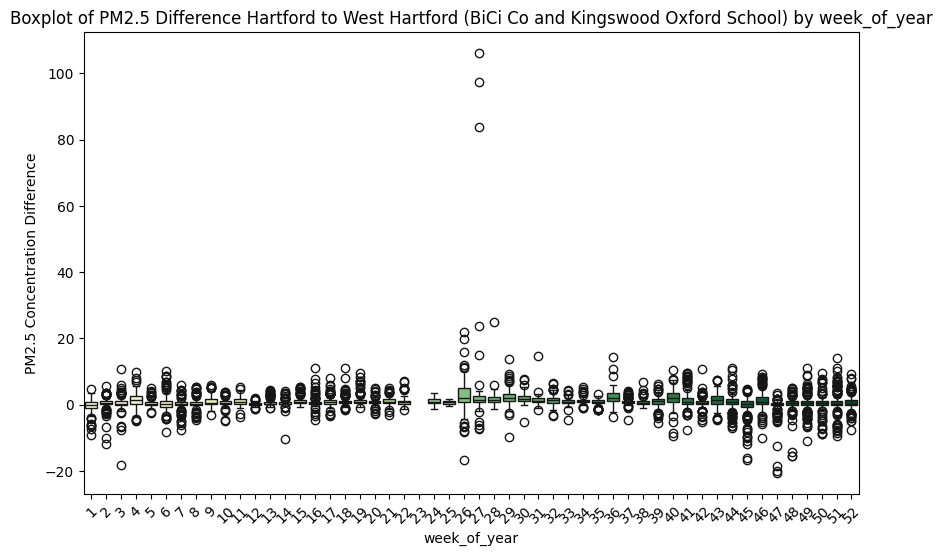

<ipython-input-265-2dd196c0c048>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


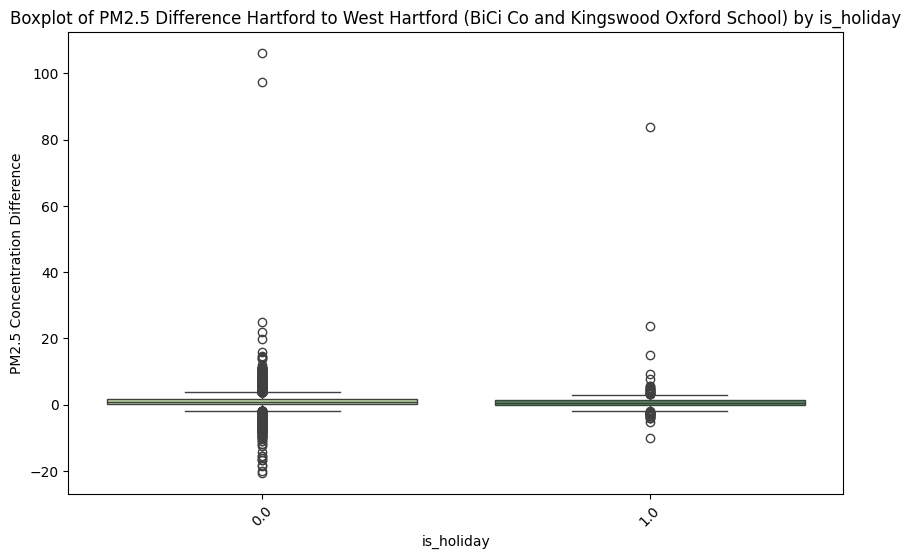

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


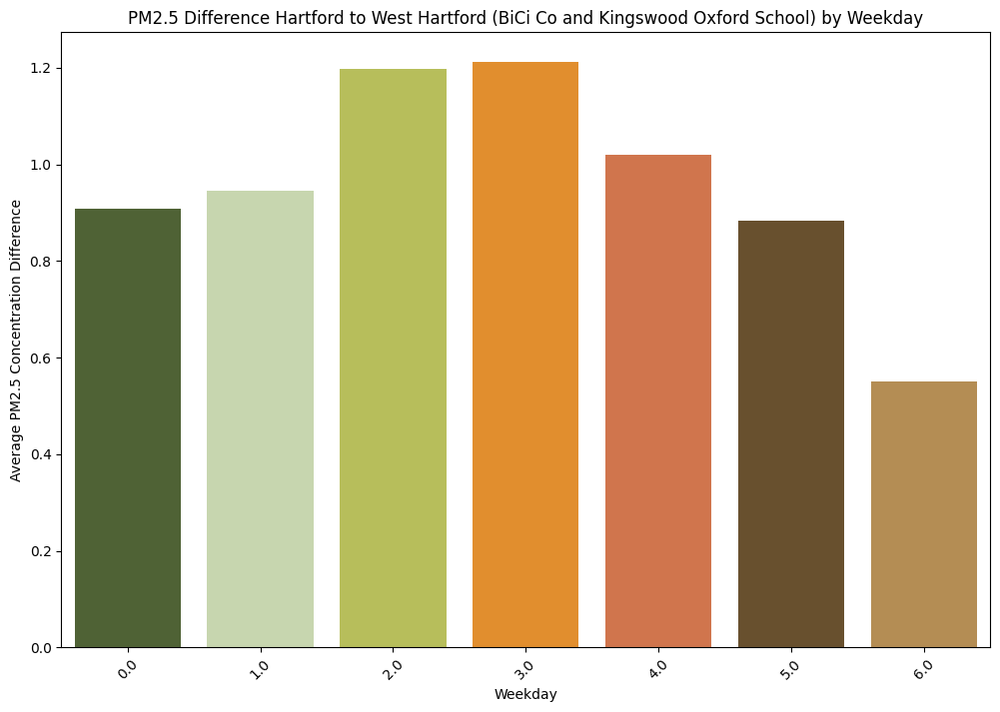

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


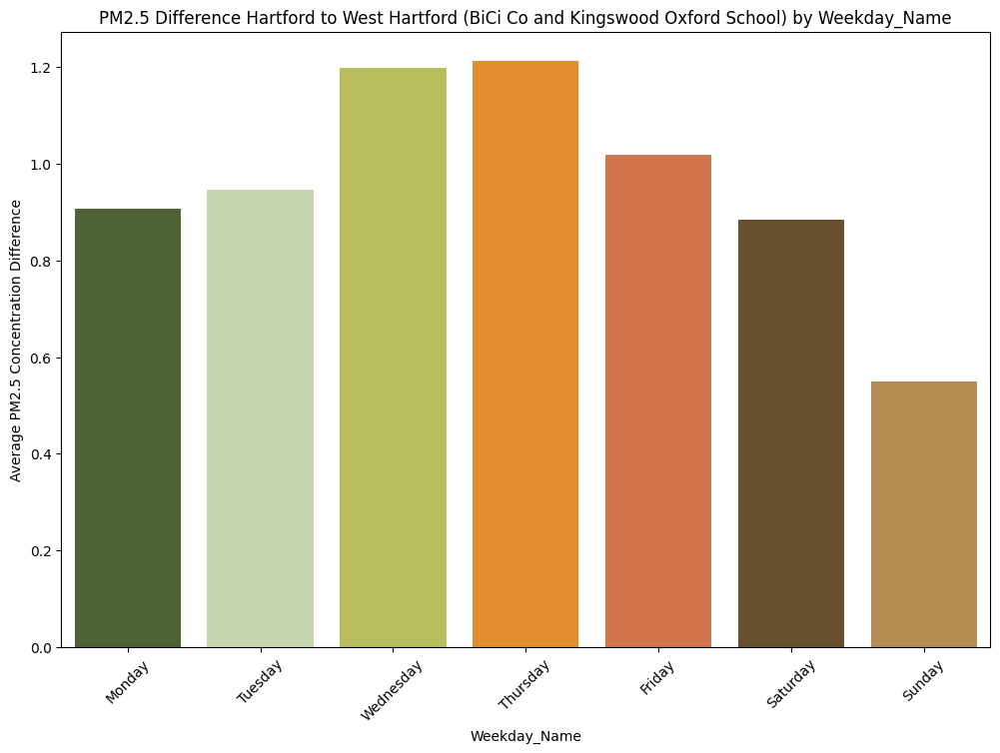

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


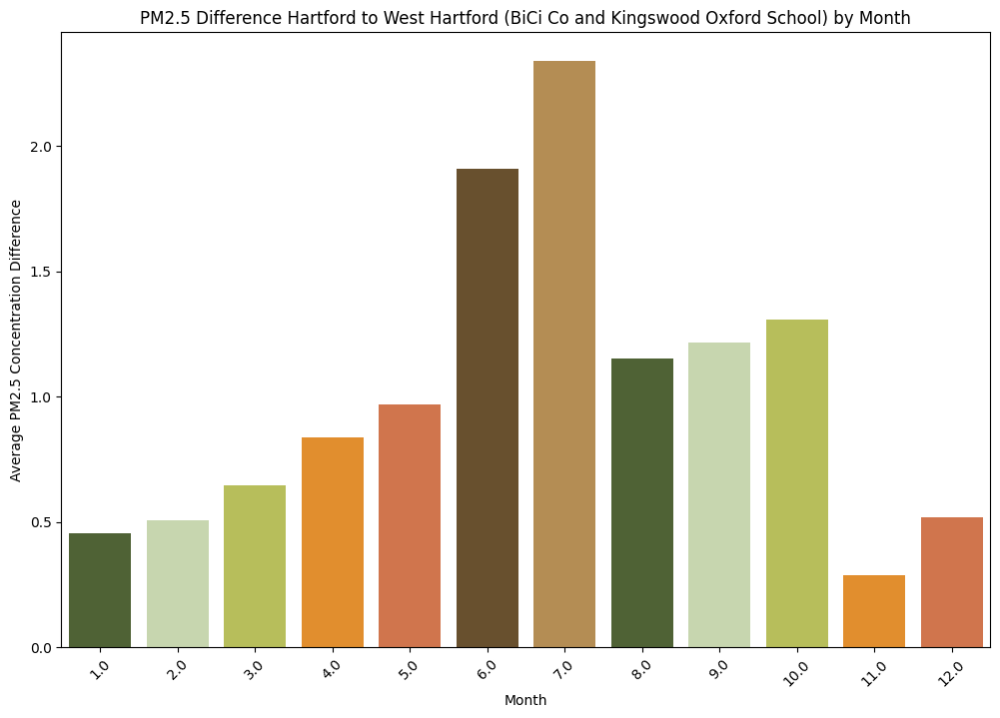

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


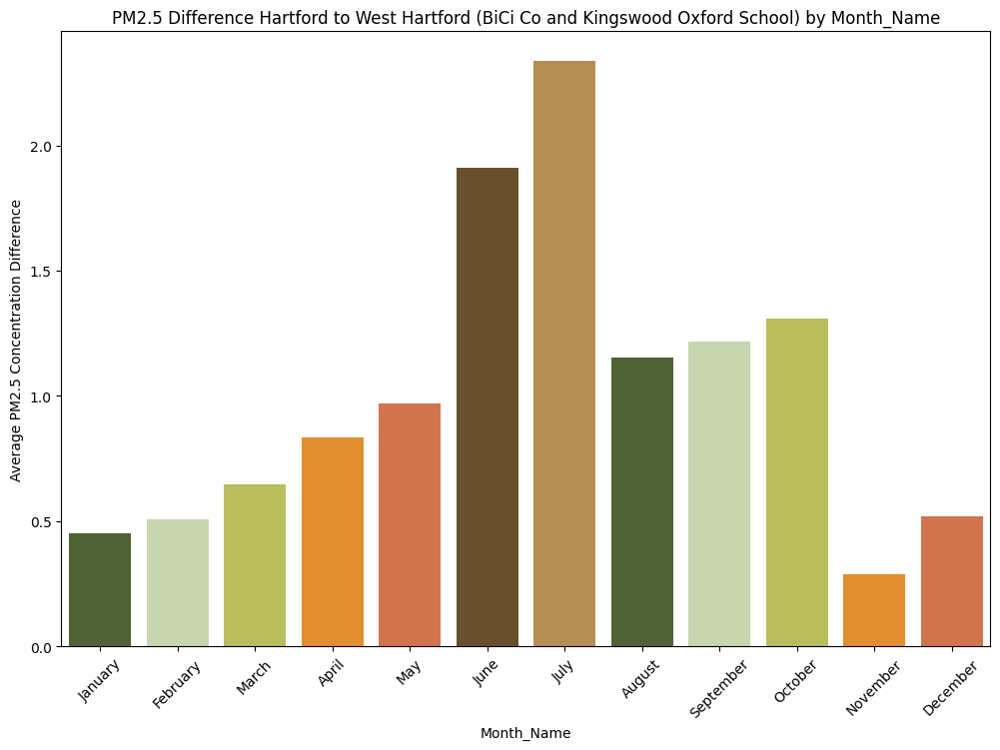

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


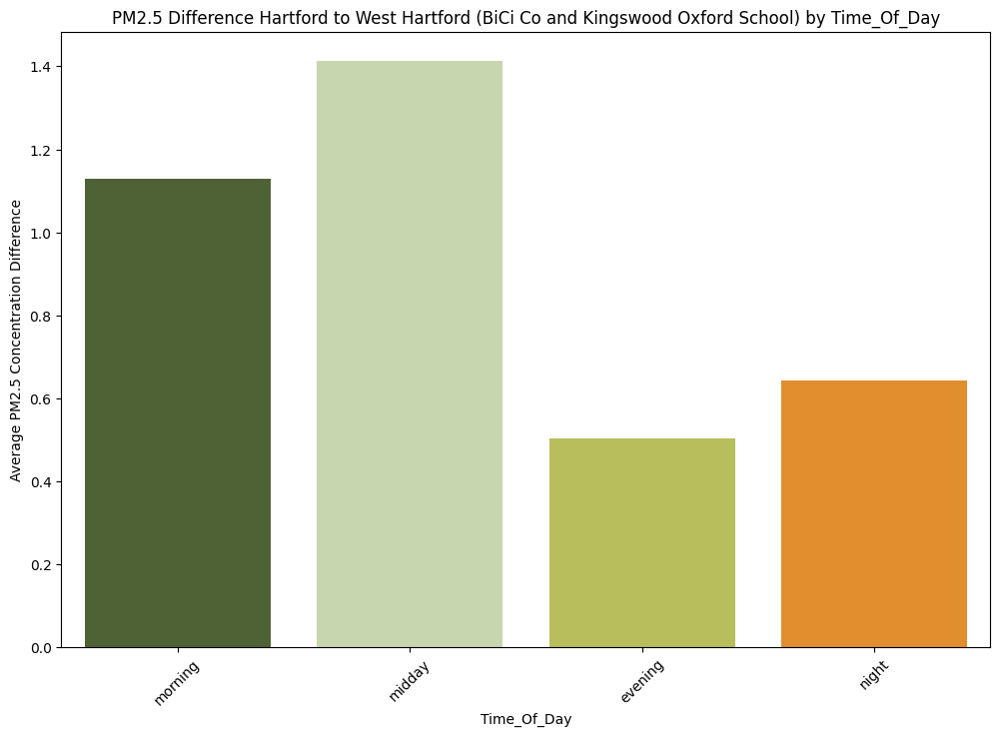

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


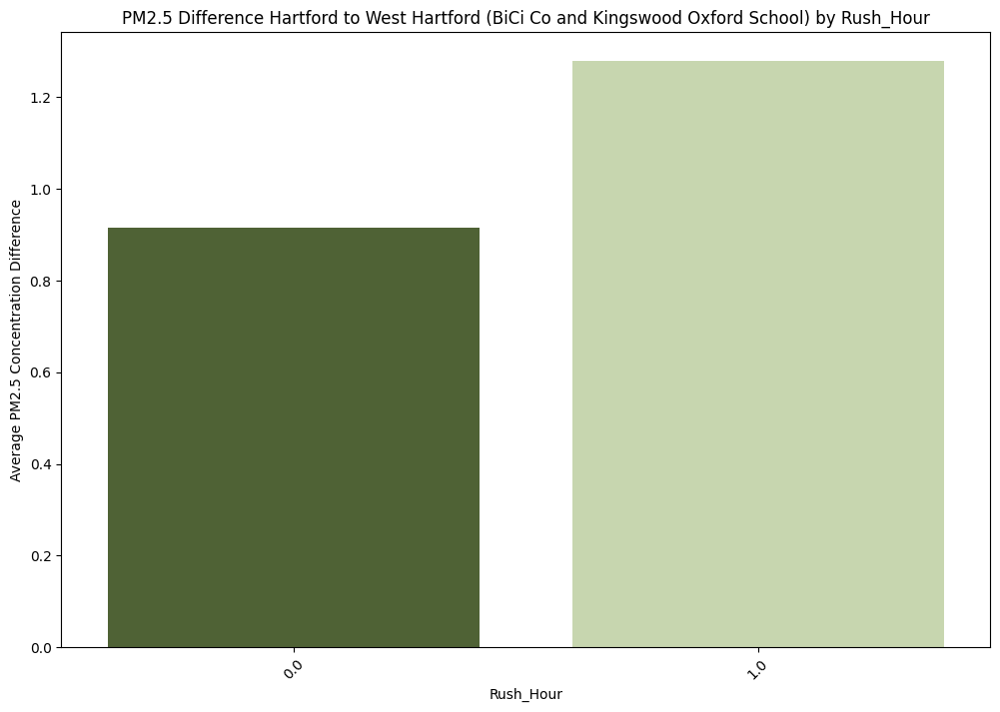

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


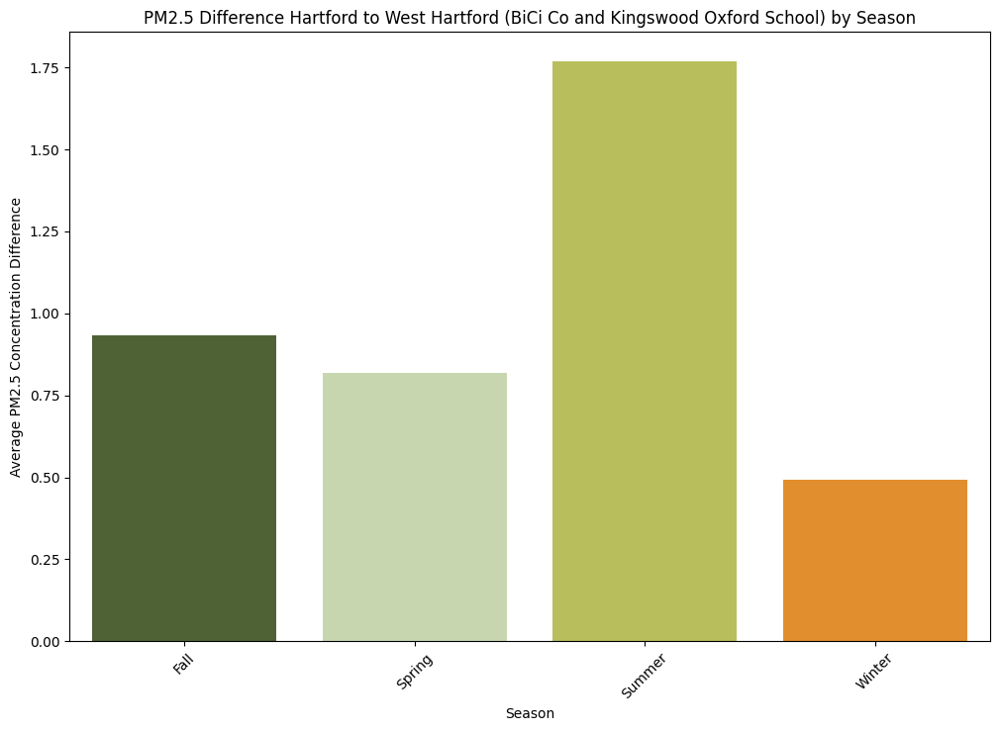

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


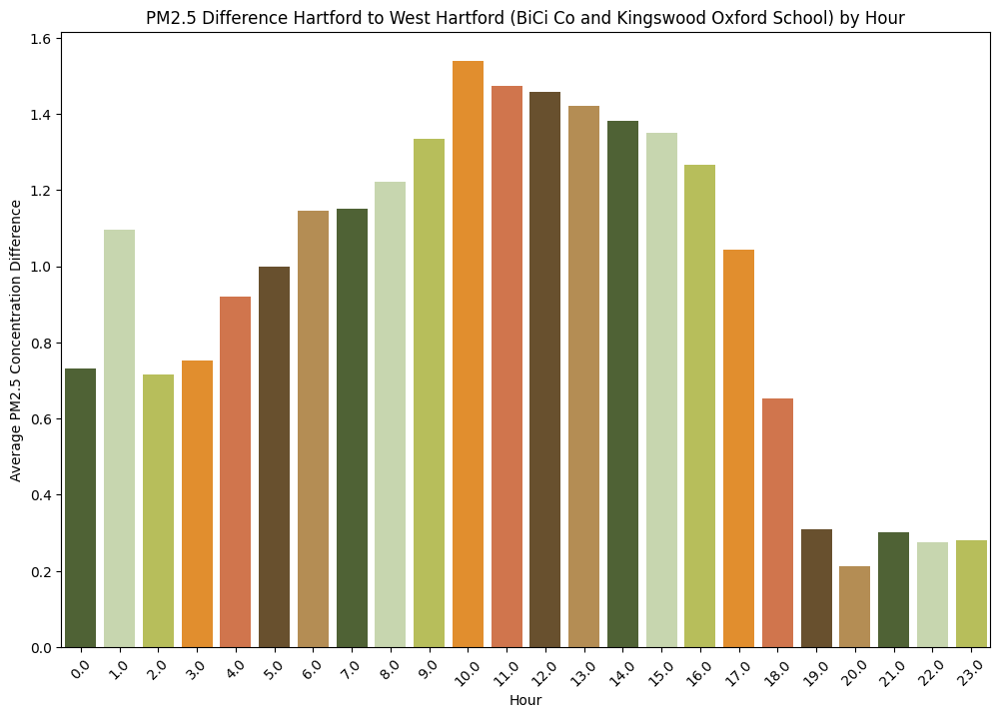

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


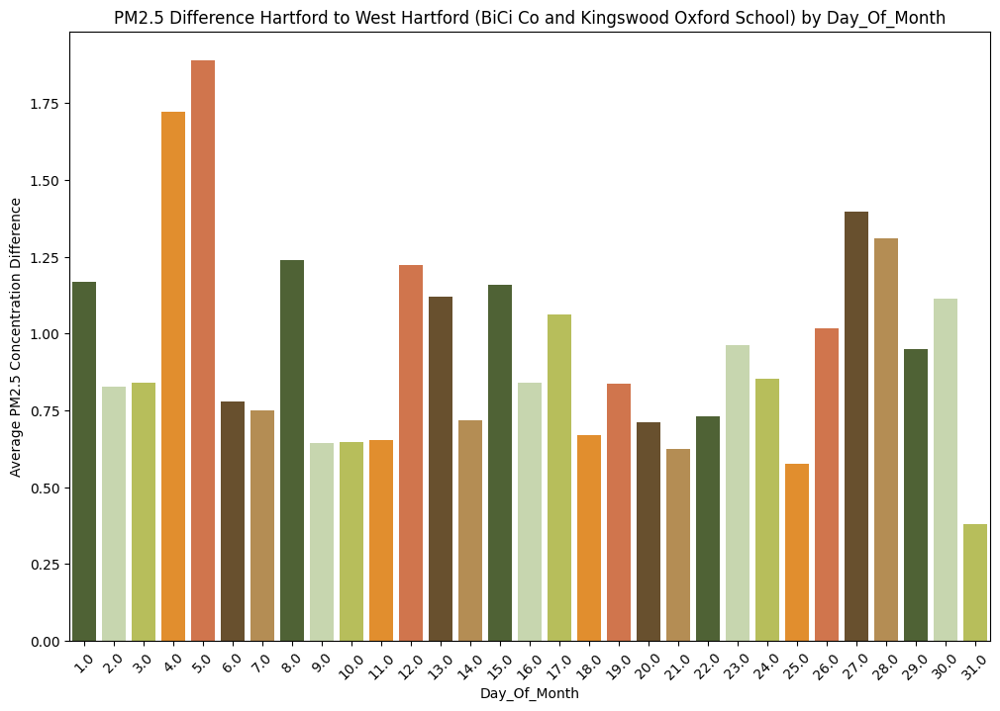

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


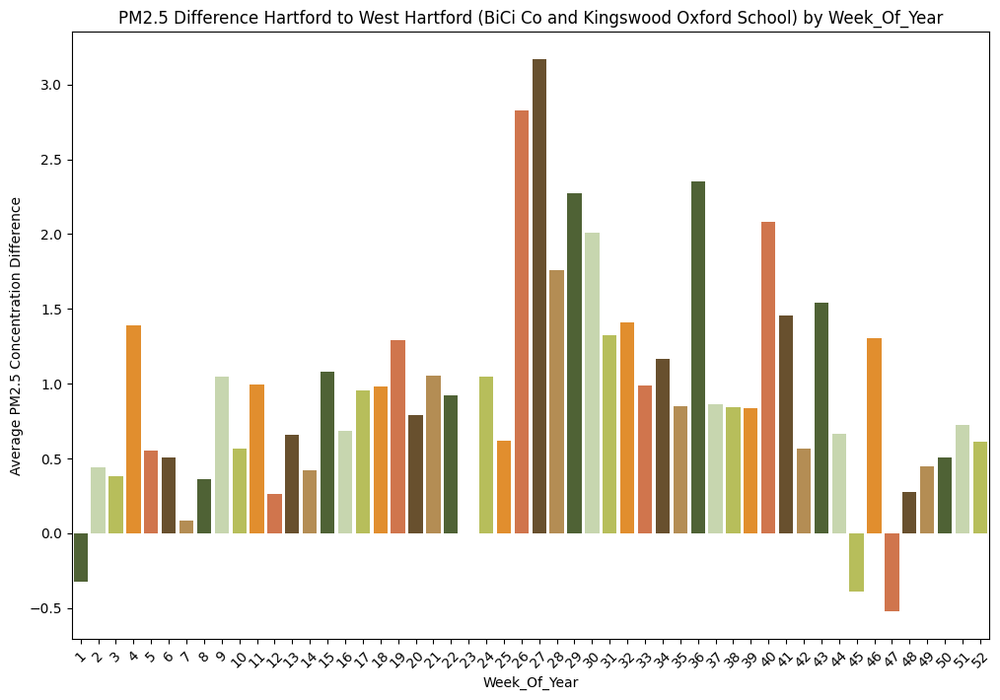

<ipython-input-266-a05cf7c579c5>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
<ipython-input-266-a05cf7c579c5>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)


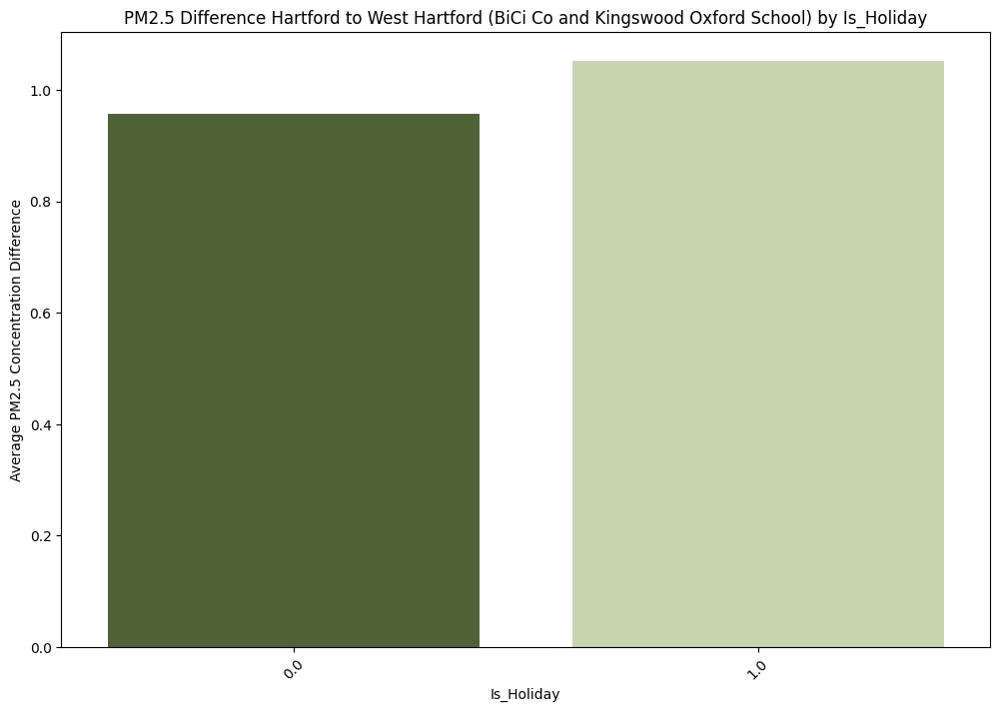

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)', palette=palette)
    plt.title(f'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

##PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


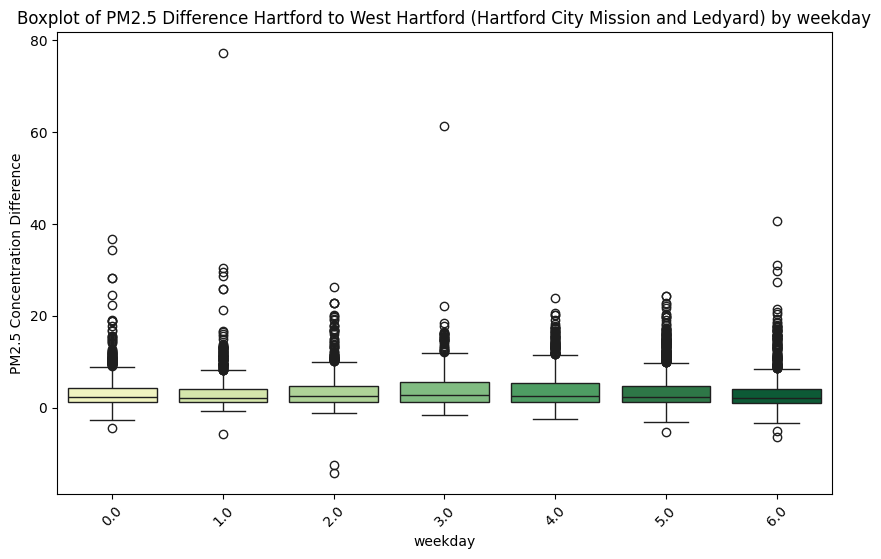

<ipython-input-267-4a0c8e151c41>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


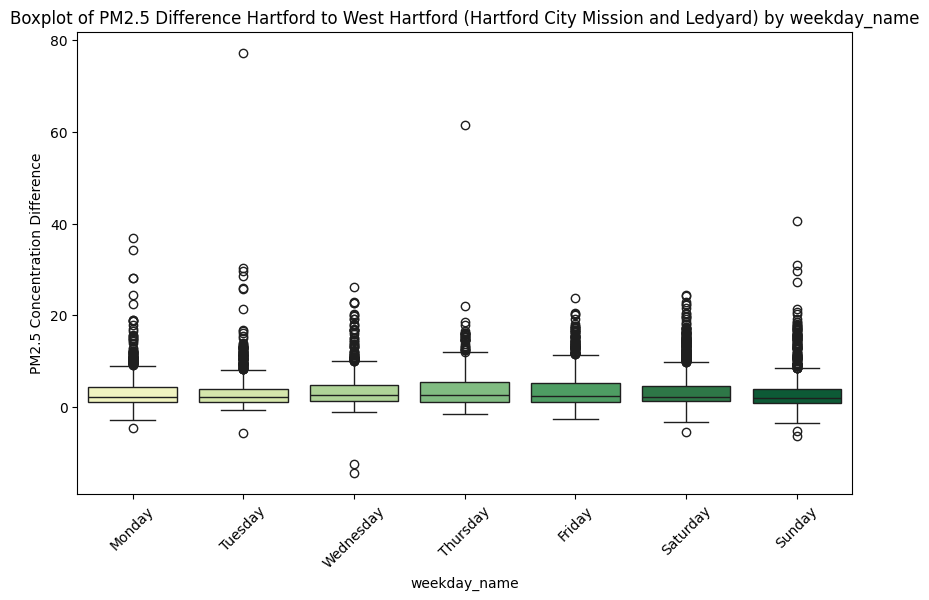

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


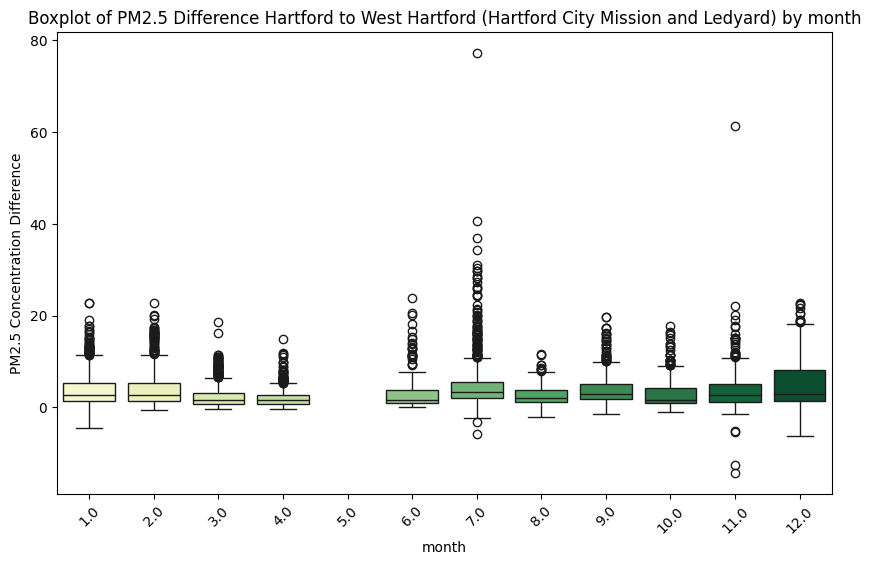

<ipython-input-267-4a0c8e151c41>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


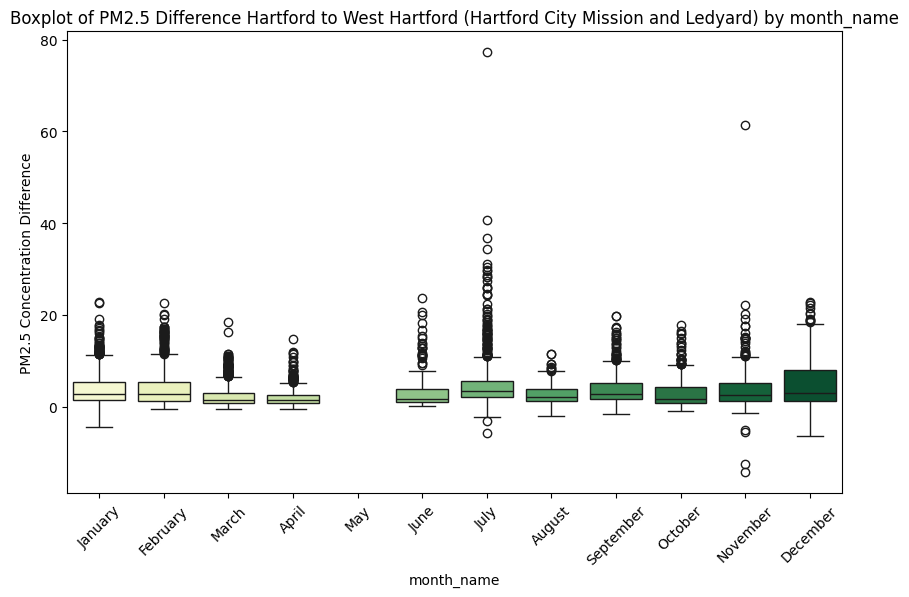

<ipython-input-267-4a0c8e151c41>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


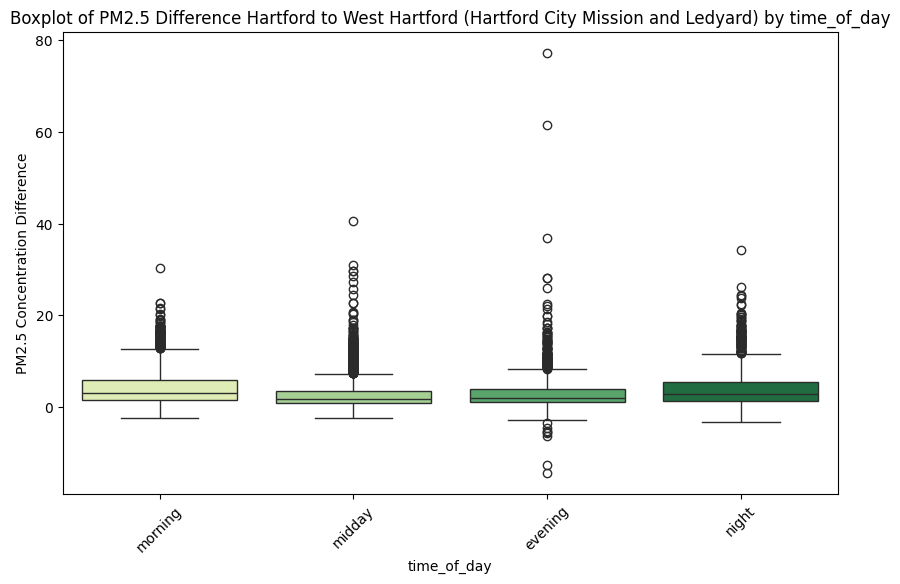

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


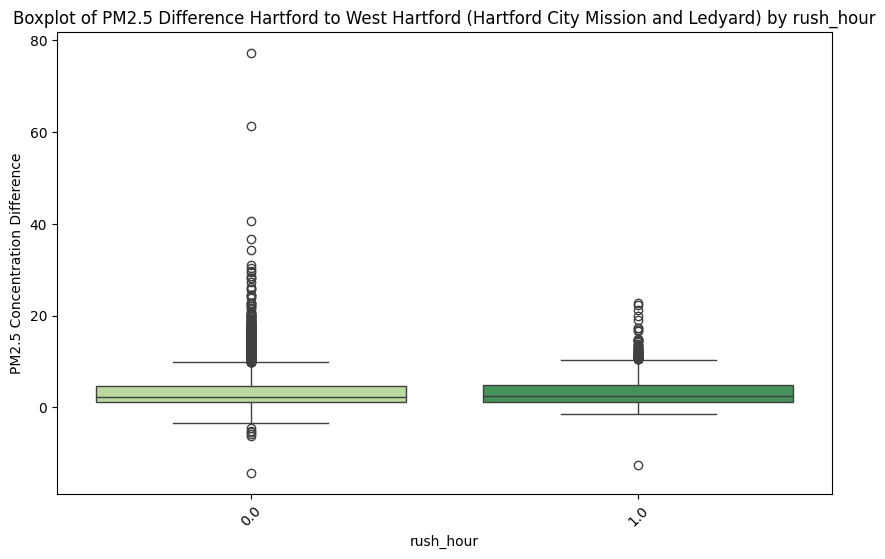

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


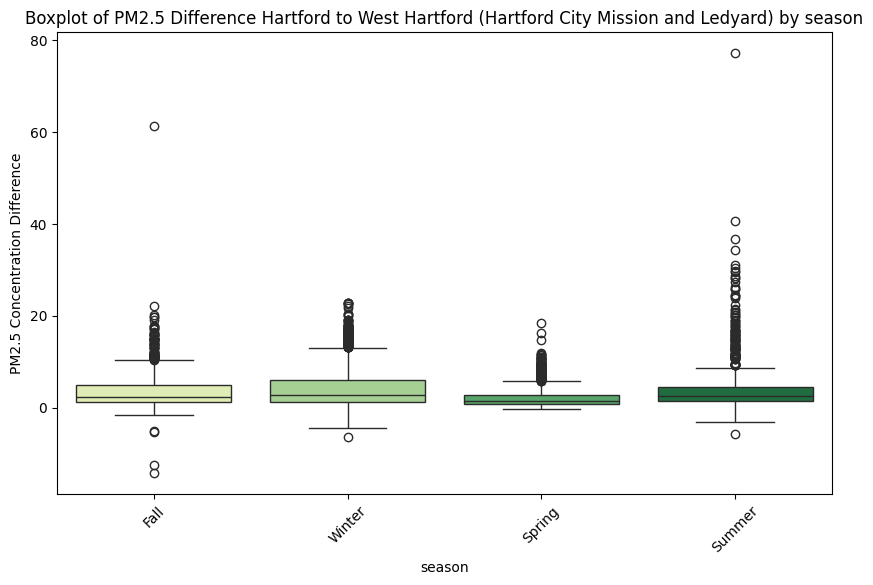

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


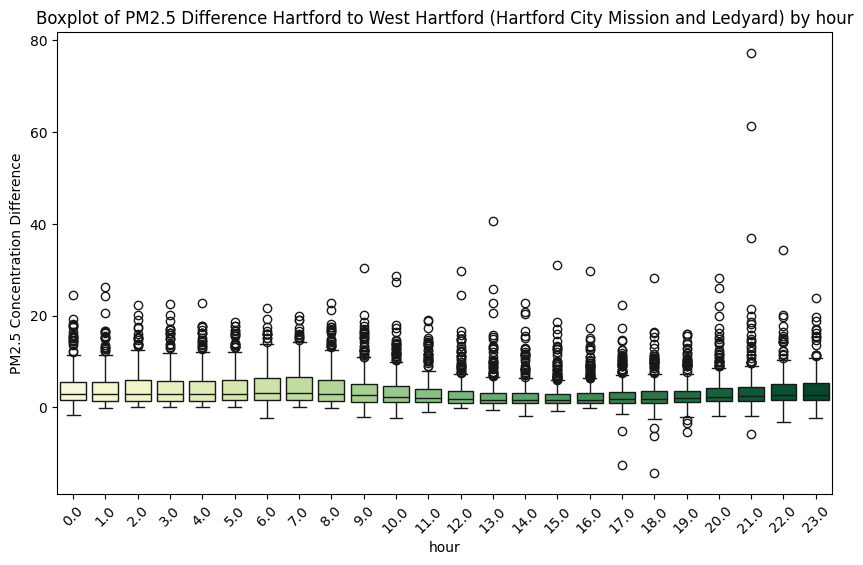

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


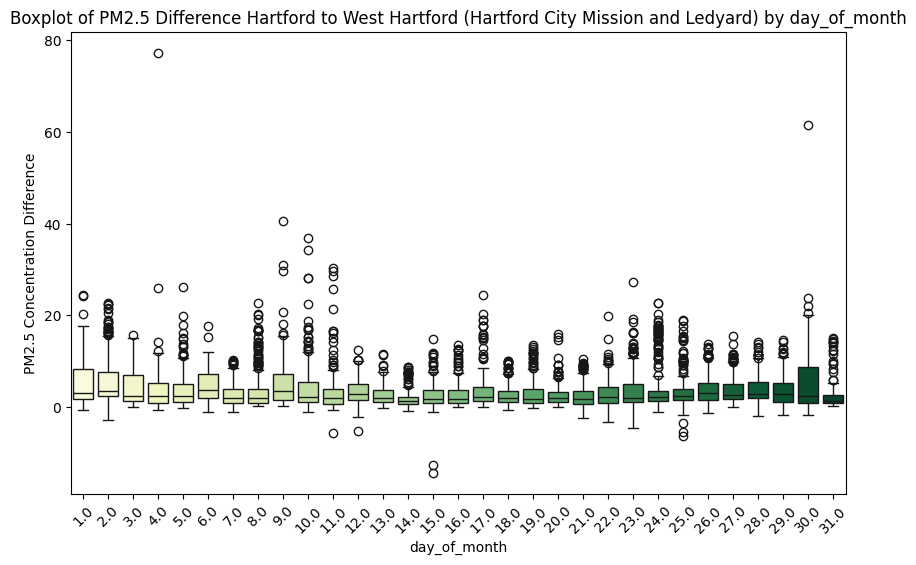

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


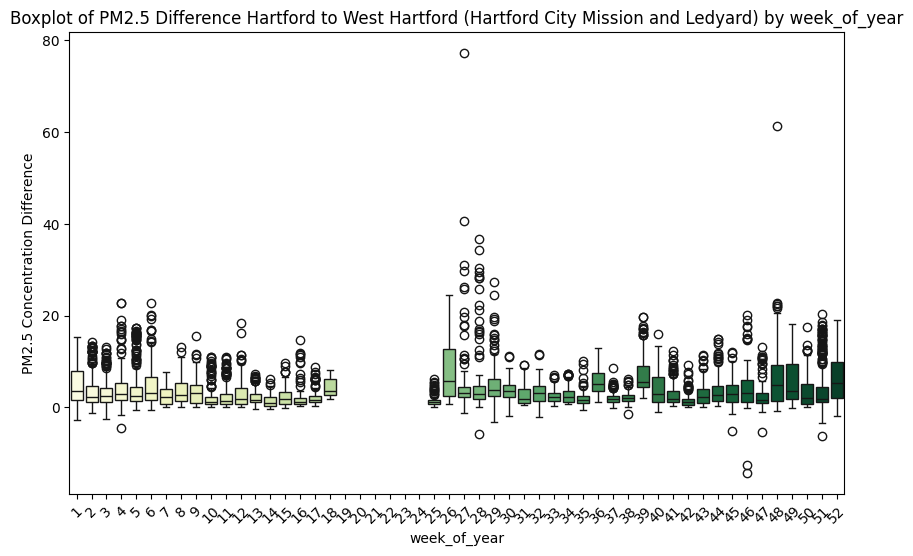

<ipython-input-267-4a0c8e151c41>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')


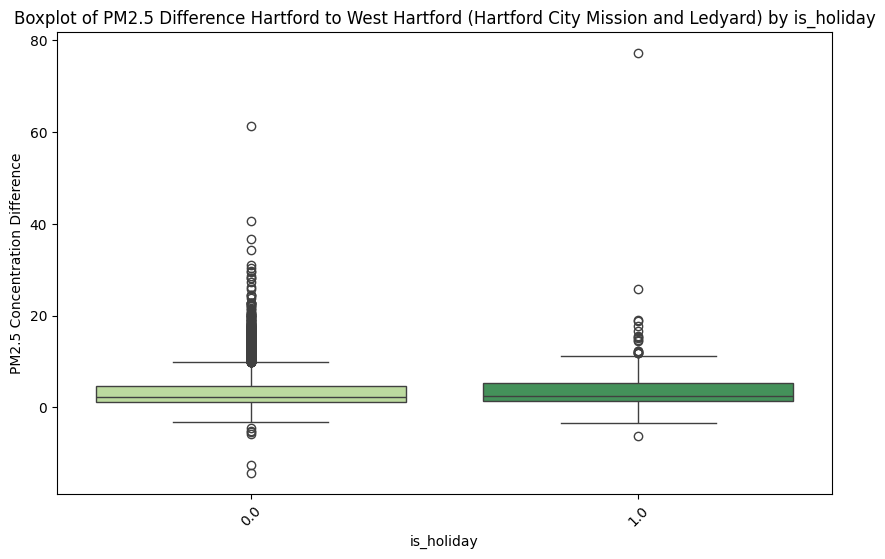

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


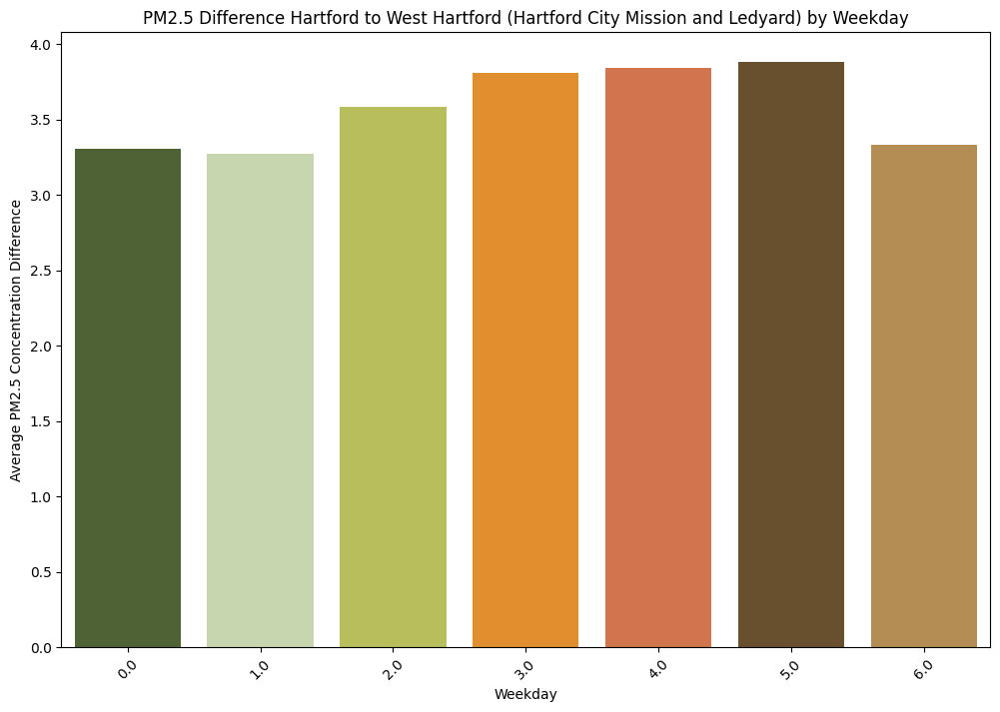

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


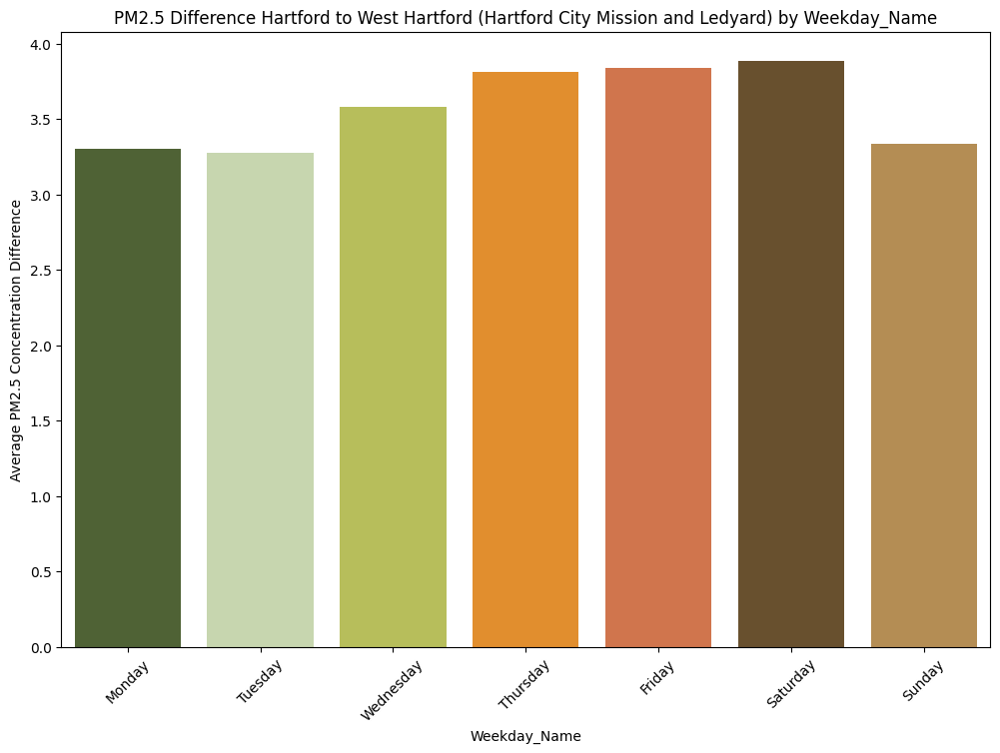

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


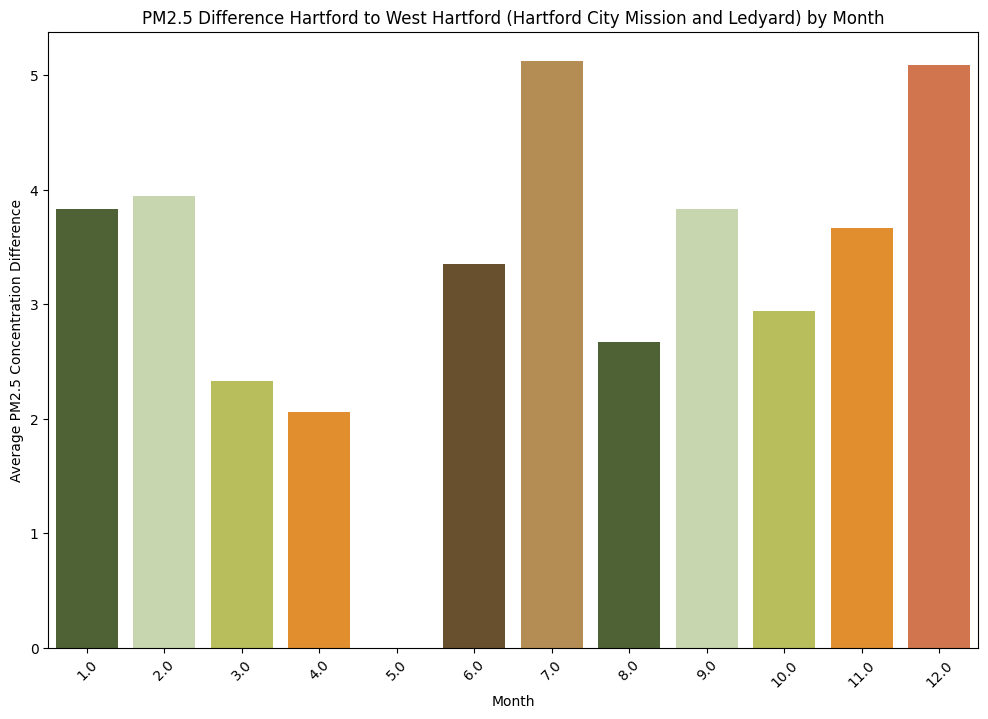

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


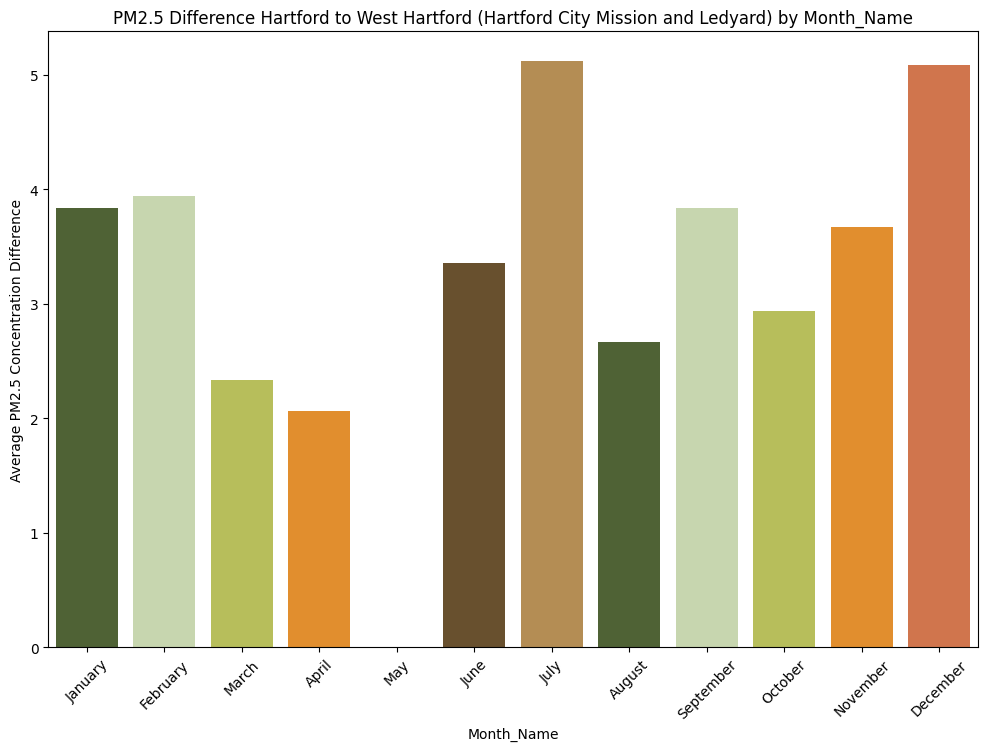

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


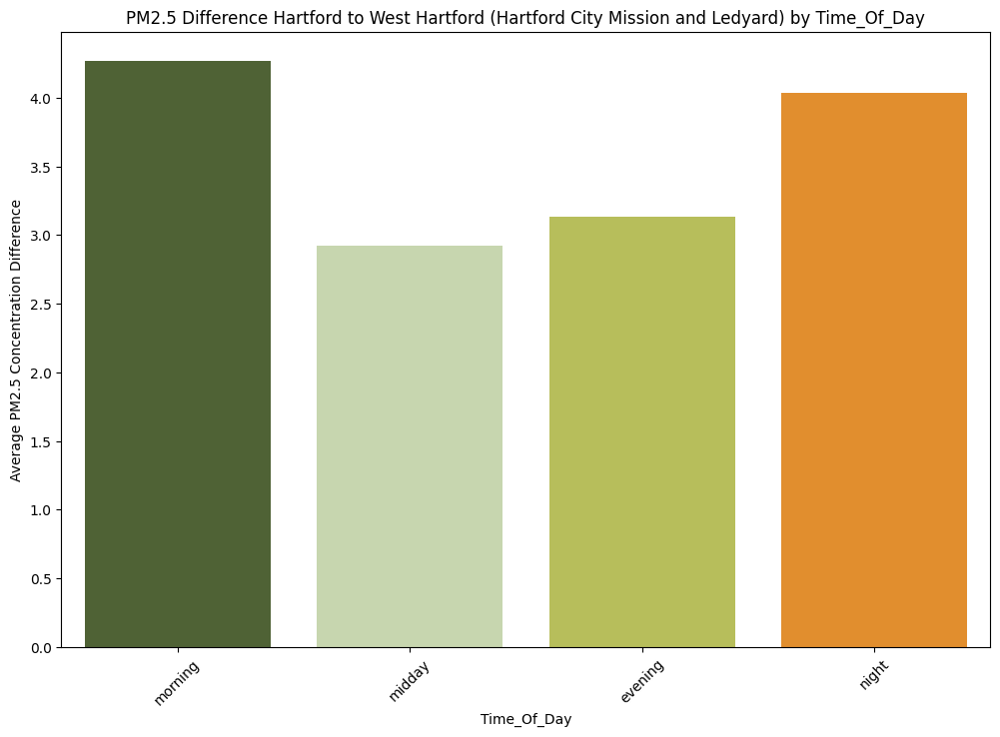

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


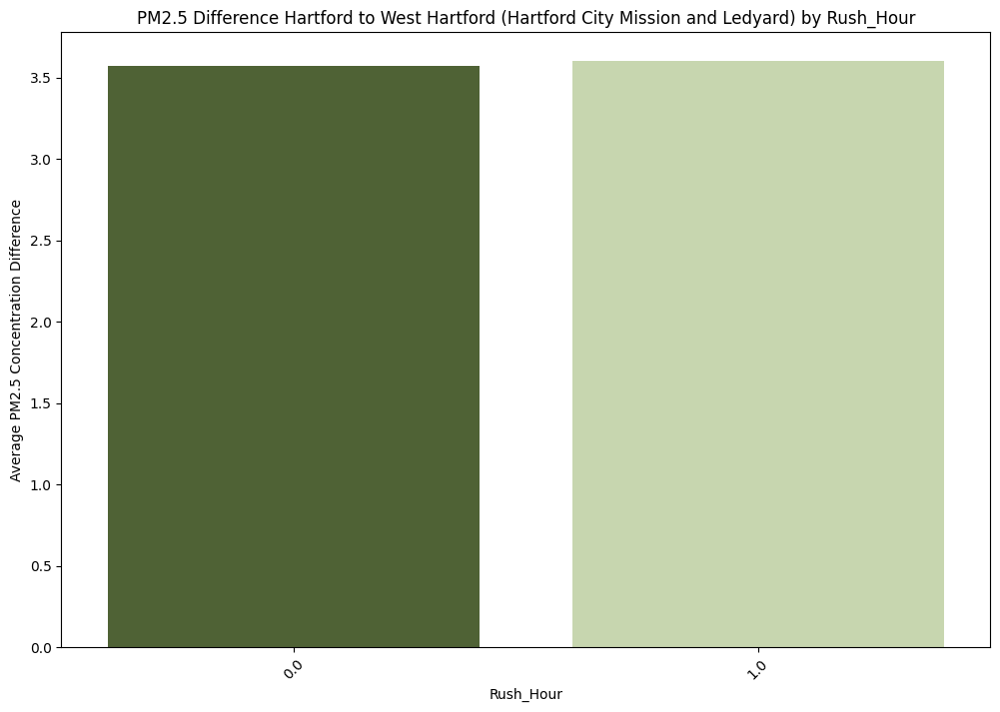

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


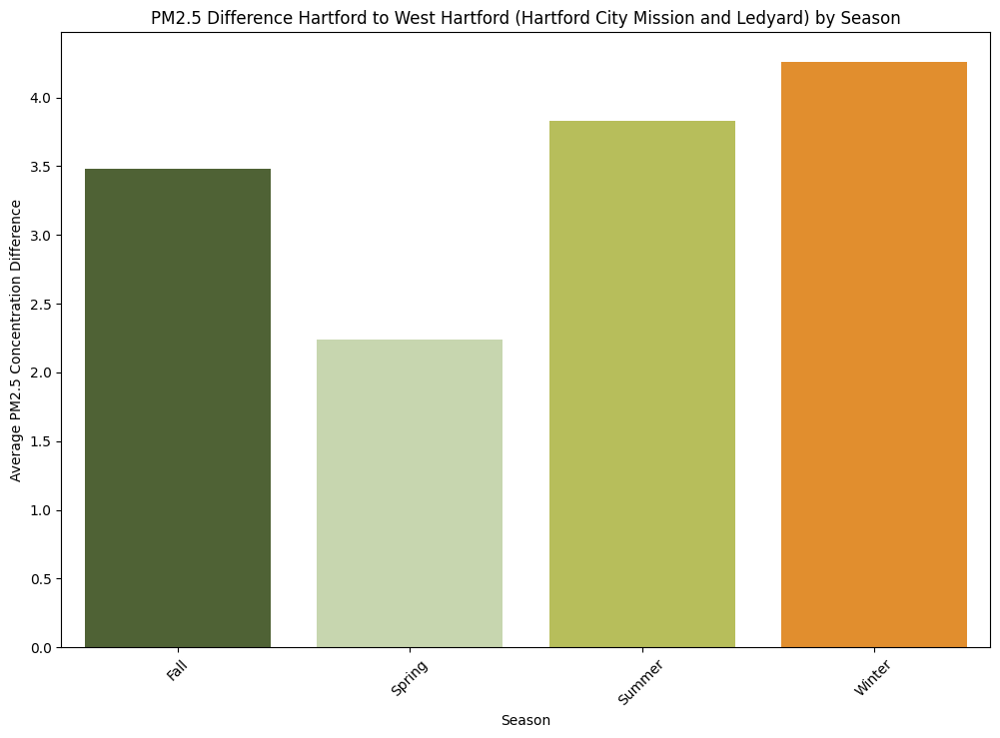

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


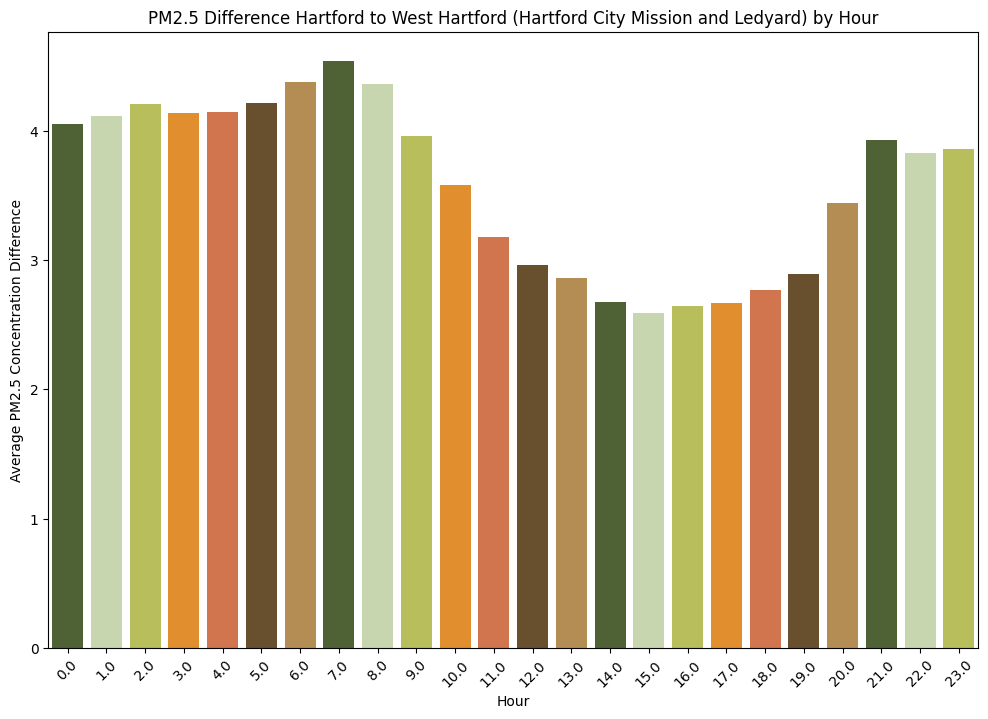

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


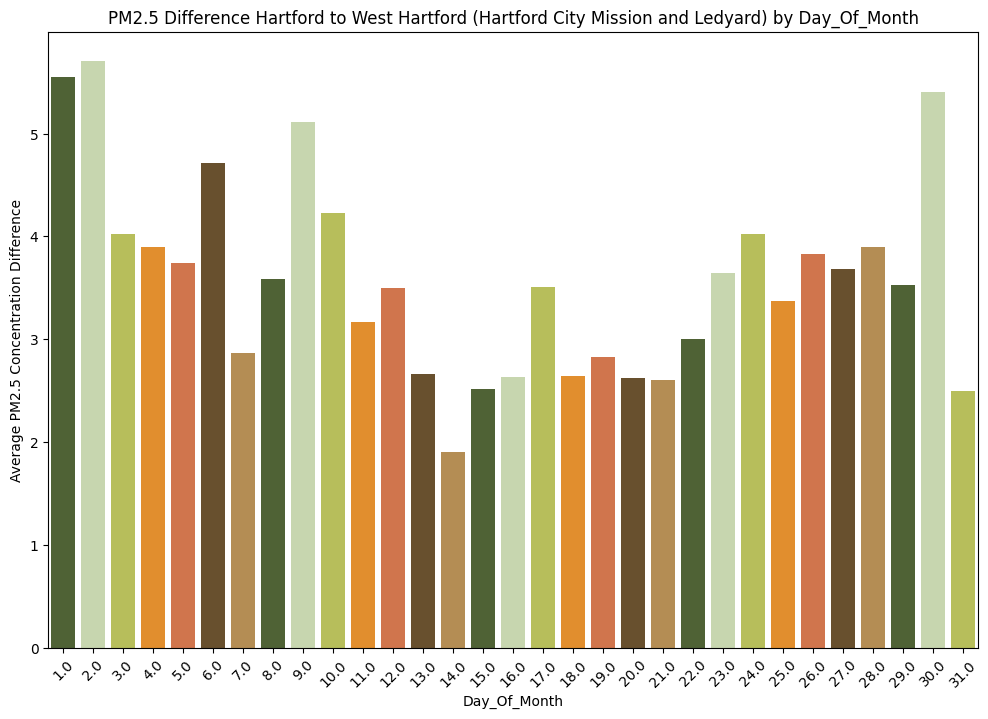

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


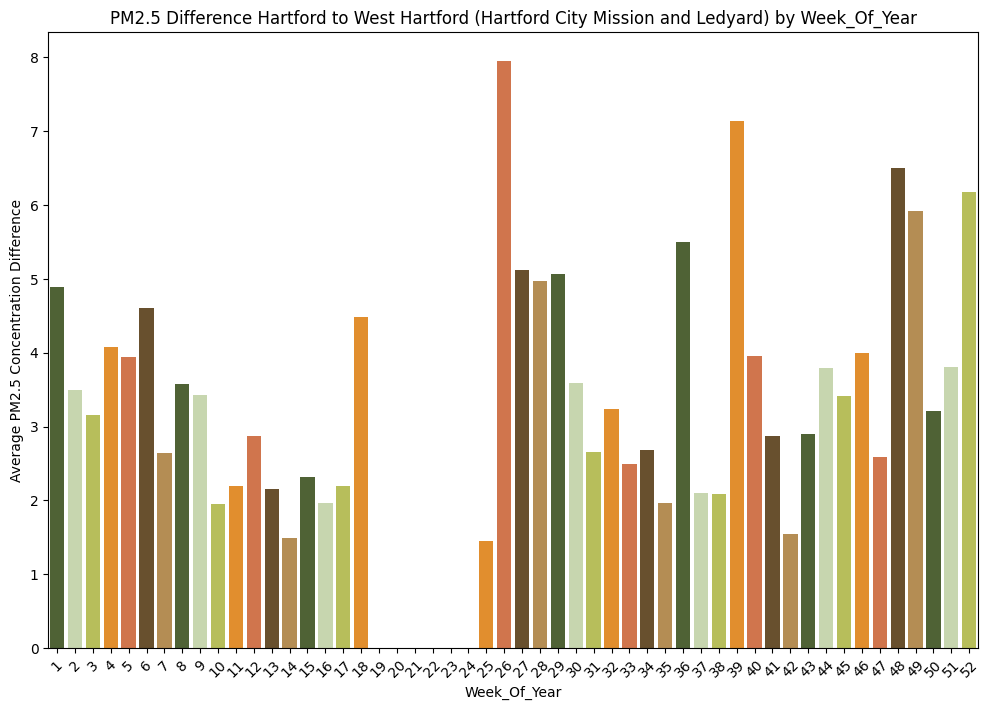

<ipython-input-268-7f91ad0b2ea8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
<ipython-input-268-7f91ad0b2ea8>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)


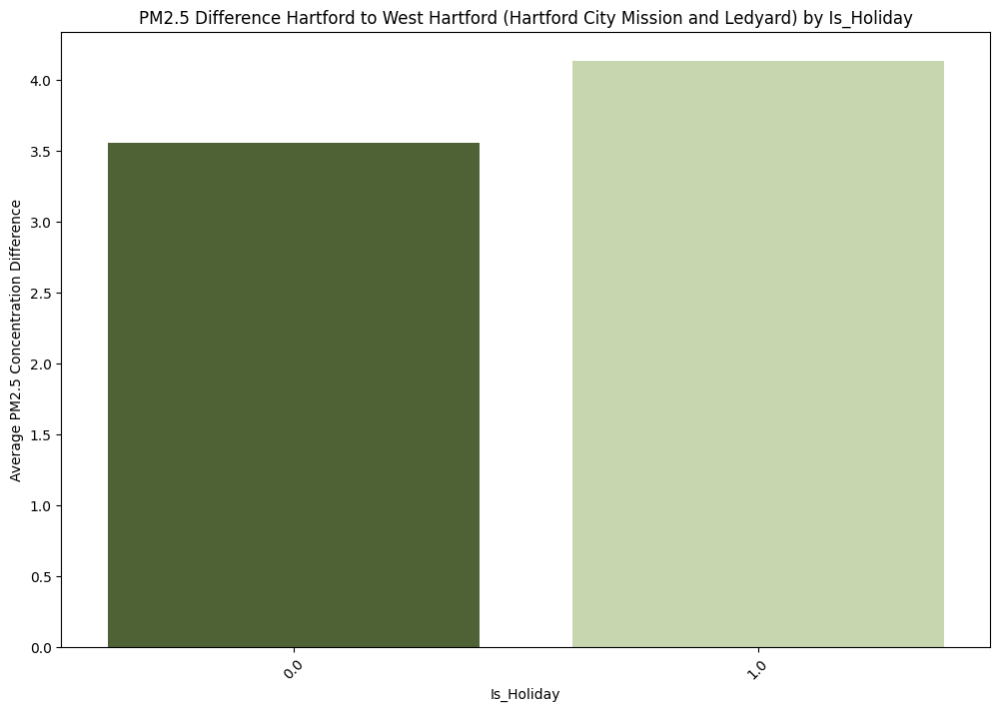

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)', palette=palette)
    plt.title(f'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

##PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


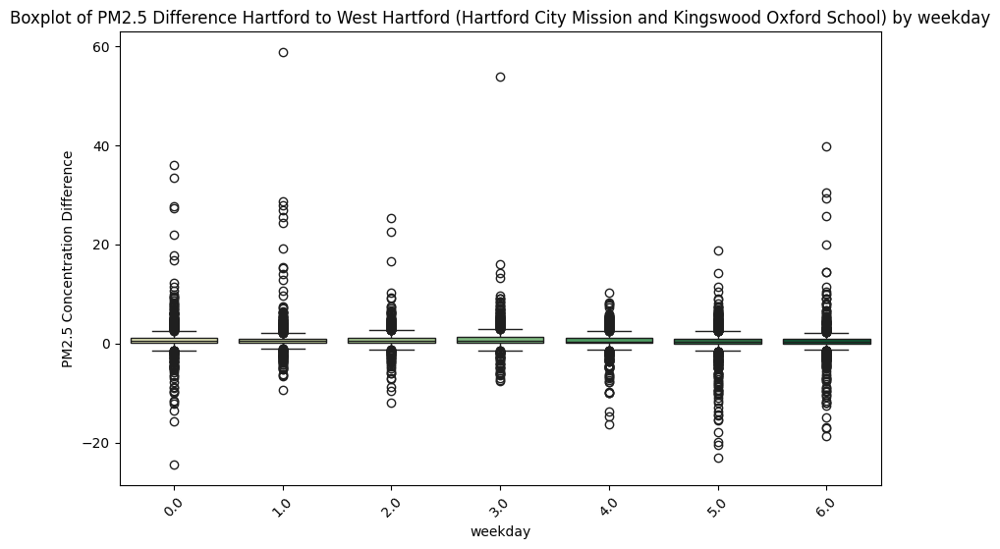

<ipython-input-269-5707395afa38>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


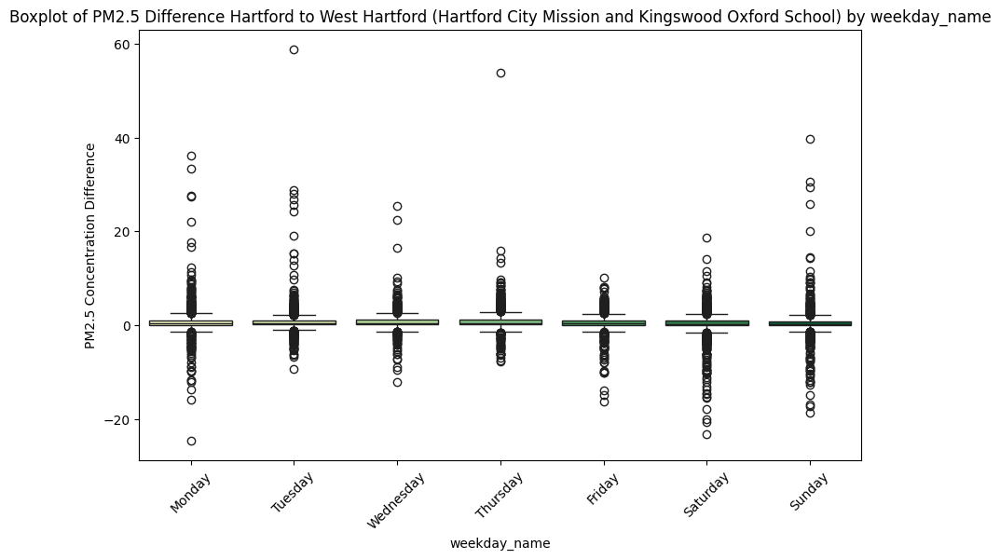

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


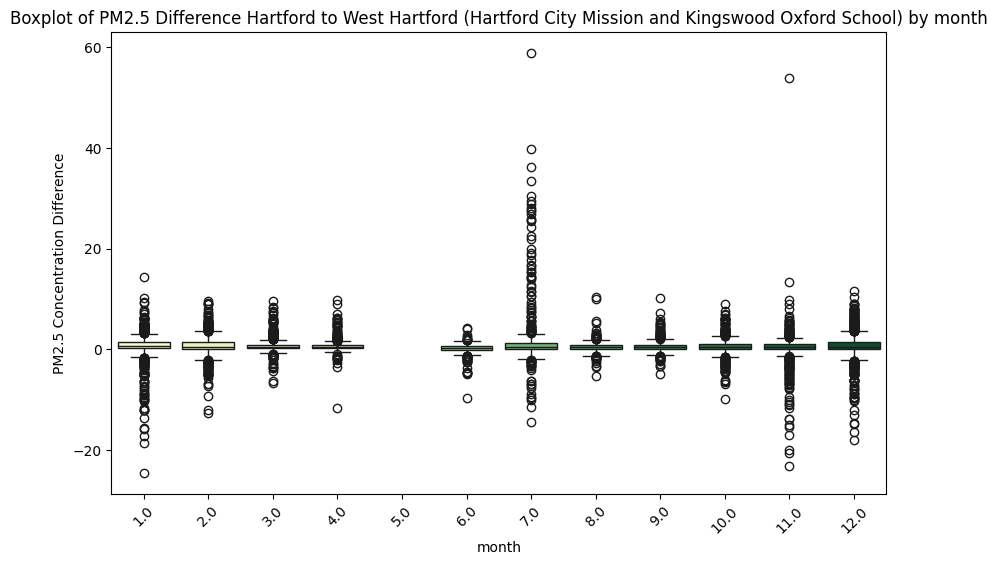

<ipython-input-269-5707395afa38>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


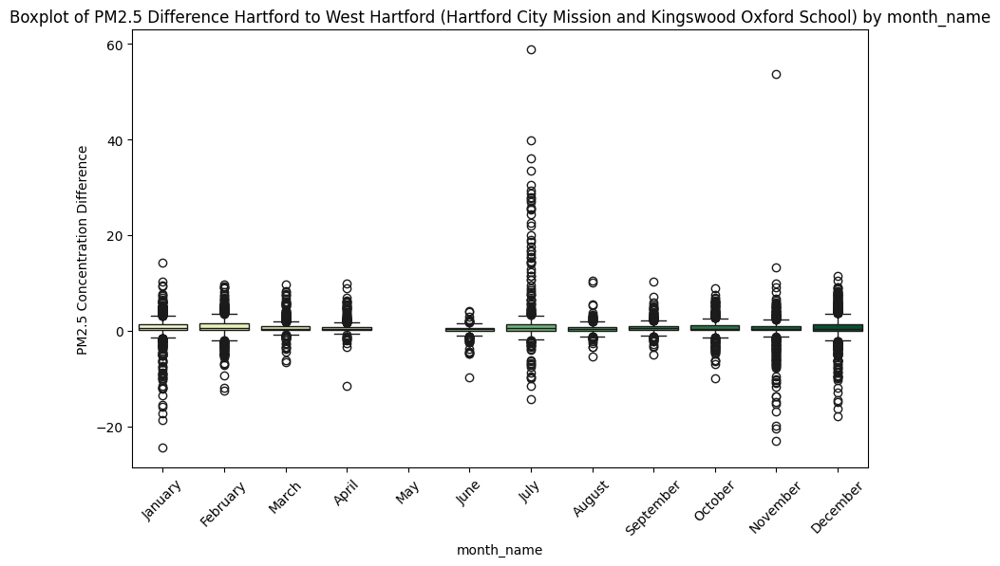

<ipython-input-269-5707395afa38>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


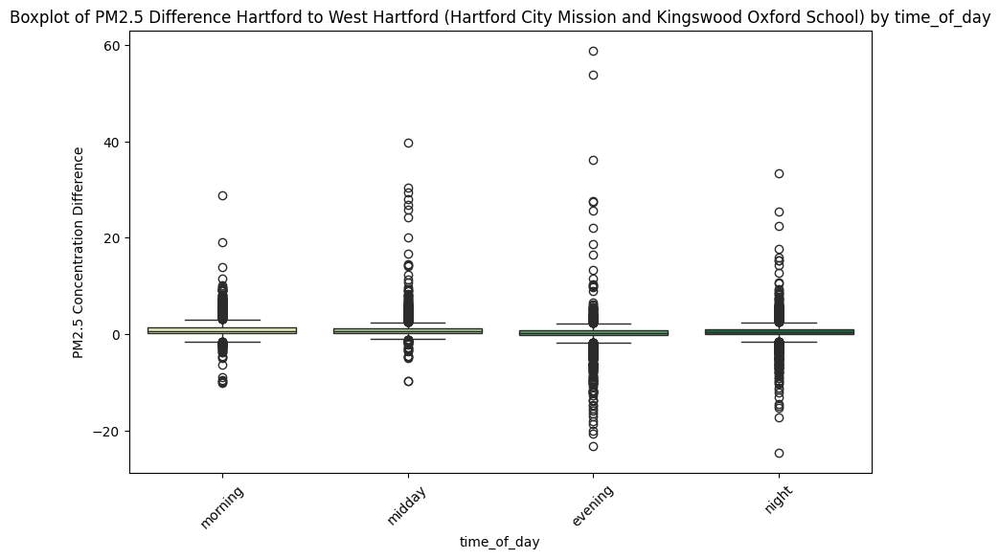

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


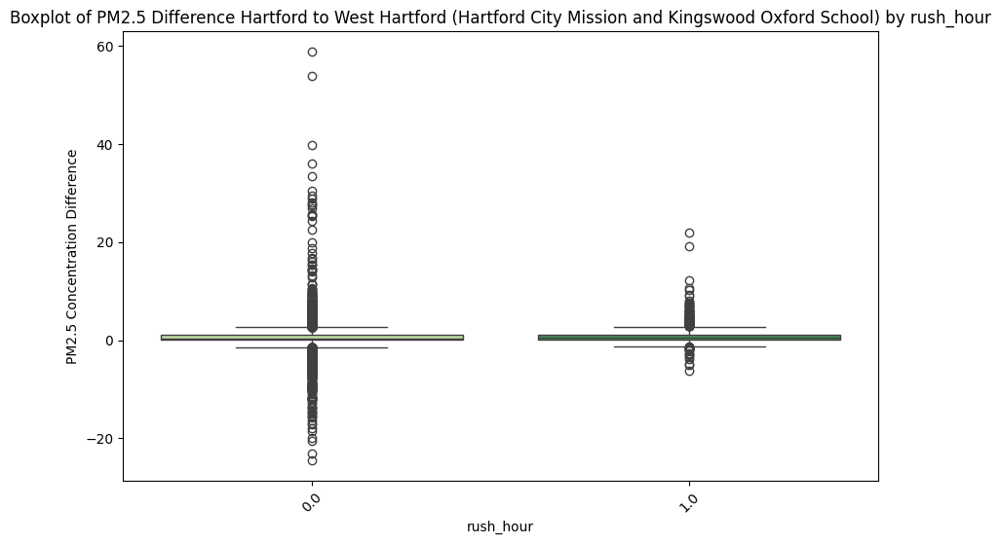

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


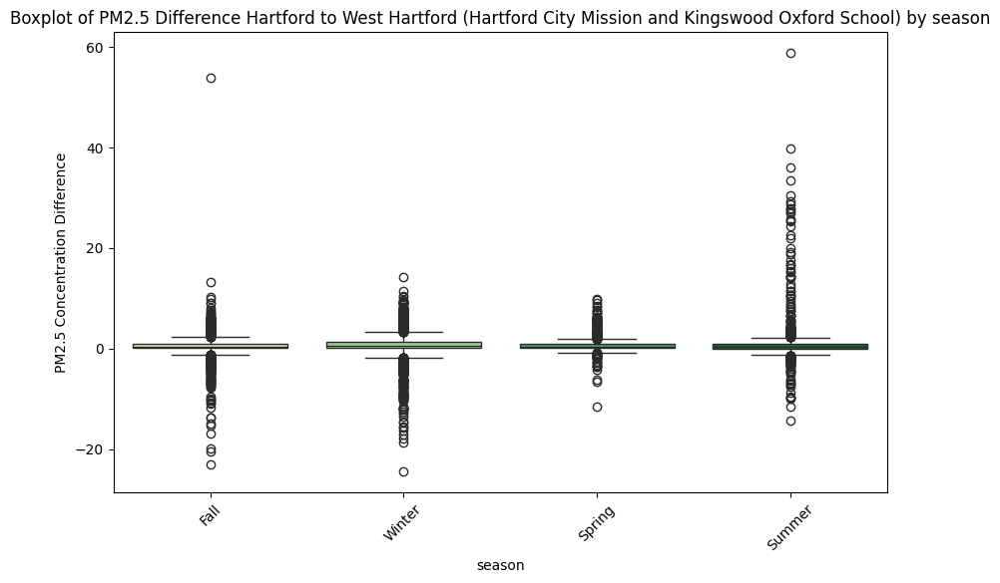

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


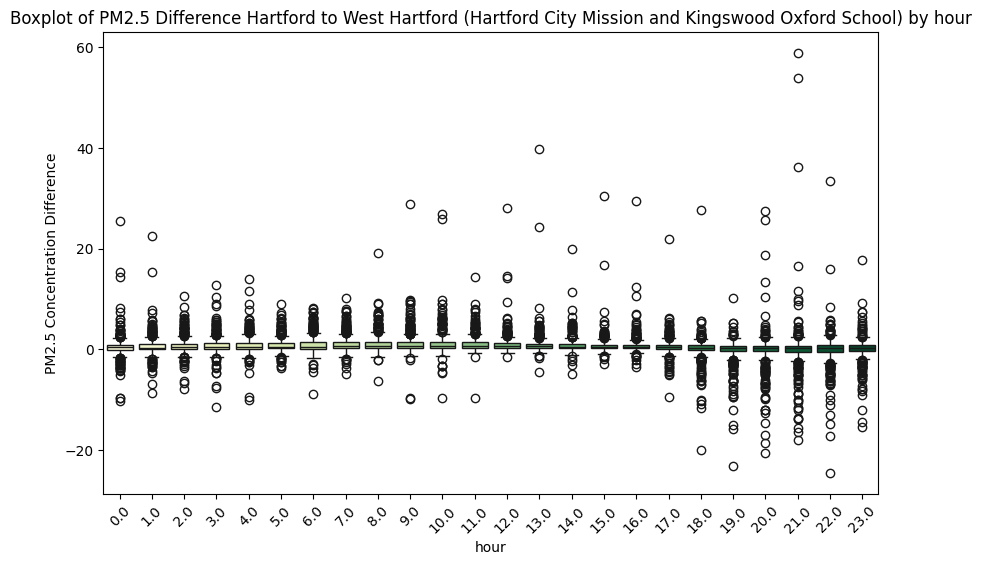

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


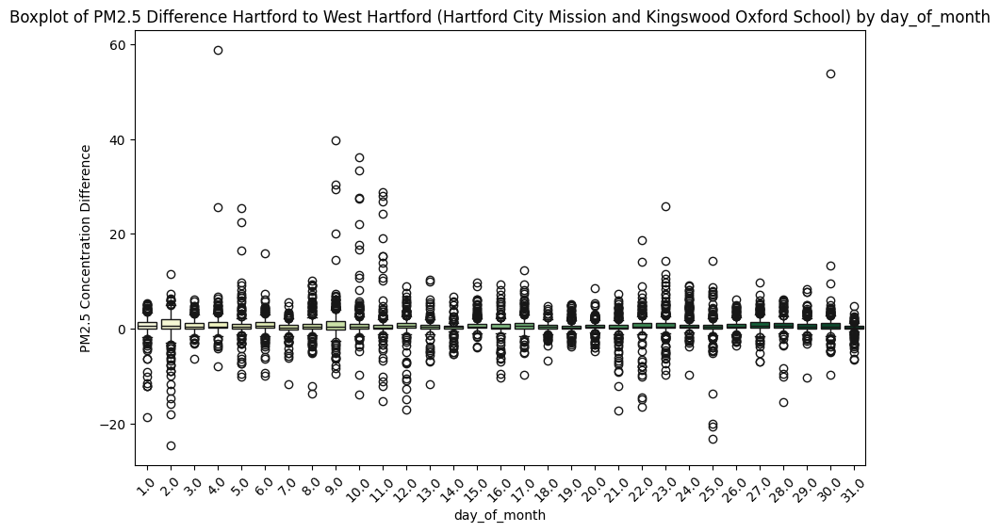

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


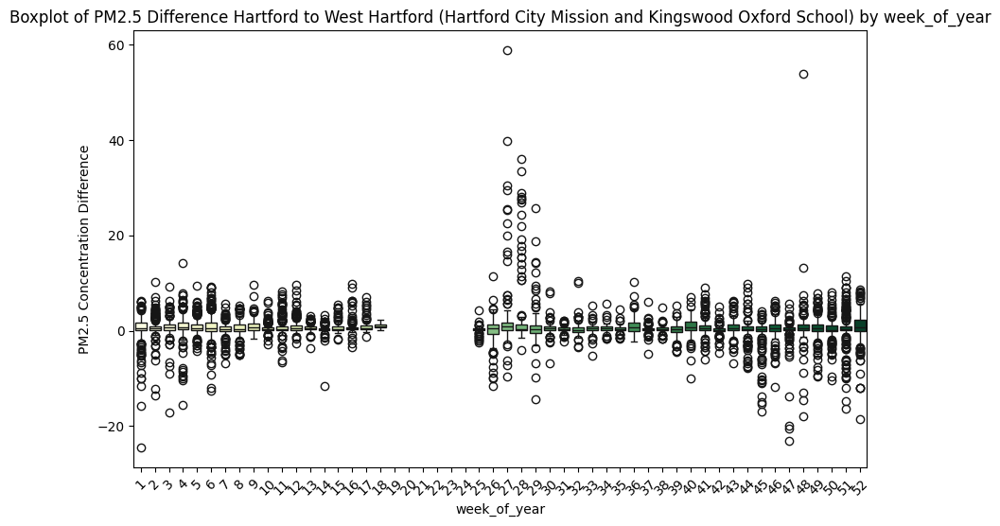

<ipython-input-269-5707395afa38>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


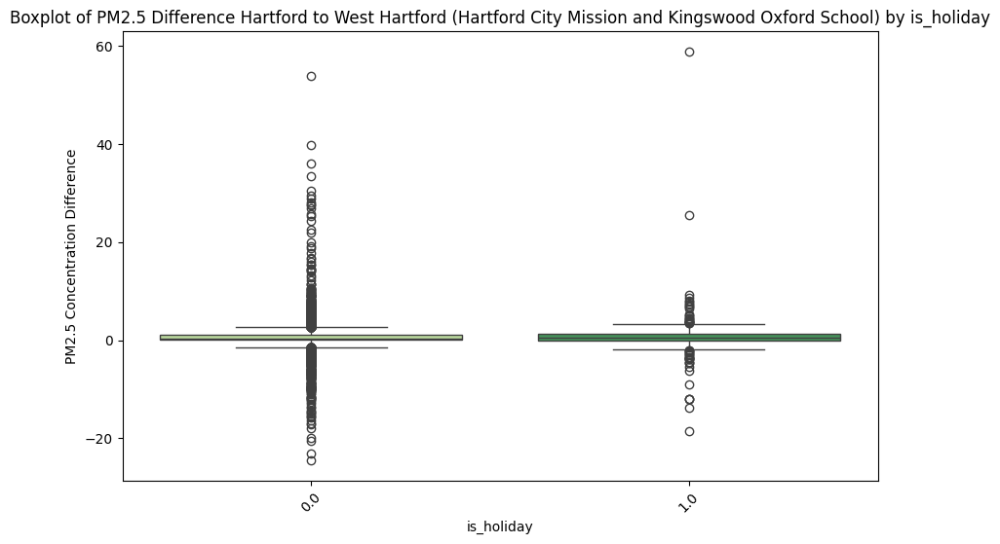

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


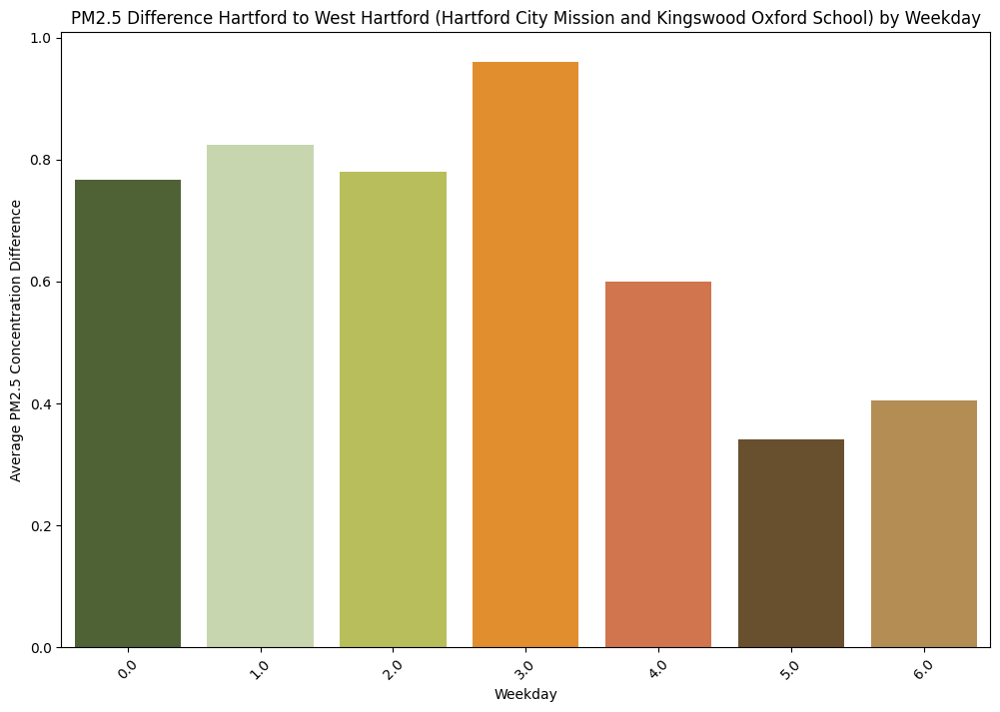

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


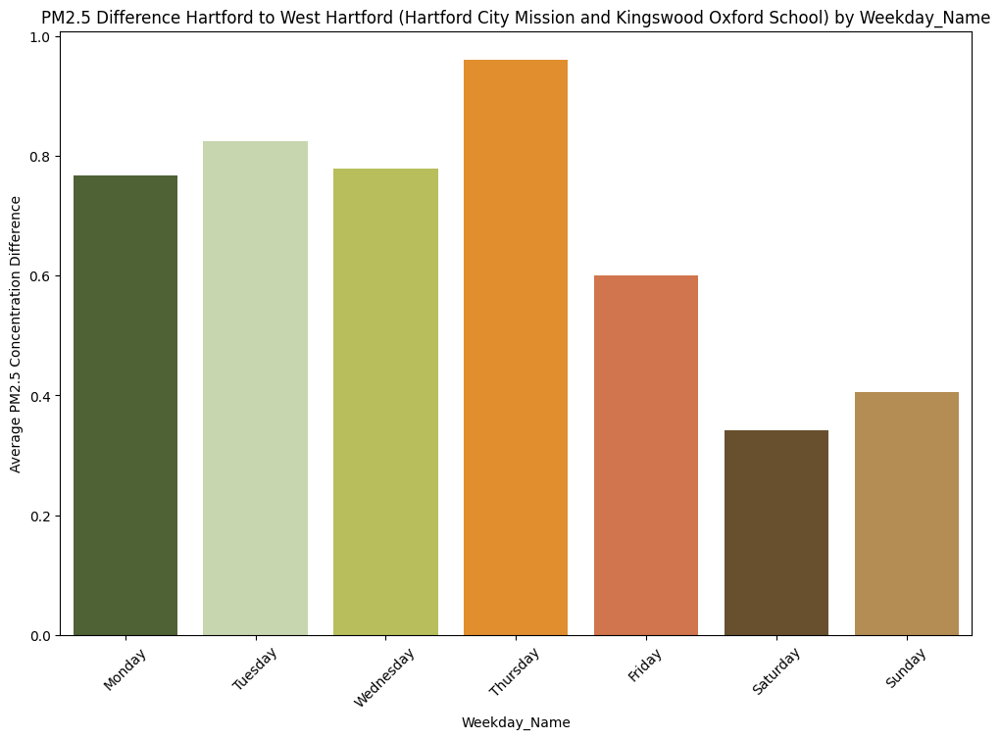

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


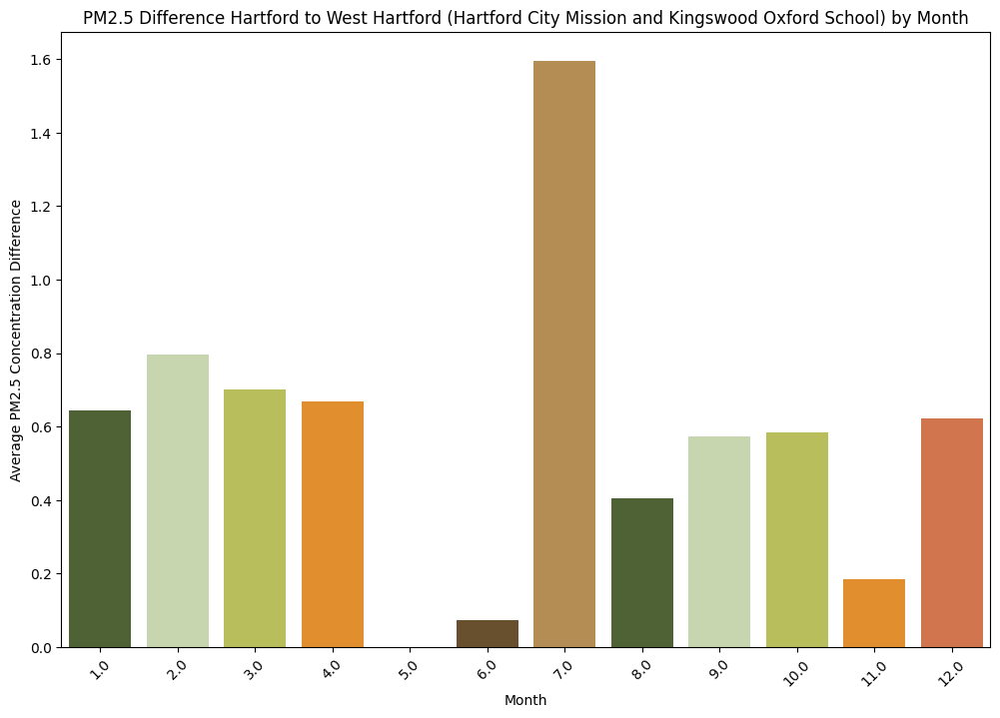

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


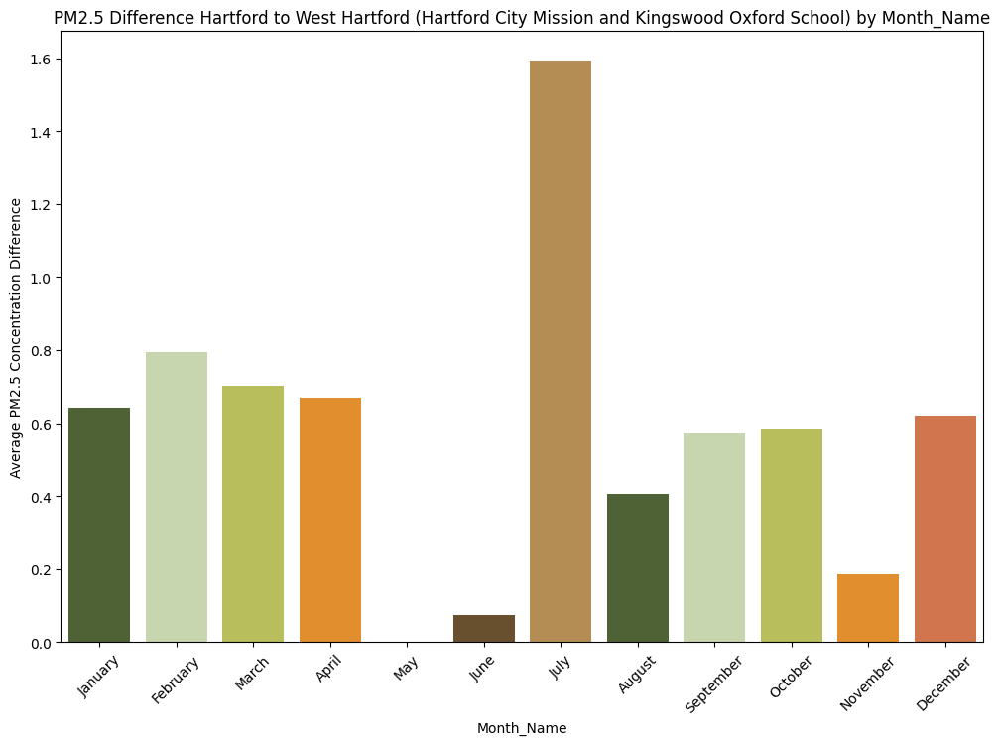

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


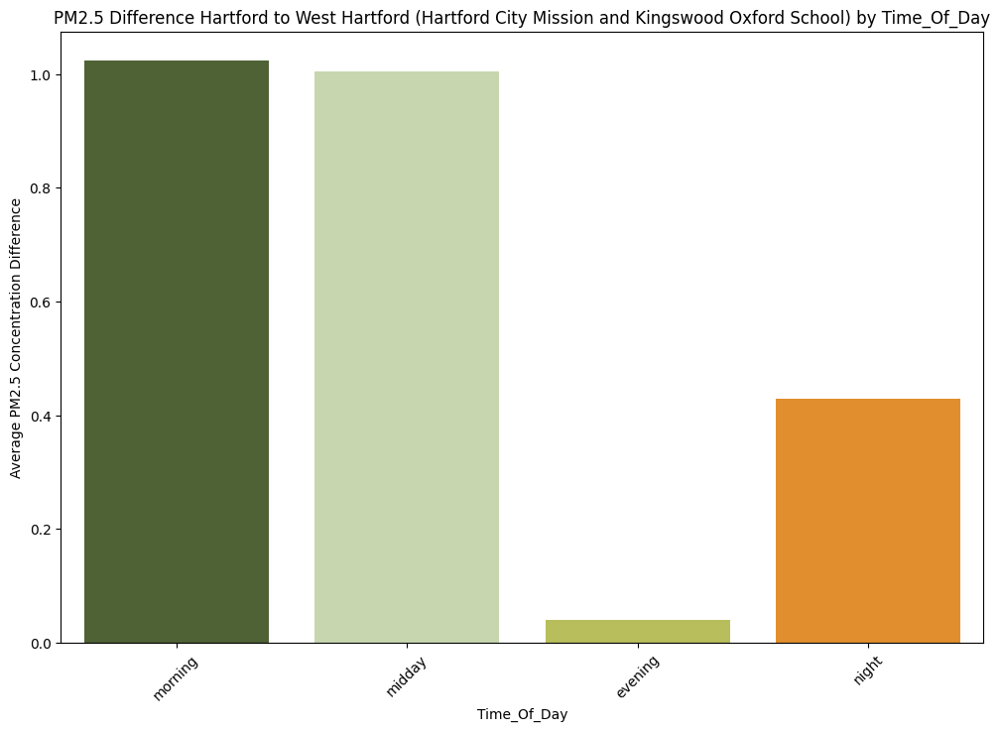

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


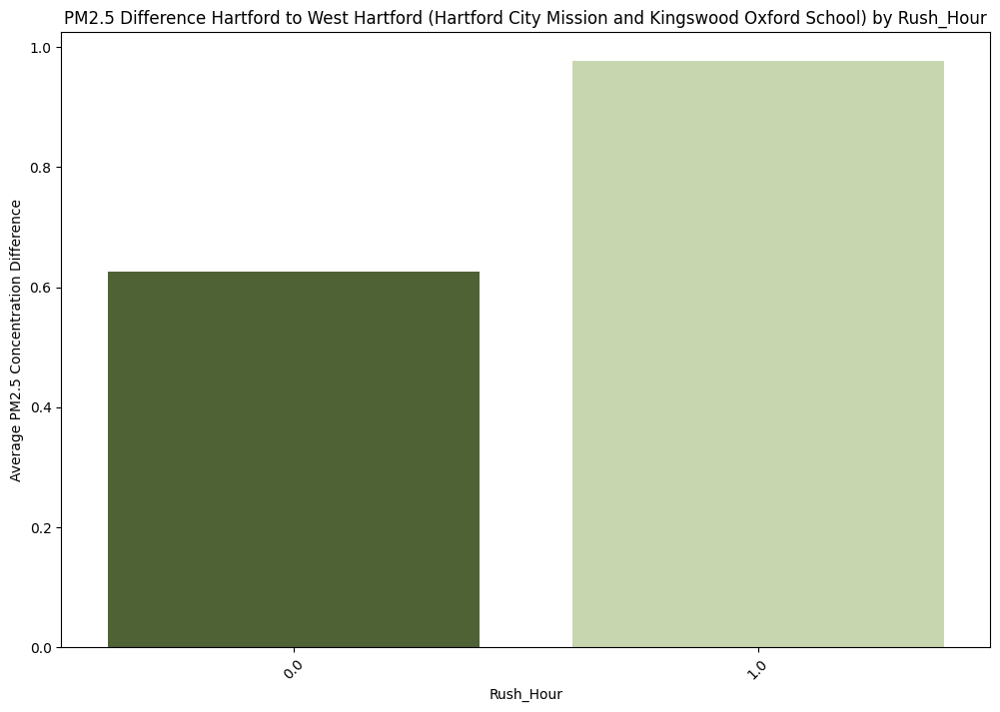

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


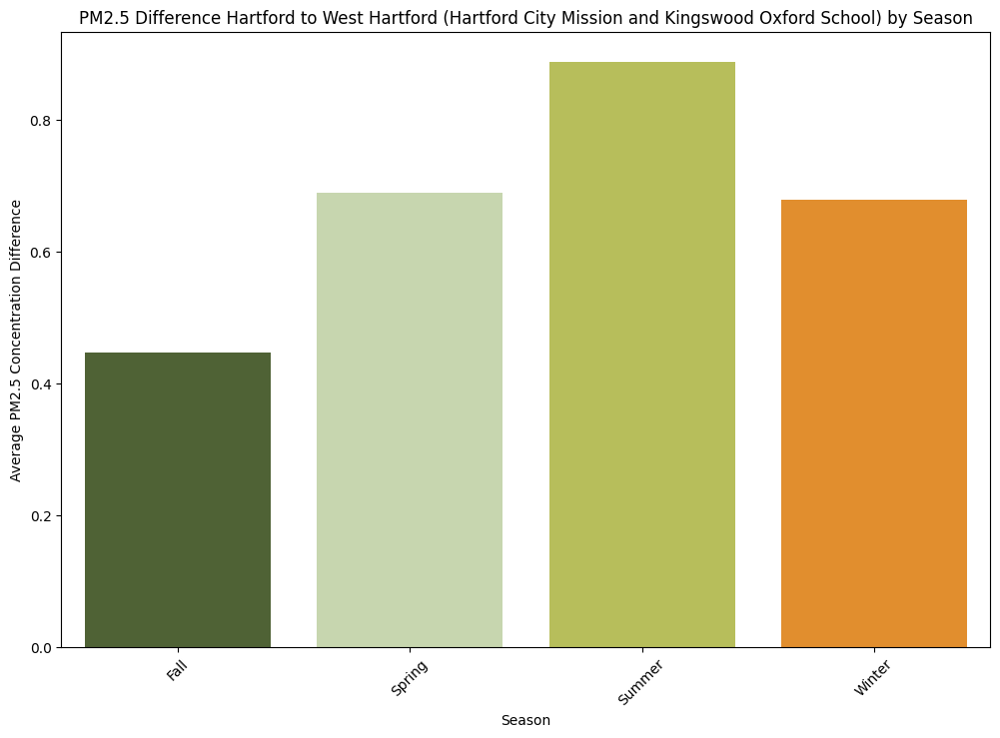

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


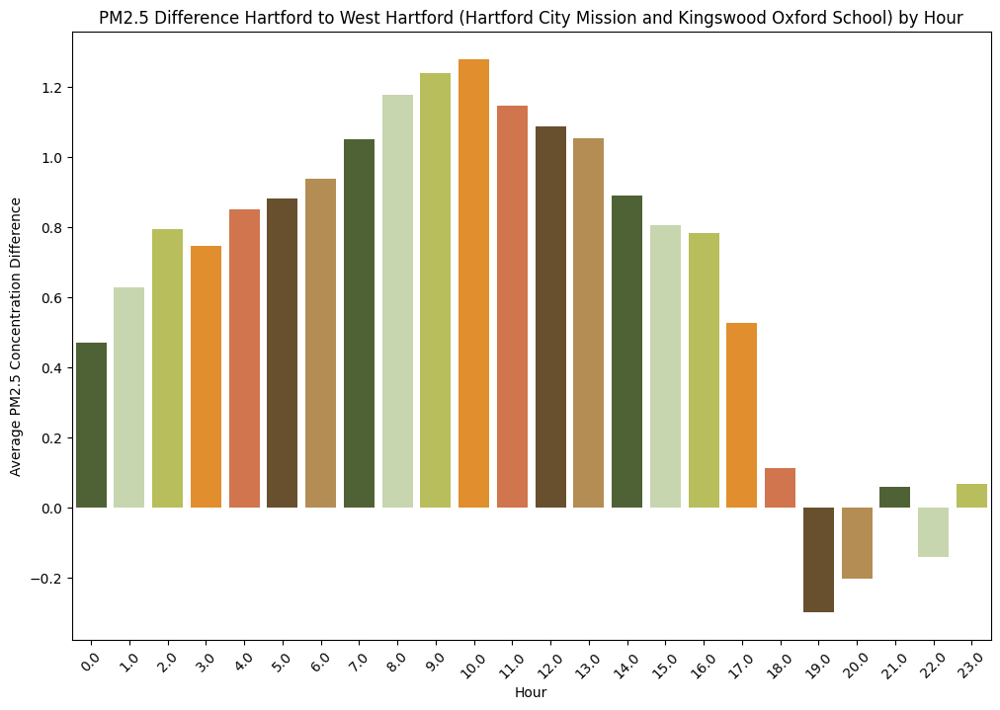

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


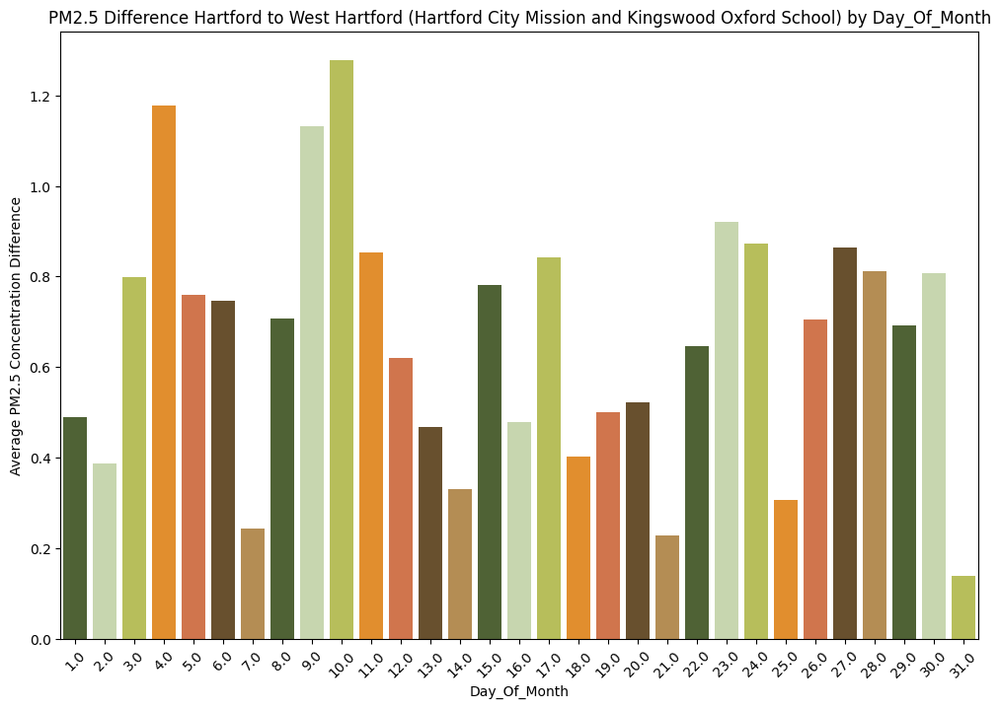

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


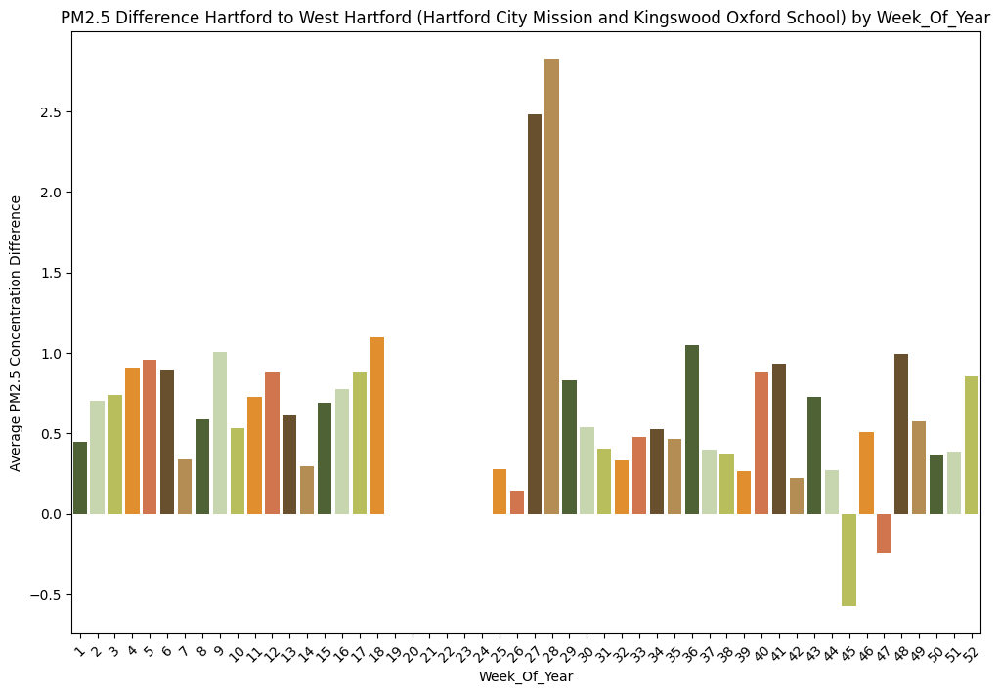

<ipython-input-270-5037e342cf9c>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
<ipython-input-270-5037e342cf9c>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)


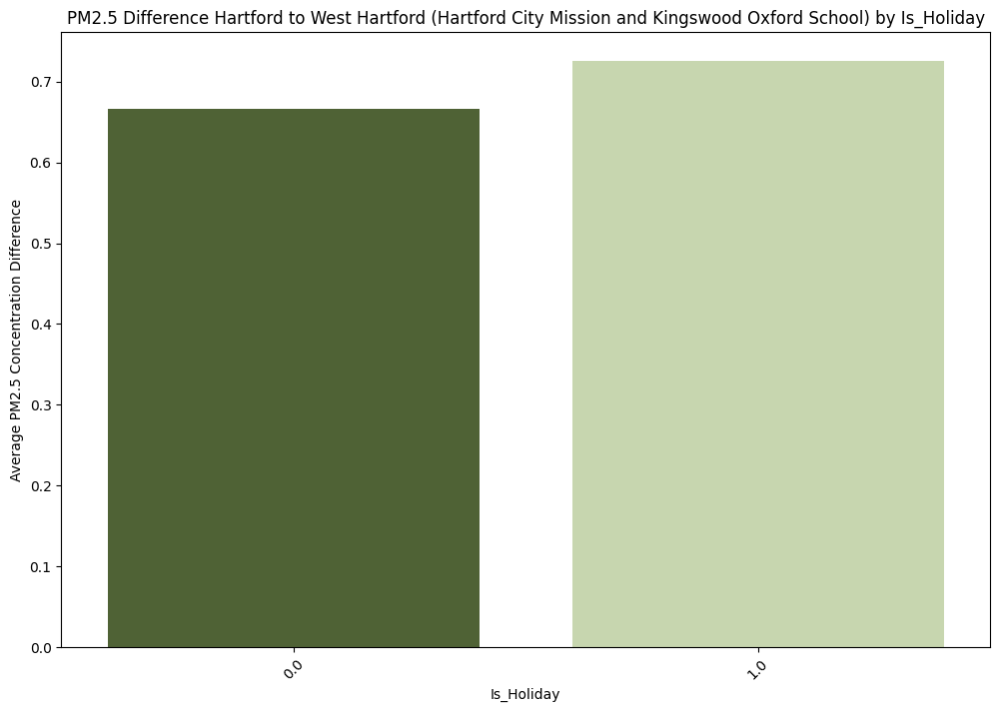

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)', palette=palette)
    plt.title(f'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

##PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


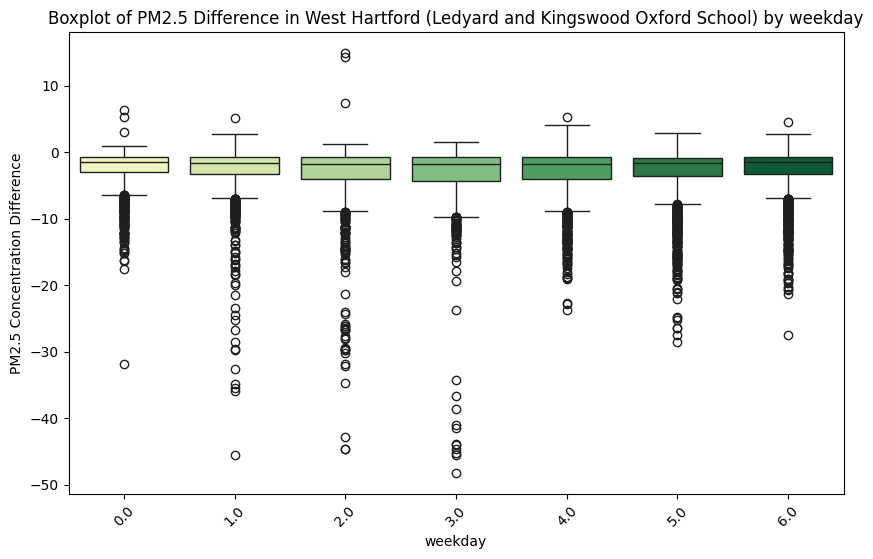

<ipython-input-271-81ff1902e3ae>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


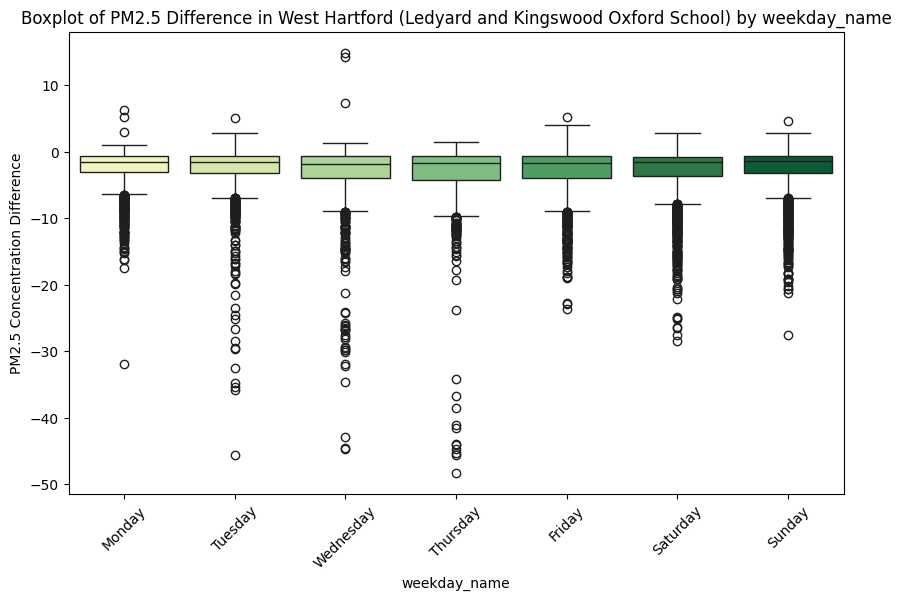

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


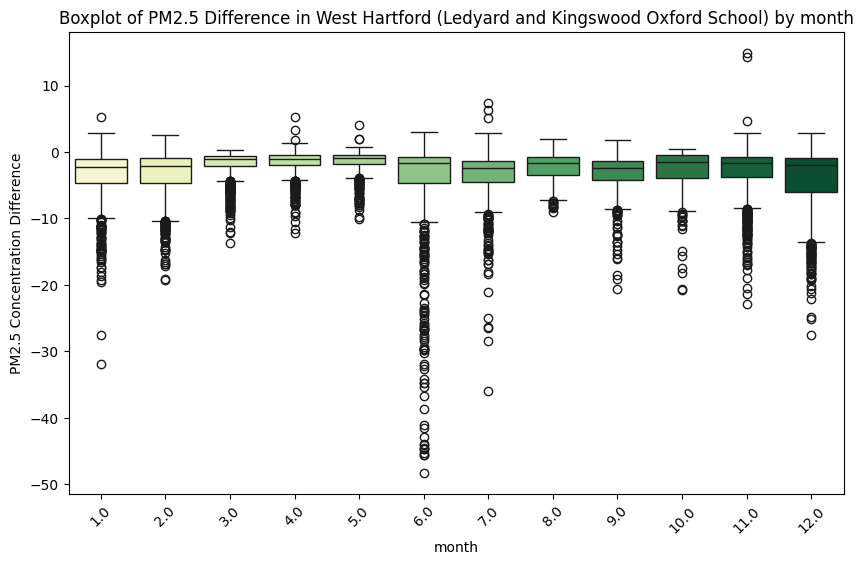

<ipython-input-271-81ff1902e3ae>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


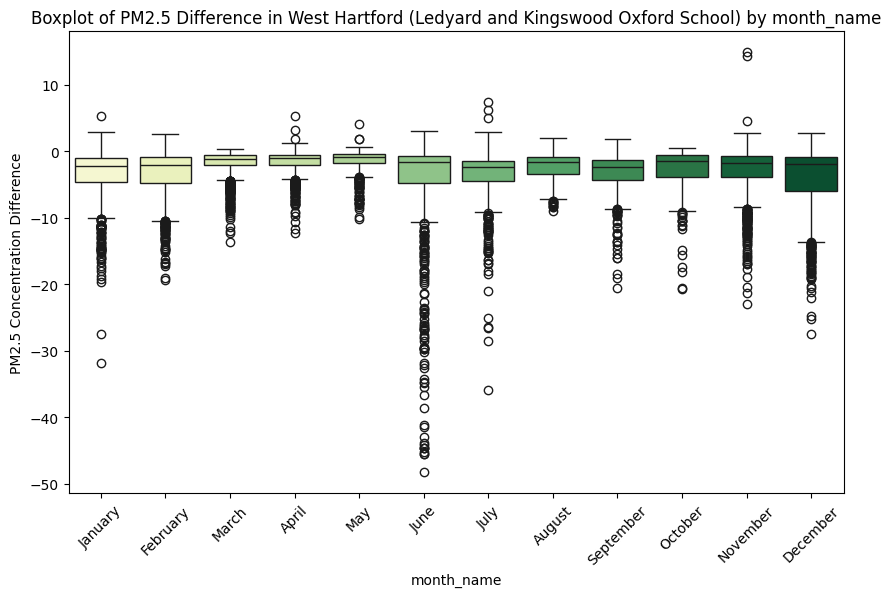

<ipython-input-271-81ff1902e3ae>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


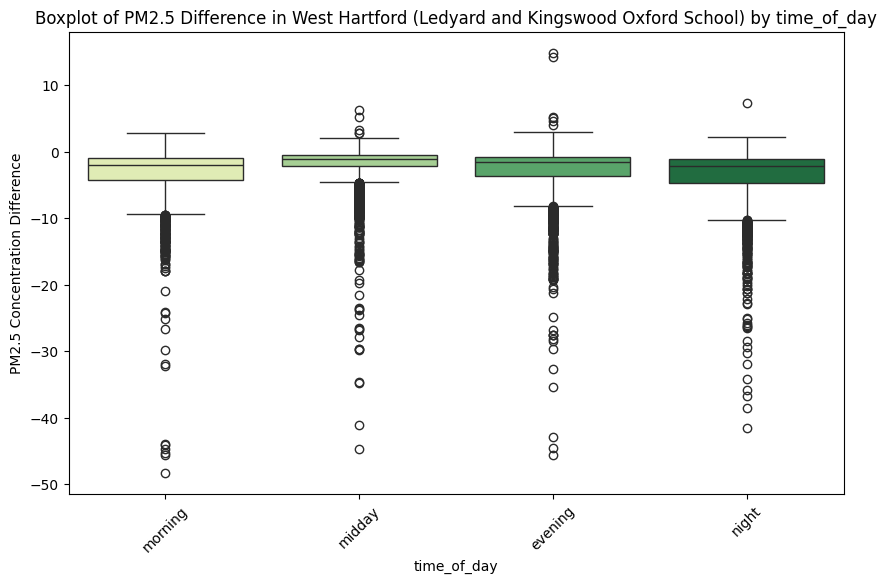

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


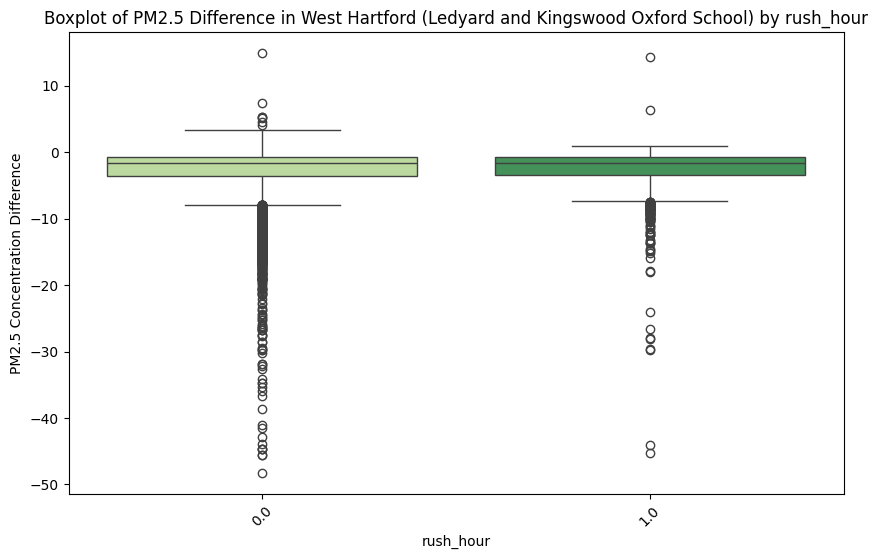

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


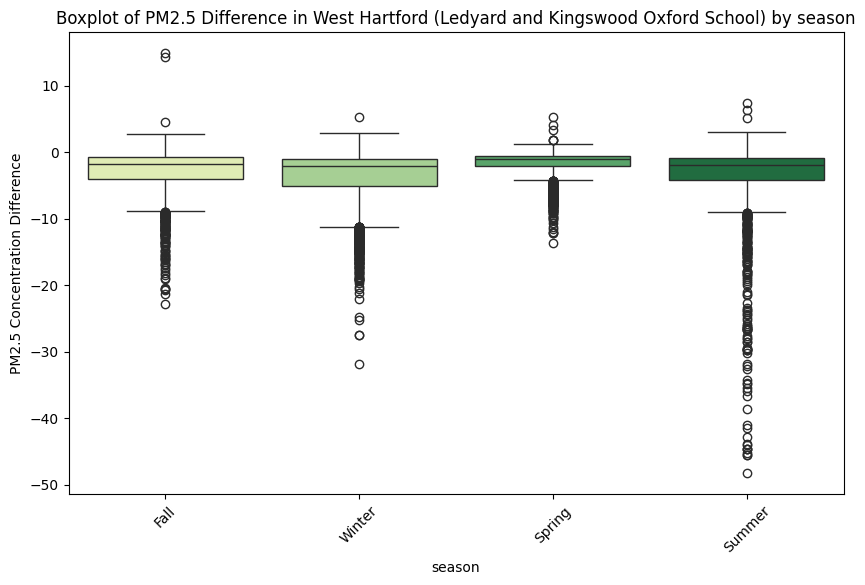

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


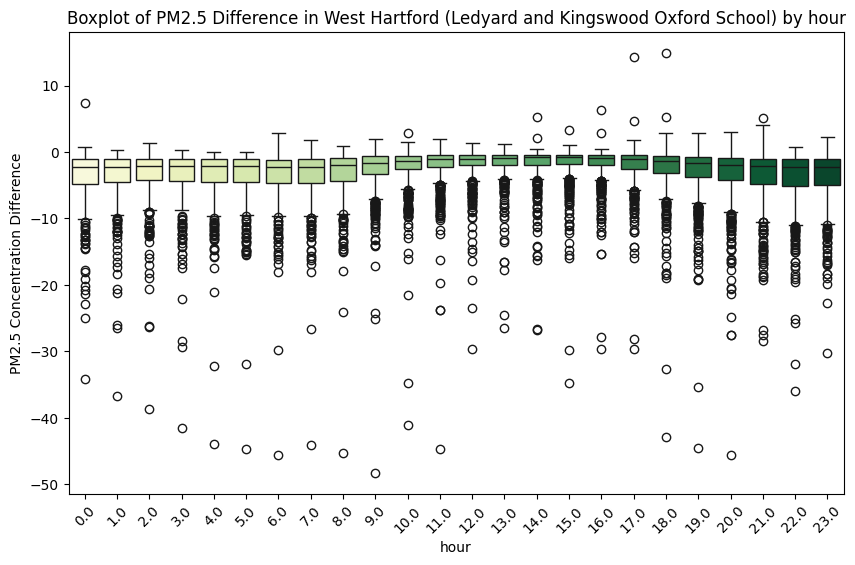

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


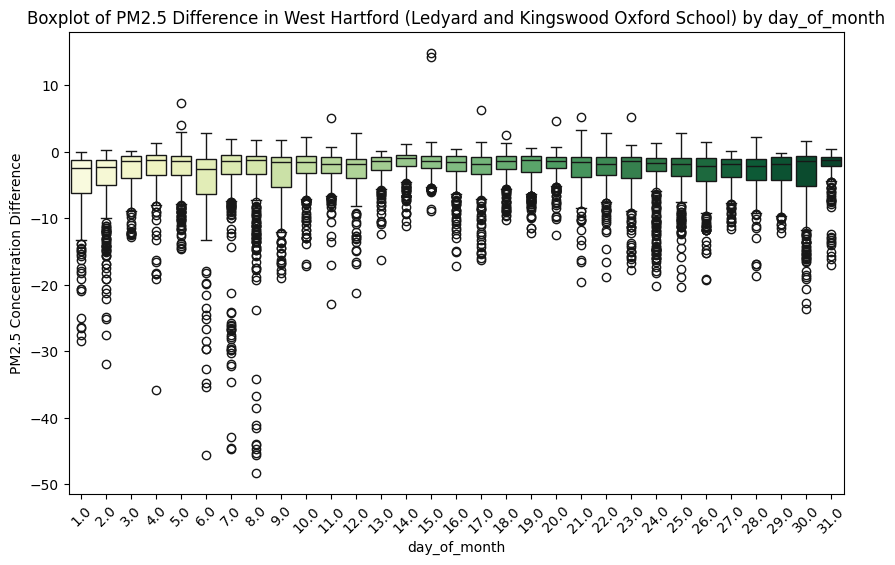

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


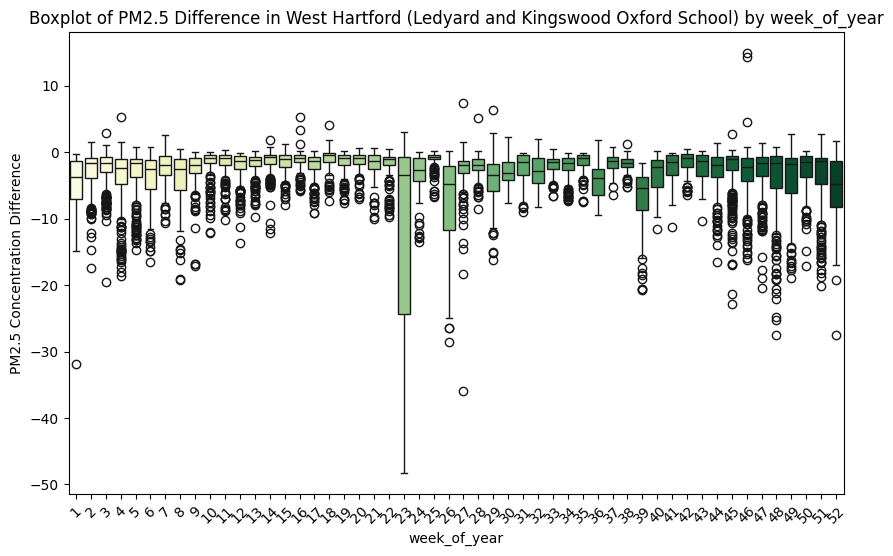

<ipython-input-271-81ff1902e3ae>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')


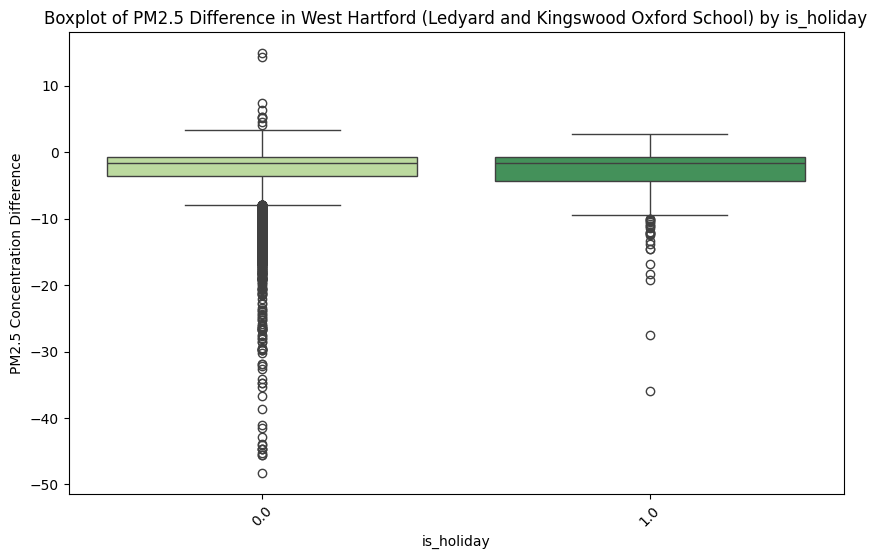

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


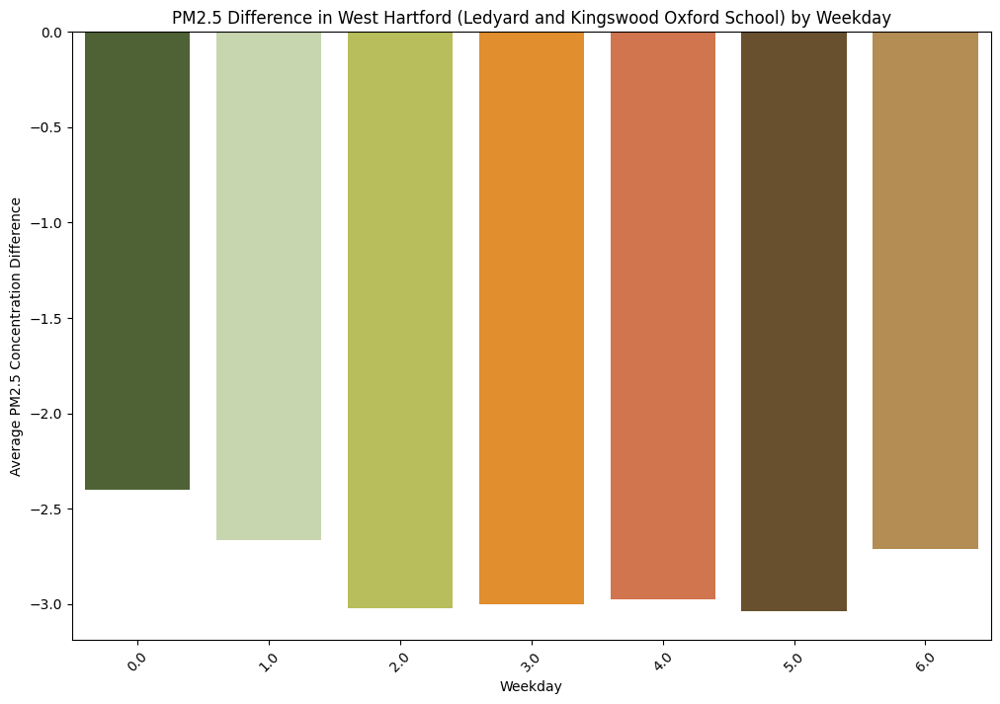

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


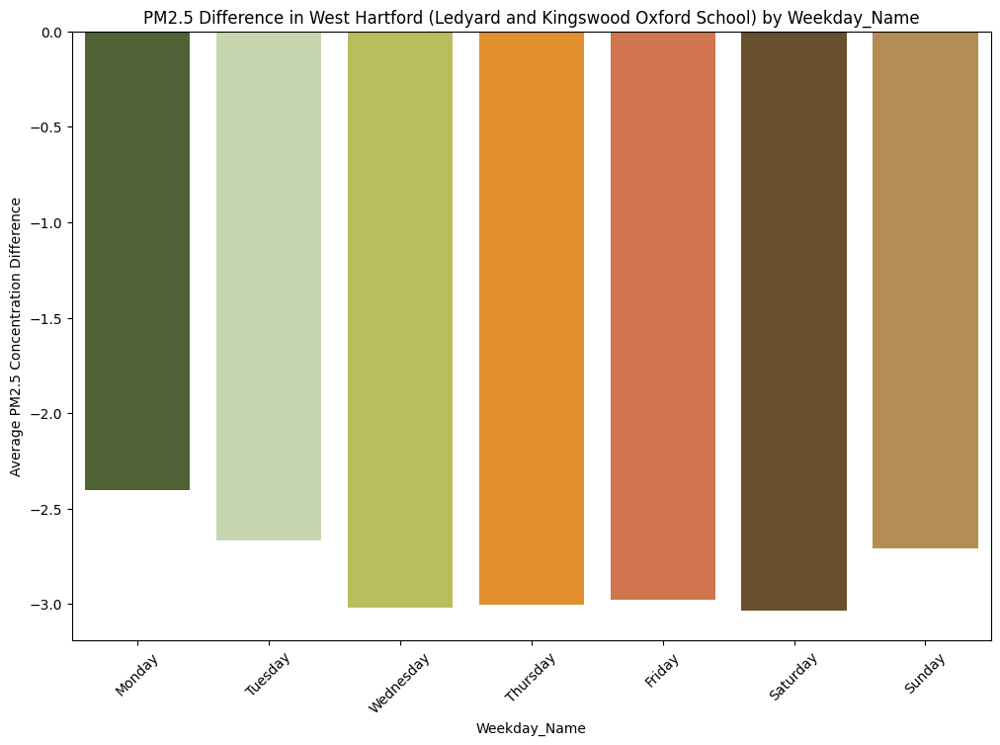

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


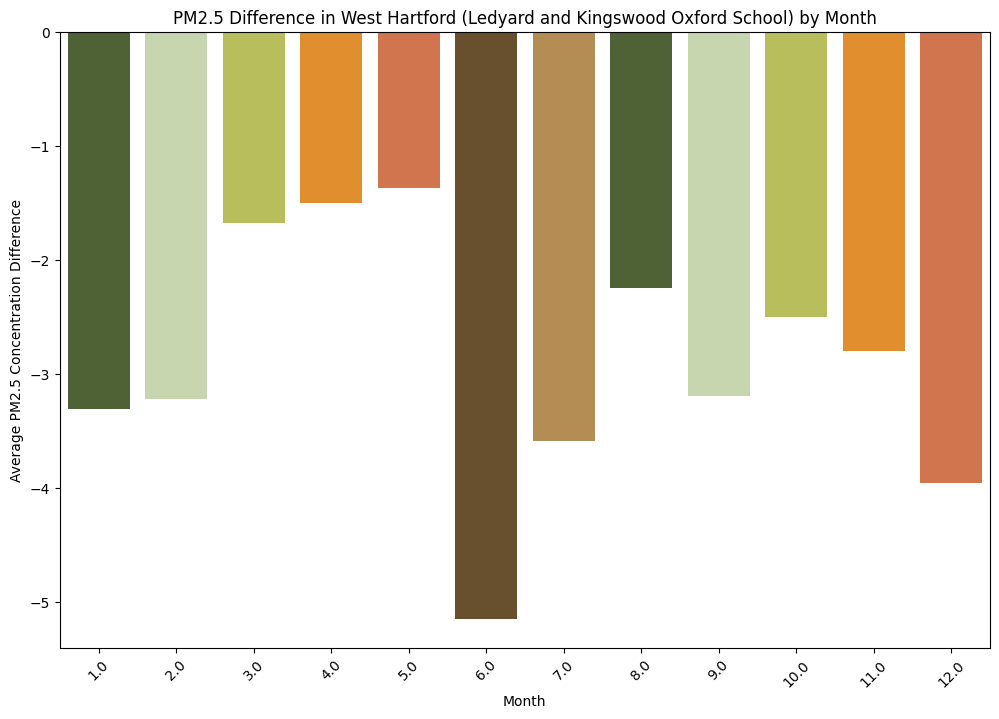

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


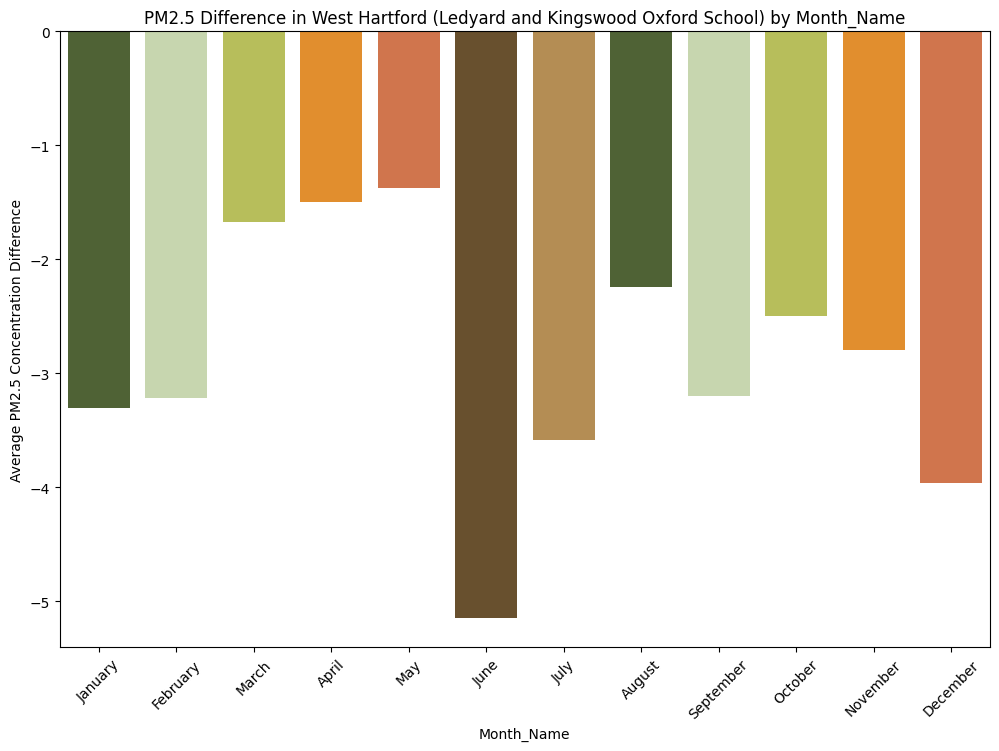

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


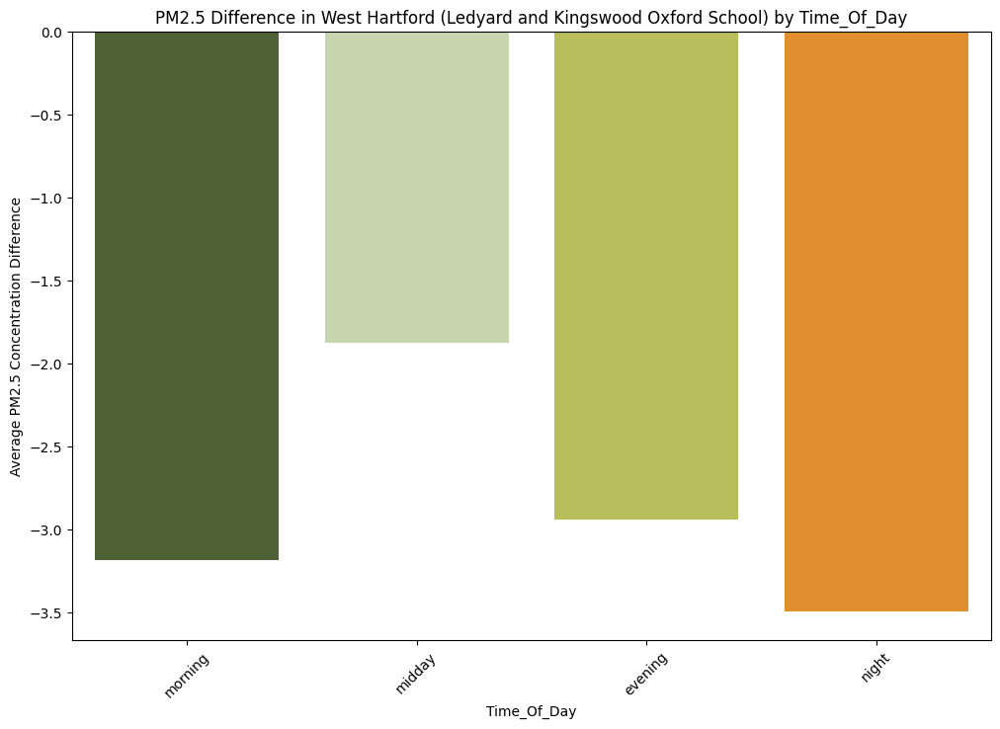

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


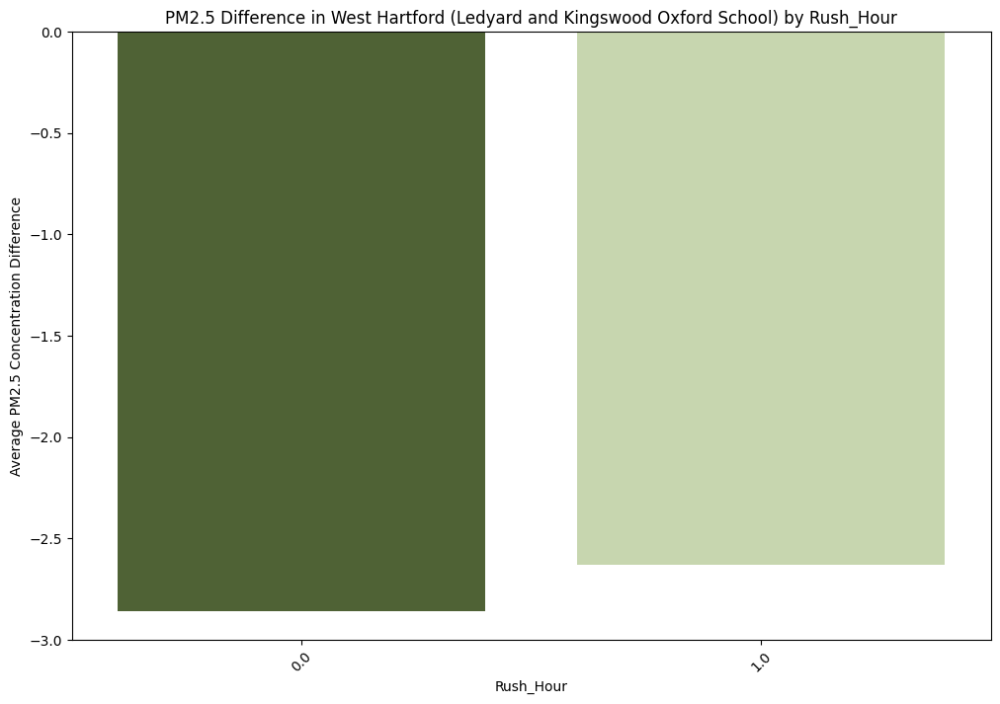

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


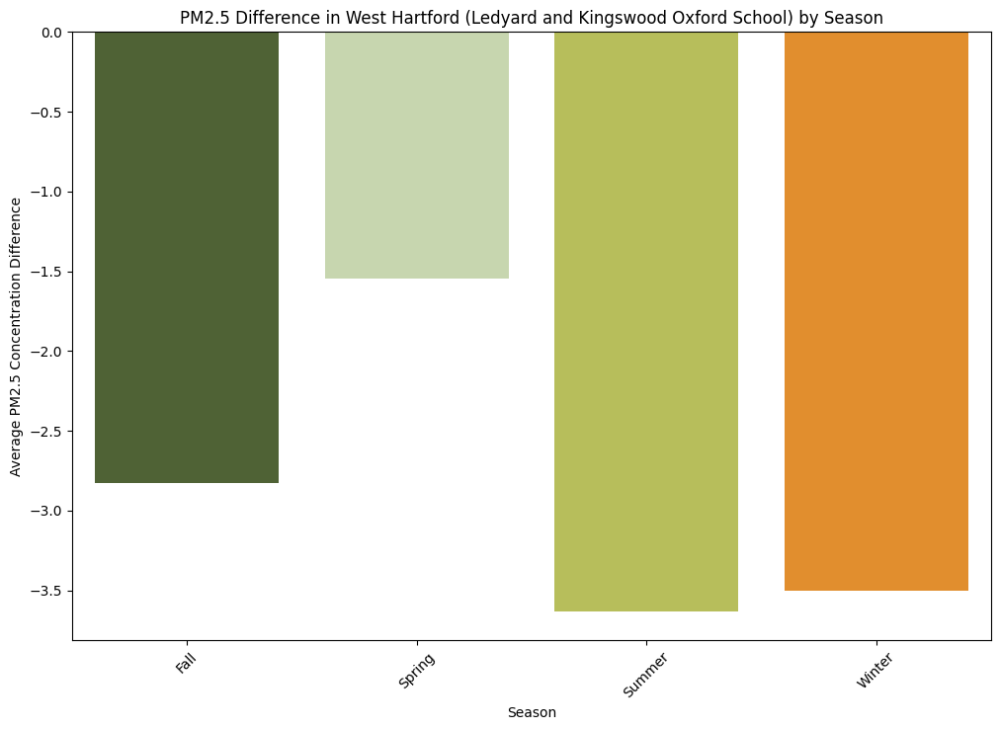

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


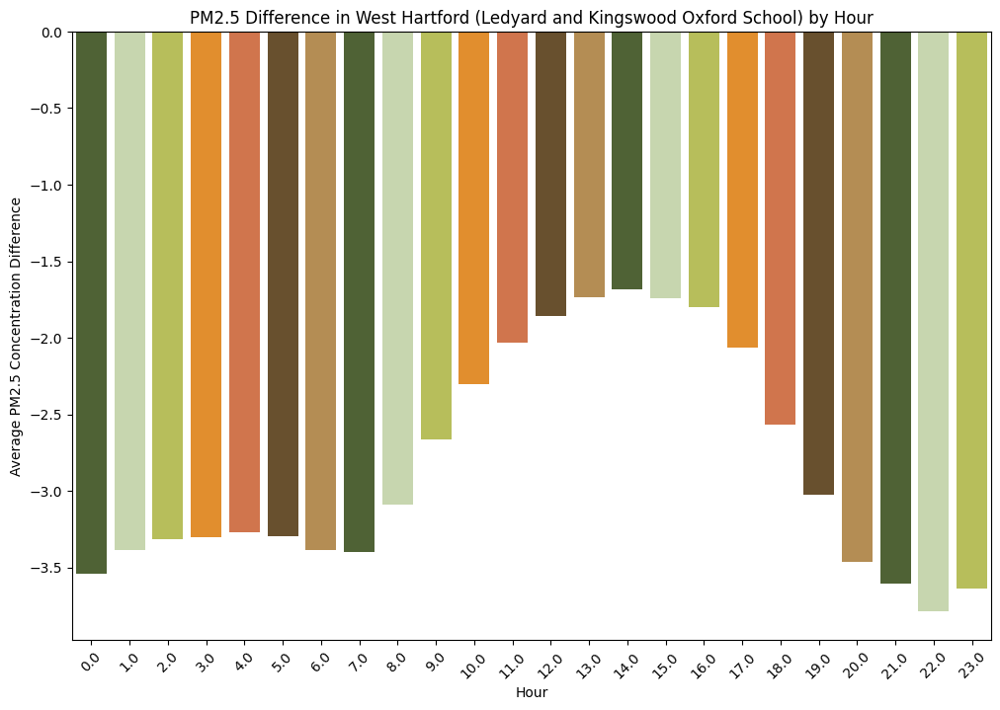

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


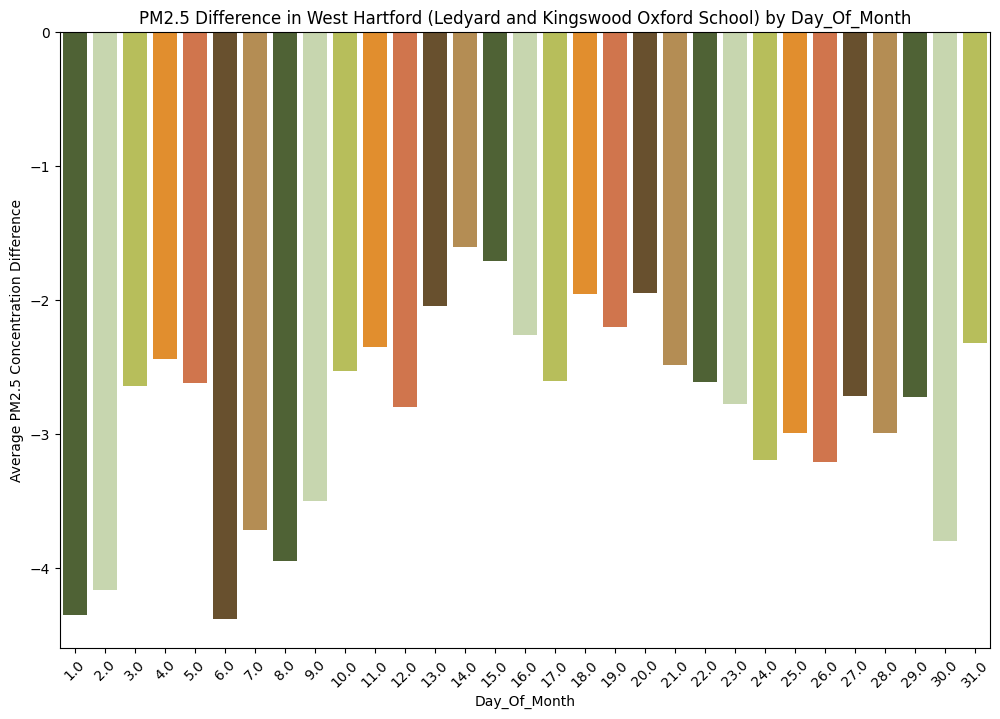

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


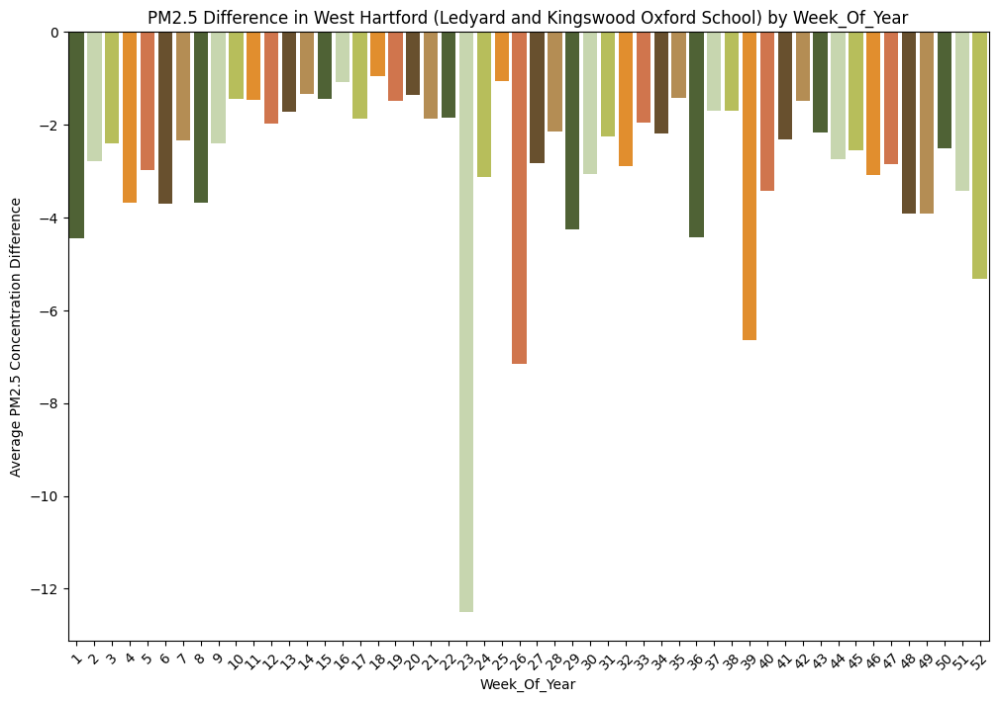

<ipython-input-272-70594a7b8141>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
<ipython-input-272-70594a7b8141>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)


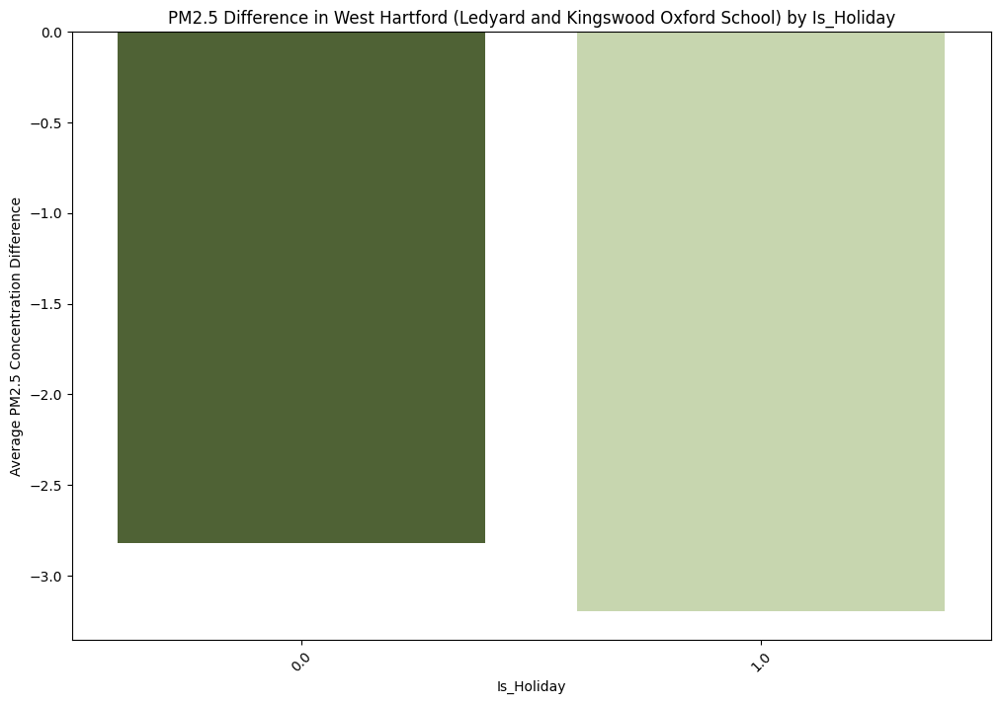

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)', palette=palette)
    plt.title(f'PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

##PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


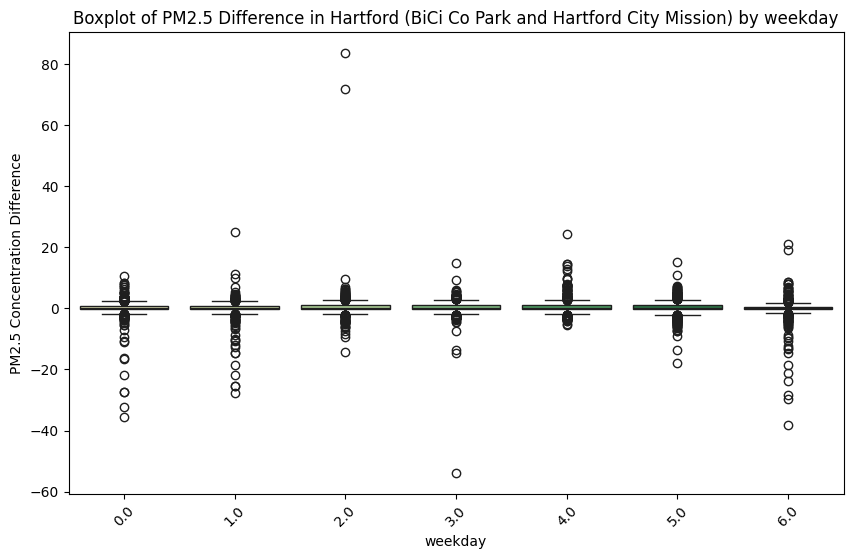

<ipython-input-280-9255e2b5537e>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


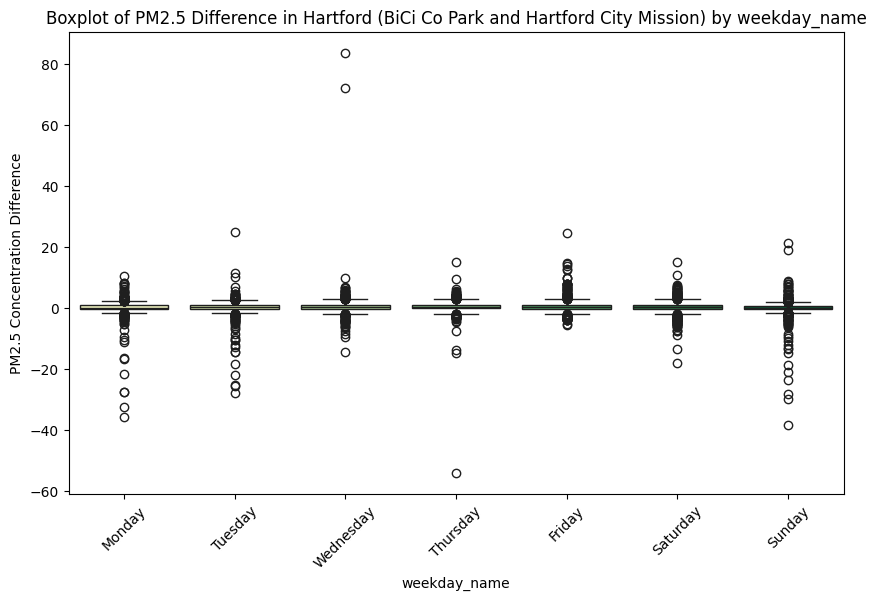

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


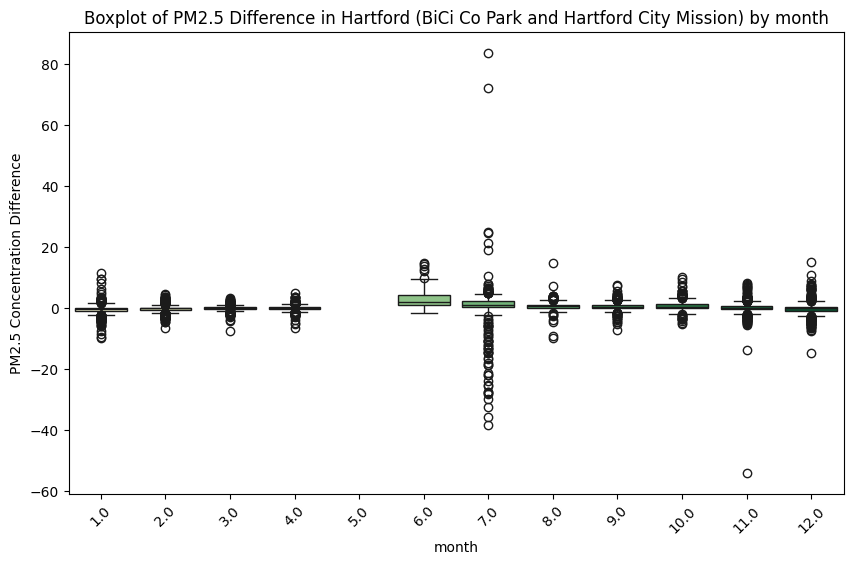

<ipython-input-280-9255e2b5537e>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


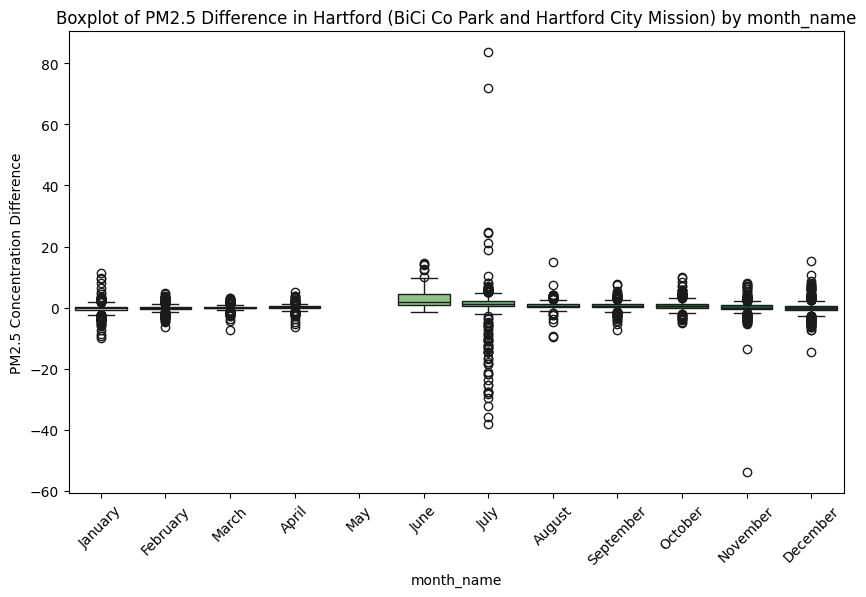

<ipython-input-280-9255e2b5537e>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


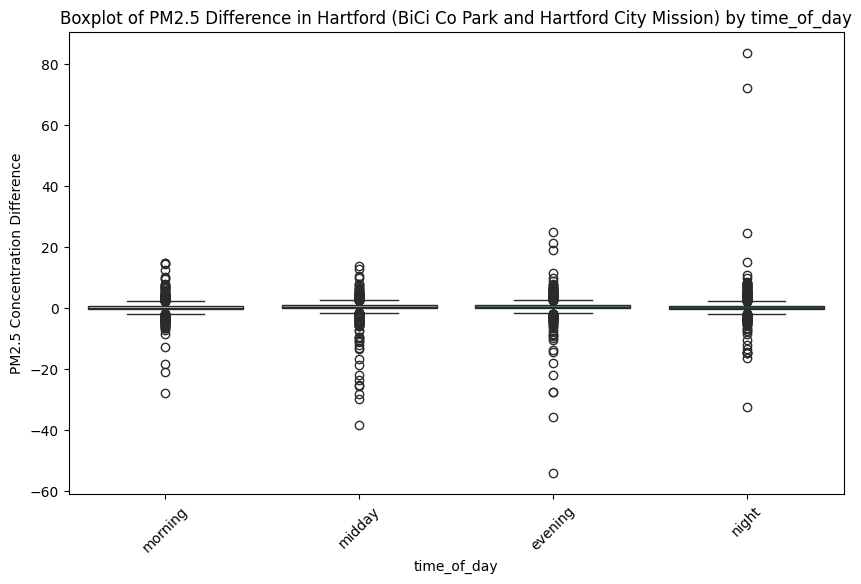

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


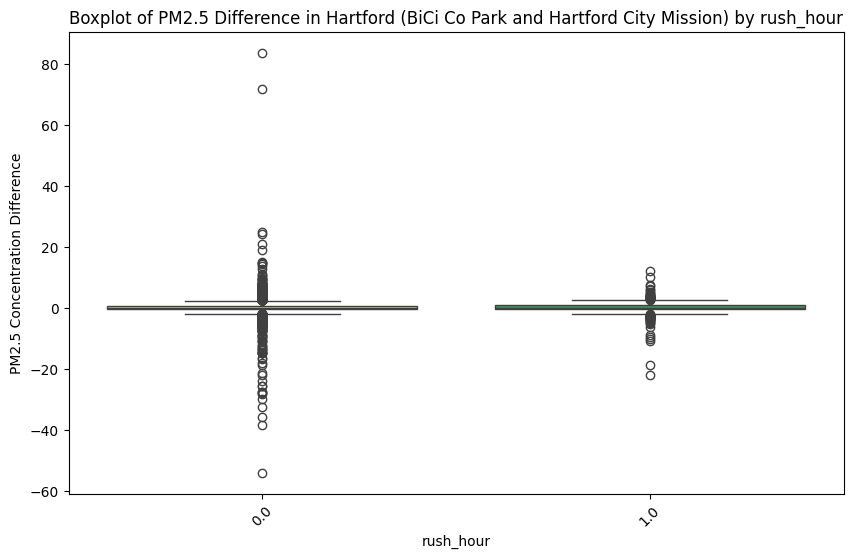

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


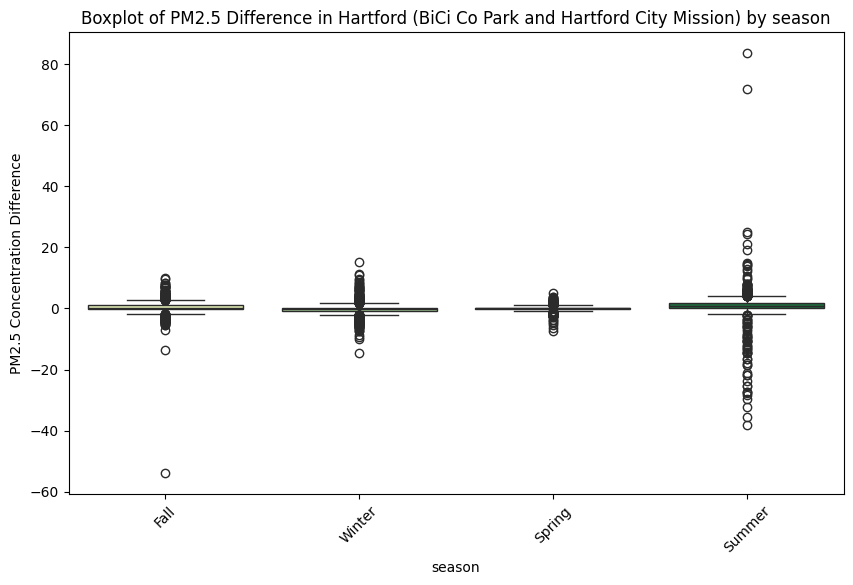

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


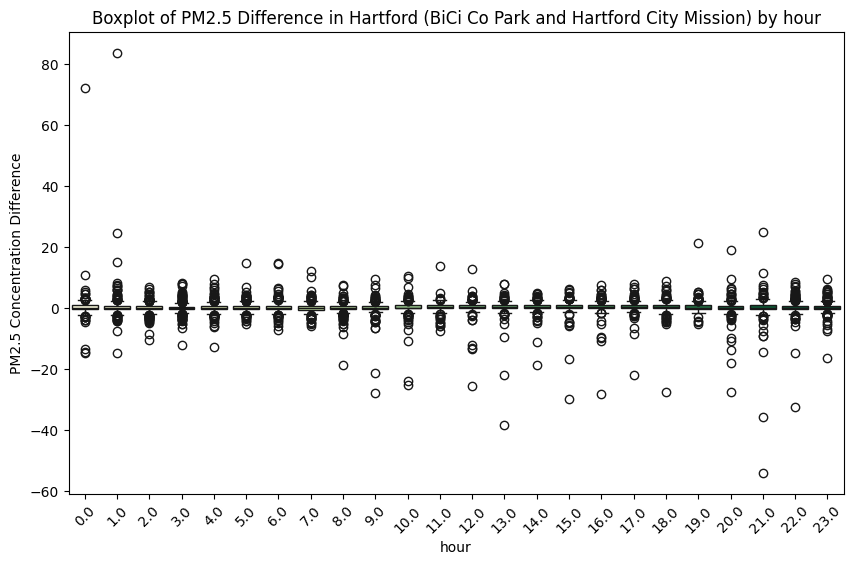

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


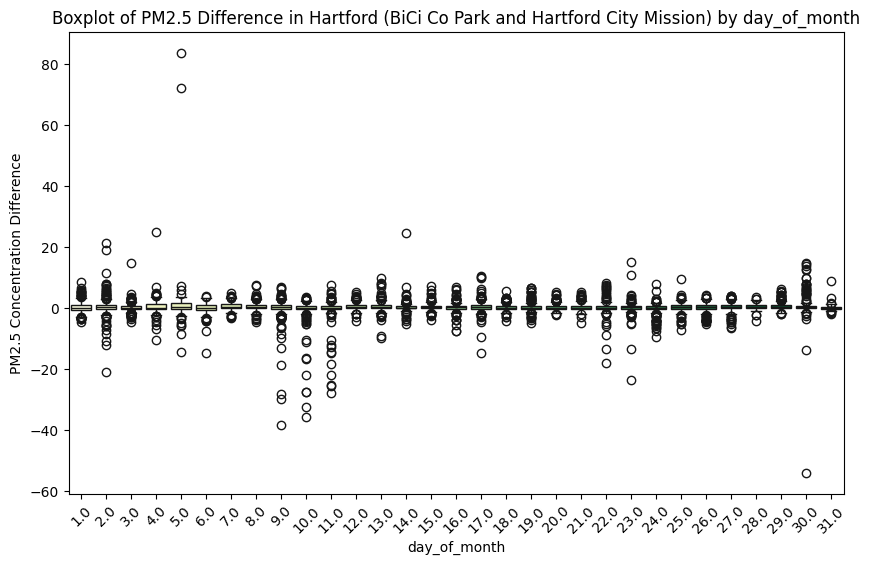

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


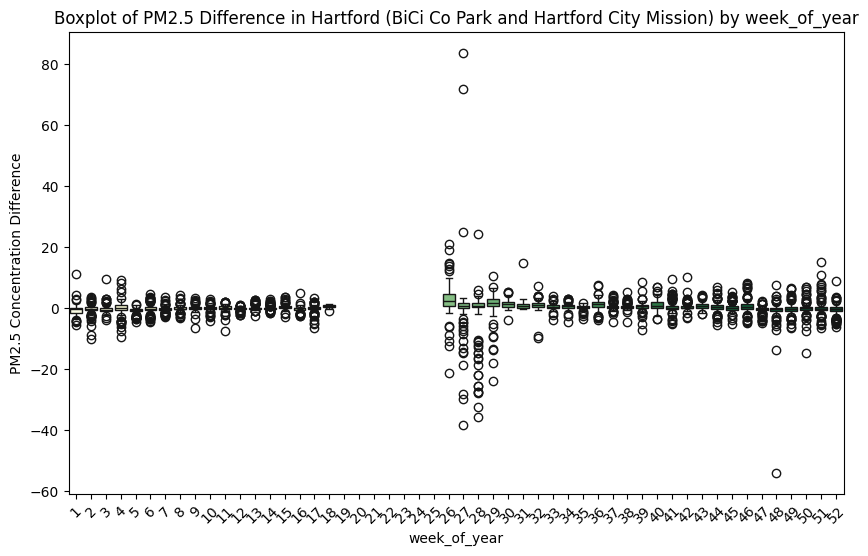

<ipython-input-280-9255e2b5537e>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')


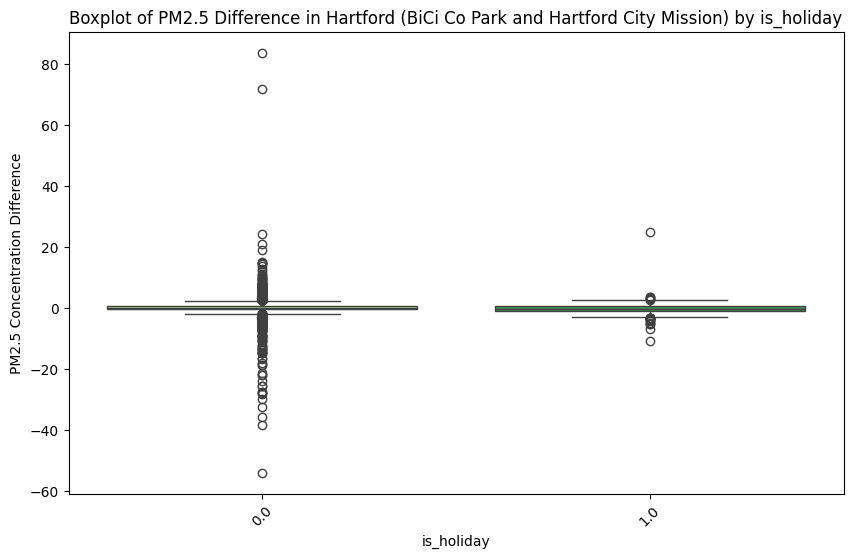

In [ ]:
# Define sorters for categories that need them
sorters = {
    'weekday_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'month_name': ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'],
    'time_of_day': ['morning', 'midday', 'evening', 'night']
}

for col in temp_col:
    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if col in sorters:
        # Apply categorical sorting to ensure the boxplots appear in the correct order
        df_diff[col] = pd.Categorical(df_diff[col], categories=sorters[col], ordered=True)
        sorted_data = df_diff.sort_values(by=col)
    else:
        sorted_data = df_diff

    # Create boxplots
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    sns.boxplot(x=col, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', data=sorted_data, palette='YlGn')
    plt.title(f'Boxplot of PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission) by {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


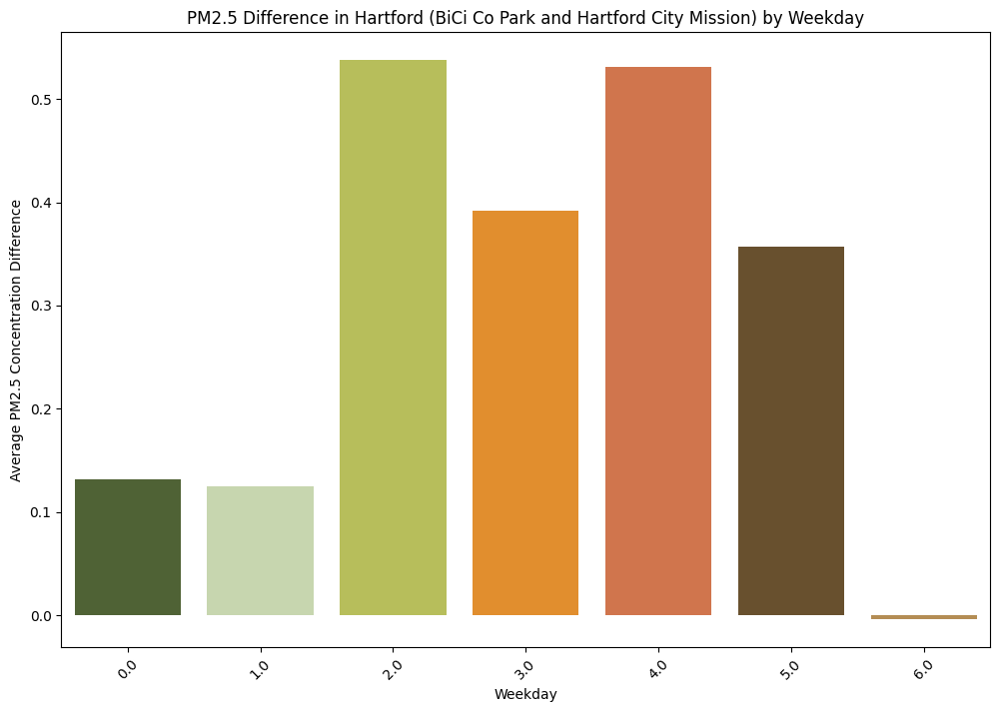

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


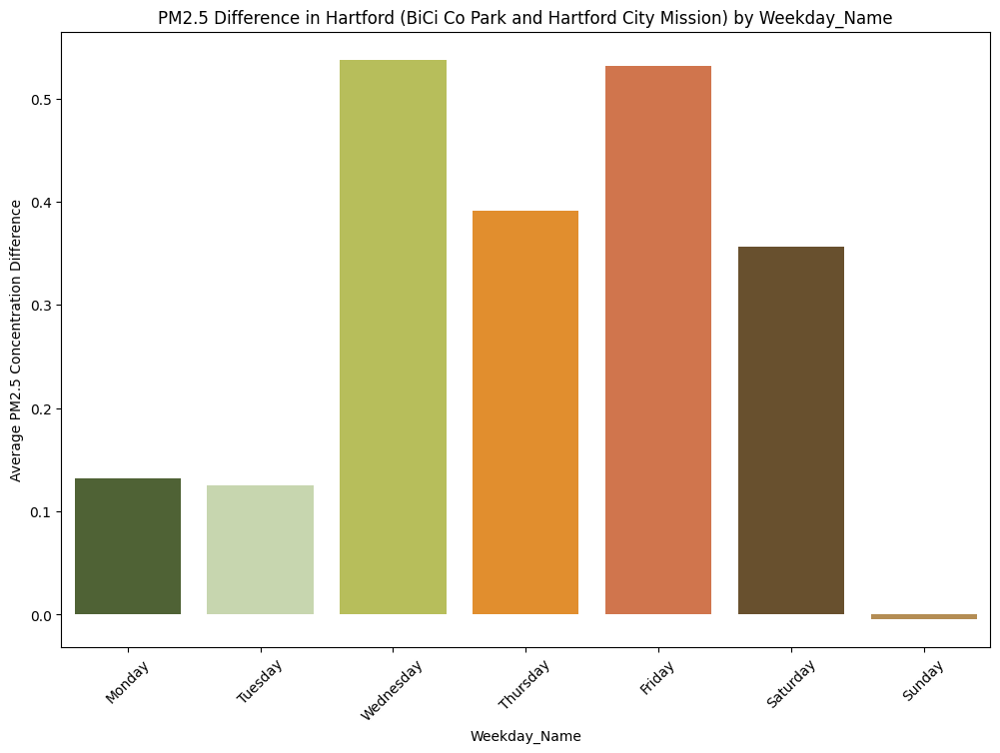

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


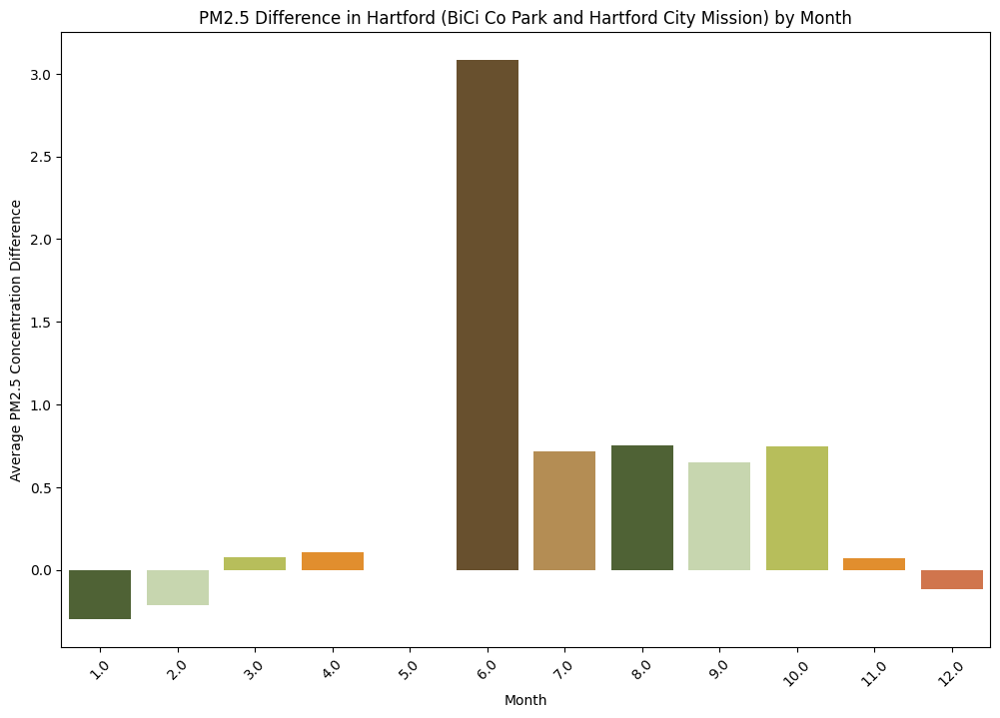

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: 
The palette list has fewer values (7) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


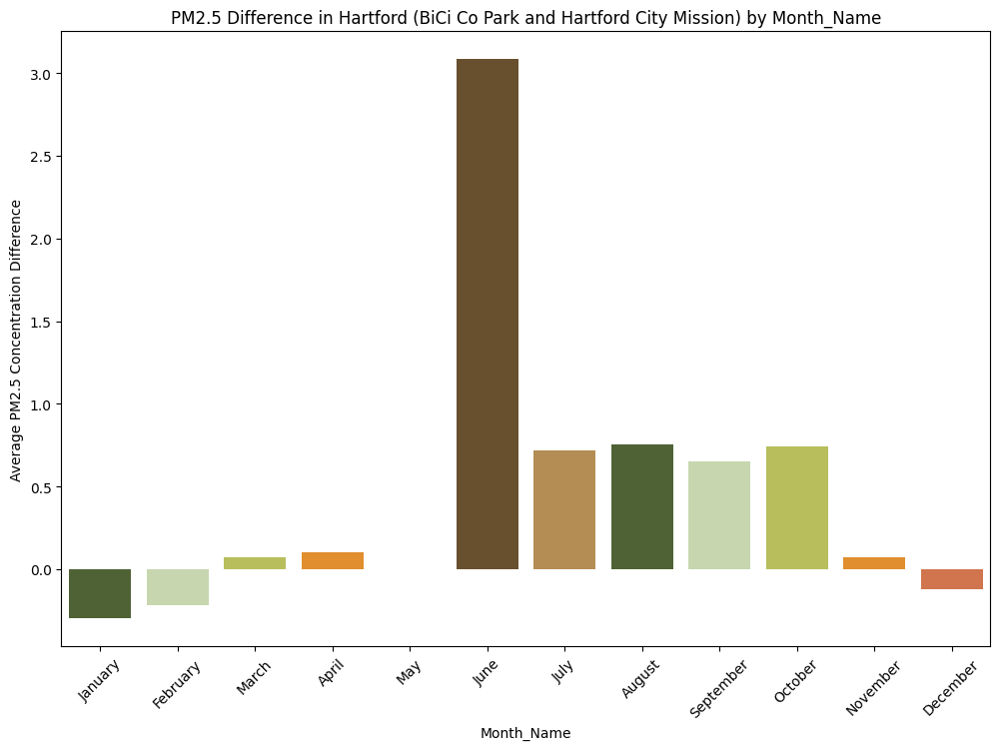

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


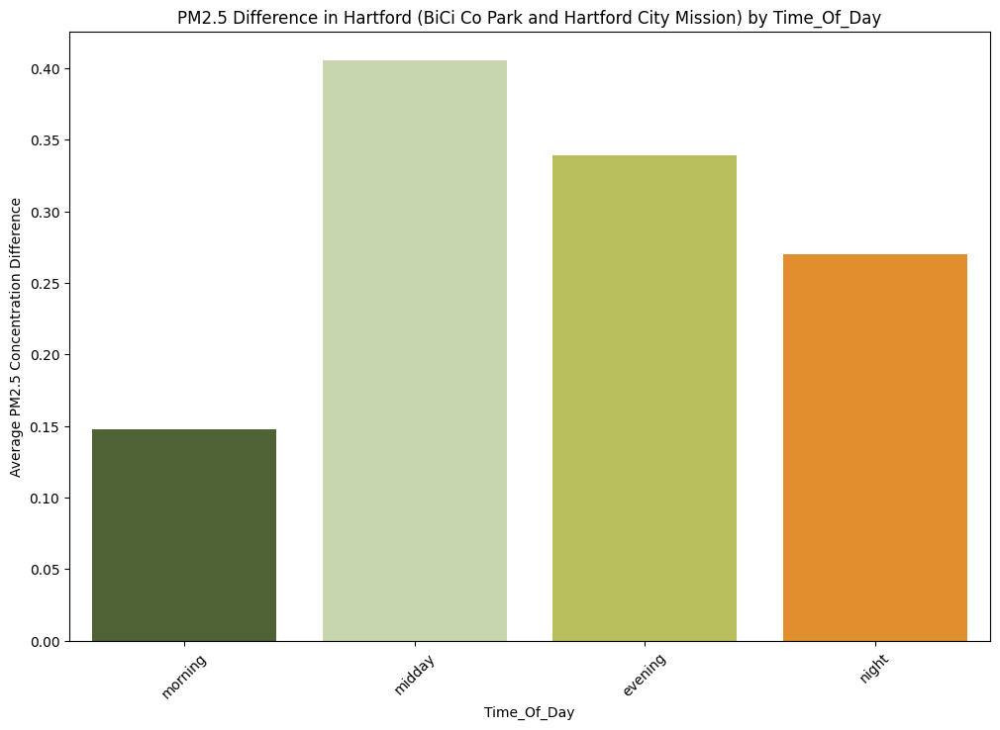

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


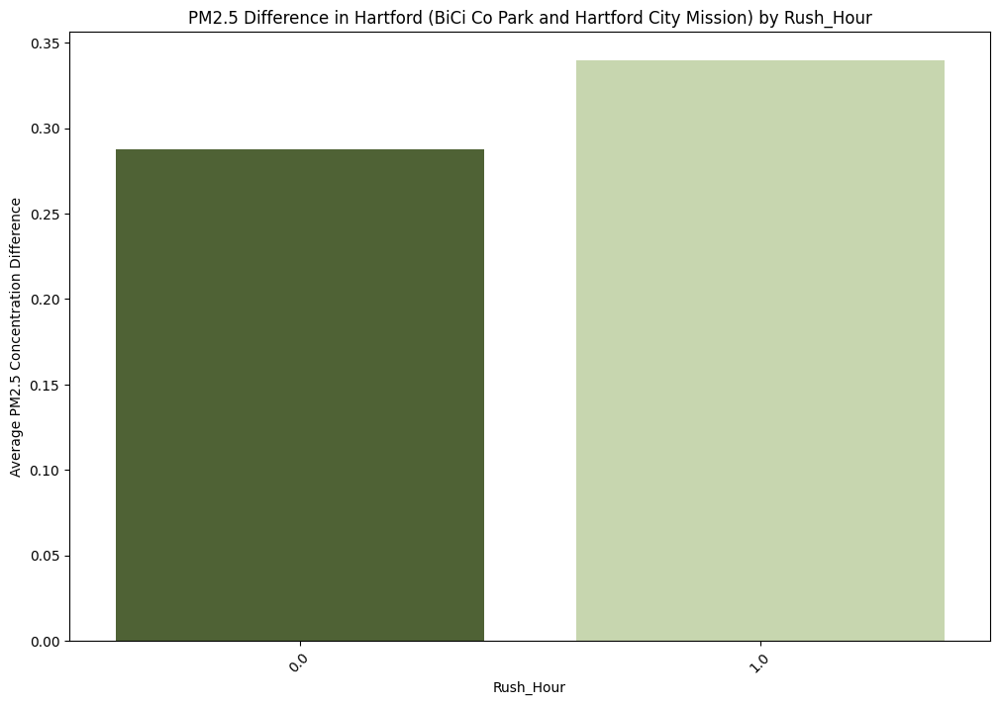

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


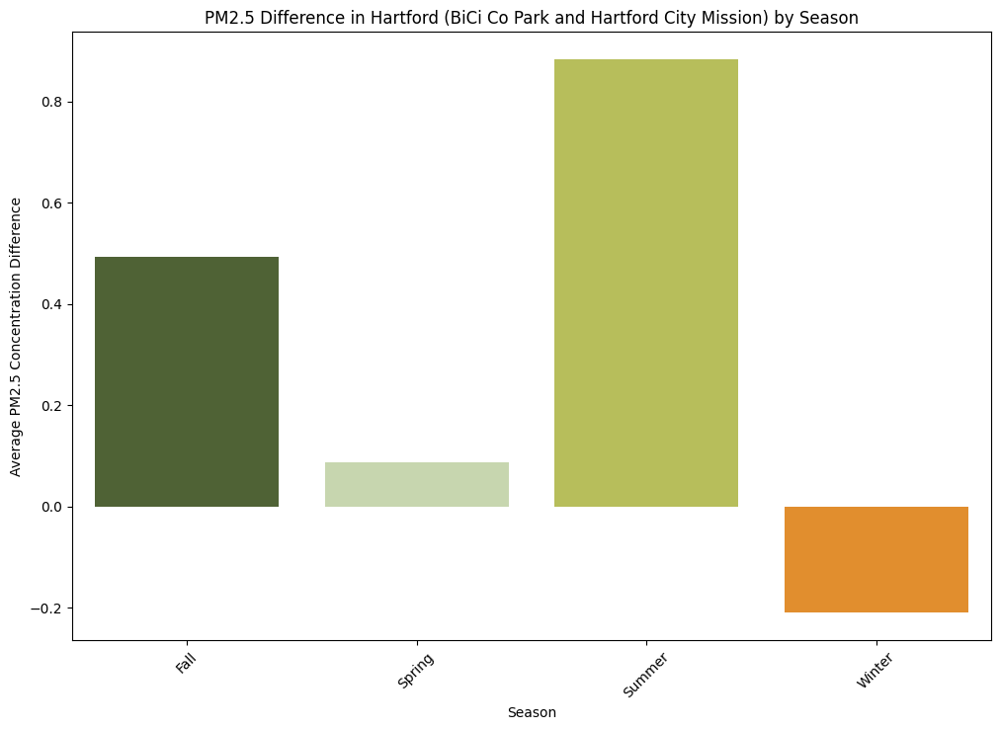

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: 
The palette list has fewer values (7) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


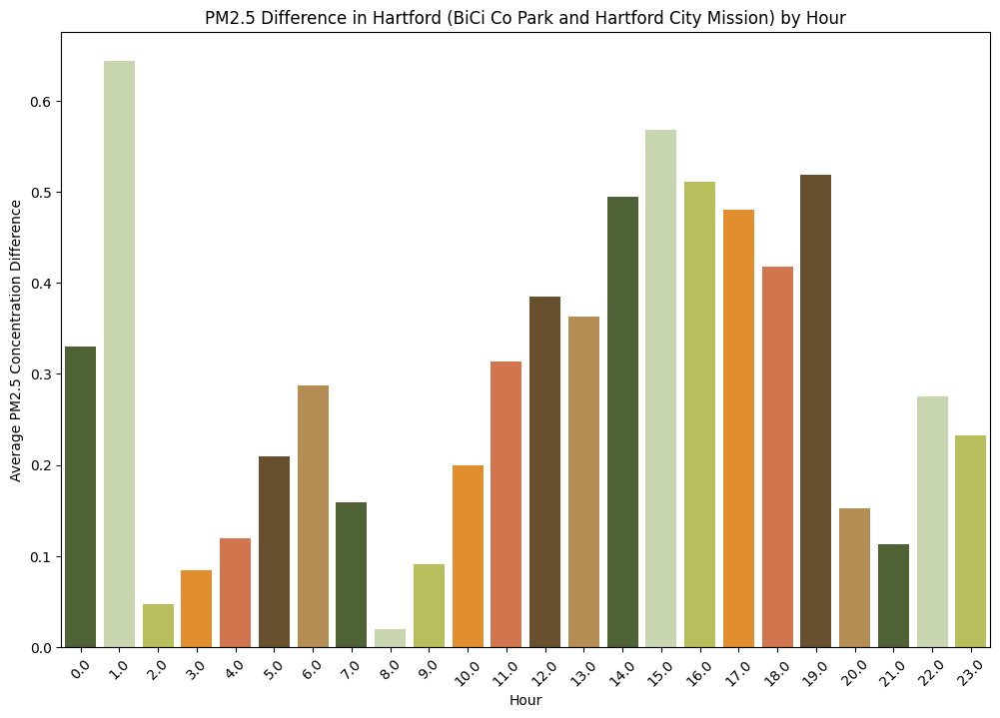

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: 
The palette list has fewer values (7) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


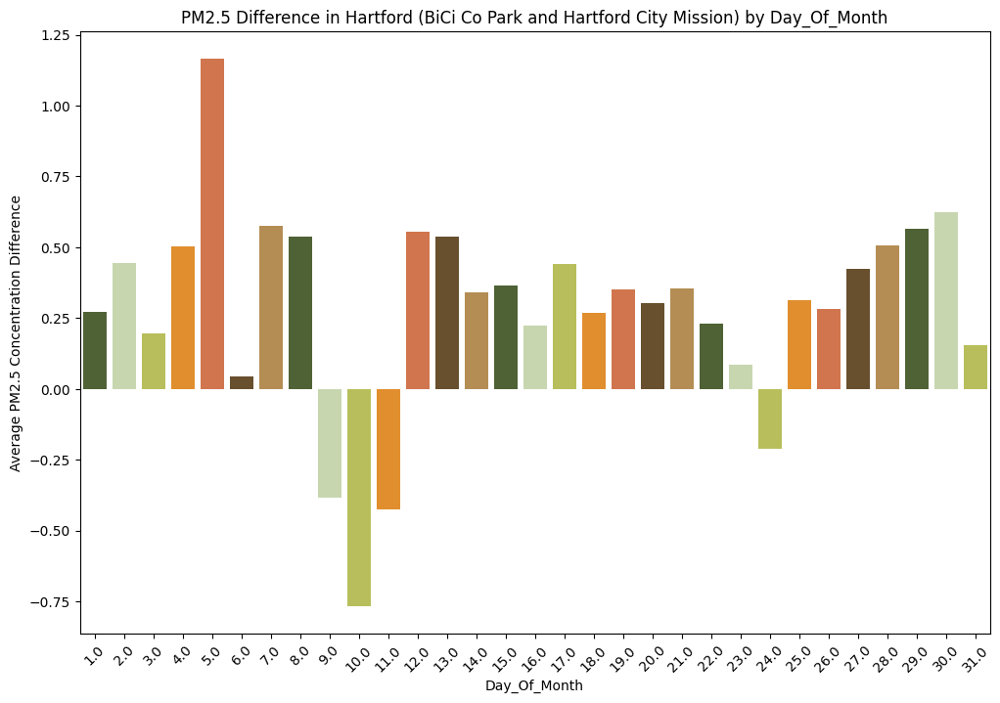

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: 
The palette list has fewer values (7) than needed (52) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


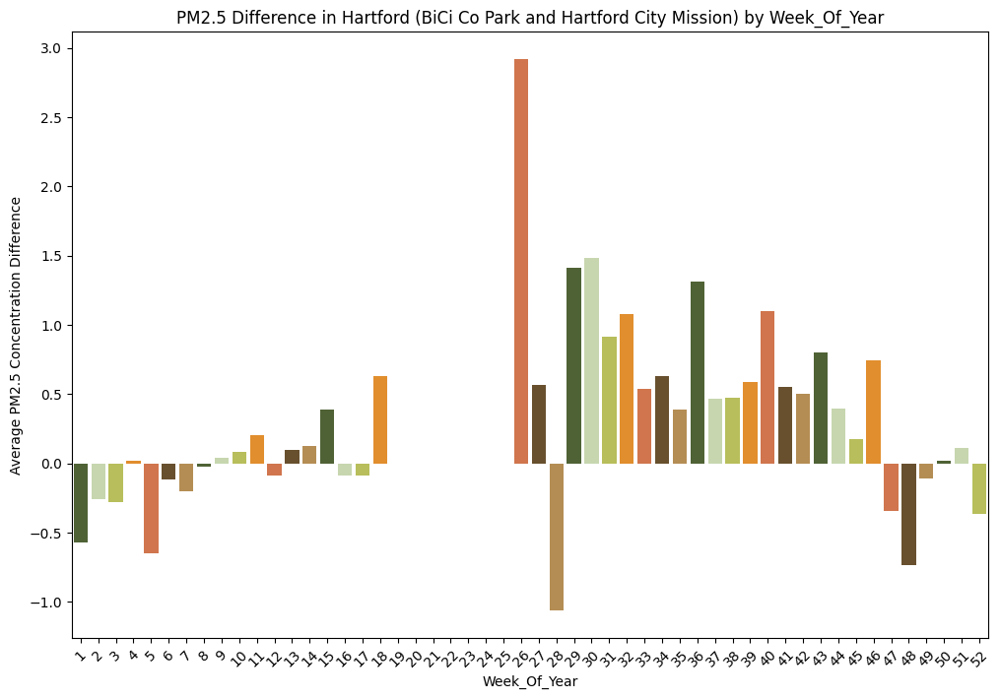

<ipython-input-281-1dd78a54a298>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
<ipython-input-281-1dd78a54a298>:22: UserWarning: The palette list has more values (7) than needed (2), which may not be intended.
  sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)


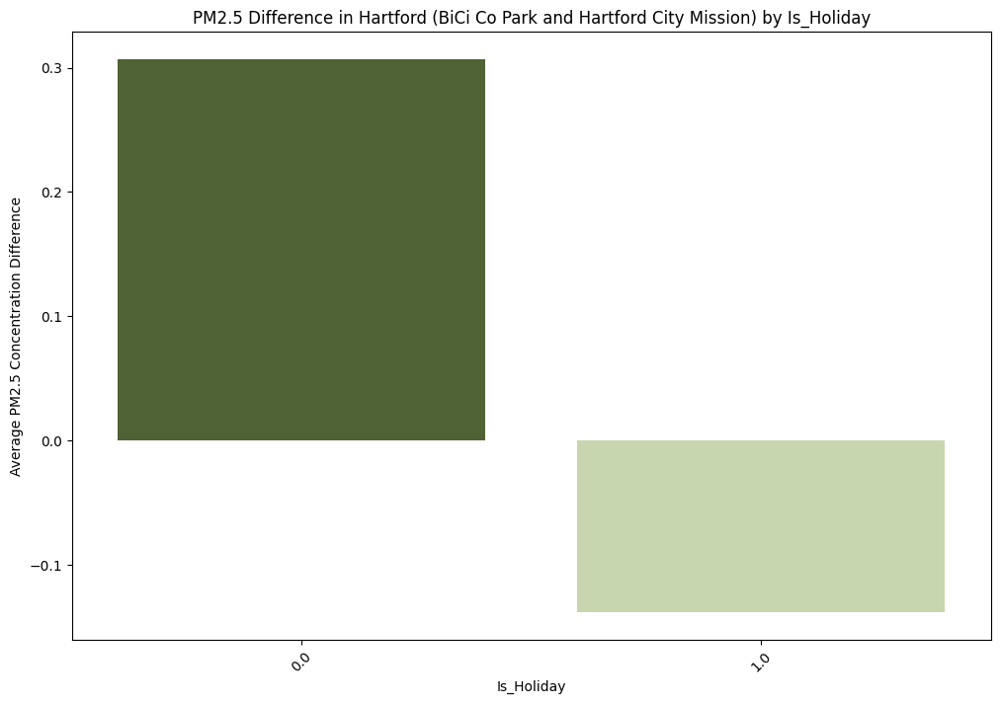

In [ ]:
#Creating Column Charts
for category in temp_col:
    # Aggregate data: calculate the mean PM2.5 concentration for each category
    agg_data = df_diff.groupby(category)['PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)'].mean().reset_index()

    # Sort data if necessary, especially useful for months or weekdays to maintain logical order
    if category == 'month_name':
        sorter = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'weekday_name':
        sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)
    elif category == 'time_of_day':
        sorter = ['morning', 'midday', 'evening', 'night']
        agg_data[category] = pd.Categorical(agg_data[category], categories=sorter, ordered=True)
        agg_data = agg_data.sort_values(by=category)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(data=agg_data, x=category, y='PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)', palette=palette)
    plt.title(f'PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission) by {category.title()}')
    plt.xlabel(f'{category.title()}')
    plt.ylabel('Average PM2.5 Concentration Difference')
    plt.xticks(rotation=45)  # Rotate labels if they overlap
    plt.show()

#Statistical Tests

##Testing for difference Hartford to West Hartford

In [ ]:
df_diff.columns

Index(['time_stamp', 'time_stamp_est', 'weekday', 'weekday_name', 'month',
       'month_name', 'time_of_day', 'rush_hour', 'season', 'hour',
       'day_of_month', 'week_of_year', 'is_holiday',
       'PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)',
       'PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)',
       'PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)'],
      dtype='object')

In [ ]:
#create a list of all columns that take the fidderence between a hartford and west hartford sensor
H_to_WH_diffcol = ['PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)',
       'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)']

In [ ]:
# List to collect each row's result as a dictionary
results_list = []

H_to_WH_diffcol = ['PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard)',
                   'PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School)',
                   'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard)',
                   'PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School)']

# Perform t-tests and collect results
for col in H_to_WH_diffcol:
    data = df_diff[col].dropna()  # Drop NA values
    if not data.empty:
        mean_diff = data.mean()
        t_stat, p_val = ttest_1samp(data, 0)
        significant = 'Yes' if p_val < 0.05 else 'No'

        # Get location names, removing parentheses
        locations = [name.strip() for name in col.split(' and ')]
        higher_location = locations[1].replace(')', '') if mean_diff > 0 else locations[0].replace('(', '')

        results_list.append({
            'Column Tested': col,
            'Average PM2.5 Difference': mean_diff,
            'T-test Statistic': t_stat,
            'P-value': p_val,
            'Significant': significant,
        })

# Convert list of dictionaries to DataFrame
results_df = pd.DataFrame(results_list)

# Display the DataFrame
print(results_df)

                                       Column Tested  \
0  PM2.5 Difference Hartford to West Hartford (Bi...   
1  PM2.5 Difference Hartford to West Hartford (Bi...   
2  PM2.5 Difference Hartford to West Hartford (Ha...   
3  PM2.5 Difference Hartford to West Hartford (Ha...   

   Average PM2.5 Difference  T-test Statistic        P-value Significant  
0                  3.791858         84.310691   0.000000e+00         Yes  
1                  0.959506         31.617792  2.919649e-207         Yes  
2                  3.576725         91.698436   0.000000e+00         Yes  
3                  0.667629         25.551642  3.173462e-139         Yes  


In [ ]:
results_df.to_csv('H_WH_Significance.csv', index=False)

Values above indicative of very significant difference (Hartford being overall much higher than West Hartford)

###Testing Difference by Temporal Columns

In [ ]:
#Redefine Temporal Columns
temporal_col = ['weekday', 'weekday_name', 'month',
       'month_name', 'time_of_day', 'rush_hour', 'season', 'hour',
       'day_of_month', 'week_of_year', 'is_holiday']

In [ ]:
# Create empty list to store results
HWH_results = []

# Create a for loop to iterate through each difference and temporal column of interest
for diff_col in H_to_WH_diffcol:
    for t_col in temporal_col:
        print(f"Processing {diff_col} by {t_col}")  # Debugging statement
        # Group the data by the current temporal category
        if t_col in df_diff.columns:
            grouped = df_diff.groupby(t_col)[diff_col].apply(list).dropna()

            # We need at least two groups to compare
            if len(grouped) > 1:
                # Perform pairwise t-tests between all groups
                for i, (cat1, data1) in enumerate(grouped.items()):
                    for j, (cat2, data2) in enumerate(grouped.items()):
                        if i < j:
                            # Perform t-test between two categories
                            t_stat, p_val = ttest_ind(data1, data2, nan_policy='omit', equal_var=False)
                            significant = p_val < 0.05
                            higher = cat1 if pd.Series(data1).mean() > pd.Series(data2).mean() else cat2
                            HWH_results.append({
                                'Difference Column': diff_col,
                                'Temporal Category': t_col,
                                'Comparison': f'{cat1} vs {cat2}',
                                'T-Statistic': t_stat,
                                'P-Value': p_val,
                                'Significant': 'Yes' if significant else 'No',
                                'Higher PM2.5': higher if significant else 'N/A'
                            })
        else:
            print(f"Column {t_col} does not exist in DataFrame.")

# Convert results to DataFrame for better visualization
HWH_results_df = pd.DataFrame(HWH_results)
print(HWH_results_df)

Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by weekday
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by weekday_name
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by month
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by month_name
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by time_of_day
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by rush_hour
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by season
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by hour
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by day_of_month
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) by week_of_year
Processing PM2.5 Difference Hartford to West Hartford (BiCi Co

In [ ]:
# Dataframe indicating significant difference or not in comparison by all temporal columns
HWH_results_df

,Difference Column,Temporal Category,Comparison,T-Statistic,P-Value,Significant,Higher PM2.5
0,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0 vs 1.0,-1.510049,1.311768e-01,No,N/A
1,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0 vs 2.0,-4.069039,4.908764e-05,Yes,2.0
2,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0 vs 3.0,-5.832038,6.236544e-09,Yes,3.0
3,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0 vs 4.0,-7.300444,4.053100e-13,Yes,4.0
4,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0 vs 5.0,-7.551868,6.343795e-14,Yes,5.0
...,...,...,...,...,...,...,...
9015,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,49 vs 52,-1.058891,2.904336e-01,No,N/A
9016,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,50 vs 51,-0.075336,9.399737e-01,No,N/A
9017,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,50 vs 52,-2.451673,1.451361e-02,Yes,52
9018,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,51 vs 52,-2.099595,3.613816e-02,Yes,52


In [ ]:
#This looks similar to the above, but instead tests if theres a difference based on Temporal column value (e.g. significant differences on Tuesday or in Summer):
# Create empty list to store results
categorical_results = []

# Loop through each difference and temporal column
for diff_col in H_to_WH_diffcol:
    for t_col in temporal_col:
        print(f"Analyzing {diff_col} for each {t_col}")  # Debugging statement
        # Group the data by the current temporal category
        grouped = df_diff.groupby(t_col)[diff_col].apply(list).dropna()

        # Overall mean for comparison
        overall_mean = df_diff[diff_col].mean()

        # Test each group against the overall mean
        for category, values in grouped.items():
            t_stat, p_val = ttest_1samp(values, overall_mean, nan_policy='omit')
            significant = p_val < 0.05
            difference_direction = "higher" if pd.Series(values).mean() > overall_mean else "lower"
            categorical_results.append({
                'Difference Column': diff_col,
                'Temporal Category': t_col,
                'Category': category,
                'T-Statistic': t_stat,
                'P-Value': p_val,
                'Significant': 'Yes' if significant else 'No',
                'Mean Difference': 'Higher' if difference_direction == "higher" else 'Lower'
            })

# Convert results to DataFrame for better visualization
HWH_temporaldiff_results_df = pd.DataFrame(categorical_results)
print(HWH_temporaldiff_results_df)

Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each weekday
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each weekday_name
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each month
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each month_name
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each time_of_day
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each rush_hour
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each season
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each hour
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each day_of_month
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each week_of_year


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co Park and Ledyard) for each is_holiday
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each weekday
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each weekday_name
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each month
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each month_name
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each time_of_day
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each rush_hour
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each season
Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each hour
Analyzing PM2.5 Difference H

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Analyzing PM2.5 Difference Hartford to West Hartford (BiCi Co and Kingswood Oxford School) for each is_holiday
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each weekday
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each weekday_name
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each month
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each month_name
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each time_of_day
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each rush_hour
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each season
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each hour
Analyzing PM2.5 Difference Hartfo

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Ledyard) for each is_holiday
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each weekday
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each weekday_name
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each month
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each month_name
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each time_of_day
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each rush_hour
Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each season
Analyzing PM2.5 Difference

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Analyzing PM2.5 Difference Hartford to West Hartford (Hartford City Mission and Kingswood Oxford School) for each is_holiday
                                     Difference Column Temporal Category  \
0    PM2.5 Difference Hartford to West Hartford (Bi...           weekday   
1    PM2.5 Difference Hartford to West Hartford (Bi...           weekday   
2    PM2.5 Difference Hartford to West Hartford (Bi...           weekday   
3    PM2.5 Difference Hartford to West Hartford (Bi...           weekday   
4    PM2.5 Difference Hartford to West Hartford (Bi...           weekday   
..                                                 ...               ...   
623  PM2.5 Difference Hartford to West Hartford (Ha...      week_of_year   
624  PM2.5 Difference Hartford to West Hartford (Ha...      week_of_year   
625  PM2.5 Difference Hartford to West Hartford (Ha...      week_of_year   
626  PM2.5 Difference Hartford to West Hartford (Ha...        is_holiday   
627  PM2.5 Difference Hartford to West 

In [ ]:
#print
HWH_temporaldiff_results_df

,Difference Column,Temporal Category,Category,T-Statistic,P-Value,Significant,Mean Difference
0,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,0.0,-6.649701,4.417488e-11,Yes,Lower
1,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,1.0,-2.835897,4.646337e-03,Yes,Lower
2,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,2.0,0.784810,4.327203e-01,No,Higher
3,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,3.0,1.897477,5.801378e-02,No,Higher
4,PM2.5 Difference Hartford to West Hartford (Bi...,weekday,4.0,4.270572,2.108436e-05,Yes,Higher
...,...,...,...,...,...,...,...
623,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,50,-2.456099,1.472367e-02,Yes,Lower
624,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,51,-1.763875,7.866446e-02,No,Lower
625,PM2.5 Difference Hartford to West Hartford (Ha...,week_of_year,52,1.199152,2.313163e-01,No,Higher
626,PM2.5 Difference Hartford to West Hartford (Ha...,is_holiday,0.0,-0.068145,9.456718e-01,No,Lower


In [ ]:
#save file as csv
HWH_temporaldiff_results_df.to_csv('HWH_ColumnDifference_Significance.csv', index=False)

##Testing for difference West Hartford to West Hartford

In [ ]:
#Create a new data frame with no null values so we don't run into an error
sample_data_WH = df_diff['PM2.5 Difference in West Hartford (Ledyard and Kingswood Oxford School)'].dropna()

# Perform t-test against the hypothesized mean (e.g., 0 if testing for no difference)
t_stat, p_value = stats.ttest_1samp(sample_data_WH, popmean=0)

print("T-statistic:", t_stat)
print("P-value:", p_value)

# Interpretation of results
if p_value < 0.05:
    print("There is a significant difference in PM2.5 levels.")
else:
    print("There is no significant difference in PM2.5 levels.")

T-statistic: -87.66410367584841
P-value: 0.0
There is a significant difference in PM2.5 levels.


##Testing for Difference Hartford to Hartford

In [ ]:
#Create a new data frame with no null values so we don't run into an error
sample_data_WH = df_diff['PM2.5 Difference in Hartford (BiCi Co Park and Hartford City Mission)'].dropna()

# Perform t-test against the hypothesized mean (e.g., 0 if testing for no difference)
t_stat, p_value = stats.ttest_1samp(sample_data_WH, popmean=0)

print("T-statistic:", t_stat)
print("P-value:", p_value)

# Interpretation of results
if p_value < 0.05:
    print("There is a significant difference in PM2.5 levels.")
else:
    print("There is no significant difference in PM2.5 levels.")

T-statistic: 9.313078994440216
P-value: 1.6205635175686573e-20
There is a significant difference in PM2.5 levels.
